In [31]:
pip install numpy

Note: you may need to restart the kernel to use updated packages.


In [32]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [33]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [34]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [35]:
pip install pyodbc


Note: you may need to restart the kernel to use updated packages.


In [36]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib. pyplot as plt
import matplotlib
import pyodbc
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib. dates as mandates
from sklearn import linear_model

from keras. layers import LSTM, Dense, Dropout
from keras. models import Sequential
from keras. layers import Dense
import keras. backend as K
from keras. callbacks import EarlyStopping
from keras. models import load_model
from keras. layers import LSTM
from keras. utils.vis_utils import plot_model
from keras.optimizers import Adam


In [37]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [38]:
pip install Keras


Note: you may need to restart the kernel to use updated packages.


In [39]:
#get the view table from SQL
# Define the connection details
server = 'stocksserver.database.windows.net' 
database = 'stockdb' 
username = 'Evelyn'
password = 'Apple2327'

# Establish the connection
conn = pyodbc.connect('DRIVER={SQL Server};SERVER='+server+';DATABASE='+database+';UID='+username+';PWD='+ password)
query_price = "SELECT * FROM Daily_Price;"
# Execute the query and create a DataFrame
clean_df = pd.read_sql(query_price, conn)

conn.close()

C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\1807865550.py:12: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  clean_df = pd.read_sql(query_price, conn)


In [40]:
clean_df

,Ticker,Date,Open_Price,High_Price,Low_Price,Close_Price,Volume
0,AAL,2005-10-07,20.90,23.00,20.90,22.15,16350134
1,AAL,2005-10-14,22.28,22.40,21.40,22.27,9746113
2,AAL,2005-10-21,22.15,22.42,20.85,21.96,14218231
3,AAL,2005-10-28,22.01,23.90,21.70,23.90,9263807
4,AAL,2005-11-04,24.00,29.00,24.00,28.80,16788473
...,...,...,...,...,...,...,...
45681,XOM,2024-01-12,100.73,101.29,98.16,99.95,94947905
45682,XOM,2024-01-19,99.82,100.01,95.82,96.95,79648421
45683,XOM,2024-01-26,96.70,103.08,95.77,103.00,95840552
45684,XOM,2024-02-02,102.98,104.88,101.61,101.97,101557866


In [41]:
#check null values
print('Dataframe Shape: ', clean_df. shape)

missing_values = clean_df.isna().any().any()
missing_values 

Dataframe Shape:  (45686, 7)


False

In [42]:
selected_tickers = ['AAPL', 'ADBE', 'COST', 'JPM', 'NVDA']
selected_df = clean_df[clean_df['Ticker'].isin(selected_tickers)]

symbols_list = sorted(selected_df['Ticker'].unique())
symbols_list

['AAPL', 'ADBE', 'COST', 'JPM', 'NVDA']

In [43]:
#adjust datetime
import datetime

def str_to_datetime(s):
    split =s.split('-')
    year,month,day=int(split[0]),int(split[1]),int(split[2])

    return datetime.datetime(year=year,month=month,day=day)


In [44]:
# Filter DataFrame for the desired symbol
AAPL_df = clean_df[clean_df['Ticker'] == 'AAPL']
AAPL_df

,Ticker,Date,Open_Price,High_Price,Low_Price,Close_Price,Volume
957,AAPL,1999-11-12,87.75,97.73,86.75,90.62,25776200
958,AAPL,1999-11-19,89.62,94.75,88.06,92.44,13711000
959,AAPL,1999-11-26,91.75,95.50,88.50,95.06,9757600
960,AAPL,1999-12-03,94.25,115.56,93.25,115.00,28046300
961,AAPL,1999-12-10,114.56,118.00,99.00,103.00,25152800
...,...,...,...,...,...,...,...
2217,AAPL,2024-01-05,187.15,188.44,180.17,181.18,275083628
2218,AAPL,2024-01-12,182.09,187.05,181.50,185.92,238385377
2219,AAPL,2024-01-19,182.16,191.95,180.30,191.56,259829213
2220,AAPL,2024-01-26,192.30,196.38,191.94,192.42,255368848


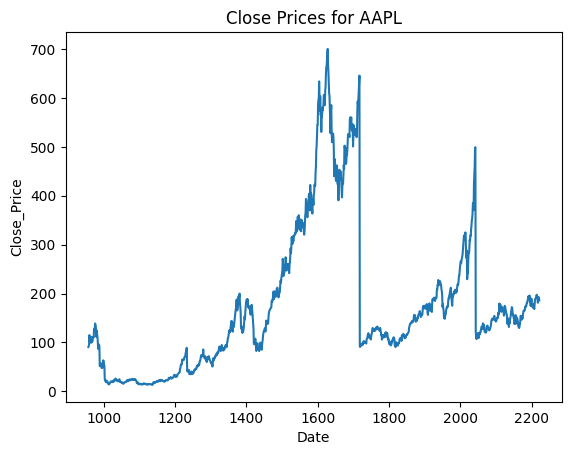

In [45]:

# Plot closing prices
AAPL_df['Close_Price'].plot()
# # Add labels and title
plt.xlabel('Date')
plt.ylabel('Close_Price')
plt.title('Close Prices for AAPL')
# Show plot
plt.show()

In [46]:
#Set Target Variable
AAPL_output = AAPL_df['Close_Price']
#Selecting the Features 
features = ['Open_Price','High_Price','Low_Price','Volume']

#Scaling
scaler = MinMaxScaler()
feature_transform = scaler.fit_transform(AAPL_df[features])
feature_transform= pd.DataFrame(columns=features, data=feature_transform, index=AAPL_df.index)
feature_transform.head()

,Open_Price,High_Price,Low_Price,Volume
957,0.108741,0.121630,0.108724,0.017455
958,0.111466,0.117320,0.110648,0.007061
959,0.114570,0.118405,0.111294,0.003655
960,0.118213,0.147417,0.118270,0.019410
961,0.147810,0.150946,0.126715,0.016918


In [47]:
 
#Splitting to Training set and Test set
timesplit= TimeSeriesSplit(n_splits=10)
for train_index, test_index in timesplit.split(feature_transform):
        X_train, X_test = feature_transform[:len(train_index)], feature_transform[len(train_index): (len(train_index)+len(test_index))]
        y_train, y_test = AAPL_output[:len(train_index)].values.ravel(), AAPL_output[len(train_index): (len(train_index)+len(test_index))].values.ravel()

In [48]:
#Process the data for LSTM
trainX =np.array(X_train)
testX =np.array(X_test)
X_train = trainX.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = testX.reshape(X_test.shape[0], 1, X_test.shape[1])

In [49]:
#Building the LSTM Model
lstm = Sequential()
lstm.add(LSTM(32, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=False))
lstm.add(Dense(1))
lstm.compile(loss='mean_squared_error', optimizer='adam')


In [50]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


In [51]:
pip install graphviz 

Note: you may need to restart the kernel to use updated packages.


In [52]:
pip install pydot-ng

Note: you may need to restart the kernel to use updated packages.


In [53]:
plot_model(lstm, show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [54]:
history=lstm.fit(X_train, y_train, epochs=100, batch_size=8, verbose=1, shuffle=False)

Epoch 1/100
144/144 [==============================] - 1s 2ms/step - loss: 54609.1406
Epoch 2/100
144/144 [==============================] - 0s 1ms/step - loss: 54303.7891
Epoch 3/100
144/144 [==============================] - 0s 2ms/step - loss: 53696.3750
Epoch 4/100
144/144 [==============================] - 0s 2ms/step - loss: 52658.3086
Epoch 5/100
144/144 [==============================] - 0s 1ms/step - loss: 51148.2891
Epoch 6/100
144/144 [==============================] - 0s 2ms/step - loss: 49207.1484
Epoch 7/100
144/144 [==============================] - 0s 1ms/step - loss: 46922.8086
Epoch 8/100
144/144 [==============================] - 0s 2ms/step - loss: 44395.1133
Epoch 9/100
144/144 [==============================] - 0s 1ms/step - loss: 41716.9844
Epoch 10/100
144/144 [==============================] - 0s 1ms/step - loss: 38967.8242
Epoch 11/100
144/144 [==============================] - 0s 1ms/step - loss: 36213.0625
Epoch 12/100
144/144 [==============================

In [55]:
#LSTM Prediction
y_pred= lstm.predict(X_test)

4/4 [==============================] - 0s 1ms/step


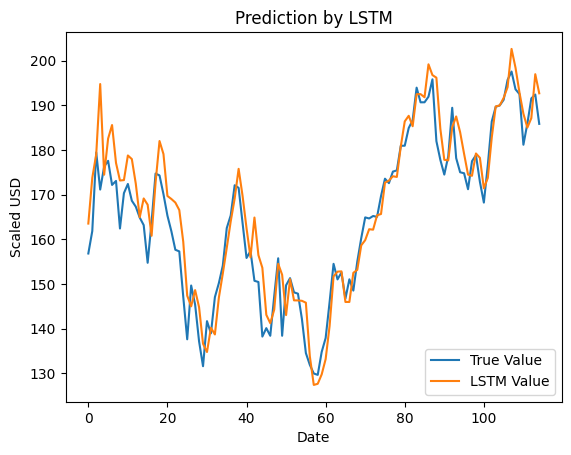

In [56]:
#Predicted vs True Adj Close Value – LSTM
plt.plot(y_test, label='True Value')
plt.plot(y_pred, label='LSTM Value')
plt.title('Prediction by LSTM')
plt.xlabel('Date')
plt.ylabel('Scaled USD')
plt.legend()
plt.show()

In [57]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1. Performance Evaluation
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) Score:", r2)

Mean Absolute Error (MAE): 4.7088666196076785
Mean Squared Error (MSE): 38.58266282338588
Root Mean Squared Error (RMSE): 6.21149441144286
R-squared (R2) Score: 0.8781528391510659


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [58]:
clean_df

,Ticker,Date,Open_Price,High_Price,Low_Price,Close_Price,Volume
0,AAL,2005-10-07,20.90,23.00,20.90,22.15,16350134
1,AAL,2005-10-14,22.28,22.40,21.40,22.27,9746113
2,AAL,2005-10-21,22.15,22.42,20.85,21.96,14218231
3,AAL,2005-10-28,22.01,23.90,21.70,23.90,9263807
4,AAL,2005-11-04,24.00,29.00,24.00,28.80,16788473
...,...,...,...,...,...,...,...
45681,XOM,2024-01-12,100.73,101.29,98.16,99.95,94947905
45682,XOM,2024-01-19,99.82,100.01,95.82,96.95,79648421
45683,XOM,2024-01-26,96.70,103.08,95.77,103.00,95840552
45684,XOM,2024-02-02,102.98,104.88,101.61,101.97,101557866


In [59]:
# import numpy as np
# import pandas as pd
# import tensorflow as tf
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import LSTM, Dense
# from sklearn.preprocessing import MinMaxScaler
# from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# from keras. layers import LSTM, Dense, Dropout
# from keras. models import Sequential
# from keras. layers import Dense
# import keras. backend as K
# from keras. callbacks import EarlyStopping
# from keras. models import load_model
# from keras. layers import LSTM
# from keras. utils.vis_utils import plot_model
# from keras.optimizers import Adam




# for symbol in symbols_list:
# # Filter data for the specific symbol
#     symbol_df = clean_df[clean_df['Ticker'] == symbol]
#     #Set Target Variable
#     symbol_output = symbol_df['Close_Price']
#     features = ['Open_Price','High_Price','Low_Price','Volume']
#     #Scaling
#     scaler = MinMaxScaler()
#     feature_transform = scaler.fit_transform(symbol_df[features])
#     feature_transform= pd.DataFrame(columns=features, data=feature_transform, index=symbol_df.index)
#     feature_transform.head()

     
#     #Splitting to Training set and Test set
#     timesplit= TimeSeriesSplit(n_splits=8)
#     for train_index, test_index in timesplit.split(feature_transform):
#             X_train, X_test = feature_transform[:len(train_index)], feature_transform[len(train_index): (len(train_index)+len(test_index))]
#             y_train, y_test = symbol_output[:len(train_index)].values.ravel(), symbol_output[len(train_index): (len(train_index)+len(test_index))].values.ravel()

#     #Process the data for LSTM
#     trainX =np.array(X_train)
#     testX =np.array(X_test)
#     X_train = trainX.reshape(X_train.shape[0], 1, X_train.shape[1])
#     X_test = testX.reshape(X_test.shape[0], 1, X_test.shape[1])

#     #Building the LSTM Model
#     lstm = Sequential()
#     lstm.add(LSTM(32, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=False))
#     lstm.add(Dense(1))
#     lstm.compile(loss='mean_squared_error', optimizer='adam')
#     plot_model(lstm, show_shapes=True, show_layer_names=True)

#     history=lstm.fit(X_train, y_train, epochs=100, batch_size=8, verbose=1, shuffle=False)

#         #Predicted vs True Adj Close Value – LSTM
    
#     plt.plot(y_test, label='True Value')
#     plt.plot(y_pred, label='LSTM Value')
#     plt.title(f'Prediction by LSTM for {symbol}')
#     plt.xlabel('Date')
#     plt.ylabel('Scaled USD')
#     plt.legend()
#     plt.show()

#     # 1. Performance Evaluation
#     mae = mean_absolute_error(y_test, y_pred)
#     mse = mean_squared_error(y_test, y_pred)
#     rmse = mean_squared_error(y_test, y_pred, squared=False)
#     r2 = r2_score(y_test, y_pred)

#     print("Mean Absolute Error (MAE):", mae)
#     print("Mean Squared Error (MSE):", mse)
#     print("Root Mean Squared Error (RMSE):", rmse)
#     print("R-squared (R2) Score:", r2)
    



ADBE LSTM

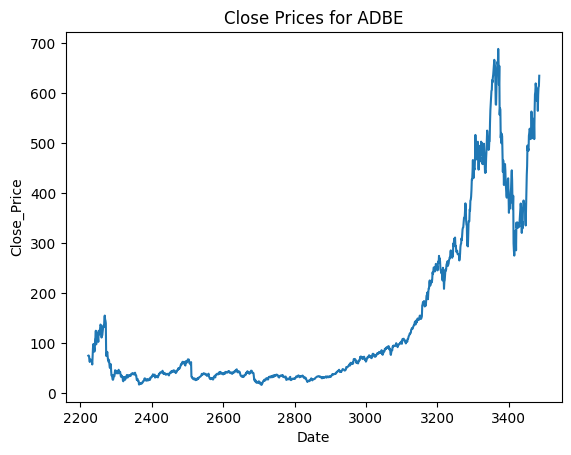

Epoch 1/100
15/15 [==============================] - 1s 2ms/step - loss: 6352.7495
Epoch 2/100
15/15 [==============================] - 0s 1ms/step - loss: 6349.1445
Epoch 3/100
15/15 [==============================] - 0s 1ms/step - loss: 6345.4766
Epoch 4/100
15/15 [==============================] - 0s 1ms/step - loss: 6341.2822
Epoch 5/100
15/15 [==============================] - 0s 2ms/step - loss: 6336.3379
Epoch 6/100
15/15 [==============================] - 0s 1ms/step - loss: 6330.7441
Epoch 7/100
15/15 [==============================] - 0s 1ms/step - loss: 6324.4624
Epoch 8/100
15/15 [==============================] - 0s 1ms/step - loss: 6317.3877
Epoch 9/100
15/15 [==============================] - 0s 2ms/step - loss: 6309.4243
Epoch 10/100
15/15 [==============================] - 0s 1ms/step - loss: 6300.4888
Epoch 11/100
15/15 [==============================] - 0s 2ms/step - loss: 6290.4990
Epoch 12/100
15/15 [==============================] - 0s 1ms/step - loss: 6279.3696
E

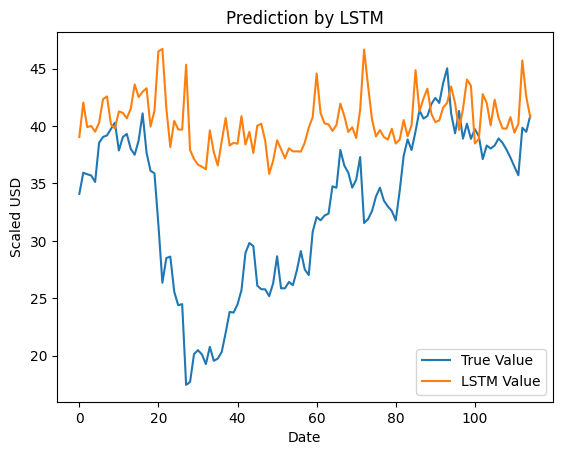

Mean Absolute Error (MAE): 7.5550398015561315
Mean Squared Error (MSE): 90.75844350613
Root Mean Squared Error (RMSE): 9.52672260046077
R-squared (R2) Score: -0.9562125652495173
y_pred [[39.035763]
 [42.049767]
 [39.90339 ]
 [40.007324]
 [39.507072]
 [40.287457]
 [42.347378]
 [42.576546]
 [40.147324]
 [39.78624 ]
 [41.27157 ]
 [41.143356]
 [40.668583]
 [41.507004]
 [43.61871 ]
 [42.519024]
 [42.985138]
 [43.288963]
 [39.951565]
 [41.34264 ]
 [46.51149 ]
 [46.714447]
 [41.55262 ]
 [38.177   ]
 [40.443684]
 [39.70537 ]
 [39.677105]
 [45.344513]
 [37.913998]
 [37.124397]
 [36.635162]
 [36.455498]
 [36.232082]
 [39.619156]
 [37.72537 ]
 [36.561165]
 [38.668633]
 [40.69931 ]
 [38.303047]
 [38.53585 ]
 [38.461376]
 [40.856743]
 [38.38881 ]
 [39.495148]
 [37.653828]
 [40.030304]
 [40.19839 ]
 [38.708054]
 [35.83267 ]
 [36.970444]
 [38.755135]
 [37.984673]
 [37.187042]
 [38.061962]
 [37.791122]
 [37.79718 ]
 [37.7697  ]
 [38.554497]
 [39.8535  ]
 [40.771187]
 [44.573963]
 [41.1118  ]
 [40.2276

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


29/29 [==============================] - 1s 1ms/step - loss: 3745.6560
Epoch 2/100
29/29 [==============================] - 0s 1ms/step - loss: 3741.4397
Epoch 3/100
29/29 [==============================] - 0s 1ms/step - loss: 3736.4978
Epoch 4/100
29/29 [==============================] - 0s 1ms/step - loss: 3730.5308
Epoch 5/100
29/29 [==============================] - 0s 1ms/step - loss: 3723.1577
Epoch 6/100
29/29 [==============================] - 0s 1ms/step - loss: 3714.1465
Epoch 7/100
29/29 [==============================] - 0s 1ms/step - loss: 3703.2666
Epoch 8/100
29/29 [==============================] - 0s 1ms/step - loss: 3690.2869
Epoch 9/100
29/29 [==============================] - 0s 1ms/step - loss: 3674.9851
Epoch 10/100
29/29 [==============================] - 0s 1ms/step - loss: 3657.1440
Epoch 11/100
29/29 [==============================] - 0s 1ms/step - loss: 3636.5664
Epoch 12/100
29/29 [==============================] - 0s 1ms/step - loss: 3613.0740
Epoch 13/100


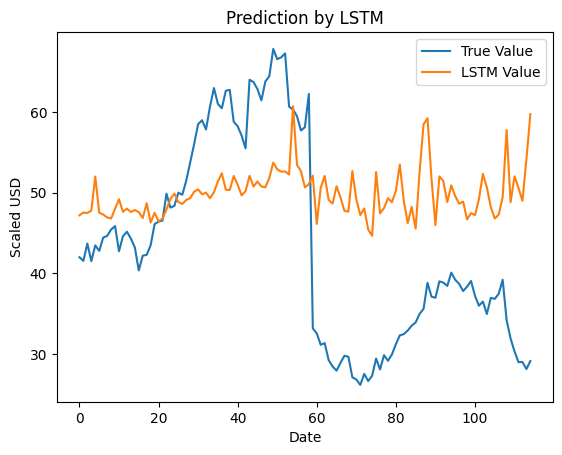

Mean Absolute Error (MAE): 11.665342802628228
Mean Squared Error (MSE): 184.7627210119391
Root Mean Squared Error (RMSE): 13.592745161001845
R-squared (R2) Score: -0.21979429227319058
y_pred [[47.18078 ]
 [47.53444 ]
 [47.47014 ]
 [47.76335 ]
 [51.99055 ]
 [47.51439 ]
 [47.27835 ]
 [46.923798]
 [46.786842]
 [48.012913]
 [49.16562 ]
 [47.620598]
 [48.01231 ]
 [47.59616 ]
 [47.84379 ]
 [47.57866 ]
 [46.85059 ]
 [48.685387]
 [46.28721 ]
 [47.4982  ]
 [46.45221 ]
 [46.75413 ]
 [47.92792 ]
 [49.204227]
 [49.881054]
 [48.839966]
 [48.59042 ]
 [49.09443 ]
 [49.312126]
 [50.10591 ]
 [50.402424]
 [49.791306]
 [49.995857]
 [49.295074]
 [50.03939 ]
 [51.383087]
 [52.398544]
 [50.358643]
 [50.317497]
 [52.063988]
 [50.973183]
 [49.66282 ]
 [50.184578]
 [52.086823]
 [50.759094]
 [51.372875]
 [50.76175 ]
 [50.657494]
 [51.809196]
 [53.716854]
 [52.88455 ]
 [52.594776]
 [52.620758]
 [52.24054 ]
 [60.703598]
 [53.437256]
 [52.648117]
 [50.646362]
 [51.05552 ]
 [52.1051  ]
 [46.119476]
 [50.591187]
 [5

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


44/44 [==============================] - 1s 1ms/step - loss: 3175.1633
Epoch 2/100
44/44 [==============================] - 0s 1ms/step - loss: 3167.3801
Epoch 3/100
44/44 [==============================] - 0s 1ms/step - loss: 3156.7222
Epoch 4/100
44/44 [==============================] - 0s 1ms/step - loss: 3142.4160
Epoch 5/100
44/44 [==============================] - 0s 1ms/step - loss: 3123.5598
Epoch 6/100
44/44 [==============================] - 0s 1ms/step - loss: 3099.2595
Epoch 7/100
44/44 [==============================] - 0s 1ms/step - loss: 3068.6873
Epoch 8/100
44/44 [==============================] - 0s 2ms/step - loss: 3031.1257
Epoch 9/100
44/44 [==============================] - 0s 2ms/step - loss: 2986.0146
Epoch 10/100
44/44 [==============================] - 0s 2ms/step - loss: 2932.9949
Epoch 11/100
44/44 [==============================] - 0s 3ms/step - loss: 2871.9390
Epoch 12/100
44/44 [==============================] - 0s 1ms/step - loss: 2802.9604
Epoch 13/100


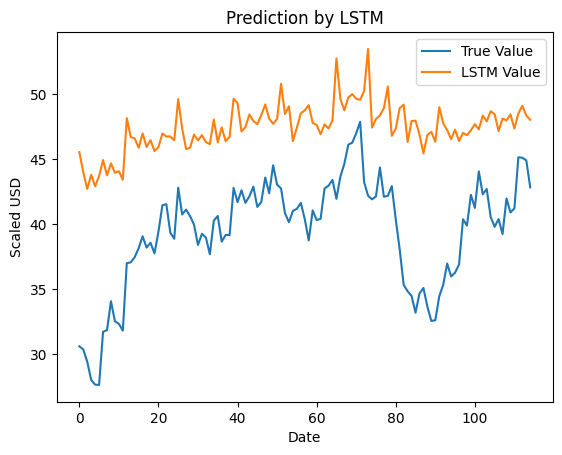

Mean Absolute Error (MAE): 8.015694004224693
Mean Squared Error (MSE): 74.93077197562008
Root Mean Squared Error (RMSE): 8.65625623324657
R-squared (R2) Score: -3.100639392958219
y_pred [[45.543686]
 [43.991035]
 [42.7101  ]
 [43.803272]
 [42.91421 ]
 [43.703598]
 [44.935463]
 [43.75911 ]
 [44.677834]
 [43.955902]
 [44.075565]
 [43.41703 ]
 [48.157433]
 [46.710022]
 [46.59747 ]
 [45.884624]
 [46.983574]
 [45.938362]
 [46.467976]
 [45.620544]
 [45.93097 ]
 [46.97908 ]
 [46.75058 ]
 [46.746666]
 [46.45172 ]
 [49.62311 ]
 [47.3552  ]
 [45.77682 ]
 [45.887836]
 [46.890854]
 [46.454235]
 [46.84627 ]
 [46.31067 ]
 [46.161797]
 [48.052   ]
 [46.293427]
 [47.44393 ]
 [46.38271 ]
 [46.736343]
 [49.64969 ]
 [49.313927]
 [47.130554]
 [47.471554]
 [48.444206]
 [47.94772 ]
 [47.6932  ]
 [48.389984]
 [49.208   ]
 [48.12208 ]
 [47.715946]
 [48.091316]
 [50.80287 ]
 [48.475525]
 [49.07195 ]
 [46.39766 ]
 [47.42899 ]
 [48.53325 ]
 [48.757557]
 [49.161385]
 [47.79392 ]
 [47.64029 ]
 [46.918556]
 [47.674

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 [==============================] - 1s 1ms/step - loss: 2773.3809
Epoch 2/100
58/58 [==============================] - 0s 1ms/step - loss: 2764.0039
Epoch 3/100
58/58 [==============================] - 0s 1ms/step - loss: 2749.0283
Epoch 4/100
58/58 [==============================] - 0s 1ms/step - loss: 2726.4209
Epoch 5/100
58/58 [==============================] - 0s 1ms/step - loss: 2694.0801
Epoch 6/100
58/58 [==============================] - 0s 1ms/step - loss: 2650.1450
Epoch 7/100
58/58 [==============================] - 0s 2ms/step - loss: 2593.2139
Epoch 8/100
58/58 [==============================] - 0s 1ms/step - loss: 2522.5176
Epoch 9/100
58/58 [==============================] - 0s 1ms/step - loss: 2438.0525
Epoch 10/100
58/58 [==============================] - 0s 2ms/step - loss: 2340.6111
Epoch 11/100
58/58 [==============================] - 0s 1ms/step - loss: 2231.7217
Epoch 12/100
58/58 [==============================] - 0s 1ms/step - loss: 2113.5256
Epoch 13/100


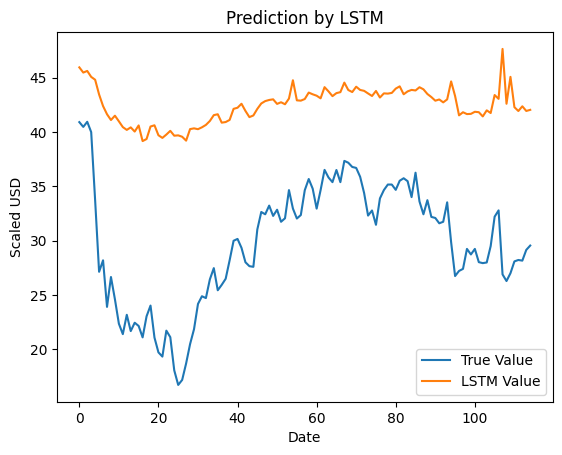

Mean Absolute Error (MAE): 12.723293833856996
Mean Squared Error (MSE): 179.76044903999605
Root Mean Squared Error (RMSE): 13.407477355565291
R-squared (R2) Score: -4.872071402591991
y_pred [[45.95479 ]
 [45.47513 ]
 [45.62503 ]
 [45.07613 ]
 [44.813744]
 [43.454292]
 [42.390327]
 [41.636337]
 [41.103523]
 [41.50265 ]
 [40.98545 ]
 [40.450928]
 [40.193428]
 [40.42661 ]
 [40.039963]
 [40.60495 ]
 [39.162987]
 [39.353886]
 [40.504776]
 [40.618225]
 [39.701504]
 [39.456257]
 [39.762177]
 [40.106583]
 [39.659904]
 [39.690407]
 [39.56275 ]
 [39.20427 ]
 [40.267307]
 [40.335865]
 [40.25896 ]
 [40.431732]
 [40.65252 ]
 [41.01422 ]
 [41.554222]
 [41.635254]
 [40.860474]
 [40.917553]
 [41.112885]
 [42.133446]
 [42.235336]
 [42.602688]
 [41.94096 ]
 [41.37115 ]
 [41.52339 ]
 [42.12932 ]
 [42.628117]
 [42.847538]
 [42.951103]
 [43.0095  ]
 [42.589043]
 [42.74121 ]
 [42.55568 ]
 [43.079025]
 [44.768562]
 [42.91589 ]
 [42.887707]
 [43.03894 ]
 [43.632454]
 [43.473793]
 [43.343754]
 [43.101936]
 [44

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


72/72 [==============================] - 1s 1ms/step - loss: 2399.5068
Epoch 2/100
72/72 [==============================] - 0s 1ms/step - loss: 2386.4907
Epoch 3/100
72/72 [==============================] - 0s 1ms/step - loss: 2364.7588
Epoch 4/100
72/72 [==============================] - 0s 1ms/step - loss: 2330.5669
Epoch 5/100
72/72 [==============================] - 0s 1ms/step - loss: 2280.5632
Epoch 6/100
72/72 [==============================] - 0s 1ms/step - loss: 2212.3523
Epoch 7/100
72/72 [==============================] - 0s 1ms/step - loss: 2125.0293
Epoch 8/100
72/72 [==============================] - 0s 1ms/step - loss: 2019.4752
Epoch 9/100
72/72 [==============================] - 0s 1ms/step - loss: 1898.3087
Epoch 10/100
72/72 [==============================] - 0s 1ms/step - loss: 1765.5604
Epoch 11/100
72/72 [==============================] - 0s 1ms/step - loss: 1626.1219
Epoch 12/100
72/72 [==============================] - 0s 2ms/step - loss: 1485.1454
Epoch 13/100


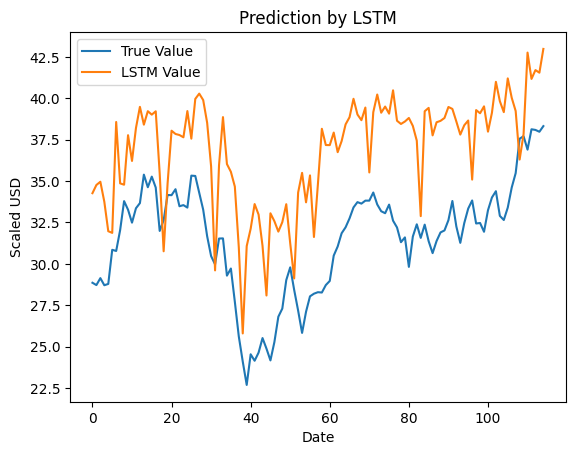

Mean Absolute Error (MAE): 5.3882790215533705
Mean Squared Error (MSE): 33.696577200532914
Root Mean Squared Error (RMSE): 5.804875295864065
R-squared (R2) Score: -2.0148286549073884
y_pred [[34.269268]
 [34.76519 ]
 [34.960274]
 [33.75414 ]
 [31.972328]
 [31.872684]
 [38.57057 ]
 [34.86285 ]
 [34.781338]
 [37.771973]
 [36.217773]
 [38.204826]
 [39.484047]
 [38.408096]
 [39.220863]
 [39.013245]
 [39.215446]
 [35.464497]
 [30.76066 ]
 [34.867496]
 [38.0429  ]
 [37.84581 ]
 [37.782337]
 [37.645004]
 [39.229042]
 [37.563507]
 [39.964005]
 [40.28249 ]
 [39.89365 ]
 [38.51921 ]
 [35.882393]
 [29.606924]
 [35.950325]
 [38.86441 ]
 [36.02929 ]
 [35.559875]
 [34.66771 ]
 [31.003681]
 [25.799816]
 [31.075174]
 [32.12333 ]
 [33.61231 ]
 [32.97962 ]
 [31.089321]
 [28.091072]
 [33.05571 ]
 [32.578312]
 [31.949085]
 [32.519897]
 [33.6036  ]
 [31.24118 ]
 [29.12202 ]
 [34.308   ]
 [35.496002]
 [33.71798 ]
 [35.34397 ]
 [31.623978]
 [34.811993]
 [38.15866 ]
 [37.17658 ]
 [37.173286]
 [37.93062 ]
 [36

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


87/87 [==============================] - 1s 1ms/step - loss: 2166.1296
Epoch 2/100
87/87 [==============================] - 0s 1ms/step - loss: 2145.5791
Epoch 3/100
87/87 [==============================] - 0s 1ms/step - loss: 2104.2869
Epoch 4/100
87/87 [==============================] - 0s 1ms/step - loss: 2033.8645
Epoch 5/100
87/87 [==============================] - 0s 1ms/step - loss: 1928.8817
Epoch 6/100
87/87 [==============================] - 0s 1ms/step - loss: 1789.2462
Epoch 7/100
87/87 [==============================] - 0s 1ms/step - loss: 1621.1538
Epoch 8/100
87/87 [==============================] - 0s 1ms/step - loss: 1436.0841
Epoch 9/100
87/87 [==============================] - 0s 1ms/step - loss: 1248.1749
Epoch 10/100
87/87 [==============================] - 0s 1ms/step - loss: 1071.0153
Epoch 11/100
87/87 [==============================] - 0s 2ms/step - loss: 914.9689
Epoch 12/100
87/87 [==============================] - 0s 1ms/step - loss: 785.7495
Epoch 13/100
87

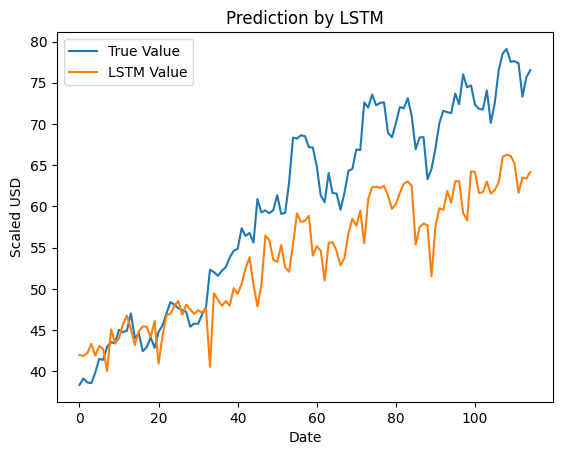

Mean Absolute Error (MAE): 7.01924351169752
Mean Squared Error (MSE): 68.83835457792638
Root Mean Squared Error (RMSE): 8.296888246681787
R-squared (R2) Score: 0.5242248563871301
y_pred [[41.951046]
 [41.85939 ]
 [42.204136]
 [43.313774]
 [41.90227 ]
 [43.064926]
 [42.691563]
 [40.03474 ]
 [45.080193]
 [43.432365]
 [43.97947 ]
 [45.703373]
 [46.74927 ]
 [45.145714]
 [43.182762]
 [44.85293 ]
 [45.425644]
 [45.397823]
 [44.141827]
 [46.082123]
 [40.937965]
 [44.269558]
 [46.796047]
 [46.955513]
 [47.930645]
 [48.51894 ]
 [46.856194]
 [48.075096]
 [47.529762]
 [46.950386]
 [47.39757 ]
 [47.08591 ]
 [47.647633]
 [40.52144 ]
 [49.463196]
 [48.691406]
 [47.93328 ]
 [48.497272]
 [47.96405 ]
 [50.07807 ]
 [49.37637 ]
 [50.593323]
 [52.449818]
 [53.833862]
 [50.49925 ]
 [47.86159 ]
 [50.4284  ]
 [56.461243]
 [55.908577]
 [53.52722 ]
 [53.270504]
 [55.31009 ]
 [52.596603]
 [52.070904]
 [55.40338 ]
 [59.160133]
 [58.123512]
 [58.23833 ]
 [58.837105]
 [54.040356]
 [55.15567 ]
 [54.64549 ]
 [51.009

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


101/101 [==============================] - 1s 1ms/step - loss: 2392.5962
Epoch 2/100
101/101 [==============================] - 0s 1ms/step - loss: 2365.4941
Epoch 3/100
101/101 [==============================] - 0s 1ms/step - loss: 2312.2568
Epoch 4/100
101/101 [==============================] - 0s 1ms/step - loss: 2219.9609
Epoch 5/100
101/101 [==============================] - 0s 2ms/step - loss: 2080.5139
Epoch 6/100
101/101 [==============================] - 0s 3ms/step - loss: 1897.7233
Epoch 7/100
101/101 [==============================] - 0s 1ms/step - loss: 1683.9434
Epoch 8/100
101/101 [==============================] - 0s 1ms/step - loss: 1457.1899
Epoch 9/100
101/101 [==============================] - 0s 1ms/step - loss: 1236.4615
Epoch 10/100
101/101 [==============================] - 0s 1ms/step - loss: 1037.4528
Epoch 11/100
101/101 [==============================] - 0s 1ms/step - loss: 869.9941
Epoch 12/100
101/101 [==============================] - 0s 1ms/step - loss: 

KeyboardInterrupt: 

In [60]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# Filter DataFrame for the desired symbol
ADBE_df = clean_df[clean_df['Ticker'] == 'ADBE']
ADBE_df

# Plot closing prices
ADBE_df['Close_Price'].plot()
# # Add labels and title
plt.xlabel('Date')
plt.ylabel('Close_Price')
plt.title('Close Prices for ADBE')
# Show plot
plt.show()

#Set Target Variable
ADBE_output = ADBE_df['Close_Price']
#Selecting the Features 
features = ['Open_Price','High_Price','Low_Price','Volume']

#Scaling
scaler = MinMaxScaler()
feature_transform = scaler.fit_transform(ADBE_df[features])
feature_transform= pd.DataFrame(columns=features, data=feature_transform, index=ADBE_df.index)


#Splitting to Training set and Test set
timesplit= TimeSeriesSplit(n_splits=10)
for train_index, test_index in timesplit.split(feature_transform):


        X_train, X_test = feature_transform.iloc[train_index], feature_transform.iloc[test_index]
        y_train, y_test = ADBE_output.iloc[train_index].values.ravel(), ADBE_output.iloc[test_index].values.ravel()


        #Process the data for LSTM
        trainX =np.array(X_train)
        testX =np.array(X_test)
        X_train = trainX.reshape(X_train.shape[0], 1, X_train.shape[1])
        X_test = testX.reshape(X_test.shape[0], 1, X_test.shape[1])


        #Building the LSTM Model
        lstm = Sequential()
        lstm.add(LSTM(32, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=False))
        lstm.add(Dense(1))
        lstm.compile(loss='mean_squared_error', optimizer='adam')

        history=lstm.fit(X_train, y_train, epochs=100, batch_size=8, verbose=1, shuffle=False)


        y_pred= lstm.predict(X_test)

        #Predicted vs True Adj Close Value – LSTM
        plt.plot(y_test, label='True Value')
        plt.plot(y_pred, label='LSTM Value')
        plt.title('Prediction by LSTM')
        plt.xlabel('Date')
        plt.ylabel('Scaled USD')
        plt.legend()
        plt.show()


        # 1. Performance Evaluation
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        r2 = r2_score(y_test, y_pred)

        print("Mean Absolute Error (MAE):", mae)
        print("Mean Squared Error (MSE):", mse)
        print("Root Mean Squared Error (RMSE):", rmse)
        print("R-squared (R2) Score:", r2)
        print("y_pred", y_pred)



COSTCO LSTM

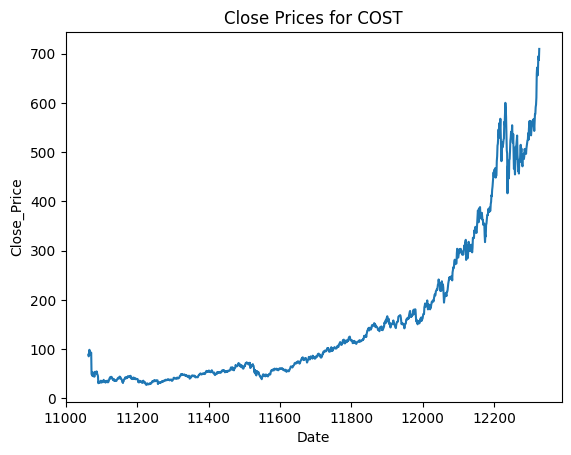

Epoch 1/100
144/144 [==============================] - 2s 3ms/step - loss: 23232.3867
Epoch 2/100
144/144 [==============================] - 0s 2ms/step - loss: 22913.5508
Epoch 3/100
144/144 [==============================] - 0s 2ms/step - loss: 22434.5801
Epoch 4/100
144/144 [==============================] - 0s 2ms/step - loss: 21717.8574
Epoch 5/100
144/144 [==============================] - 0s 3ms/step - loss: 20744.4902
Epoch 6/100
144/144 [==============================] - 0s 2ms/step - loss: 19538.1992
Epoch 7/100
144/144 [==============================] - 0s 2ms/step - loss: 18155.7363
Epoch 8/100
144/144 [==============================] - 0s 2ms/step - loss: 16670.4785
Epoch 9/100
144/144 [==============================] - 0s 2ms/step - loss: 15156.8594
Epoch 10/100
144/144 [==============================] - 0s 2ms/step - loss: 13679.7734
Epoch 11/100
144/144 [==============================] - 0s 2ms/step - loss: 12289.2725
Epoch 12/100
144/144 [==============================

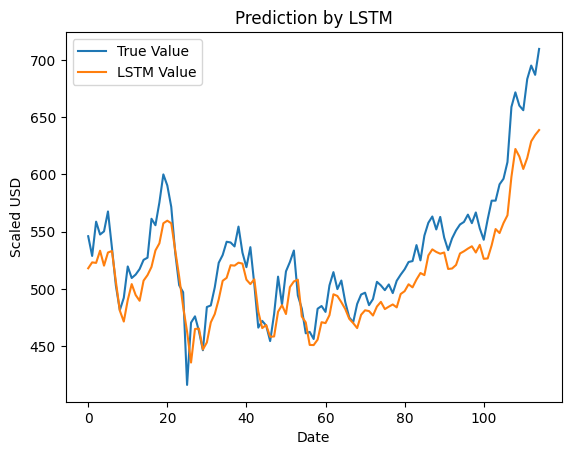

Mean Absolute Error (MAE): 22.567899690047565
Mean Squared Error (MSE): 736.0333110030917
Root Mean Squared Error (RMSE): 27.129933855486854
R-squared (R2) Score: 0.7504473172403879


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# Filter DataFrame for the desired symbol
COST_df = clean_df[clean_df['Ticker'] == 'COST']
COST_df

# Plot closing prices
COST_df['Close_Price'].plot()
# # Add labels and title
plt.xlabel('Date')
plt.ylabel('Close_Price')
plt.title('Close Prices for COST')
# Show plot
plt.show()

#Set Target Variable
output = COST_df['Close_Price']
#Selecting the Features 
features = ['Open_Price','High_Price','Low_Price','Volume']

#Scaling
scaler = MinMaxScaler()
feature_transform = scaler.fit_transform(COST_df[features])
feature_transform= pd.DataFrame(columns=features, data=feature_transform, index=COST_df.index)
feature_transform.head()

#Splitting to Training set and Test set
timesplit= TimeSeriesSplit(n_splits=10)
for train_index, test_index in timesplit.split(feature_transform):
        X_train, X_test = feature_transform[:len(train_index)], feature_transform[len(train_index): (len(train_index)+len(test_index))]
        y_train, y_test = output[:len(train_index)].values.ravel(), output[len(train_index): (len(train_index)+len(test_index))].values.ravel()


#Process the data for LSTM
trainX =np.array(X_train)
testX =np.array(X_test)
X_train = trainX.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = testX.reshape(X_test.shape[0], 1, X_test.shape[1])


#Building the LSTM Model
lstm = Sequential()
lstm.add(LSTM(32, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=False))
lstm.add(Dense(1))
lstm.compile(loss='mean_squared_error', optimizer='adam')

history=lstm.fit(X_train, y_train, epochs=100, batch_size=8, verbose=1, shuffle=False)


y_pred= lstm.predict(X_test)

#Predicted vs True Adj Close Value – LSTM
plt.plot(y_test, label='True Value')
plt.plot(y_pred, label='LSTM Value')
plt.title('Prediction by LSTM')
plt.xlabel('Date')
plt.ylabel('Scaled USD')
plt.legend()
plt.show()


# 1. Performance Evaluation
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) Score:", r2)




JPM LSTM

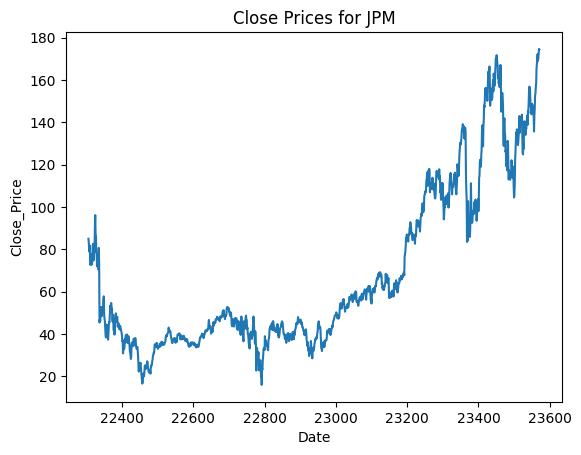

Epoch 1/100
144/144 [==============================] - 2s 2ms/step - loss: 4725.3657
Epoch 2/100
144/144 [==============================] - 0s 2ms/step - loss: 4547.0850
Epoch 3/100
144/144 [==============================] - 0s 2ms/step - loss: 4208.3755
Epoch 4/100
144/144 [==============================] - 0s 2ms/step - loss: 3689.6377
Epoch 5/100
144/144 [==============================] - 0s 2ms/step - loss: 3042.1638
Epoch 6/100
144/144 [==============================] - 0s 2ms/step - loss: 2356.4580
Epoch 7/100
144/144 [==============================] - 0s 2ms/step - loss: 1721.4207
Epoch 8/100
144/144 [==============================] - 0s 2ms/step - loss: 1197.6840
Epoch 9/100
144/144 [==============================] - 0s 2ms/step - loss: 809.2272
Epoch 10/100
144/144 [==============================] - 0s 2ms/step - loss: 548.2947
Epoch 11/100
144/144 [==============================] - 0s 2ms/step - loss: 387.7960
Epoch 12/100
144/144 [==============================] - 0s 2ms/ste

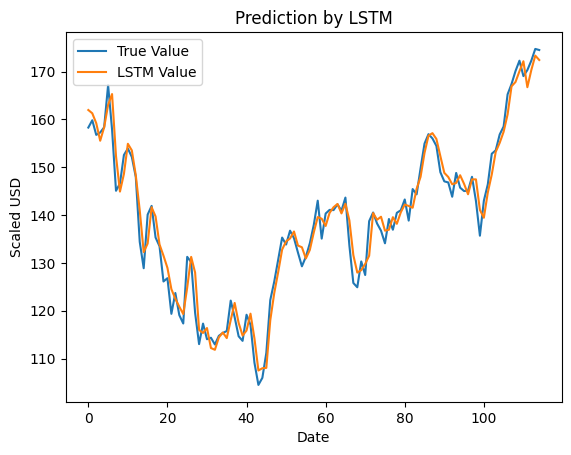

Mean Absolute Error (MAE): 2.4922635179602586
Mean Squared Error (MSE): 9.395405533053564
Root Mean Squared Error (RMSE): 3.065192576829972
R-squared (R2) Score: 0.965586518476463


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [ ]:

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# Filter DataFrame for the desired symbol
JPM_df = clean_df[clean_df['Ticker'] == 'JPM']
JPM_df

# Plot closing prices
JPM_df['Close_Price'].plot()
# # Add labels and title
plt.xlabel('Date')
plt.ylabel('Close_Price')
plt.title('Close Prices for JPM')
# Show plot
plt.show()

#Set Target Variable
output = JPM_df['Close_Price']
#Selecting the Features 
features = ['Open_Price','High_Price','Low_Price','Volume']

#Scaling
scaler = MinMaxScaler()
feature_transform = scaler.fit_transform(JPM_df[features])
feature_transform= pd.DataFrame(columns=features, data=feature_transform, index=JPM_df.index)
feature_transform.head()

#Splitting to Training set and Test set
timesplit= TimeSeriesSplit(n_splits=10)
for train_index, test_index in timesplit.split(feature_transform):
        X_train, X_test = feature_transform[:len(train_index)], feature_transform[len(train_index): (len(train_index)+len(test_index))]
        y_train, y_test = output[:len(train_index)].values.ravel(), output[len(train_index): (len(train_index)+len(test_index))].values.ravel()


#Process the data for LSTM
trainX =np.array(X_train)
testX =np.array(X_test)
X_train = trainX.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = testX.reshape(X_test.shape[0], 1, X_test.shape[1])


#Building the LSTM Model
lstm = Sequential()
lstm.add(LSTM(32, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=False))
lstm.add(Dense(1))
lstm.compile(loss='mean_squared_error', optimizer='adam')

history=lstm.fit(X_train, y_train, epochs=100, batch_size=8, verbose=1, shuffle=False)


y_pred= lstm.predict(X_test)

#Predicted vs True Adj Close Value – LSTM
plt.plot(y_test, label='True Value')
plt.plot(y_pred, label='LSTM Value')
plt.title('Prediction by LSTM')
plt.xlabel('Date')
plt.ylabel('Scaled USD')
plt.legend()
plt.show()


# 1. Performance Evaluation
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R2) Score:", r2)






NVDA LSTM

In [ ]:

from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout

C:\Users\Evelyn\AppData\Local\Temp\ipykernel_14328\2848056238.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NVDA_df['Date'] = pd.to_datetime(NVDA_df['Date'])


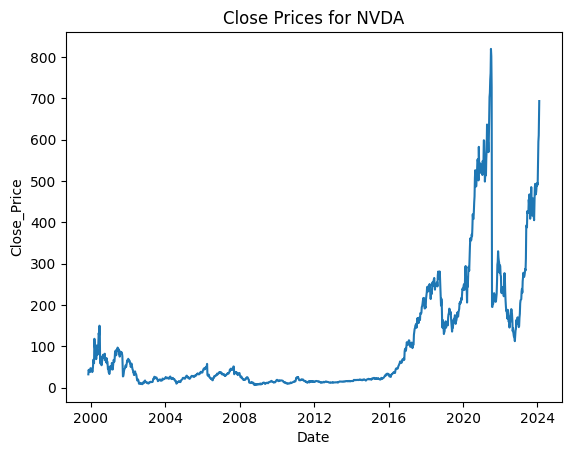

Epoch 1/100
8/8 [==============================] - 3s 3ms/step - loss: 5093.8896
Epoch 2/100
8/8 [==============================] - 0s 4ms/step - loss: 5092.0752
Epoch 3/100
8/8 [==============================] - 0s 3ms/step - loss: 5090.0684
Epoch 4/100
8/8 [==============================] - 0s 3ms/step - loss: 5087.8052
Epoch 5/100
8/8 [==============================] - 0s 5ms/step - loss: 5085.1880
Epoch 6/100
8/8 [==============================] - 0s 4ms/step - loss: 5082.0825
Epoch 7/100
8/8 [==============================] - 0s 4ms/step - loss: 5078.3423
Epoch 8/100
8/8 [==============================] - 0s 5ms/step - loss: 5073.6768
Epoch 9/100
8/8 [==============================] - 0s 4ms/step - loss: 5068.0010
Epoch 10/100
8/8 [==============================] - 0s 4ms/step - loss: 5060.4844
Epoch 11/100
8/8 [==============================] - 0s 4ms/step - loss: 5050.7827
Epoch 12/100
8/8 [==============================] - 0s 4ms/step - loss: 5038.7856
Epoch 13/100
8/8 [=======

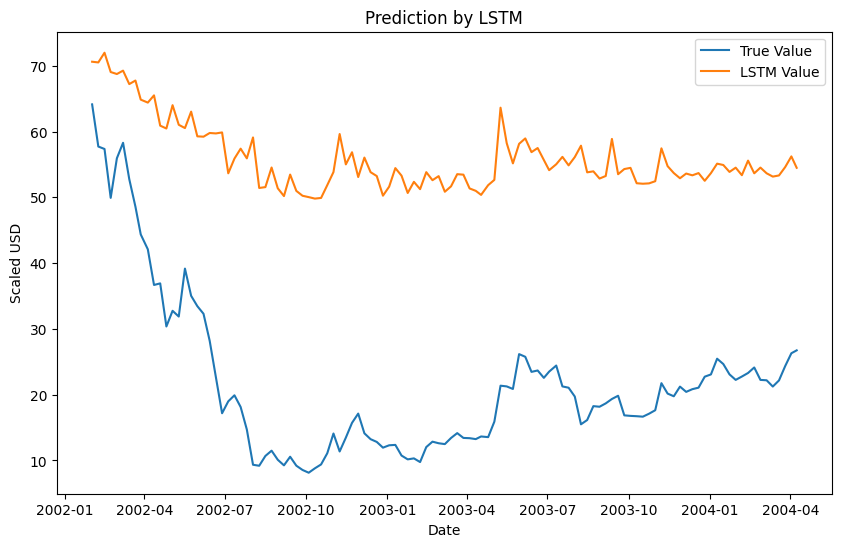

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 34.21574830959154
Mean Squared Error (MSE): 1230.939035282844
Root Mean Squared Error (RMSE): 35.08474077548306
R-squared (R2) Score: -7.659543428564103
Epoch 1/100
15/15 [==============================] - 3s 4ms/step - loss: 2863.5554
Epoch 2/100
15/15 [==============================] - 0s 3ms/step - loss: 2860.9036
Epoch 3/100
15/15 [==============================] - 0s 3ms/step - loss: 2857.5449
Epoch 4/100
15/15 [==============================] - 0s 4ms/step - loss: 2853.1033
Epoch 5/100
15/15 [==============================] - 0s 3ms/step - loss: 2846.8105
Epoch 6/100
15/15 [==============================] - 0s 3ms/step - loss: 2837.8105
Epoch 7/100
15/15 [==============================] - 0s 3ms/step - loss: 2824.6472
Epoch 8/100
15/15 [==============================] - 0s 3ms/step - loss: 2805.5547
Epoch 9/100
15/15 [==============================] - 0s 4ms/step - loss: 2776.1067
Epoch 10/100
15/15 [==============================] - 0s 3ms/step - loss:

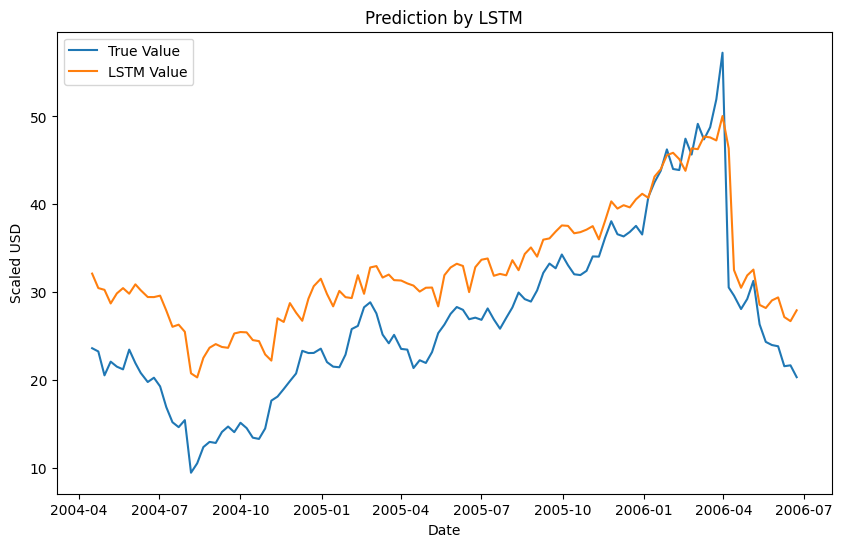

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 6.0225547677744995
Mean Squared Error (MSE): 46.49959390853532
Root Mean Squared Error (RMSE): 6.819061072357052
R-squared (R2) Score: 0.49831782500767896
Epoch 1/100
22/22 [==============================] - 3s 4ms/step - loss: 2182.4829
Epoch 2/100
22/22 [==============================] - 0s 5ms/step - loss: 2178.9382
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 2173.4482
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 2164.0857
Epoch 5/100
22/22 [==============================] - 0s 4ms/step - loss: 2147.1975
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 2117.4456
Epoch 7/100
22/22 [==============================] - 0s 3ms/step - loss: 2063.0837
Epoch 8/100
22/22 [==============================] - 0s 3ms/step - loss: 1966.7501
Epoch 9/100
22/22 [==============================] - 0s 3ms/step - loss: 1800.3936
Epoch 10/100
22/22 [==============================] - 0s 4ms/step - los

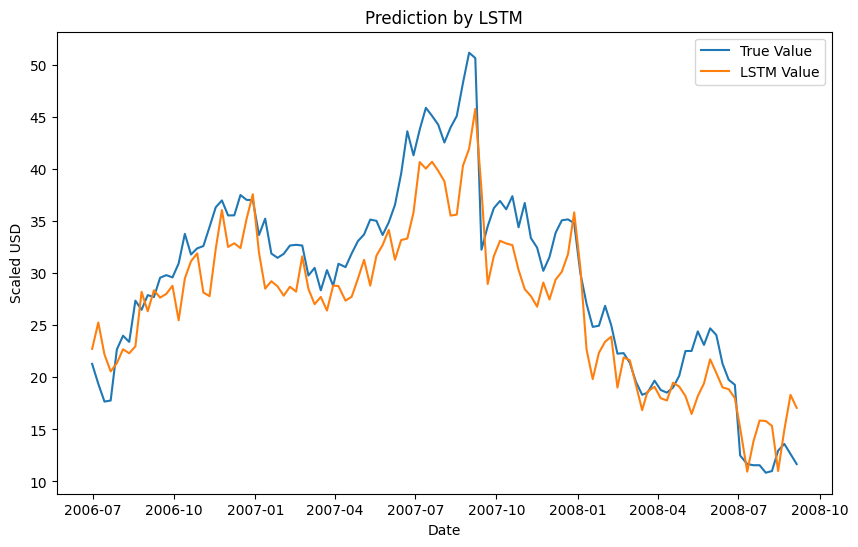

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 3.3512933346292244
Mean Squared Error (MSE): 16.306735564581604
Root Mean Squared Error (RMSE): 4.038159923106266
R-squared (R2) Score: 0.806381426903327
Epoch 1/100
29/29 [==============================] - 4s 3ms/step - loss: 1873.3530
Epoch 2/100
29/29 [==============================] - 0s 3ms/step - loss: 1867.8022
Epoch 3/100
29/29 [==============================] - 0s 3ms/step - loss: 1856.4464
Epoch 4/100
29/29 [==============================] - 0s 3ms/step - loss: 1830.7288
Epoch 5/100
29/29 [==============================] - 0s 3ms/step - loss: 1770.0187
Epoch 6/100
29/29 [==============================] - 0s 3ms/step - loss: 1635.7365
Epoch 7/100
29/29 [==============================] - 0s 3ms/step - loss: 1384.8740
Epoch 8/100
29/29 [==============================] - 0s 3ms/step - loss: 1048.0385
Epoch 9/100
29/29 [==============================] - 0s 4ms/step - loss: 764.2859
Epoch 10/100
29/29 [==============================] - 0s 3ms/step - loss:

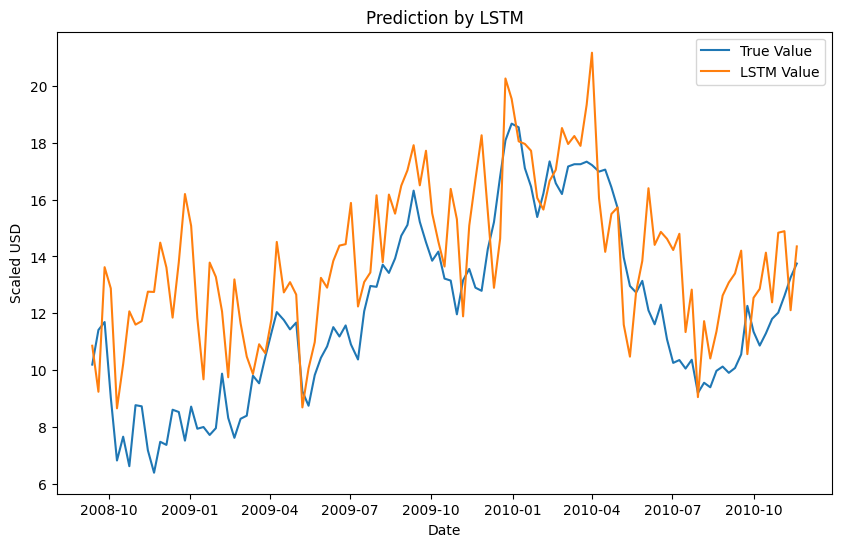

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 2.340099605062733
Mean Squared Error (MSE): 8.428980024859772
Root Mean Squared Error (RMSE): 2.9032705738287246
R-squared (R2) Score: 0.12705937186804017
Epoch 1/100
36/36 [==============================] - 2s 4ms/step - loss: 1529.9220
Epoch 2/100
36/36 [==============================] - 0s 2ms/step - loss: 1524.4838
Epoch 3/100
36/36 [==============================] - 0s 3ms/step - loss: 1512.2457
Epoch 4/100
36/36 [==============================] - 0s 2ms/step - loss: 1480.3550
Epoch 5/100
36/36 [==============================] - 0s 4ms/step - loss: 1396.9213
Epoch 6/100
36/36 [==============================] - 0s 5ms/step - loss: 1219.2419
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 968.2906
Epoch 8/100
36/36 [==============================] - 0s 3ms/step - loss: 755.7750
Epoch 9/100
36/36 [==============================] - 0s 3ms/step - loss: 630.2825
Epoch 10/100
36/36 [==============================] - 0s 4ms/step - loss: 

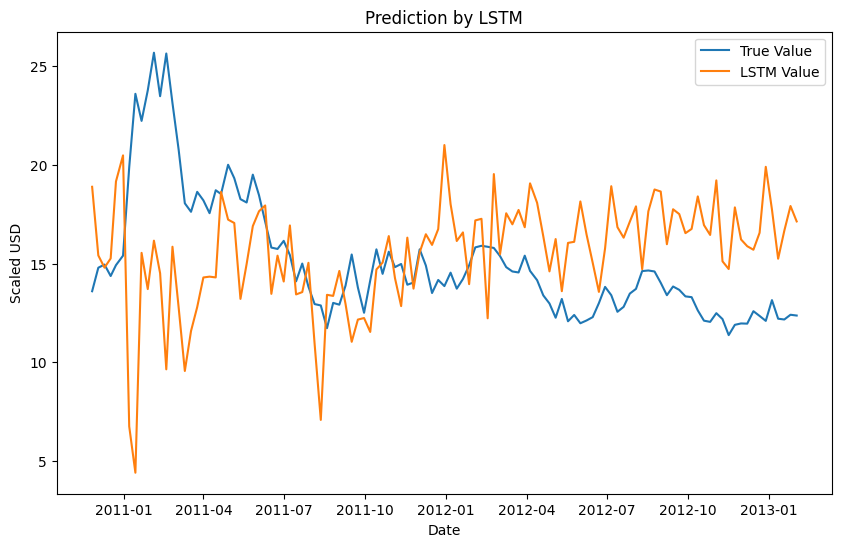

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 3.6206558043438455
Mean Squared Error (MSE): 22.194042542803178
Root Mean Squared Error (RMSE): 4.711055353400464
R-squared (R2) Score: -1.3610350050364253
Epoch 1/100
44/44 [==============================] - 3s 4ms/step - loss: 1314.3762
Epoch 2/100
44/44 [==============================] - 0s 3ms/step - loss: 1308.0472
Epoch 3/100
44/44 [==============================] - 0s 4ms/step - loss: 1289.9504
Epoch 4/100
44/44 [==============================] - 0s 3ms/step - loss: 1231.0260
Epoch 5/100
44/44 [==============================] - 0s 3ms/step - loss: 1077.6548
Epoch 6/100
44/44 [==============================] - 0s 4ms/step - loss: 835.2012
Epoch 7/100
44/44 [==============================] - 0s 3ms/step - loss: 644.8134
Epoch 8/100
44/44 [==============================] - 0s 3ms/step - loss: 559.1383
Epoch 9/100
44/44 [==============================] - 0s 3ms/step - loss: 517.3470
Epoch 10/100
44/44 [==============================] - 0s 4ms/step - loss: 

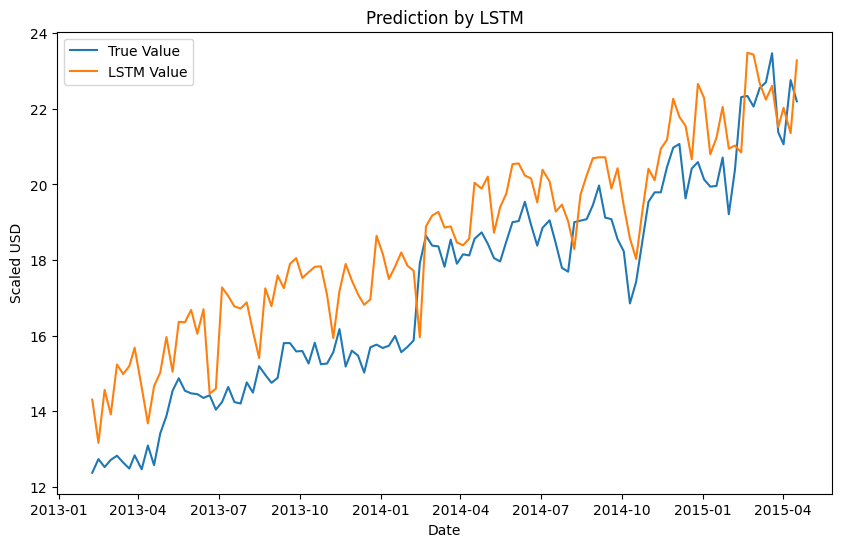

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 1.4422652763698414
Mean Squared Error (MSE): 2.6229081387339104
Root Mean Squared Error (RMSE): 1.6195394835365733
R-squared (R2) Score: 0.6703466312505442
Epoch 1/100
51/51 [==============================] - 3s 5ms/step - loss: 1170.0496
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 1163.0394
Epoch 3/100
51/51 [==============================] - 0s 3ms/step - loss: 1139.7035
Epoch 4/100
51/51 [==============================] - 0s 3ms/step - loss: 1058.4374
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 857.6165
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 632.8838
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 521.9444
Epoch 8/100
51/51 [==============================] - 0s 3ms/step - loss: 474.9886
Epoch 9/100
51/51 [==============================] - 0s 3ms/step - loss: 454.0371
Epoch 10/100
51/51 [==============================] - 0s 4ms/step - loss: 4

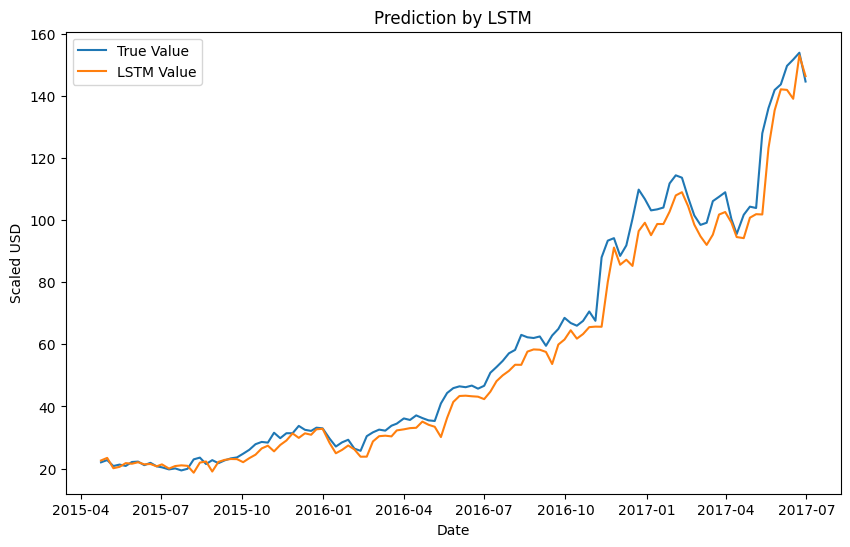

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 4.06301328178074
Mean Squared Error (MSE): 34.29608922453369
Root Mean Squared Error (RMSE): 5.856286299740962
R-squared (R2) Score: 0.976365865048623
Epoch 1/100
58/58 [==============================] - 4s 4ms/step - loss: 1638.3073
Epoch 2/100
58/58 [==============================] - 0s 4ms/step - loss: 1624.6975
Epoch 3/100
58/58 [==============================] - 0s 4ms/step - loss: 1581.4666
Epoch 4/100
58/58 [==============================] - 0s 4ms/step - loss: 1446.9268
Epoch 5/100
58/58 [==============================] - 0s 4ms/step - loss: 1138.6652
Epoch 6/100
58/58 [==============================] - 0s 4ms/step - loss: 827.2767
Epoch 7/100
58/58 [==============================] - 0s 4ms/step - loss: 684.1567
Epoch 8/100
58/58 [==============================] - 0s 4ms/step - loss: 638.5303
Epoch 9/100
58/58 [==============================] - 0s 3ms/step - loss: 615.6895
Epoch 10/100
58/58 [==============================] - 0s 4ms/step - loss: 605.3

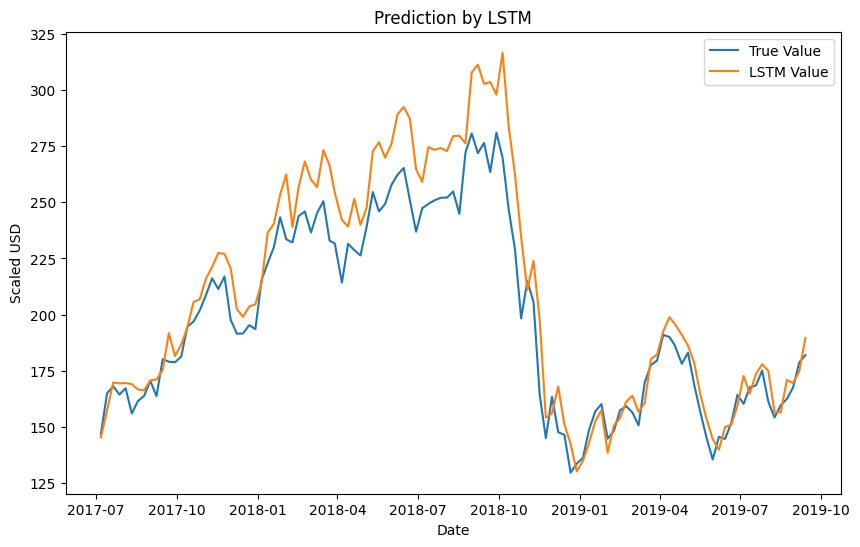

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 12.883886081861414
Mean Squared Error (MSE): 284.0340269294002
Root Mean Squared Error (RMSE): 16.853309079507213
R-squared (R2) Score: 0.837031351187147
Epoch 1/100
65/65 [==============================] - 3s 4ms/step - loss: 6006.2305
Epoch 2/100
65/65 [==============================] - 0s 4ms/step - loss: 5966.0581
Epoch 3/100
65/65 [==============================] - 0s 3ms/step - loss: 5831.0166
Epoch 4/100
65/65 [==============================] - 0s 3ms/step - loss: 5419.1074
Epoch 5/100
65/65 [==============================] - 0s 4ms/step - loss: 4631.3286
Epoch 6/100
65/65 [==============================] - 0s 3ms/step - loss: 3798.9717
Epoch 7/100
65/65 [==============================] - 0s 3ms/step - loss: 3186.4480
Epoch 8/100
65/65 [==============================] - 0s 3ms/step - loss: 2858.6399
Epoch 9/100
65/65 [==============================] - 0s 4ms/step - loss: 2677.1038
Epoch 10/100
65/65 [==============================] - 0s 4ms/step - loss

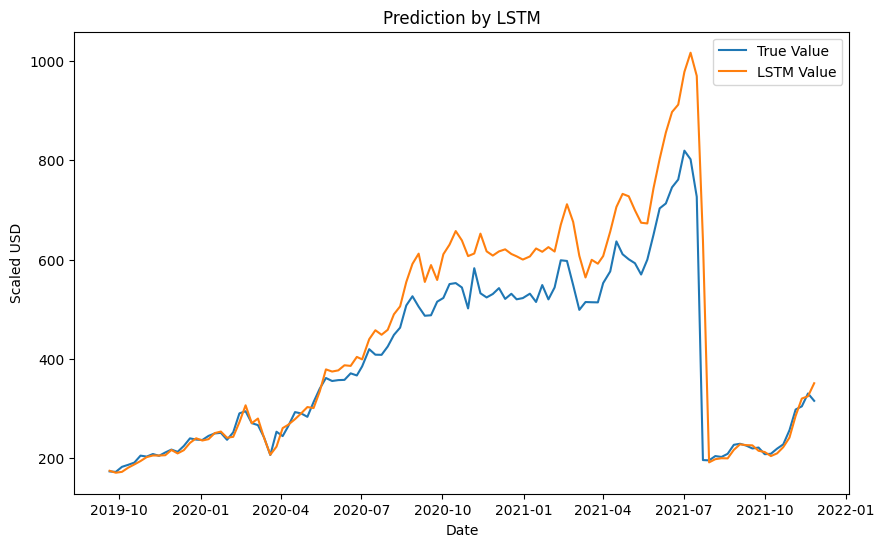

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 51.47084662130606
Mean Squared Error (MSE): 6521.856892683179
Root Mean Squared Error (RMSE): 80.75801441766123
R-squared (R2) Score: 0.7744348048286869
Epoch 1/100
72/72 [==============================] - 3s 6ms/step - loss: 23956.1641
Epoch 2/100
72/72 [==============================] - 0s 4ms/step - loss: 23843.1758
Epoch 3/100
72/72 [==============================] - 0s 4ms/step - loss: 23506.2695
Epoch 4/100
72/72 [==============================] - 0s 3ms/step - loss: 22632.0996
Epoch 5/100
72/72 [==============================] - 0s 4ms/step - loss: 20834.6465
Epoch 6/100
72/72 [==============================] - 0s 4ms/step - loss: 18435.5703
Epoch 7/100
72/72 [==============================] - 0s 4ms/step - loss: 15662.3584
Epoch 8/100
72/72 [==============================] - 0s 4ms/step - loss: 13317.4912
Epoch 9/100
72/72 [==============================] - 0s 4ms/step - loss: 11174.6113
Epoch 10/100
72/72 [==============================] - 0s 3ms/ste

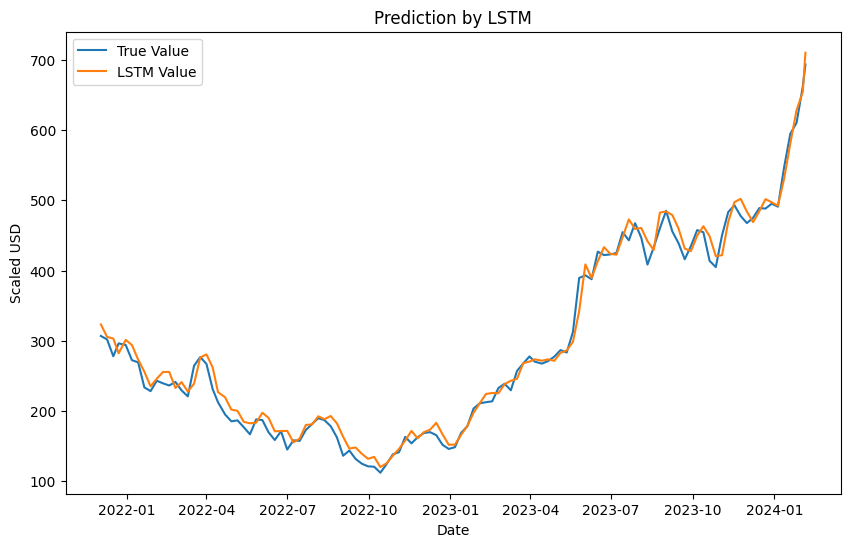

Mean Absolute Error (MAE): 11.24007607899541
Mean Squared Error (MSE): 207.53092121924257
Root Mean Squared Error (RMSE): 14.405933542094472
R-squared (R2) Score: 0.9890559014497434
*************************************
1/1 [==============================] - 0s 24ms/step
Predicted Future Close Price for NVDA: [[710.1236]]
Accuracy of Trend Prediction: 0.672566371681416
1/1 [==============================] - 0s 27ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Trend: Increase
*************************************
1/1 [==============================] - 0s 45ms/step
Predicted Future Close Price for NVDA: [[710.1236]]
Next Month's Date: 2024-03-05 00:00:00
Predicted Return for Next Month: [[2.4236412]] %
Predicted Future Trend: Increase
*************************************
1/1 [==============================] - 0s 24ms/step
Next Month's Date: 2024-03-05 00:00:00
Predicted Close Price for NVDA (Next Month): [[710.1236]]
Predicted Return for Next Month: [[2.4236412]] %


In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# Filter DataFrame for the desired symbol
NVDA_df = clean_df[clean_df['Ticker'] == 'NVDA']
NVDA_df

# Convert 'Date' column to datetime format
NVDA_df['Date'] = pd.to_datetime(NVDA_df['Date'])

#Plot closing prices with correct date labels
plt.plot(NVDA_df['Date'], NVDA_df['Close_Price'])
plt.xlabel('Date')
plt.ylabel('Close_Price')
plt.title('Close Prices for NVDA')
plt.show()

output = NVDA_df['Close_Price']
features = ['Open_Price','High_Price','Low_Price','Volume']

#Scaling
scaler = MinMaxScaler()
feature_transform = scaler.fit_transform(NVDA_df[features])
feature_transform= pd.DataFrame(columns=features, data=feature_transform, index=NVDA_df.index)


#Splitting to Training set and Test set
timesplit= TimeSeriesSplit(n_splits=10)
for train_index, test_index in timesplit.split(feature_transform):
        X_train, X_test = feature_transform[:len(train_index)], feature_transform[len(train_index): (len(train_index)+len(test_index))]
        y_train, y_test = output[:len(train_index)].values.ravel(), output[len(train_index): (len(train_index)+len(test_index))].values.ravel()


        #Process the data for LSTM
        trainX =np.array(X_train)
        testX =np.array(X_test)
        X_train = trainX.reshape(X_train.shape[0], 1, X_train.shape[1])
        X_test = testX.reshape(X_test.shape[0], 1, X_test.shape[1])


        # Building the LSTM Model with adjusted architecture and dropout
        lstm = Sequential()
        lstm.add(LSTM(64, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=True))
        lstm.add(Dropout(0.2))  # Adding dropout layer
        lstm.add(LSTM(32, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=False))
        lstm.add(Dense(1))
        lstm.compile(loss='mean_squared_error', optimizer='adam')

        history=lstm.fit(X_train, y_train, epochs=100, batch_size=16, verbose=1, shuffle=False)


        y_pred= lstm.predict(X_test)

        plt.figure(figsize=(6, 4))
        plt.plot(NVDA_df['Date'].iloc[test_index], y_test, label='True Value')
        plt.plot(NVDA_df['Date'].iloc[test_index], y_pred, label='LSTM Value')
        plt.title('Prediction by LSTM')
        plt.xlabel('Date')
        plt.ylabel('Scaled USD')
        plt.legend()
        plt.show()

        # 1. Performance Evaluation
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        r2 = r2_score(y_test, y_pred)

        print("Mean Absolute Error (MAE):", mae)
        print("Mean Squared Error (MSE):", mse)
        print("Root Mean Squared Error (RMSE):", rmse)
        print("R-squared (R2) Score:", r2)


# Predicting future prices
print("*************************************")
future_features = feature_transform.iloc[-1:].values.reshape(1, 1, -1)
future_prediction = lstm.predict(future_features)
print("Predicted Future Close Price for NVDA:", future_prediction)


 # Predict trend (increase or decrease)
trend_true = np.sign(np.diff(y_test[1:]))  # Ignore the first element
trend_pred = np.sign(np.diff(y_pred.flatten()[1:]))  # Ignore the first element

# Convert 0s to 1s (no change)
trend_true[trend_true == 0] = 1
trend_pred[trend_pred == 0] = 1

# Compute accuracy of trend prediction
accuracy = accuracy_score(trend_true, trend_pred)

print("Accuracy of Trend Prediction:", accuracy)

# Predicting future trend
future_features = feature_transform.iloc[-1:].values.reshape(1, 1, -1)
future_prediction = lstm.predict(future_features)

if future_prediction > output.iloc[-1]:
        print("Predicted Future Trend: Increase")
else:
        print("Predicted Future Trend: Decrease")

print("*************************************")

# Predicting future prices
future_features = feature_transform.iloc[-1:].values.reshape(1, 1, -1)
future_prediction = lstm.predict(future_features)
print("Predicted Future Close Price for NVDA:", future_prediction)

# Assuming 'Date' column is in datetime format and the dataset is daily
# Calculate the date for the next month
last_date = NVDA_df['Date'].iloc[-1]
next_month_date = last_date + pd.DateOffset(months=1)
print("Next Month's Date:", next_month_date)

# Predicting future return
last_price = output.iloc[-1]
predicted_return = ((future_prediction - last_price) / last_price) * 100
print("Predicted Return for Next Month:", predicted_return, "%")

# Predicting future trend
if future_prediction > output.iloc[-1]:
    print("Predicted Future Trend: Increase")
else:
    print("Predicted Future Trend: Decrease")

print("*************************************")

# Define a function to predict future prices and return
def predict_future_prices(model, feature_transform, output, num_months):
    # Predict future prices
    future_features = feature_transform.iloc[-1:].values.reshape(1, 1, -1)
    future_prediction = model.predict(future_features)

    # Calculate the date for the next month
    last_date = NVDA_df['Date'].iloc[-1]
    next_month_date = last_date + pd.DateOffset(months=num_months)
    
    # Predicting future return
    last_price = output.iloc[-1]
    predicted_return = ((future_prediction - last_price) / last_price) * 100
    
    return next_month_date, future_prediction, predicted_return

# Predict for next month
next_month_date, next_month_price, next_month_return = predict_future_prices(lstm, feature_transform, output, 1)
print("Next Month's Date:", next_month_date)
print("Predicted Close Price for NVDA (Next Month):", next_month_price)
print("Predicted Return for Next Month:", next_month_return, "%")




In [ ]:
selected_tickers = ['AAPL', 'ADBE', 'AMZN', 'BAC', 'CRM', 'COST', 'GOOGL', 'JPM', 'NVDA']
selected_df = clean_df[clean_df['Ticker'].isin(selected_tickers)]

symbols_list = sorted(selected_df['Ticker'].unique())
selected_df

,Ticker,Date,Open_Price,High_Price,Low_Price,Close_Price,Volume
957,AAPL,1999-11-12,87.75,97.73,86.75,90.62,25776200
958,AAPL,1999-11-19,89.62,94.75,88.06,92.44,13711000
959,AAPL,1999-11-26,91.75,95.50,88.50,95.06,9757600
960,AAPL,1999-12-03,94.25,115.56,93.25,115.00,28046300
961,AAPL,1999-12-10,114.56,118.00,99.00,103.00,25152800
...,...,...,...,...,...,...,...
34174,NVDA,2024-01-12,495.12,553.46,494.79,547.10,289915809
34175,NVDA,2024-01-19,550.18,595.00,547.40,594.91,195912601
34176,NVDA,2024-01-26,600.49,628.49,585.85,610.31,217776321
34177,NVDA,2024-02-02,612.32,666.00,607.00,661.60,205898659


Foor loop with LSTM model

In [81]:
#get the view table from SQL
# Define the connection details
server = 'stocksserver.database.windows.net' 
database = 'stockdb' 
username = 'Evelyn'
password = 'Apple2327'

# Establish the connection
conn = pyodbc.connect('DRIVER={SQL Server};SERVER='+server+';DATABASE='+database+';UID='+username+';PWD='+ password)
query_symbol = "SELECT Ticker FROM Symbols"

# Execute the query and create a DataFrame
symbol_list_complete = pd.read_sql(query_symbol, conn)

# Don't forget to close the connection when done
conn.close()
symbol_list_complete

C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\346444041.py:13: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  symbol_list_complete = pd.read_sql(query_symbol, conn)


,Ticker
0,AAL
1,AAPL
2,ADBE
3,AMZN
4,BA
5,BAC
6,CCI
7,CMCSA
8,COP
9,COST


In [136]:
#create a df to store ticker and price and return 

predict_df = pd.DataFrame(columns=['Ticker', 'Predicted Price','Predicted Return'])


In [137]:
predict_df['Ticker'] = symbol_list_complete['Ticker']

In [149]:
predict_df

,Ticker,Predicted Price,Predicted Return
0,AAL,14.688693,0.883878
1,AAPL,187.20488,0.729015
2,ADBE,638.777771,0.632958
3,AMZN,35.76899,-79.181084
4,BA,203.065094,-3.016005
5,BAC,33.395344,-0.223058
6,CCI,NaN,NaN
7,CMCSA,NaN,NaN
8,COP,NaN,NaN
9,COST,764.844421,7.803524


In [139]:
print(predict_df.columns)

Index(['Ticker', 'Predicted Price', 'Predicted Return'], dtype='object')


C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


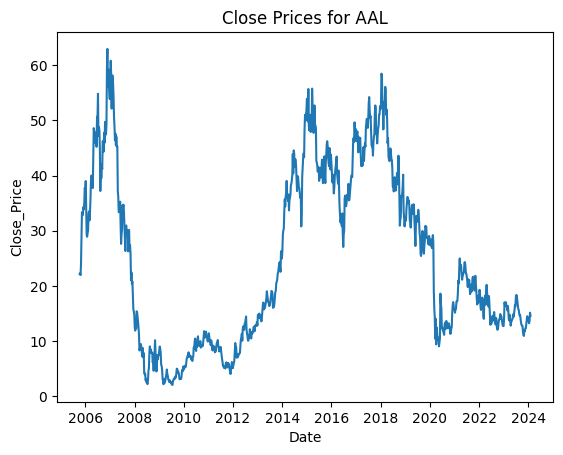

Epoch 1/100
6/6 [==============================] - 4s 9ms/step - loss: 1943.5984
Epoch 2/100
6/6 [==============================] - 0s 8ms/step - loss: 1942.1616
Epoch 3/100
6/6 [==============================] - 0s 8ms/step - loss: 1940.7473
Epoch 4/100
6/6 [==============================] - 0s 6ms/step - loss: 1939.1257
Epoch 5/100
6/6 [==============================] - 0s 6ms/step - loss: 1937.2256
Epoch 6/100
6/6 [==============================] - 0s 6ms/step - loss: 1934.9601
Epoch 7/100
6/6 [==============================] - 0s 6ms/step - loss: 1932.2302
Epoch 8/100
6/6 [==============================] - 0s 6ms/step - loss: 1928.6462
Epoch 9/100
6/6 [==============================] - 0s 6ms/step - loss: 1924.4084
Epoch 10/100
6/6 [==============================] - 0s 5ms/step - loss: 1919.3899
Epoch 11/100
6/6 [==============================] - 0s 6ms/step - loss: 1912.8304
Epoch 12/100
6/6 [==============================] - 0s 7ms/step - loss: 1904.8019
Epoch 13/100
6/6 [=======

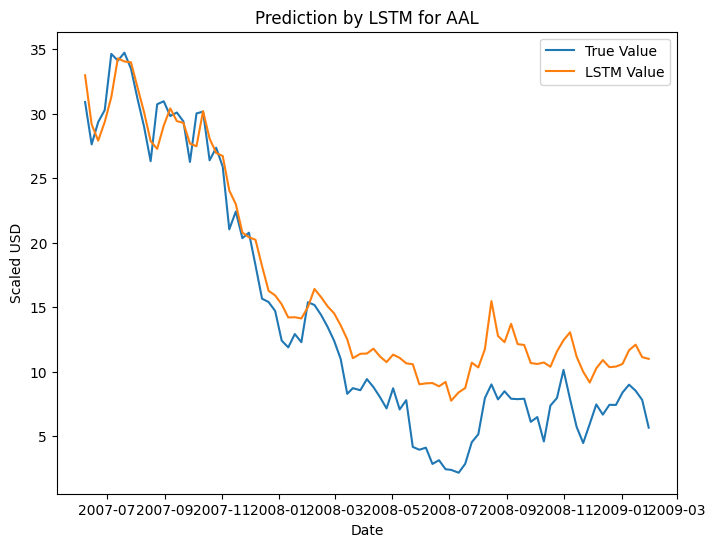

Mean Absolute Error (MAE): 2.9555148931481376
Mean Squared Error (MSE): 12.144708816380598
Root Mean Squared Error (RMSE): 3.484925941305008
R-squared (R2) Score: 0.8788880188793086
1/1 [==============================] - 0s 31ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for AAL : [[17.785866]]
Predicted Return for Next Month: [[22.155668]] %
Predicted Future Trend for AAL : Increase
Accuracy of Trend Prediction for AAL : 0.6235294117647059
Epoch 1/100
11/11 [==============================] - 3s 6ms/step - loss: 1124.6859
Epoch 2/100
11/11 [==============================] - 0s 6ms/step - loss: 1122.5579
Epoch 3/100
11/11 [==============================] - 0s 6ms/step - loss: 1120.1354
Epoch 4/100
11/11 [==============================] - 0s 5ms/step - loss: 1117.0461
Epoch 5/100
11/11 [==============================] - 0s 5ms/step - loss: 1112.5594
Epoch 6/100
11/11 [==============================] - 0s 5ms/step - loss: 1106.2224
Epoch 7/100
11/11 [==============================] - 0s 5ms/step - loss: 1096.5820
Epoch 8/100
11/11 [==============================] - 0s 5ms/step - loss: 1082.0226
Epoch 9/100
11/11 [==============================] - 0s 5ms/step - loss: 1059.2522
Epoch 10/100
11/11 [==============================]

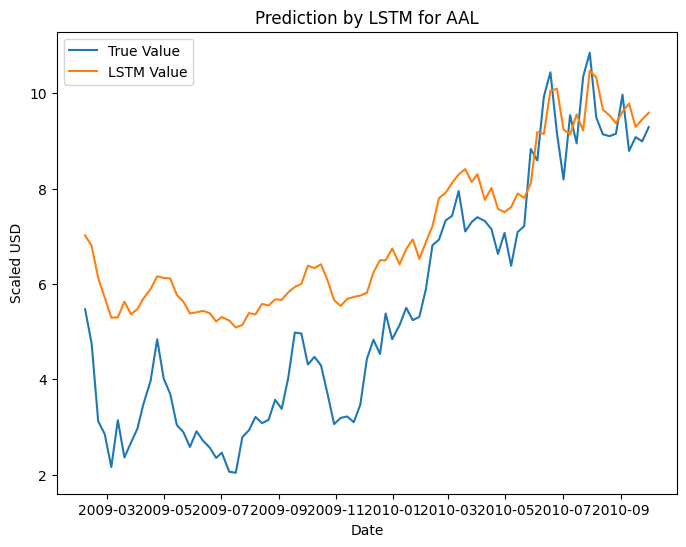

Mean Absolute Error (MAE): 1.5982369729842263
Mean Squared Error (MSE): 3.376693909002603
Root Mean Squared Error (RMSE): 1.837578272891417
R-squared (R2) Score: 0.48105561976610745
1/1 [==============================] - 0s 27ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for AAL : [[13.813338]]
Predicted Return for Next Month: [[-5.128174]] %
Predicted Future Trend for AAL : Decrease
Accuracy of Trend Prediction for AAL : 0.6
Epoch 1/100
17/17 [==============================] - 3s 5ms/step - loss: 762.0404
Epoch 2/100
17/17 [==============================] - 0s 4ms/step - loss: 760.3592
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 757.9978
Epoch 4/100
17/17 [==============================] - 0s 5ms/step - loss: 754.3846
Epoch 5/100
17/17 [==============================] - 0s 5ms/step - loss: 748.3590
Epoch 6/100
17/17 [==============================] - 0s 5ms/step - loss: 738.3776
Epoch 7/100
17/17 [==============================] - 0s 4ms/step - loss: 719.3828
Epoch 8/100
17/17 [==============================] - 0s 4ms/step - loss: 688.4235
Epoch 9/100
17/17 [==============================] - 0s 5ms/step - loss: 637.8679
Epoch 10/100
17/17 [==============================] - 0s 4ms/step - loss: 5

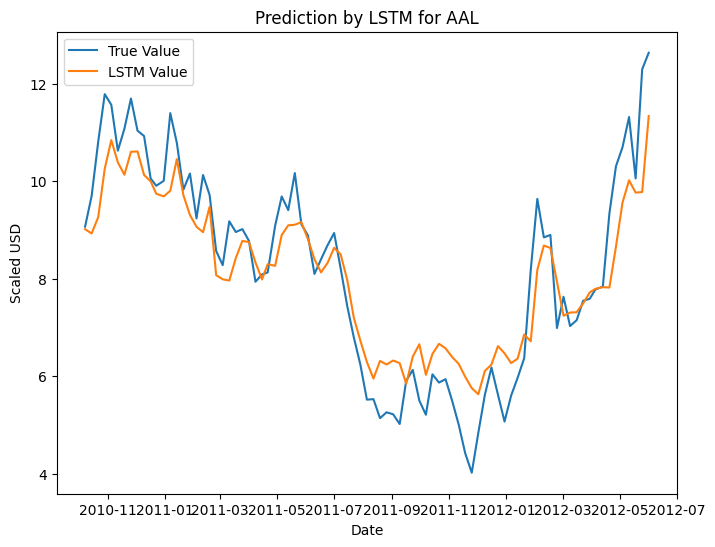

Mean Absolute Error (MAE): 0.6705186589558921
Mean Squared Error (MSE): 0.7264704836113572
Root Mean Squared Error (RMSE): 0.8523323786008351
R-squared (R2) Score: 0.8424062673202589
1/1 [==============================] - 0s 30ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for AAL : [[12.714653]]
Predicted Return for Next Month: [[-12.6740885]] %
Predicted Future Trend for AAL : Decrease
Accuracy of Trend Prediction for AAL : 0.6235294117647059
Epoch 1/100
22/22 [==============================] - 3s 4ms/step - loss: 589.4094
Epoch 2/100
22/22 [==============================] - 0s 4ms/step - loss: 587.5289
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 584.8679
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 580.3000
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 571.9180
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 555.4610
Epoch 7/100
22/22 [==============================] - 0s 4ms/step - loss: 523.7560
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 464.3854
Epoch 9/100
22/22 [==============================] - 0s 4ms/step - loss: 377.6020
Epoch 10/100
22/22 [==============================] - 0s 5

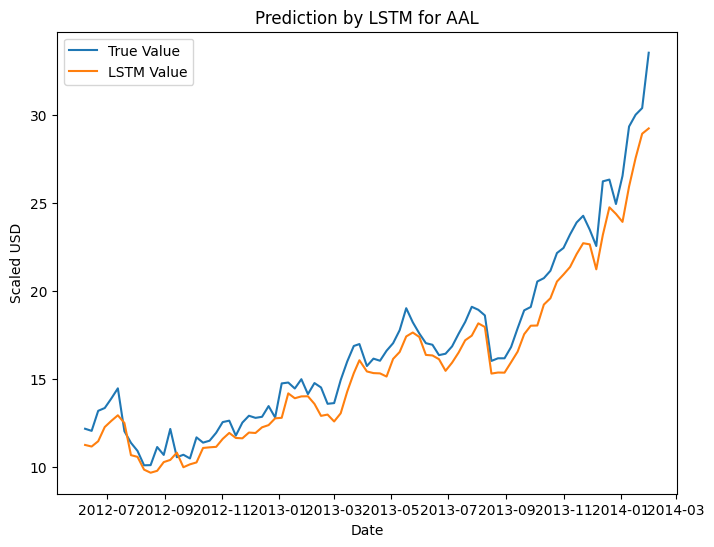

Mean Absolute Error (MAE): 1.1182597622926205
Mean Squared Error (MSE): 1.784673316612056
Root Mean Squared Error (RMSE): 1.3359166578091823
R-squared (R2) Score: 0.9325690122724425
1/1 [==============================] - 0s 23ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for AAL : [[13.622413]]
Predicted Return for Next Month: [[-6.4394755]] %
Predicted Future Trend for AAL : Decrease
Accuracy of Trend Prediction for AAL : 0.7764705882352941
Epoch 1/100
28/28 [==============================] - 3s 4ms/step - loss: 532.6918
Epoch 2/100
28/28 [==============================] - 0s 4ms/step - loss: 530.5375
Epoch 3/100
28/28 [==============================] - 0s 4ms/step - loss: 526.9014
Epoch 4/100
28/28 [==============================] - 0s 4ms/step - loss: 519.5770
Epoch 5/100
28/28 [==============================] - 0s 5ms/step - loss: 504.0512
Epoch 6/100
28/28 [==============================] - 0s 5ms/step - loss: 470.8314
Epoch 7/100
28/28 [==============================] - 0s 5ms/step - loss: 408.3970
Epoch 8/100
28/28 [==============================] - 0s 5ms/step - loss: 305.0322
Epoch 9/100
28/28 [==============================] - 0s 4ms/step - loss: 189.5589
Epoch 10/100
28/28 [==============================] - 0s 5m

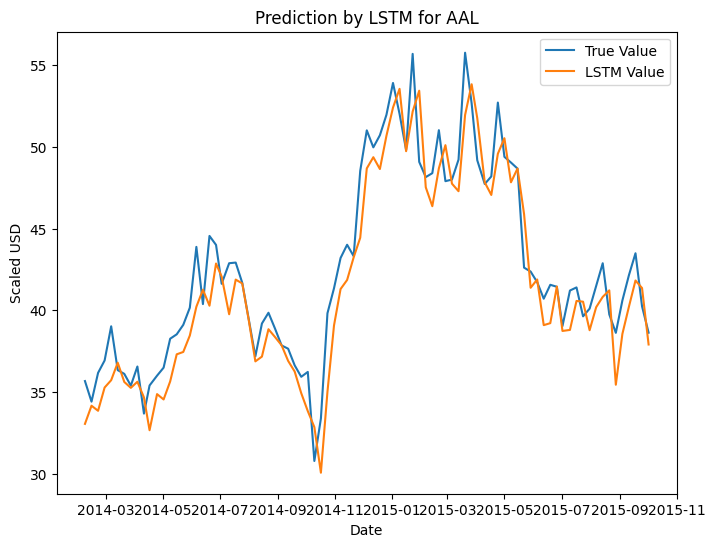

Mean Absolute Error (MAE): 1.6144251856310616
Mean Squared Error (MSE): 3.9473253659187226
Root Mean Squared Error (RMSE): 1.9867877002635996
R-squared (R2) Score: 0.8795539918194498
1/1 [==============================] - 0s 29ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for AAL : [[14.529324]]
Predicted Return for Next Month: [[-0.2106926]] %
Predicted Future Trend for AAL : Decrease
Accuracy of Trend Prediction for AAL : 0.6823529411764706
Epoch 1/100
33/33 [==============================] - 3s 5ms/step - loss: 750.1614
Epoch 2/100
33/33 [==============================] - 0s 4ms/step - loss: 746.6352
Epoch 3/100
33/33 [==============================] - 0s 4ms/step - loss: 739.2014
Epoch 4/100
33/33 [==============================] - 0s 4ms/step - loss: 718.4602
Epoch 5/100
33/33 [==============================] - 0s 4ms/step - loss: 662.2549
Epoch 6/100
33/33 [==============================] - 0s 4ms/step - loss: 527.0546
Epoch 7/100
33/33 [==============================] - 0s 4ms/step - loss: 324.6961
Epoch 8/100
33/33 [==============================] - 0s 4ms/step - loss: 136.7222
Epoch 9/100
33/33 [==============================] - 0s 4ms/step - loss: 44.5462
Epoch 10/100
33/33 [==============================] - 0s 4ms

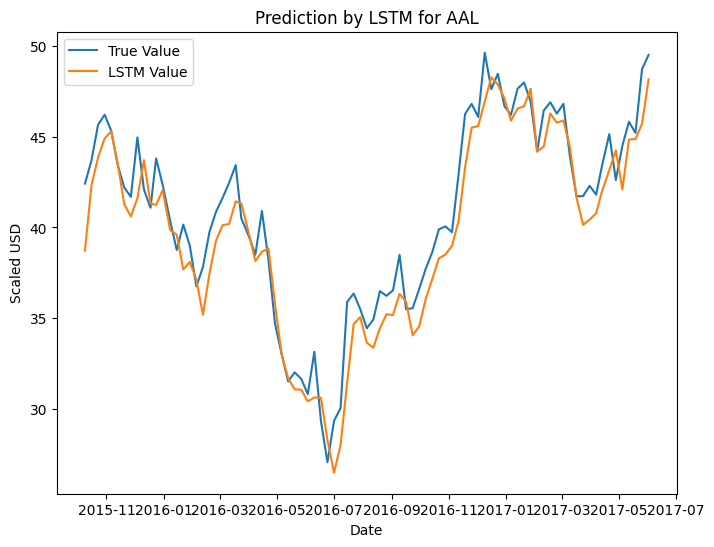

Mean Absolute Error (MAE): 1.3442508925514656
Mean Squared Error (MSE): 2.6555630809746034
Root Mean Squared Error (RMSE): 1.62958985053743
R-squared (R2) Score: 0.9047539941235251
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for AAL : [[15.14829]]
Predicted Return for Next Month: [[4.040448]] %
Predicted Future Trend for AAL : Increase
Accuracy of Trend Prediction for AAL : 0.7058823529411765
Epoch 1/100
39/39 [==============================] - 3s 4ms/step - loss: 882.8334
Epoch 2/100
39/39 [==============================] - 0s 4ms/step - loss: 874.2499
Epoch 3/100
39/39 [==============================] - 0s 4ms/step - loss: 845.0339
Epoch 4/100
39/39 [==============================] - 0s 4ms/step - loss: 736.6992
Epoch 5/100
39/39 [==============================] - 0s 4ms/step - loss: 468.4532
Epoch 6/100
39/39 [==============================] - 0s 4ms/step - loss: 151.5480
Epoch 7/100
39/39 [==============================] - 0s 4ms/step - loss: 28.3044
Epoch 8/100
39/39 [==============================] - 0s 4ms/step - loss: 17.0896
Epoch 9/100
39/39 [==============================] - 0s 4ms/step - loss: 18.4831
Epoch 10/100
39/39 [==============================] - 0s 4ms/step

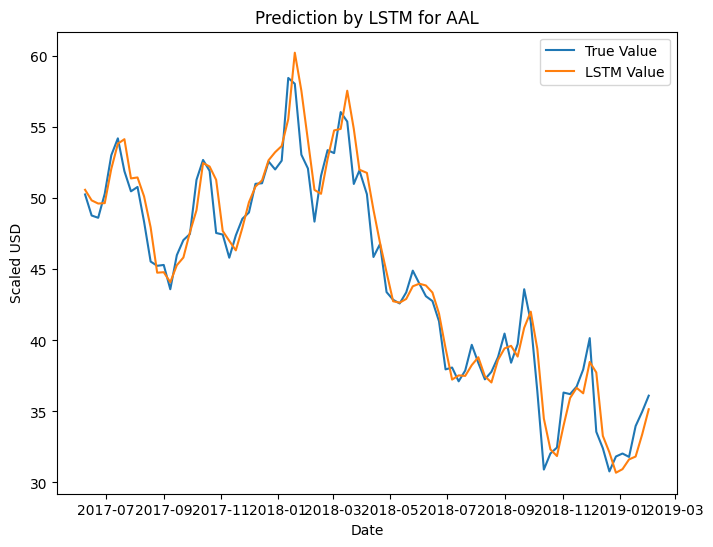

Mean Absolute Error (MAE): 1.184716965247845
Mean Squared Error (MSE): 2.455722494303201
Root Mean Squared Error (RMSE): 1.5670745018355705
R-squared (R2) Score: 0.953112304661253
1/1 [==============================] - 0s 22ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for AAL : [[15.223061]]
Predicted Return for Next Month: [[4.5539846]] %
Predicted Future Trend for AAL : Increase
Accuracy of Trend Prediction for AAL : 0.7176470588235294
Epoch 1/100
44/44 [==============================] - 3s 5ms/step - loss: 1024.7328
Epoch 2/100
44/44 [==============================] - 0s 4ms/step - loss: 1009.9470
Epoch 3/100
44/44 [==============================] - 0s 4ms/step - loss: 939.0956
Epoch 4/100
44/44 [==============================] - 0s 4ms/step - loss: 666.5286
Epoch 5/100
44/44 [==============================] - 0s 4ms/step - loss: 236.3896
Epoch 6/100
44/44 [==============================] - 0s 4ms/step - loss: 32.0921
Epoch 7/100
44/44 [==============================] - 0s 4ms/step - loss: 17.2559
Epoch 8/100
44/44 [==============================] - 0s 4ms/step - loss: 14.6765
Epoch 9/100
44/44 [==============================] - 0s 4ms/step - loss: 13.6528
Epoch 10/100
44/44 [==============================] - 0s 4ms/s

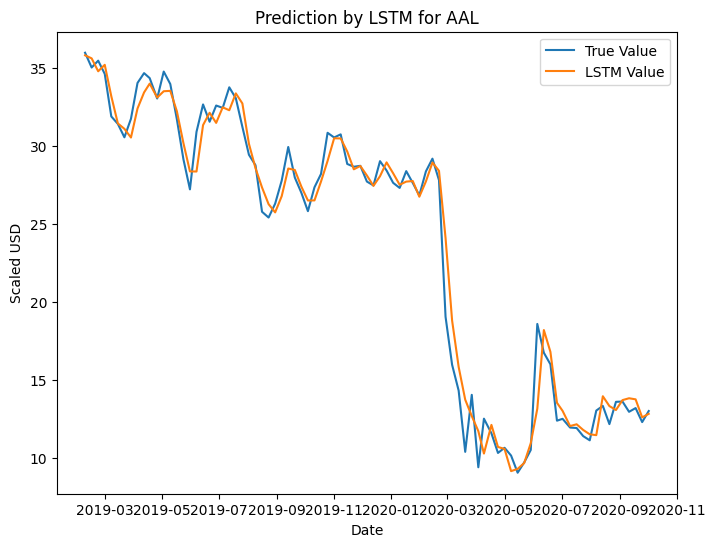

Mean Absolute Error (MAE): 0.8823166397796279
Mean Squared Error (MSE): 1.6633961737012295
Root Mean Squared Error (RMSE): 1.2897271702578144
R-squared (R2) Score: 0.9788073294390616
1/1 [==============================] - 0s 31ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for AAL : [[15.5850725]]
Predicted Return for Next Month: [[7.04033]] %
Predicted Future Trend for AAL : Increase
Accuracy of Trend Prediction for AAL : 0.6705882352941176
Epoch 1/100
49/49 [==============================] - 3s 4ms/step - loss: 981.8031
Epoch 2/100
49/49 [==============================] - 0s 4ms/step - loss: 962.4743
Epoch 3/100
49/49 [==============================] - 0s 4ms/step - loss: 853.5059
Epoch 4/100
49/49 [==============================] - 0s 4ms/step - loss: 452.8904
Epoch 5/100
49/49 [==============================] - 0s 5ms/step - loss: 72.5337
Epoch 6/100
49/49 [==============================] - 0s 4ms/step - loss: 19.9573
Epoch 7/100
49/49 [==============================] - 0s 4ms/step - loss: 15.7521
Epoch 8/100
49/49 [==============================] - 0s 4ms/step - loss: 15.6383
Epoch 9/100
49/49 [==============================] - 0s 4ms/step - loss: 14.6685
Epoch 10/100
49/49 [==============================] - 0s 4ms/step 

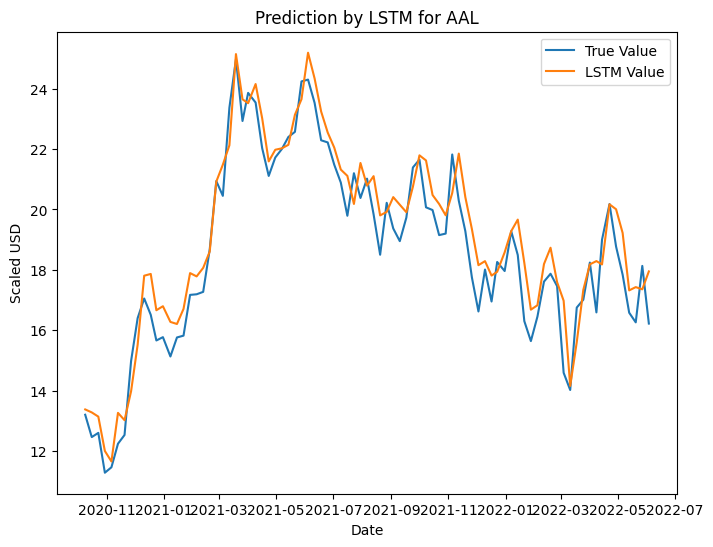

Mean Absolute Error (MAE): 0.7850923428590268
Mean Squared Error (MSE): 0.8593204040749034
Root Mean Squared Error (RMSE): 0.9269953635671019
R-squared (R2) Score: 0.9126746423814507
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for AAL : [[15.670988]]
Predicted Return for Next Month: [[7.6304092]] %
Predicted Future Trend for AAL : Increase
Accuracy of Trend Prediction for AAL : 0.7176470588235294
Epoch 1/100
55/55 [==============================] - 3s 4ms/step - loss: 916.9733
Epoch 2/100
55/55 [==============================] - 0s 4ms/step - loss: 882.3555
Epoch 3/100
55/55 [==============================] - 0s 4ms/step - loss: 661.9642
Epoch 4/100
55/55 [==============================] - 0s 4ms/step - loss: 156.9629
Epoch 5/100
55/55 [==============================] - 0s 5ms/step - loss: 19.0724
Epoch 6/100
55/55 [==============================] - 0s 4ms/step - loss: 16.5087
Epoch 7/100
55/55 [==============================] - 0s 4ms/step - loss: 14.8372
Epoch 8/100
55/55 [==============================] - 0s 4ms/step - loss: 14.4377
Epoch 9/100
55/55 [==============================] - 0s 5ms/step - loss: 12.2909
Epoch 10/100
55/55 [==============================] - 0s 4ms/step

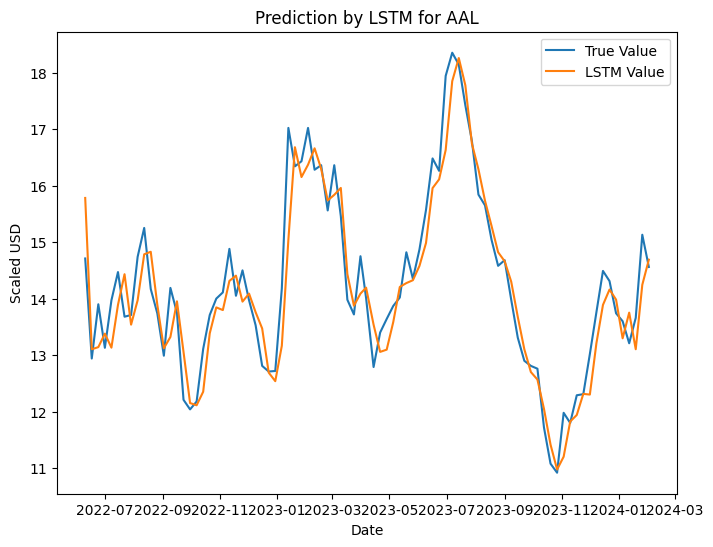

Mean Absolute Error (MAE): 0.4114006581799738
Mean Squared Error (MSE): 0.2746603633720297
Root Mean Squared Error (RMSE): 0.5240804932183888
R-squared (R2) Score: 0.8873642198024068
1/1 [==============================] - 0s 61ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for AAL : [[14.688693]]
Predicted Return for Next Month: [[0.88387793]] %
Predicted Future Trend for AAL : Increase
Accuracy of Trend Prediction for AAL : 0.6588235294117647


C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


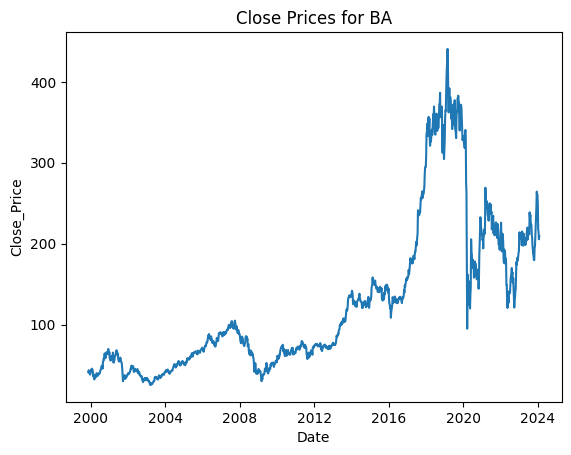

Epoch 1/100
8/8 [==============================] - 8s 7ms/step - loss: 2550.3276
Epoch 2/100
8/8 [==============================] - 0s 6ms/step - loss: 2548.7595
Epoch 3/100
8/8 [==============================] - 0s 6ms/step - loss: 2547.0344
Epoch 4/100
8/8 [==============================] - 0s 5ms/step - loss: 2545.0728
Epoch 5/100
8/8 [==============================] - 0s 5ms/step - loss: 2542.8301
Epoch 6/100
8/8 [==============================] - 0s 8ms/step - loss: 2540.1228
Epoch 7/100
8/8 [==============================] - 0s 11ms/step - loss: 2536.8438
Epoch 8/100
8/8 [==============================] - 0s 5ms/step - loss: 2532.9441
Epoch 9/100
8/8 [==============================] - 0s 5ms/step - loss: 2528.0745
Epoch 10/100
8/8 [==============================] - 0s 5ms/step - loss: 2521.7742
Epoch 11/100
8/8 [==============================] - 0s 5ms/step - loss: 2514.1409
Epoch 12/100
8/8 [==============================] - 0s 4ms/step - loss: 2504.2668
Epoch 13/100
8/8 [======

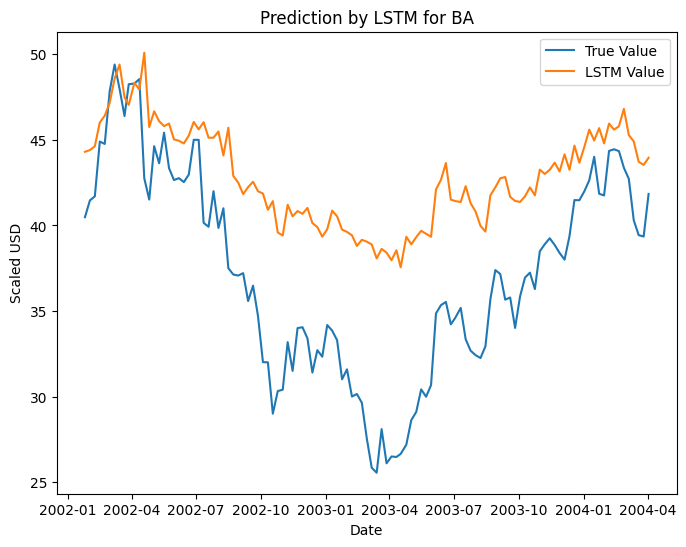

Mean Absolute Error (MAE): 5.7561530284052305
Mean Squared Error (MSE): 43.921688575632665
Root Mean Squared Error (RMSE): 6.627344006133427
R-squared (R2) Score: -0.2308829963934298
1/1 [==============================] - 0s 30ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[152.29567]]
Predicted Return for Next Month: [[-27.263508]] %
Predicted Future Trend for BA : Decrease
Accuracy of Trend Prediction for BA : 0.584070796460177
Epoch 1/100
15/15 [==============================] - 3s 4ms/step - loss: 1982.1487
Epoch 2/100
15/15 [==============================] - 0s 4ms/step - loss: 1979.3844
Epoch 3/100
15/15 [==============================] - 0s 4ms/step - loss: 1975.7067
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 1970.5314
Epoch 5/100
15/15 [==============================] - 0s 5ms/step - loss: 1963.0074
Epoch 6/100
15/15 [==============================] - 0s 5ms/step - loss: 1951.2433
Epoch 7/100
15/15 [==============================] - 0s 4ms/step - loss: 1933.7661
Epoch 8/100
15/15 [==============================] - 0s 5ms/step - loss: 1905.9371
Epoch 9/100
15/15 [==============================] - 0s 5ms/step - loss: 1864.7672
Epoch 10/100
15/15 [==============================] - 

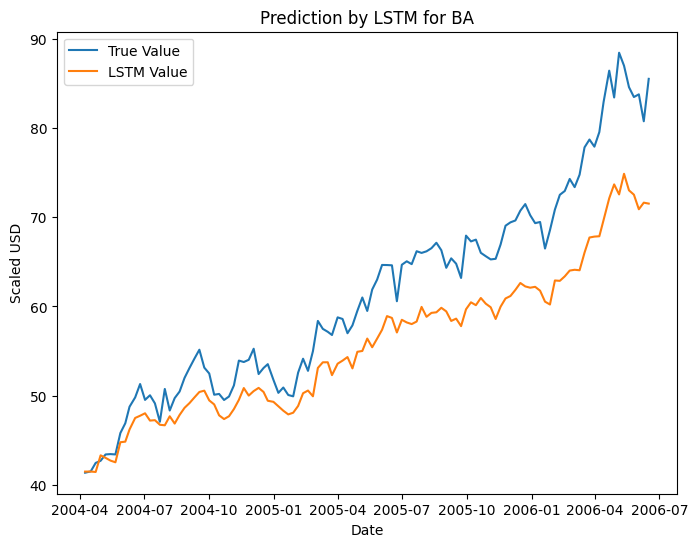

Mean Absolute Error (MAE): 5.571479248046875
Mean Squared Error (MSE): 43.323587749576824
Root Mean Squared Error (RMSE): 6.582065614195655
R-squared (R2) Score: 0.6784591138110501
1/1 [==============================] - 0s 25ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[184.31789]]
Predicted Return for Next Month: [[-11.969681]] %
Predicted Future Trend for BA : Decrease
Accuracy of Trend Prediction for BA : 0.5398230088495575
Epoch 1/100
22/22 [==============================] - 3s 4ms/step - loss: 2616.9163
Epoch 2/100
22/22 [==============================] - 0s 4ms/step - loss: 2611.3228
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 2602.0977
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 2584.9089
Epoch 5/100
22/22 [==============================] - 0s 3ms/step - loss: 2551.8142
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 2485.5005
Epoch 7/100
22/22 [==============================] - 0s 4ms/step - loss: 2362.1809
Epoch 8/100
22/22 [==============================] - 0s 3ms/step - loss: 2132.4619
Epoch 9/100
22/22 [==============================] - 0s 3ms/step - loss: 1782.1536
Epoch 10/100
22/22 [==============================] -

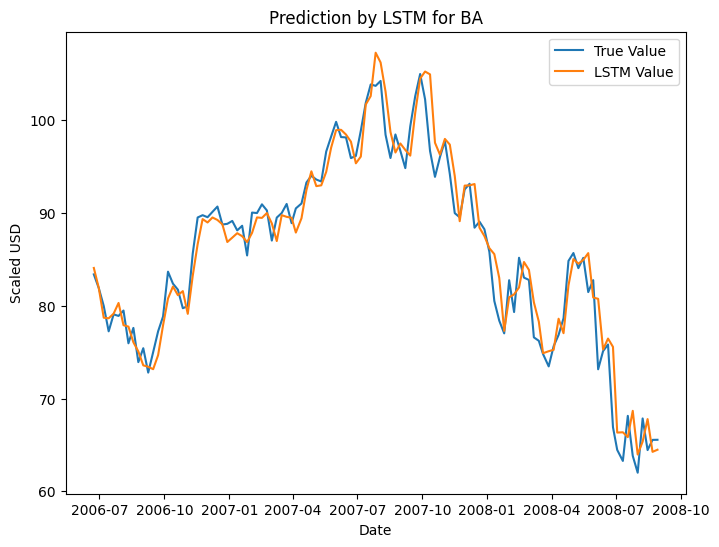

Mean Absolute Error (MAE): 1.7707150295091711
Mean Squared Error (MSE): 5.679064826999581
Root Mean Squared Error (RMSE): 2.383078854549211
R-squared (R2) Score: 0.9461657204942867
1/1 [==============================] - 0s 21ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[238.31728]]
Predicted Return for Next Month: [[13.820456]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.6283185840707964
Epoch 1/100
29/29 [==============================] - 3s 4ms/step - loss: 3819.8926
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 3808.3730
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 3785.7798
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 3735.5942
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 3618.7014
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 3351.3110
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 2847.3755
Epoch 8/100
29/29 [==============================] - 0s 4ms/step - loss: 2058.0723
Epoch 9/100
29/29 [==============================] - 0s 4ms/step - loss: 1222.8132
Epoch 10/100
29/29 [==============================] - 

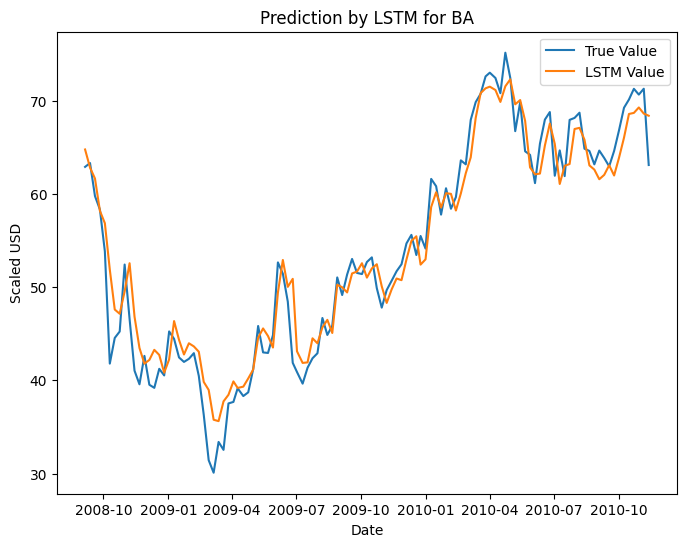

Mean Absolute Error (MAE): 2.1141131711213488
Mean Squared Error (MSE): 7.367504002923029
Root Mean Squared Error (RMSE): 2.714314647000791
R-squared (R2) Score: 0.9463393025990597
1/1 [==============================] - 0s 60ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[234.31403]]
Predicted Return for Next Month: [[11.908502]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.6283185840707964
Epoch 1/100
36/36 [==============================] - 6s 11ms/step - loss: 3661.6299
Epoch 2/100
36/36 [==============================] - 0s 11ms/step - loss: 3643.7312
Epoch 3/100
36/36 [==============================] - 0s 10ms/step - loss: 3597.9634
Epoch 4/100
36/36 [==============================] - 0s 9ms/step - loss: 3467.9272
Epoch 5/100
36/36 [==============================] - 0s 9ms/step - loss: 3112.3223
Epoch 6/100
36/36 [==============================] - 0s 11ms/step - loss: 2355.2727
Epoch 7/100
36/36 [==============================] - 0s 11ms/step - loss: 1344.4110
Epoch 8/100
36/36 [==============================] - 0s 10ms/step - loss: 558.1125
Epoch 9/100
36/36 [==============================] - 0s 11ms/step - loss: 220.3123
Epoch 10/100
36/36 [=============================

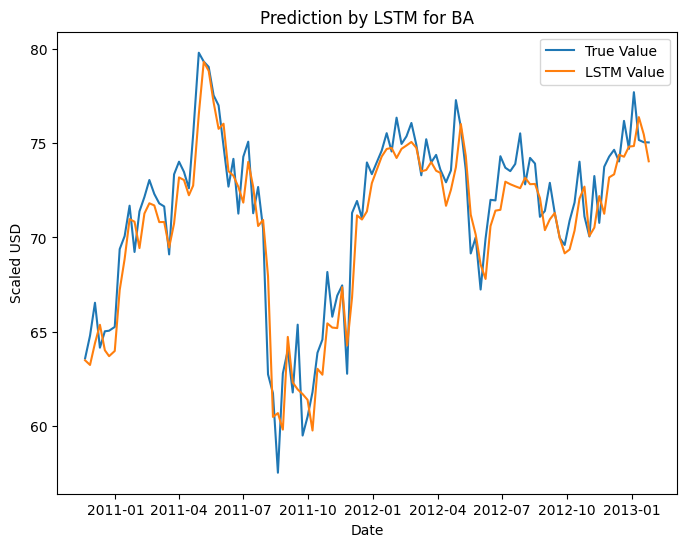

Mean Absolute Error (MAE): 1.2779609507685121
Mean Squared Error (MSE): 2.620262174953136
Root Mean Squared Error (RMSE): 1.6187223897114464
R-squared (R2) Score: 0.873123499568522
1/1 [==============================] - 0s 32ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[242.89632]]
Predicted Return for Next Month: [[16.007408]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.6194690265486725
Epoch 1/100
44/44 [==============================] - 3s 4ms/step - loss: 3901.0688
Epoch 2/100
44/44 [==============================] - 0s 4ms/step - loss: 3874.2378
Epoch 3/100
44/44 [==============================] - 0s 4ms/step - loss: 3775.2014
Epoch 4/100
44/44 [==============================] - 0s 4ms/step - loss: 3402.8982
Epoch 5/100
44/44 [==============================] - 0s 5ms/step - loss: 2403.6614
Epoch 6/100
44/44 [==============================] - 0s 4ms/step - loss: 1056.8335
Epoch 7/100
44/44 [==============================] - 0s 4ms/step - loss: 287.2164
Epoch 8/100
44/44 [==============================] - 0s 4ms/step - loss: 138.7193
Epoch 9/100
44/44 [==============================] - 0s 4ms/step - loss: 137.7606
Epoch 10/100
44/44 [==============================] - 0s 

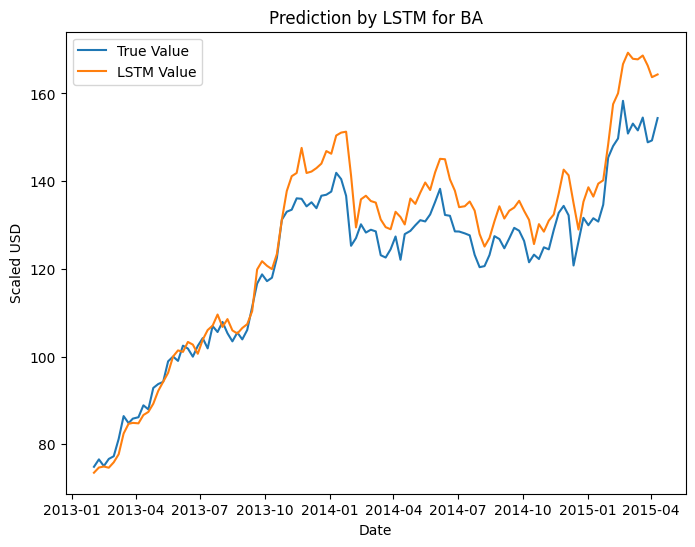

Mean Absolute Error (MAE): 5.837667217752209
Mean Squared Error (MSE): 51.62195699451932
Root Mean Squared Error (RMSE): 7.1848421690750675
R-squared (R2) Score: 0.8630338147592269
1/1 [==============================] - 0s 30ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[248.56195]]
Predicted Return for Next Month: [[18.713318]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.6017699115044248
Epoch 1/100
51/51 [==============================] - 2s 4ms/step - loss: 5488.6284
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 5430.0107
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 5174.0703
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 4243.7788
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 2454.4604
Epoch 6/100
51/51 [==============================] - 0s 5ms/step - loss: 899.4663
Epoch 7/100
51/51 [==============================] - 0s 5ms/step - loss: 332.7537
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 278.4515
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 293.4443
Epoch 10/100
51/51 [==============================] - 0s 5

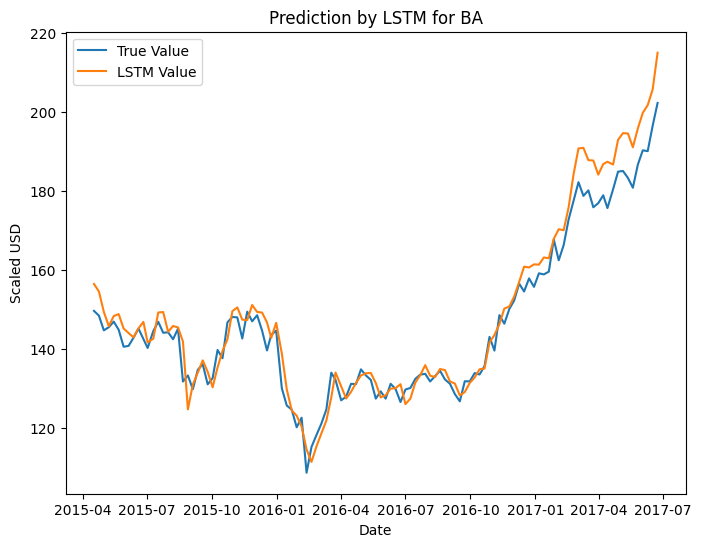

Mean Absolute Error (MAE): 3.775188049316407
Mean Squared Error (MSE): 24.928145897091532
Root Mean Squared Error (RMSE): 4.992809419264021
R-squared (R2) Score: 0.9358319210723096
1/1 [==============================] - 0s 38ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[226.67032]]
Predicted Return for Next Month: [[8.257863]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.5663716814159292
Epoch 1/100
58/58 [==============================] - 2s 4ms/step - loss: 7504.2329
Epoch 2/100
58/58 [==============================] - 0s 4ms/step - loss: 7426.9336
Epoch 3/100
58/58 [==============================] - 0s 4ms/step - loss: 7085.3716
Epoch 4/100
58/58 [==============================] - 0s 4ms/step - loss: 5916.1880
Epoch 5/100
58/58 [==============================] - 0s 4ms/step - loss: 3802.9678
Epoch 6/100
58/58 [==============================] - 0s 4ms/step - loss: 1770.1841
Epoch 7/100
58/58 [==============================] - 0s 4ms/step - loss: 637.9012
Epoch 8/100
58/58 [==============================] - 0s 4ms/step - loss: 423.5632
Epoch 9/100
58/58 [==============================] - 0s 4ms/step - loss: 419.7939
Epoch 10/100
58/58 [==============================] - 0s 4

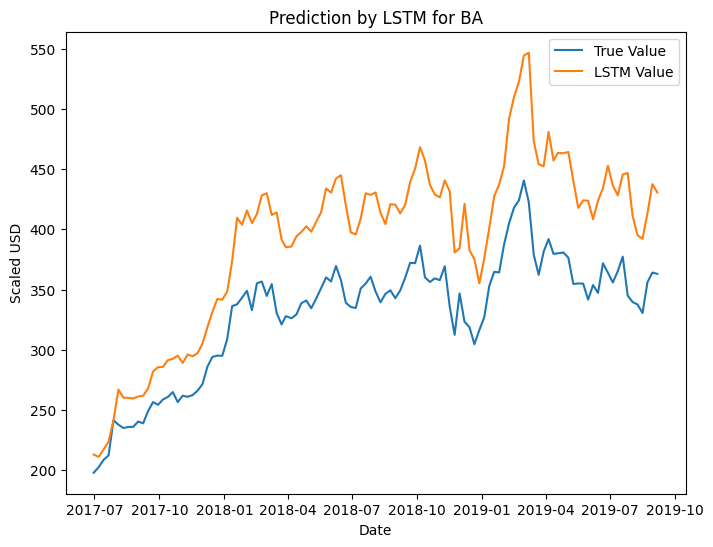

Mean Absolute Error (MAE): 61.18718974503226
Mean Squared Error (MSE): 4321.877572026177
Root Mean Squared Error (RMSE): 65.74098852334194
R-squared (R2) Score: -0.6882078932461155
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[223.05473]]
Predicted Return for Next Month: [[6.5310574]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.6814159292035398
Epoch 1/100
65/65 [==============================] - 2s 4ms/step - loss: 19038.9102
Epoch 2/100
65/65 [==============================] - 0s 4ms/step - loss: 18817.7480
Epoch 3/100
65/65 [==============================] - 0s 4ms/step - loss: 18052.6836
Epoch 4/100
65/65 [==============================] - 0s 4ms/step - loss: 16118.0156
Epoch 5/100
65/65 [==============================] - 0s 4ms/step - loss: 12812.0371
Epoch 6/100
65/65 [==============================] - 0s 4ms/step - loss: 8737.3477
Epoch 7/100
65/65 [==============================] - 0s 4ms/step - loss: 5000.8164
Epoch 8/100
65/65 [==============================] - 0s 4ms/step - loss: 2529.9785
Epoch 9/100
65/65 [==============================] - 0s 4ms/step - loss: 1378.9862
Epoch 10/100
65/65 [=============================

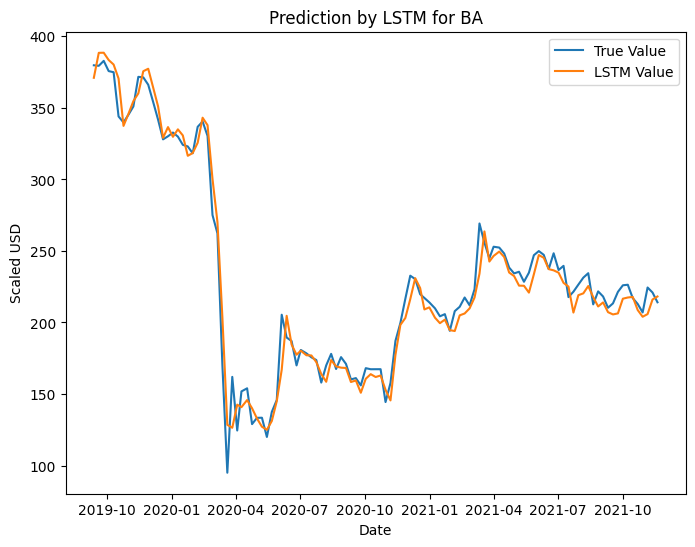

Mean Absolute Error (MAE): 7.952340833581014
Mean Squared Error (MSE): 121.48432318087497
Root Mean Squared Error (RMSE): 11.021992704628095
R-squared (R2) Score: 0.9749460647812045
1/1 [==============================] - 0s 37ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[199.92949]]
Predicted Return for Next Month: [[-4.5135713]] %
Predicted Future Trend for BA : Decrease
Accuracy of Trend Prediction for BA : 0.7079646017699115
Epoch 1/100
72/72 [==============================] - 3s 4ms/step - loss: 22994.0898
Epoch 2/100
72/72 [==============================] - 0s 4ms/step - loss: 22627.8184
Epoch 3/100
72/72 [==============================] - 0s 5ms/step - loss: 20981.1250
Epoch 4/100
72/72 [==============================] - 0s 4ms/step - loss: 16724.2812
Epoch 5/100
72/72 [==============================] - 0s 4ms/step - loss: 10715.9395
Epoch 6/100
72/72 [==============================] - 0s 4ms/step - loss: 5199.6235
Epoch 7/100
72/72 [==============================] - 0s 4ms/step - loss: 2020.6150
Epoch 8/100
72/72 [==============================] - 0s 3ms/step - loss: 1142.7119
Epoch 9/100
72/72 [==============================] - 0s 4ms/step - loss: 1010.3549
Epoch 10/100
72/72 [============================

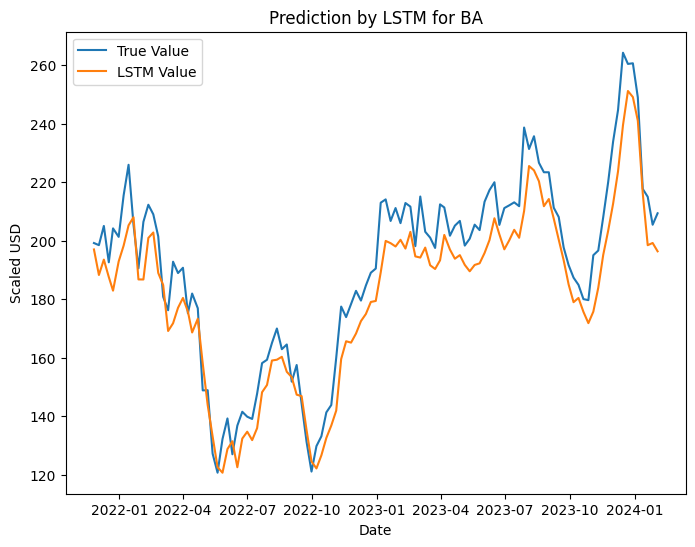

Mean Absolute Error (MAE): 10.2175139956267
Mean Squared Error (MSE): 136.17213266757844
Root Mean Squared Error (RMSE): 11.669281583181478
R-squared (R2) Score: 0.8670073075470742
1/1 [==============================] - 0s 21ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for BA : [[196.37727]]
Predicted Return for Next Month: [[-6.2101116]] %
Predicted Future Trend for BA : Decrease
Accuracy of Trend Prediction for BA : 0.6548672566371682


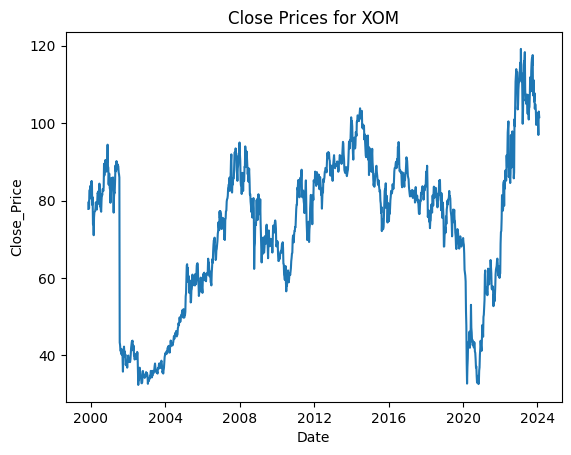

Epoch 1/100
8/8 [==============================] - 2s 4ms/step - loss: 5645.5088
Epoch 2/100
8/8 [==============================] - 0s 4ms/step - loss: 5643.6343
Epoch 3/100
8/8 [==============================] - 0s 3ms/step - loss: 5641.9160
Epoch 4/100
8/8 [==============================] - 0s 4ms/step - loss: 5640.0376
Epoch 5/100
8/8 [==============================] - 0s 3ms/step - loss: 5637.8813
Epoch 6/100
8/8 [==============================] - 0s 3ms/step - loss: 5635.2539
Epoch 7/100
8/8 [==============================] - 0s 4ms/step - loss: 5631.9990
Epoch 8/100
8/8 [==============================] - 0s 3ms/step - loss: 5627.6187
Epoch 9/100
8/8 [==============================] - 0s 3ms/step - loss: 5621.7446
Epoch 10/100
8/8 [==============================] - 0s 4ms/step - loss: 5613.1660
Epoch 11/100
8/8 [==============================] - 0s 3ms/step - loss: 5601.0532
Epoch 12/100
8/8 [==============================] - 0s 3ms/step - loss: 5583.7695
Epoch 13/100
8/8 [=======

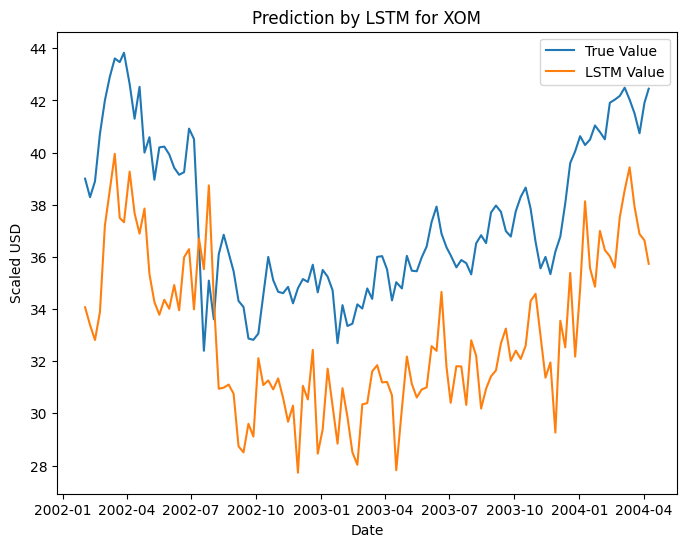

Mean Absolute Error (MAE): 4.594399692037832
Mean Squared Error (MSE): 23.042473263742394
Root Mean Squared Error (RMSE): 4.800257624726239
R-squared (R2) Score: -1.6748501132771247
1/1 [==============================] - 0s 19ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for XOM : [[108.17172]]
Predicted Return for Next Month: [[6.520649]] %
Predicted Future Trend for XOM : Increase
Accuracy of Trend Prediction for XOM : 0.5309734513274337
Epoch 1/100
15/15 [==============================] - 2s 4ms/step - loss: 3535.9946
Epoch 2/100
15/15 [==============================] - 0s 3ms/step - loss: 3532.0105
Epoch 3/100
15/15 [==============================] - 0s 3ms/step - loss: 3526.3384
Epoch 4/100
15/15 [==============================] - 0s 4ms/step - loss: 3517.4534
Epoch 5/100
15/15 [==============================] - 0s 4ms/step - loss: 3502.4822
Epoch 6/100
15/15 [==============================] - 0s 4ms/step - loss: 3476.4351
Epoch 7/100
15/15 [==============================] - 0s 4ms/step - loss: 3428.9375
Epoch 8/100
15/15 [==============================] - 0s 4ms/step - loss: 3344.1230
Epoch 9/100
15/15 [==============================] - 0s 4ms/step - loss: 3191.1741
Epoch 10/100
15/15 [==============================] 

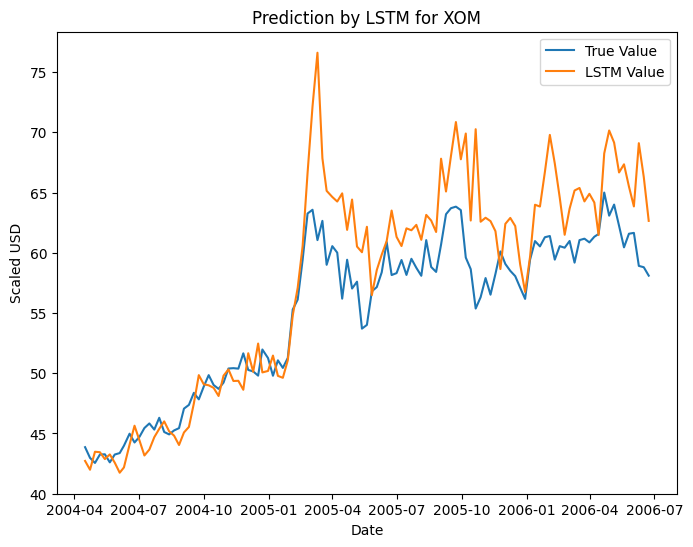

Mean Absolute Error (MAE): 3.2019383465310804
Mean Squared Error (MSE): 18.886103777702296
Root Mean Squared Error (RMSE): 4.345814512574403
R-squared (R2) Score: 0.557863963411517
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for XOM : [[103.815926]]
Predicted Return for Next Month: [[2.2313368]] %
Predicted Future Trend for XOM : Increase
Accuracy of Trend Prediction for XOM : 0.4778761061946903
Epoch 1/100
22/22 [==============================] - 2s 4ms/step - loss: 3381.3669
Epoch 2/100
22/22 [==============================] - 0s 3ms/step - loss: 3374.6821
Epoch 3/100
22/22 [==============================] - 0s 3ms/step - loss: 3363.9553
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 3343.5332
Epoch 5/100
22/22 [==============================] - 0s 3ms/step - loss: 3299.1687
Epoch 6/100
22/22 [==============================] - 0s 3ms/step - loss: 3204.0774
Epoch 7/100
22/22 [==============================] - 0s 3ms/step - loss: 3002.9534
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 2627.7659
Epoch 9/100
22/22 [==============================] - 0s 3ms/step - loss: 2085.7622
Epoch 10/100
22/22 [==============================

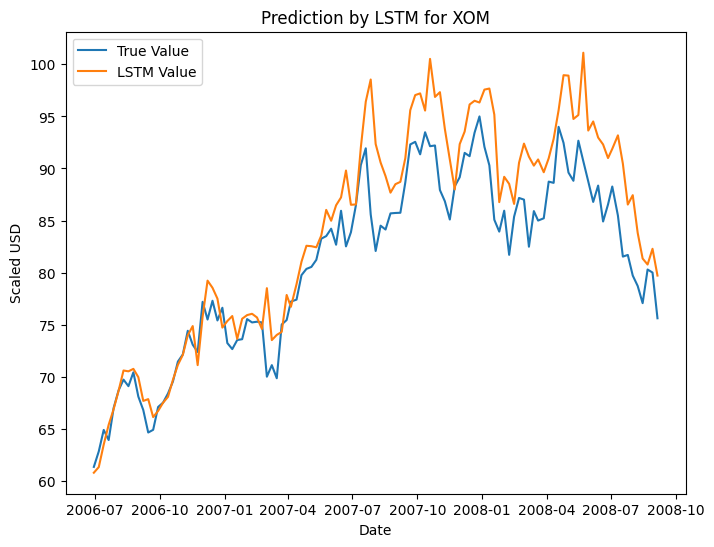

Mean Absolute Error (MAE): 3.403819817584494
Mean Squared Error (MSE): 19.720871934661442
Root Mean Squared Error (RMSE): 4.440818836055063
R-squared (R2) Score: 0.7286639036400069
1/1 [==============================] - 0s 21ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for XOM : [[103.62083]]
Predicted Return for Next Month: [[2.0392158]] %
Predicted Future Trend for XOM : Increase
Accuracy of Trend Prediction for XOM : 0.5486725663716814
Epoch 1/100
29/29 [==============================] - 2s 4ms/step - loss: 4185.2344
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 4172.4292
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 4140.0718
Epoch 4/100
29/29 [==============================] - 0s 3ms/step - loss: 4041.4270
Epoch 5/100
29/29 [==============================] - 0s 3ms/step - loss: 3755.6838
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 3103.1951
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 2121.6531
Epoch 8/100
29/29 [==============================] - 0s 4ms/step - loss: 1094.5991
Epoch 9/100
29/29 [==============================] - 0s 4ms/step - loss: 403.9096
Epoch 10/100
29/29 [==============================] 

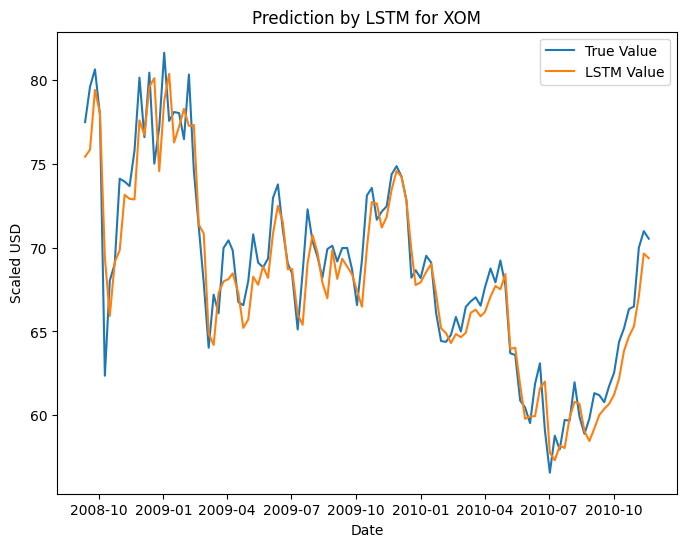

Mean Absolute Error (MAE): 1.376128242824389
Mean Squared Error (MSE): 3.2156667197239135
Root Mean Squared Error (RMSE): 1.793228016657088
R-squared (R2) Score: 0.9002204353564074
1/1 [==============================] - 0s 23ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for XOM : [[103.95164]]
Predicted Return for Next Month: [[2.3649771]] %
Predicted Future Trend for XOM : Increase
Accuracy of Trend Prediction for XOM : 0.6371681415929203
Epoch 1/100
36/36 [==============================] - 1s 3ms/step - loss: 4297.0518
Epoch 2/100
36/36 [==============================] - 0s 3ms/step - loss: 4270.4067
Epoch 3/100
36/36 [==============================] - 0s 3ms/step - loss: 4159.4360
Epoch 4/100
36/36 [==============================] - 0s 3ms/step - loss: 3690.1021
Epoch 5/100
36/36 [==============================] - 0s 3ms/step - loss: 2456.1511
Epoch 6/100
36/36 [==============================] - 0s 3ms/step - loss: 943.7979
Epoch 7/100
36/36 [==============================] - 0s 3ms/step - loss: 209.9030
Epoch 8/100
36/36 [==============================] - 0s 3ms/step - loss: 105.0394
Epoch 9/100
36/36 [==============================] - 0s 3ms/step - loss: 96.3666
Epoch 10/100
36/36 [==============================] - 0s

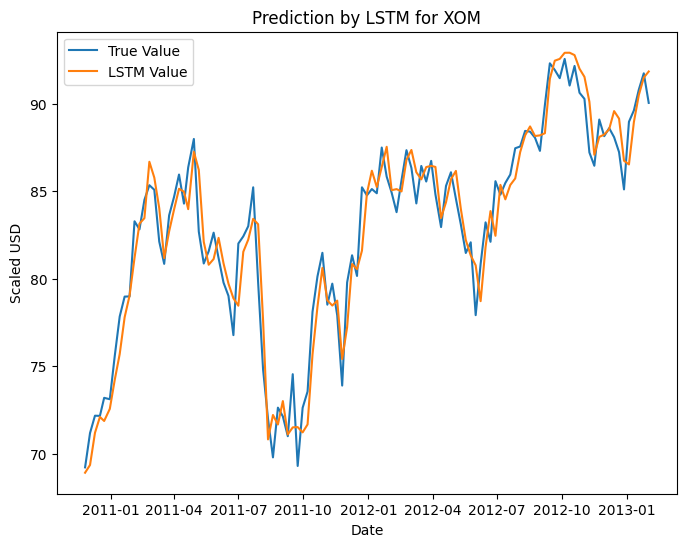

Mean Absolute Error (MAE): 1.2143856201171879
Mean Squared Error (MSE): 2.1970545705256743
Root Mean Squared Error (RMSE): 1.4822464607904025
R-squared (R2) Score: 0.9339648329319276
1/1 [==============================] - 0s 19ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for XOM : [[103.6263]]
Predicted Return for Next Month: [[2.0446024]] %
Predicted Future Trend for XOM : Increase
Accuracy of Trend Prediction for XOM : 0.6548672566371682
Epoch 1/100
44/44 [==============================] - 2s 3ms/step - loss: 4724.4409
Epoch 2/100
44/44 [==============================] - 0s 3ms/step - loss: 4657.8232
Epoch 3/100
44/44 [==============================] - 0s 3ms/step - loss: 4255.2812
Epoch 4/100
44/44 [==============================] - 0s 3ms/step - loss: 2741.9949
Epoch 5/100
44/44 [==============================] - 0s 3ms/step - loss: 792.6055
Epoch 6/100
44/44 [==============================] - 0s 3ms/step - loss: 148.4588
Epoch 7/100
44/44 [==============================] - 0s 3ms/step - loss: 97.6562
Epoch 8/100
44/44 [==============================] - 0s 3ms/step - loss: 90.8303
Epoch 9/100
44/44 [==============================] - 0s 3ms/step - loss: 88.7349
Epoch 10/100
44/44 [==============================] - 0s 3ms

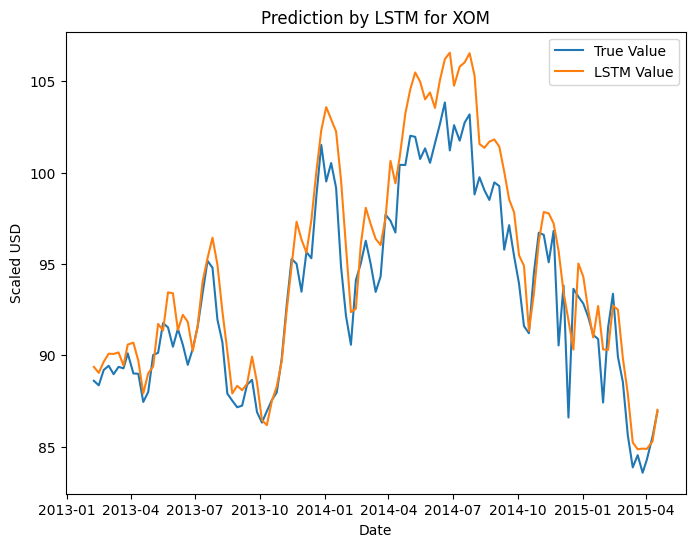

Mean Absolute Error (MAE): 1.748216979980468
Mean Squared Error (MSE): 4.956429697447422
Root Mean Squared Error (RMSE): 2.2263040442507895
R-squared (R2) Score: 0.8121919867784562
1/1 [==============================] - 0s 36ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for XOM : [[104.369606]]
Predicted Return for Next Month: [[2.776566]] %
Predicted Future Trend for XOM : Increase
Accuracy of Trend Prediction for XOM : 0.6637168141592921
Epoch 1/100
51/51 [==============================] - 3s 4ms/step - loss: 5292.2378
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 5182.6675
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 4355.8823
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 2018.4689
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 310.9579
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 99.1065
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 96.5239
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 82.0867
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 82.9639
Epoch 10/100
51/51 [==============================] - 0s 4ms

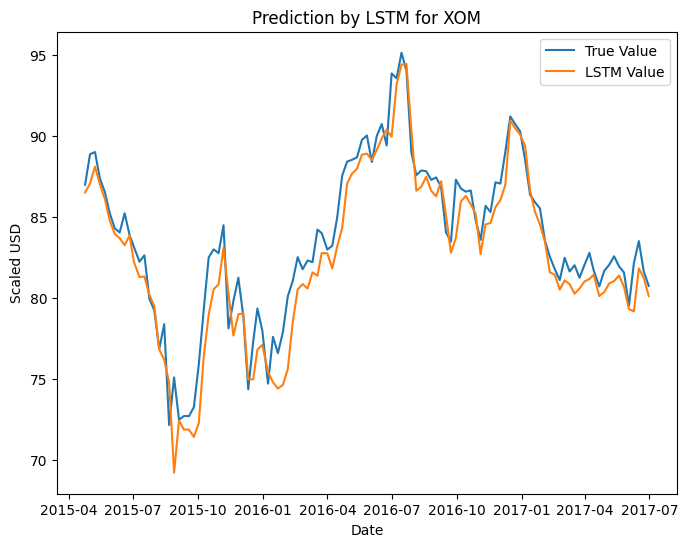

Mean Absolute Error (MAE): 1.2604945466414748
Mean Squared Error (MSE): 2.688828281247315
Root Mean Squared Error (RMSE): 1.639764703013001
R-squared (R2) Score: 0.8853709437409216
1/1 [==============================] - 0s 19ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for XOM : [[102.32715]]
Predicted Return for Next Month: [[0.76528347]] %
Predicted Future Trend for XOM : Increase
Accuracy of Trend Prediction for XOM : 0.6814159292035398
Epoch 1/100
58/58 [==============================] - 2s 4ms/step - loss: 5493.6650
Epoch 2/100
58/58 [==============================] - 0s 4ms/step - loss: 5157.5449
Epoch 3/100
58/58 [==============================] - 0s 4ms/step - loss: 2994.1311
Epoch 4/100
58/58 [==============================] - 0s 4ms/step - loss: 456.9943
Epoch 5/100
58/58 [==============================] - 0s 4ms/step - loss: 97.2331
Epoch 6/100
58/58 [==============================] - 0s 4ms/step - loss: 92.5991
Epoch 7/100
58/58 [==============================] - 0s 4ms/step - loss: 82.6737
Epoch 8/100
58/58 [==============================] - 0s 4ms/step - loss: 86.7851
Epoch 9/100
58/58 [==============================] - 0s 4ms/step - loss: 76.4342
Epoch 10/100
58/58 [==============================] - 0s 4ms/

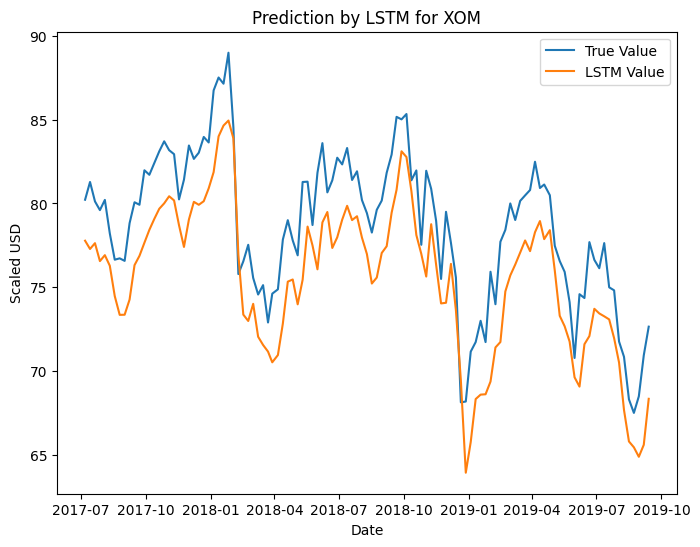

Mean Absolute Error (MAE): 3.216582224970278
Mean Squared Error (MSE): 11.972299778738844
Root Mean Squared Error (RMSE): 3.4601011226174943
R-squared (R2) Score: 0.398371499166683
1/1 [==============================] - 0s 22ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for XOM : [[100.09546]]
Predicted Return for Next Month: [[-1.4323428]] %
Predicted Future Trend for XOM : Decrease
Accuracy of Trend Prediction for XOM : 0.6460176991150443
Epoch 1/100
65/65 [==============================] - 3s 4ms/step - loss: 5571.6377
Epoch 2/100
65/65 [==============================] - 0s 4ms/step - loss: 5207.4185
Epoch 3/100
65/65 [==============================] - 0s 4ms/step - loss: 2684.7180
Epoch 4/100
65/65 [==============================] - 0s 4ms/step - loss: 274.4669
Epoch 5/100
65/65 [==============================] - 0s 4ms/step - loss: 102.2425
Epoch 6/100
65/65 [==============================] - 0s 4ms/step - loss: 96.6870
Epoch 7/100
65/65 [==============================] - 0s 4ms/step - loss: 95.0853
Epoch 8/100
65/65 [==============================] - 0s 4ms/step - loss: 84.2095
Epoch 9/100
65/65 [==============================] - 0s 4ms/step - loss: 80.8141
Epoch 10/100
65/65 [==============================] - 0s 4ms

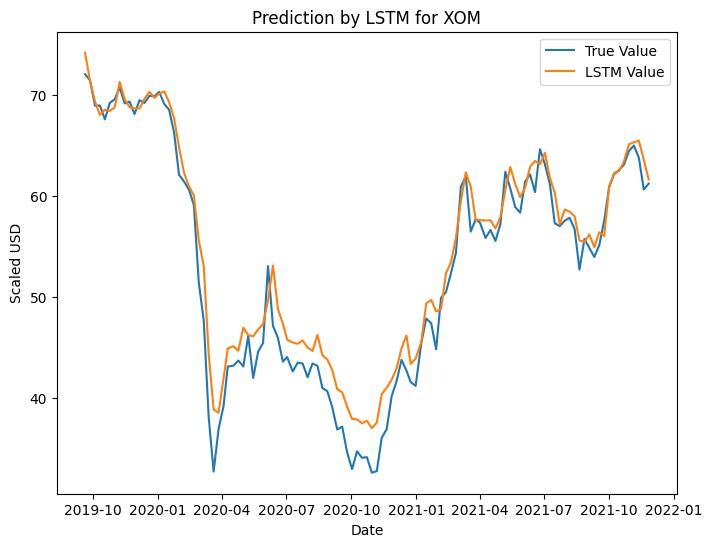

Mean Absolute Error (MAE): 1.9235411828082547
Mean Squared Error (MSE): 5.990728937434594
Root Mean Squared Error (RMSE): 2.4475965634545647
R-squared (R2) Score: 0.9542970222913965
1/1 [==============================] - 0s 27ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for XOM : [[104.841995]]
Predicted Return for Next Month: [[3.241745]] %
Predicted Future Trend for XOM : Increase
Accuracy of Trend Prediction for XOM : 0.7079646017699115
Epoch 1/100
72/72 [==============================] - 2s 4ms/step - loss: 5308.6797
Epoch 2/100
72/72 [==============================] - 0s 4ms/step - loss: 4970.4790
Epoch 3/100
72/72 [==============================] - 0s 4ms/step - loss: 2696.1582
Epoch 4/100
72/72 [==============================] - 0s 4ms/step - loss: 335.6289
Epoch 5/100
72/72 [==============================] - 0s 4ms/step - loss: 97.1468
Epoch 6/100
72/72 [==============================] - 0s 4ms/step - loss: 94.3220
Epoch 7/100
72/72 [==============================] - 0s 4ms/step - loss: 87.9144
Epoch 8/100
72/72 [==============================] - 0s 4ms/step - loss: 83.5936
Epoch 9/100
72/72 [==============================] - 0s 4ms/step - loss: 79.8579
Epoch 10/100
72/72 [==============================] - 0s 4ms/s

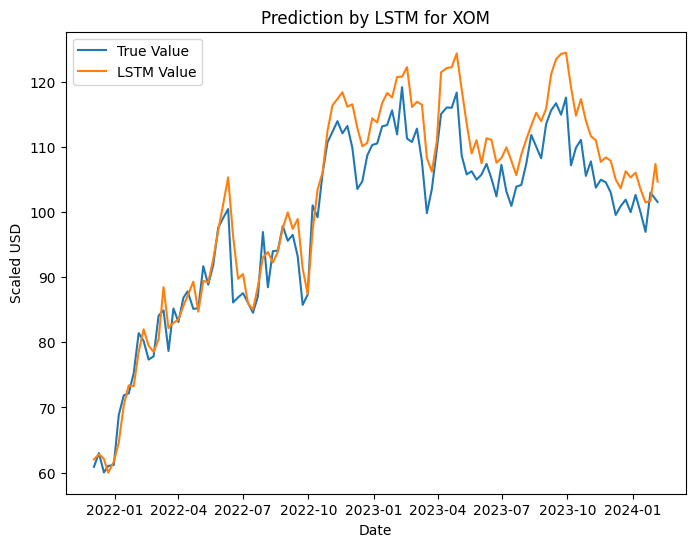

Mean Absolute Error (MAE): 3.898563268246857
Mean Squared Error (MSE): 22.30856643269876
Root Mean Squared Error (RMSE): 4.723194515653443
R-squared (R2) Score: 0.8879886730548355
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for XOM : [[104.66318]]
Predicted Return for Next Month: [[3.0656567]] %
Predicted Future Trend for XOM : Increase
Accuracy of Trend Prediction for XOM : 0.6637168141592921


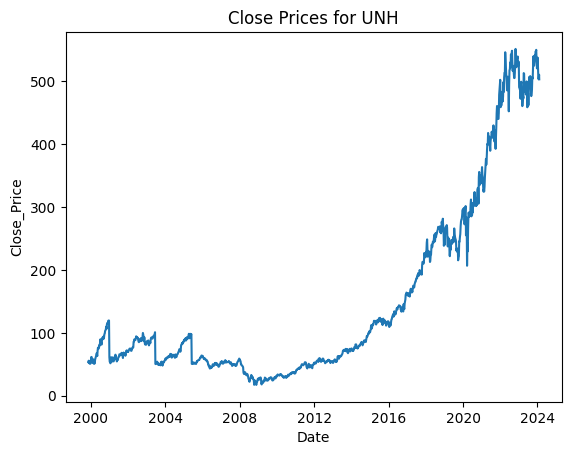

Epoch 1/100
8/8 [==============================] - 2s 4ms/step - loss: 5335.4697
Epoch 2/100
8/8 [==============================] - 0s 5ms/step - loss: 5333.5630
Epoch 3/100
8/8 [==============================] - 0s 5ms/step - loss: 5331.5000
Epoch 4/100
8/8 [==============================] - 0s 4ms/step - loss: 5329.1807
Epoch 5/100
8/8 [==============================] - 0s 4ms/step - loss: 5326.4966
Epoch 6/100
8/8 [==============================] - 0s 4ms/step - loss: 5323.3945
Epoch 7/100
8/8 [==============================] - 0s 4ms/step - loss: 5319.6904
Epoch 8/100
8/8 [==============================] - 0s 4ms/step - loss: 5315.1113
Epoch 9/100
8/8 [==============================] - 0s 4ms/step - loss: 5309.3965
Epoch 10/100
8/8 [==============================] - 0s 4ms/step - loss: 5301.9707
Epoch 11/100
8/8 [==============================] - 0s 4ms/step - loss: 5293.2656
Epoch 12/100
8/8 [==============================] - 0s 4ms/step - loss: 5281.7896
Epoch 13/100
8/8 [=======

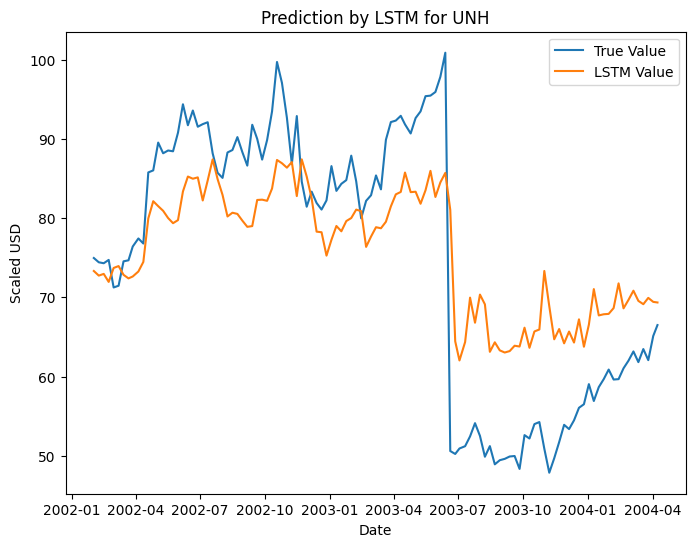

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8.697434996231742
Mean Squared Error (MSE): 100.73412356756428
Root Mean Squared Error (RMSE): 10.036639057352032
R-squared (R2) Score: 0.6370589253631775
1/1 [==============================] - 0s 23ms/step
Predicted Future Close Price for UNH : [[346.0611]]
Predicted Return for Next Month: [[-31.195105]] %
Predicted Future Trend for UNH : Decrease
Accuracy of Trend Prediction for UNH : 0.5486725663716814
Epoch 1/100
15/15 [==============================] - 2s 4ms/step - loss: 5616.1362
Epoch 2/100
15/15 [==============================] - 0s 4ms/step - loss: 5611.0068
Epoch 3/100
15/15 [==============================] - 0s 4ms/step - loss: 5603.9287
Epoch 4/100
15/15 [==============================] - 0s 4ms/step - loss: 5593.7983
Epoch 5/100
15/15 [==============================] - 0s 4ms/step - loss: 5578.4556
Epoch 6/100
15/15 [==============================] - 0s 4ms/step - loss: 5554.6030
Epoch 7/100
15/15 [==============================] - 0s 4ms/step -

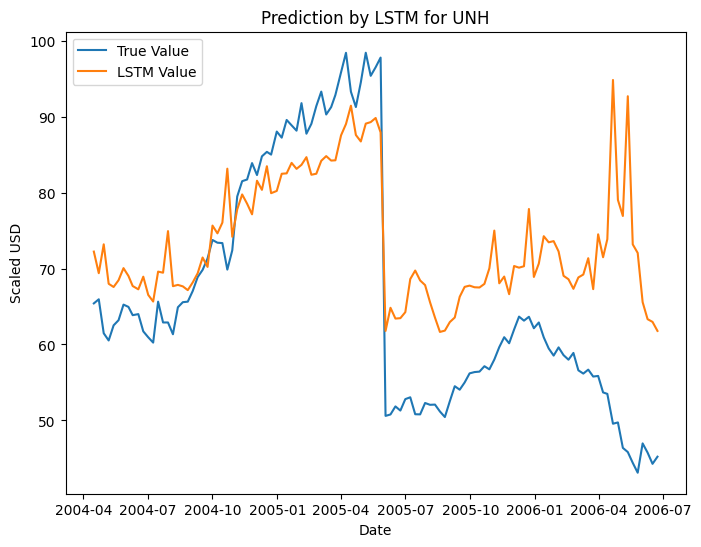

Mean Absolute Error (MAE): 10.007393508247707
Mean Squared Error (MSE): 160.73967383449443
Root Mean Squared Error (RMSE): 12.678315102350723
R-squared (R2) Score: 0.324418033249268
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UNH : [[432.37503]]
Predicted Return for Next Month: [[-14.033912]] %
Predicted Future Trend for UNH : Decrease
Accuracy of Trend Prediction for UNH : 0.5663716814159292
Epoch 1/100
22/22 [==============================] - 2s 4ms/step - loss: 5297.6396
Epoch 2/100
22/22 [==============================] - 0s 4ms/step - loss: 5286.3730
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 5266.6113
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 5228.3418
Epoch 5/100
22/22 [==============================] - 0s 4ms/step - loss: 5152.2910
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 4992.1250
Epoch 7/100
22/22 [==============================] - 0s 4ms/step - loss: 4678.3735
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 4116.4395
Epoch 9/100
22/22 [==============================] - 0s 4ms/step - loss: 3245.7893
Epoch 10/100
22/22 [==============================

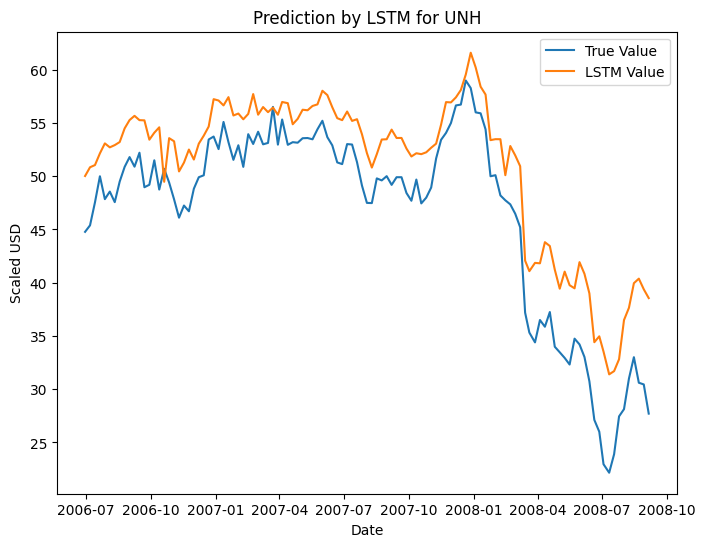

Mean Absolute Error (MAE): 4.385861990887187
Mean Squared Error (MSE): 24.077096345001188
Root Mean Squared Error (RMSE): 4.906841789277619
R-squared (R2) Score: 0.702333109163289
1/1 [==============================] - 0s 21ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UNH : [[553.72125]]
Predicted Return for Next Month: [[10.092505]] %
Predicted Future Trend for UNH : Increase
Accuracy of Trend Prediction for UNH : 0.672566371681416
Epoch 1/100
29/29 [==============================] - 2s 4ms/step - loss: 4539.2007
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 4530.4209
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 4513.7539
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 4474.5674
Epoch 5/100
29/29 [==============================] - 0s 3ms/step - loss: 4376.9736
Epoch 6/100
29/29 [==============================] - 0s 3ms/step - loss: 4133.6279
Epoch 7/100
29/29 [==============================] - 0s 3ms/step - loss: 3645.8870
Epoch 8/100
29/29 [==============================] - 0s 3ms/step - loss: 2860.9749
Epoch 9/100
29/29 [==============================] - 0s 3ms/step - loss: 1975.1880
Epoch 10/100
29/29 [==============================] 

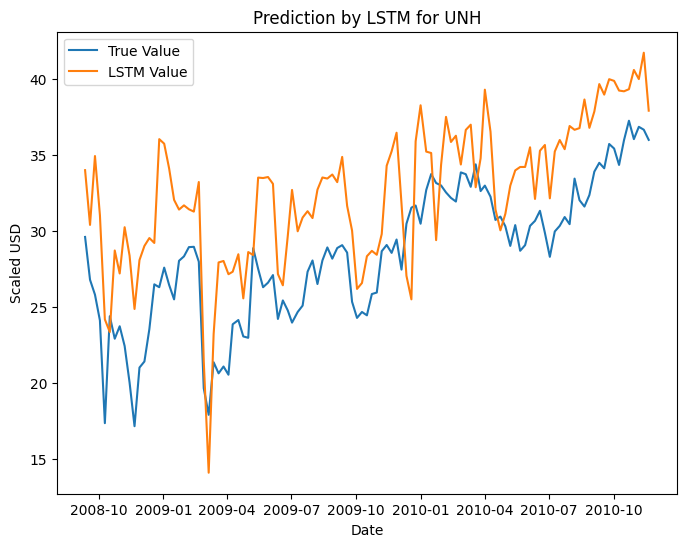

Mean Absolute Error (MAE): 4.486152529177458
Mean Squared Error (MSE): 24.477308508982006
Root Mean Squared Error (RMSE): 4.947454750574481
R-squared (R2) Score: -0.1896693361645434
1/1 [==============================] - 0s 27ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UNH : [[547.4801]]
Predicted Return for Next Month: [[8.851621]] %
Predicted Future Trend for UNH : Increase
Accuracy of Trend Prediction for UNH : 0.48672566371681414
Epoch 1/100
36/36 [==============================] - 1s 3ms/step - loss: 3797.1396
Epoch 2/100
36/36 [==============================] - 0s 3ms/step - loss: 3785.5190
Epoch 3/100
36/36 [==============================] - 0s 3ms/step - loss: 3755.3315
Epoch 4/100
36/36 [==============================] - 0s 3ms/step - loss: 3660.5791
Epoch 5/100
36/36 [==============================] - 0s 3ms/step - loss: 3374.2708
Epoch 6/100
36/36 [==============================] - 0s 3ms/step - loss: 2729.9429
Epoch 7/100
36/36 [==============================] - 0s 3ms/step - loss: 1886.3956
Epoch 8/100
36/36 [==============================] - 0s 3ms/step - loss: 1191.4928
Epoch 9/100
36/36 [==============================] - 0s 3ms/step - loss: 832.9103
Epoch 10/100
36/36 [==============================] -

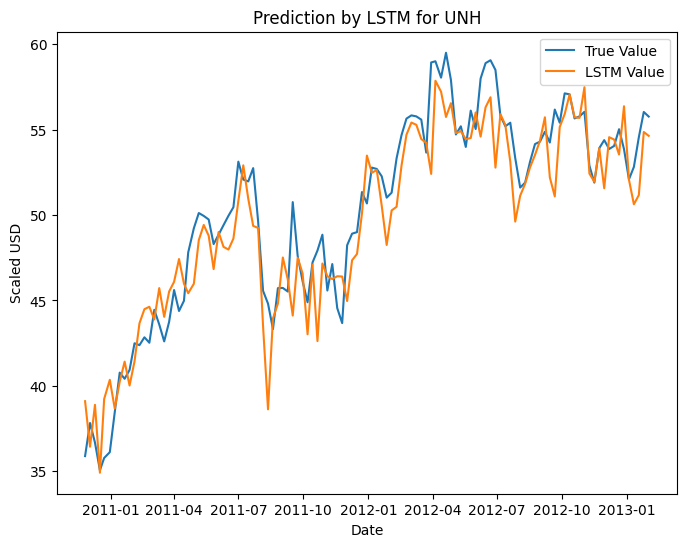

Mean Absolute Error (MAE): 1.5846893469769023
Mean Squared Error (MSE): 4.601839249974501
Root Mean Squared Error (RMSE): 2.145189793462224
R-squared (R2) Score: 0.8688058015242444
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UNH : [[623.1204]]
Predicted Return for Next Month: [[23.890654]] %
Predicted Future Trend for UNH : Increase
Accuracy of Trend Prediction for UNH : 0.6106194690265486
Epoch 1/100
44/44 [==============================] - 2s 4ms/step - loss: 3589.2581
Epoch 2/100
44/44 [==============================] - 0s 4ms/step - loss: 3566.0659
Epoch 3/100
44/44 [==============================] - 0s 4ms/step - loss: 3479.1248
Epoch 4/100
44/44 [==============================] - 0s 4ms/step - loss: 3137.5217
Epoch 5/100
44/44 [==============================] - 0s 4ms/step - loss: 2188.0671
Epoch 6/100
44/44 [==============================] - 0s 4ms/step - loss: 1145.1779
Epoch 7/100
44/44 [==============================] - 0s 4ms/step - loss: 679.6536
Epoch 8/100
44/44 [==============================] - 0s 4ms/step - loss: 535.8157
Epoch 9/100
44/44 [==============================] - 0s 4ms/step - loss: 464.2050
Epoch 10/100
44/44 [==============================] - 0

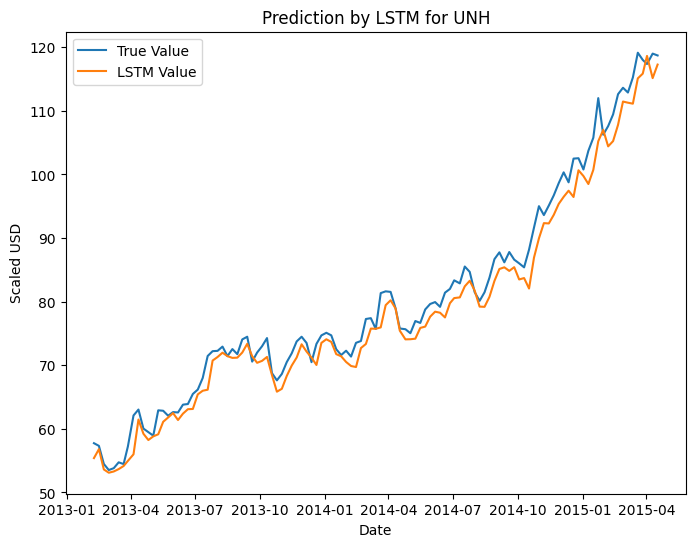

Mean Absolute Error (MAE): 2.092394037661345
Mean Squared Error (MSE): 6.716743953051703
Root Mean Squared Error (RMSE): 2.5916681795808088
R-squared (R2) Score: 0.9758346275598402
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UNH : [[678.07007]]
Predicted Return for Next Month: [[34.815903]] %
Predicted Future Trend for UNH : Increase
Accuracy of Trend Prediction for UNH : 0.6991150442477876
Epoch 1/100
51/51 [==============================] - 2s 4ms/step - loss: 4034.1711
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 3986.5552
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 3742.2190
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 2728.9050
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 1254.1372
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 653.1574
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 554.1503
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 479.3215
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 434.5043
Epoch 10/100
51/51 [==============================] - 0

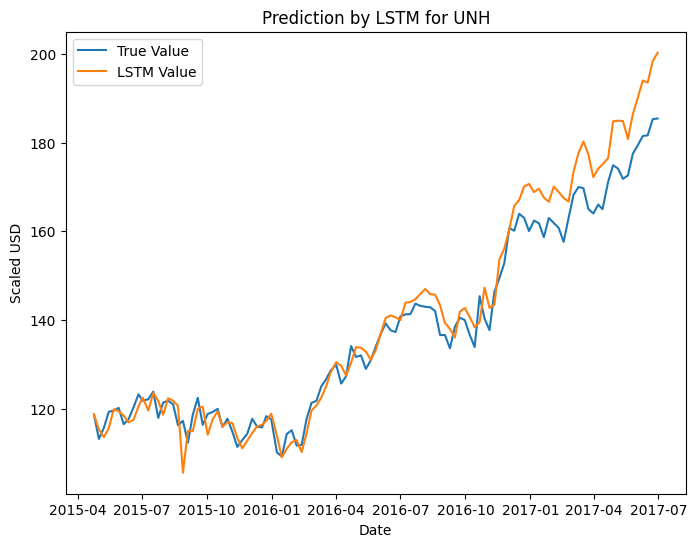

Mean Absolute Error (MAE): 4.084812048870584
Mean Squared Error (MSE): 29.393843001235055
Root Mean Squared Error (RMSE): 5.421608894160022
R-squared (R2) Score: 0.9353562715382491
1/1 [==============================] - 0s 30ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UNH : [[723.476]]
Predicted Return for Next Month: [[43.84365]] %
Predicted Future Trend for UNH : Increase
Accuracy of Trend Prediction for UNH : 0.6371681415929203
Epoch 1/100
58/58 [==============================] - 2s 4ms/step - loss: 5948.8638
Epoch 2/100
58/58 [==============================] - 0s 4ms/step - loss: 5859.5889
Epoch 3/100
58/58 [==============================] - 0s 4ms/step - loss: 5316.1958
Epoch 4/100
58/58 [==============================] - 0s 4ms/step - loss: 3594.1206
Epoch 5/100
58/58 [==============================] - 0s 3ms/step - loss: 1760.5610
Epoch 6/100
58/58 [==============================] - 0s 3ms/step - loss: 1095.9591
Epoch 7/100
58/58 [==============================] - 0s 4ms/step - loss: 922.7651
Epoch 8/100
58/58 [==============================] - 0s 3ms/step - loss: 835.5134
Epoch 9/100
58/58 [==============================] - 0s 3ms/step - loss: 800.2524
Epoch 10/100
58/58 [==============================] - 0s 

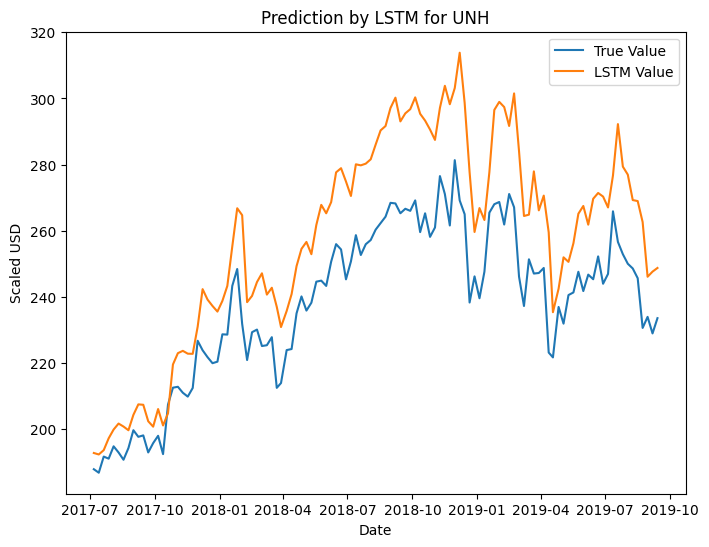

Mean Absolute Error (MAE): 19.751014972189196
Mean Squared Error (MSE): 479.87353315255694
Root Mean Squared Error (RMSE): 21.906015912359713
R-squared (R2) Score: 0.15103765623740473
1/1 [==============================] - 0s 35ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UNH : [[669.5436]]
Predicted Return for Next Month: [[33.120644]] %
Predicted Future Trend for UNH : Increase
Accuracy of Trend Prediction for UNH : 0.6460176991150443
Epoch 1/100
65/65 [==============================] - 2s 4ms/step - loss: 11616.9580
Epoch 2/100
65/65 [==============================] - 0s 3ms/step - loss: 11503.9541
Epoch 3/100
65/65 [==============================] - 0s 3ms/step - loss: 10905.0781
Epoch 4/100
65/65 [==============================] - 0s 3ms/step - loss: 8909.3359
Epoch 5/100
65/65 [==============================] - 0s 3ms/step - loss: 5829.6929
Epoch 6/100
65/65 [==============================] - 0s 3ms/step - loss: 3544.6362
Epoch 7/100
65/65 [==============================] - 0s 3ms/step - loss: 2595.4690
Epoch 8/100
65/65 [==============================] - 0s 3ms/step - loss: 2186.2742
Epoch 9/100
65/65 [==============================] - 0s 3ms/step - loss: 2016.5763
Epoch 10/100
65/65 [=============================

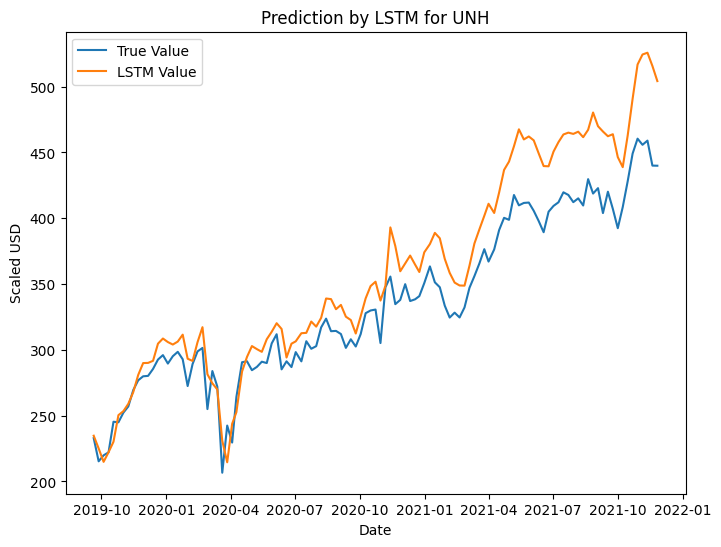

Mean Absolute Error (MAE): 25.966702891474185
Mean Squared Error (MSE): 1008.0023729171525
Root Mean Squared Error (RMSE): 31.749053102685636
R-squared (R2) Score: 0.7399565010858062
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UNH : [[593.74133]]
Predicted Return for Next Month: [[18.049416]] %
Predicted Future Trend for UNH : Increase
Accuracy of Trend Prediction for UNH : 0.6460176991150443
Epoch 1/100
72/72 [==============================] - 3s 4ms/step - loss: 22021.7715
Epoch 2/100
72/72 [==============================] - 0s 4ms/step - loss: 21766.5996
Epoch 3/100
72/72 [==============================] - 0s 4ms/step - loss: 20547.6582
Epoch 4/100
72/72 [==============================] - 0s 4ms/step - loss: 17077.7012
Epoch 5/100
72/72 [==============================] - 0s 4ms/step - loss: 11953.8682
Epoch 6/100
72/72 [==============================] - 0s 4ms/step - loss: 7296.8018
Epoch 7/100
72/72 [==============================] - 0s 4ms/step - loss: 4469.2139
Epoch 8/100
72/72 [==============================] - 0s 4ms/step - loss: 3396.4021
Epoch 9/100
72/72 [==============================] - 0s 4ms/step - loss: 2858.5310
Epoch 10/100
72/72 [==========================

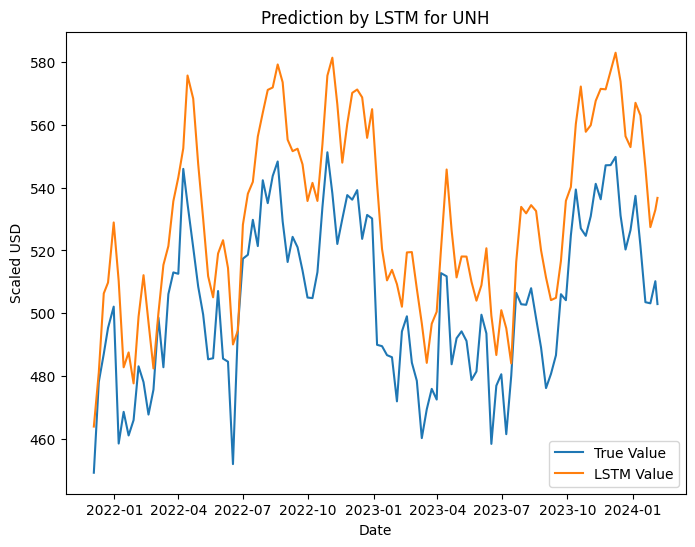

Mean Absolute Error (MAE): 26.86505482549253
Mean Squared Error (MSE): 846.6636164196609
Root Mean Squared Error (RMSE): 29.09748470950128
R-squared (R2) Score: -0.322523963064105
1/1 [==============================] - 0s 19ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for UNH : [[536.73083]]
Predicted Return for Next Month: [[6.7144194]] %
Predicted Future Trend for UNH : Increase
Accuracy of Trend Prediction for UNH : 0.6460176991150443


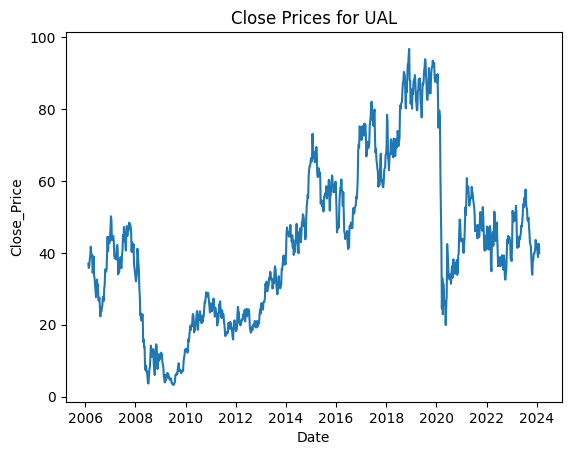

Epoch 1/100
6/6 [==============================] - 2s 4ms/step - loss: 1486.0590
Epoch 2/100
6/6 [==============================] - 0s 4ms/step - loss: 1484.9755
Epoch 3/100
6/6 [==============================] - 0s 4ms/step - loss: 1483.7886
Epoch 4/100
6/6 [==============================] - 0s 4ms/step - loss: 1482.3595
Epoch 5/100
6/6 [==============================] - 0s 4ms/step - loss: 1480.7188
Epoch 6/100
6/6 [==============================] - 0s 4ms/step - loss: 1478.8049
Epoch 7/100
6/6 [==============================] - 0s 4ms/step - loss: 1476.5071
Epoch 8/100
6/6 [==============================] - 0s 4ms/step - loss: 1473.6158
Epoch 9/100
6/6 [==============================] - 0s 4ms/step - loss: 1470.3842
Epoch 10/100
6/6 [==============================] - 0s 4ms/step - loss: 1465.8053
Epoch 11/100
6/6 [==============================] - 0s 4ms/step - loss: 1460.3573
Epoch 12/100
6/6 [==============================] - 0s 4ms/step - loss: 1453.2535
Epoch 13/100
6/6 [=======

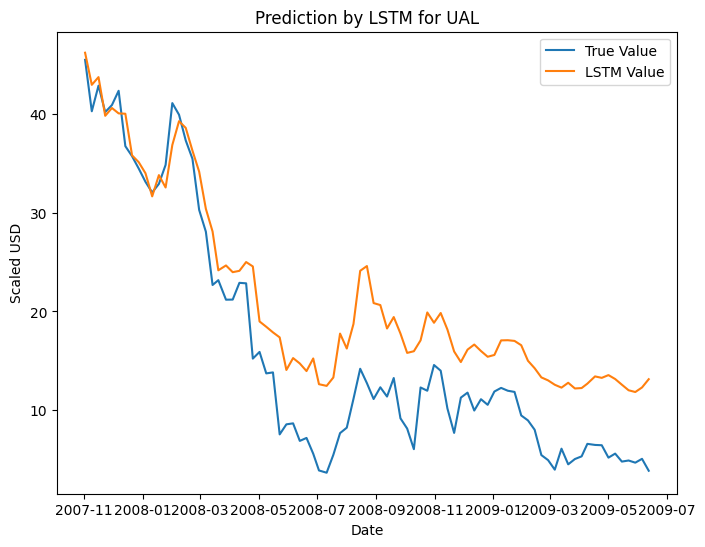

Mean Absolute Error (MAE): 5.5574668875301585
Mean Squared Error (MSE): 39.79803500893673
Root Mean Squared Error (RMSE): 6.308568380301249
R-squared (R2) Score: 0.73761075186216
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UAL : [[39.936924]]
Predicted Return for Next Month: [[-0.18264021]] %
Predicted Future Trend for UAL : Decrease
Accuracy of Trend Prediction for UAL : 0.6265060240963856
Epoch 1/100
11/11 [==============================] - 2s 4ms/step - loss: 960.5966
Epoch 2/100
11/11 [==============================] - 0s 4ms/step - loss: 959.4630
Epoch 3/100
11/11 [==============================] - 0s 4ms/step - loss: 958.2124
Epoch 4/100
11/11 [==============================] - 0s 4ms/step - loss: 956.7487
Epoch 5/100
11/11 [==============================] - 0s 5ms/step - loss: 954.8245
Epoch 6/100
11/11 [==============================] - 0s 5ms/step - loss: 952.2285
Epoch 7/100
11/11 [==============================] - 0s 4ms/step - loss: 948.5638
Epoch 8/100
11/11 [==============================] - 0s 4ms/step - loss: 943.4658
Epoch 9/100
11/11 [==============================] - 0s 4ms/step - loss: 936.0079
Epoch 10/100
11/11 [==============================] - 0s 4

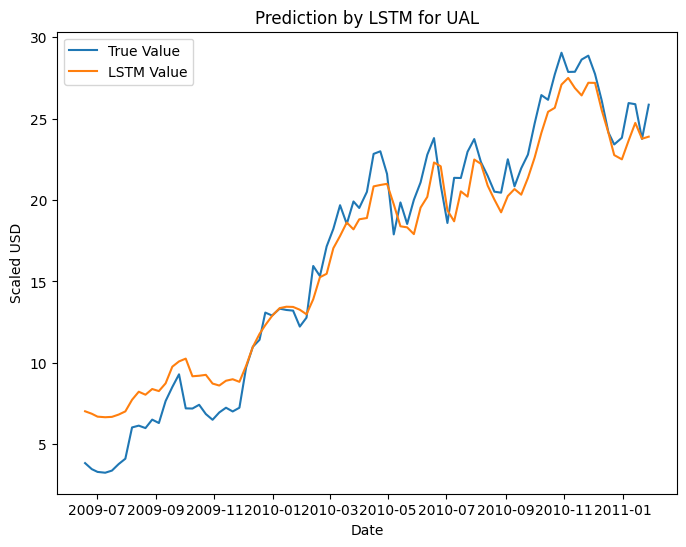

Mean Absolute Error (MAE): 1.4573095220677992
Mean Squared Error (MSE): 3.007614882532225
Root Mean Squared Error (RMSE): 1.7342476416395165
R-squared (R2) Score: 0.9522875518806412
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UAL : [[40.05569]]
Predicted Return for Next Month: [[0.11420257]] %
Predicted Future Trend for UAL : Increase
Accuracy of Trend Prediction for UAL : 0.6867469879518072
Epoch 1/100
17/17 [==============================] - 2s 4ms/step - loss: 756.8604
Epoch 2/100
17/17 [==============================] - 0s 4ms/step - loss: 754.4146
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 750.7758
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 745.0411
Epoch 5/100
17/17 [==============================] - 0s 4ms/step - loss: 735.1424
Epoch 6/100
17/17 [==============================] - 0s 4ms/step - loss: 718.4592
Epoch 7/100
17/17 [==============================] - 0s 4ms/step - loss: 688.2373
Epoch 8/100
17/17 [==============================] - 0s 4ms/step - loss: 640.1807
Epoch 9/100
17/17 [==============================] - 0s 4ms/step - loss: 559.4894
Epoch 10/100
17/17 [==============================] - 0s 4ms

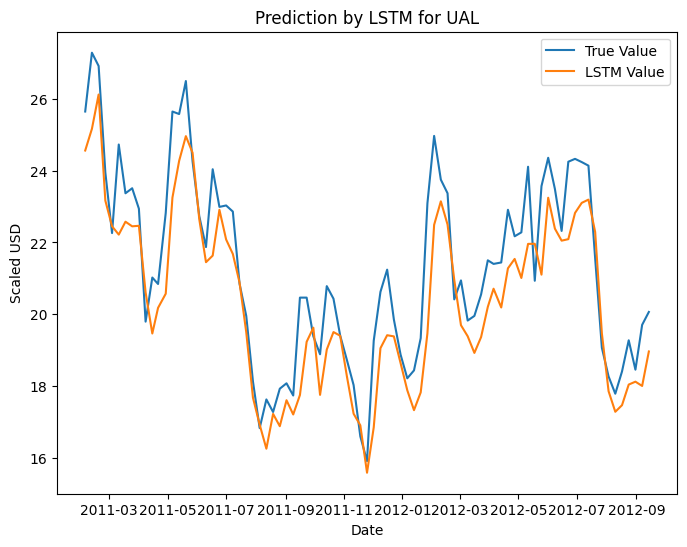

Mean Absolute Error (MAE): 1.0555252613740809
Mean Squared Error (MSE): 1.6640085459211855
Root Mean Squared Error (RMSE): 1.2899645521955965
R-squared (R2) Score: 0.7563719402993428
1/1 [==============================] - 0s 18ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UAL : [[40.46792]]
Predicted Return for Next Month: [[1.1445141]] %
Predicted Future Trend for UAL : Increase
Accuracy of Trend Prediction for UAL : 0.6506024096385542
Epoch 1/100
22/22 [==============================] - 2s 4ms/step - loss: 683.5080
Epoch 2/100
22/22 [==============================] - 0s 4ms/step - loss: 680.9910
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 676.9685
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 669.6503
Epoch 5/100
22/22 [==============================] - 0s 4ms/step - loss: 655.0287
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 626.3500
Epoch 7/100
22/22 [==============================] - 0s 4ms/step - loss: 570.5922
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 469.8512
Epoch 9/100
22/22 [==============================] - 0s 4ms/step - loss: 321.5583
Epoch 10/100
22/22 [==============================] - 0s 4ms/

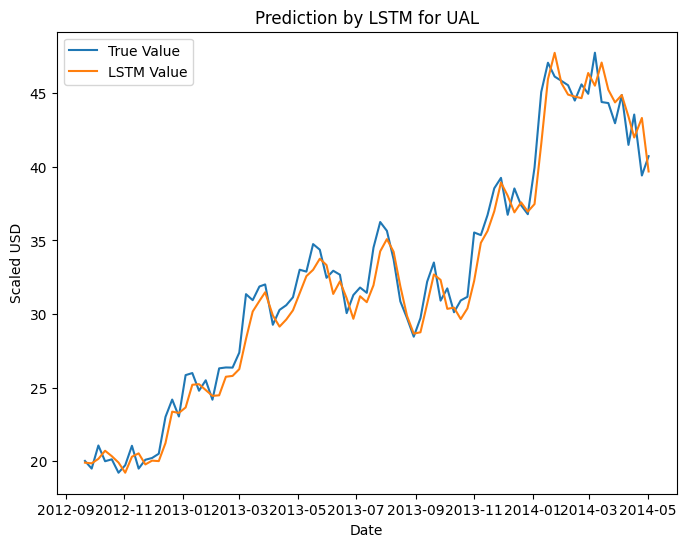

Mean Absolute Error (MAE): 1.069876012465533
Mean Squared Error (MSE): 1.7987509698075492
Root Mean Squared Error (RMSE): 1.3411752196516118
R-squared (R2) Score: 0.9715073310047341
1/1 [==============================] - 0s 24ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UAL : [[40.089783]]
Predicted Return for Next Month: [[0.19941114]] %
Predicted Future Trend for UAL : Increase
Accuracy of Trend Prediction for UAL : 0.6265060240963856
Epoch 1/100
27/27 [==============================] - 2s 5ms/step - loss: 768.7260
Epoch 2/100
27/27 [==============================] - 0s 4ms/step - loss: 765.4129
Epoch 3/100
27/27 [==============================] - 0s 4ms/step - loss: 759.4299
Epoch 4/100
27/27 [==============================] - 0s 4ms/step - loss: 746.3162
Epoch 5/100
27/27 [==============================] - 0s 4ms/step - loss: 714.8603
Epoch 6/100
27/27 [==============================] - 0s 4ms/step - loss: 644.1057
Epoch 7/100
27/27 [==============================] - 0s 4ms/step - loss: 509.6450
Epoch 8/100
27/27 [==============================] - 0s 4ms/step - loss: 313.0092
Epoch 9/100
27/27 [==============================] - 0s 4ms/step - loss: 132.1120
Epoch 10/100
27/27 [==============================] - 0s 4m

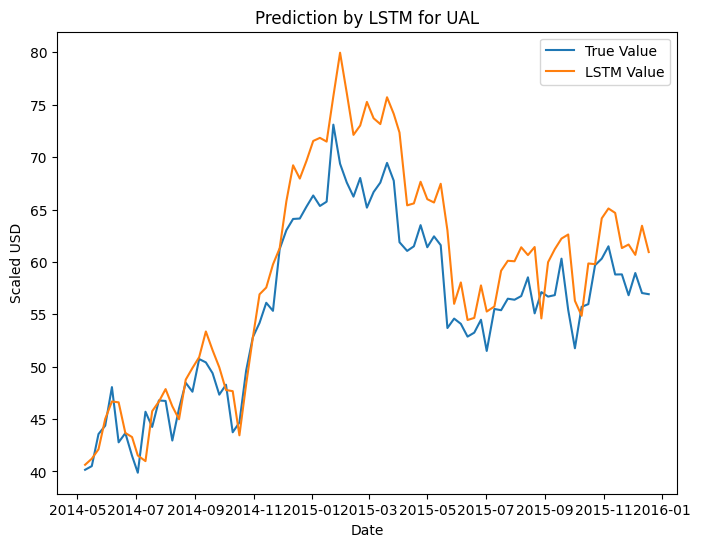

Mean Absolute Error (MAE): 3.5161550903320316
Mean Squared Error (MSE): 18.486648931812436
Root Mean Squared Error (RMSE): 4.299610323251683
R-squared (R2) Score: 0.7164281250131024
1/1 [==============================] - 0s 35ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UAL : [[41.048775]]
Predicted Return for Next Month: [[2.596292]] %
Predicted Future Trend for UAL : Increase
Accuracy of Trend Prediction for UAL : 0.6024096385542169
Epoch 1/100
33/33 [==============================] - 2s 4ms/step - loss: 1163.2898
Epoch 2/100
33/33 [==============================] - 0s 4ms/step - loss: 1154.2928
Epoch 3/100
33/33 [==============================] - 0s 3ms/step - loss: 1128.0120
Epoch 4/100
33/33 [==============================] - 0s 3ms/step - loss: 1044.0786
Epoch 5/100
33/33 [==============================] - 0s 3ms/step - loss: 826.1079
Epoch 6/100
33/33 [==============================] - 0s 3ms/step - loss: 450.4445
Epoch 7/100
33/33 [==============================] - 0s 3ms/step - loss: 130.9669
Epoch 8/100
33/33 [==============================] - 0s 4ms/step - loss: 35.7219
Epoch 9/100
33/33 [==============================] - 0s 3ms/step - loss: 30.6903
Epoch 10/100
33/33 [==============================] - 0s 4m

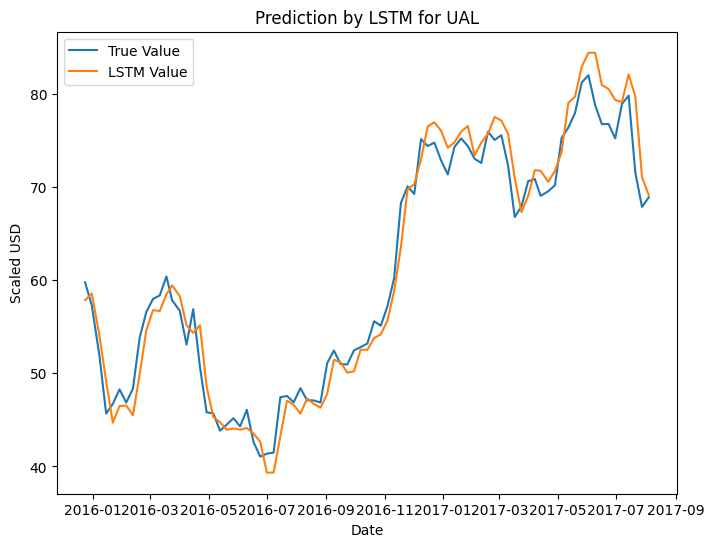

Mean Absolute Error (MAE): 1.92151398602654
Mean Squared Error (MSE): 5.67747873432497
Root Mean Squared Error (RMSE): 2.382746049062923
R-squared (R2) Score: 0.9635121189852562
1/1 [==============================] - 0s 19ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UAL : [[39.748814]]
Predicted Return for Next Month: [[-0.65279853]] %
Predicted Future Trend for UAL : Decrease
Accuracy of Trend Prediction for UAL : 0.6987951807228916
Epoch 1/100
38/38 [==============================] - 2s 4ms/step - loss: 1543.5786
Epoch 2/100
38/38 [==============================] - 0s 4ms/step - loss: 1530.6057
Epoch 3/100
38/38 [==============================] - 0s 4ms/step - loss: 1491.2439
Epoch 4/100
38/38 [==============================] - 0s 4ms/step - loss: 1357.7032
Epoch 5/100
38/38 [==============================] - 0s 4ms/step - loss: 1008.0562
Epoch 6/100
38/38 [==============================] - 0s 3ms/step - loss: 496.4866
Epoch 7/100
38/38 [==============================] - 0s 3ms/step - loss: 126.7564
Epoch 8/100
38/38 [==============================] - 0s 3ms/step - loss: 36.1344
Epoch 9/100
38/38 [==============================] - 0s 3ms/step - loss: 36.8030
Epoch 10/100
38/38 [==============================] - 0

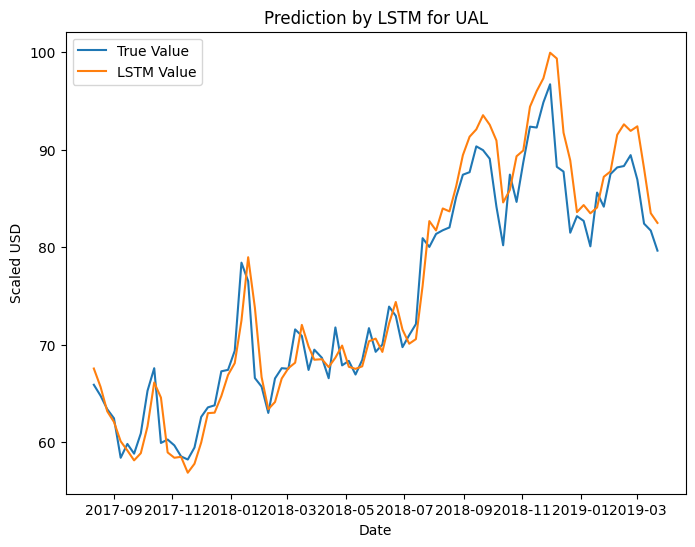

Mean Absolute Error (MAE): 2.3032941661161526
Mean Squared Error (MSE): 9.02533301650421
Root Mean Squared Error (RMSE): 3.004219202472451
R-squared (R2) Score: 0.9207904812293175
1/1 [==============================] - 0s 33ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UAL : [[39.82145]]
Predicted Return for Next Month: [[-0.47125483]] %
Predicted Future Trend for UAL : Decrease
Accuracy of Trend Prediction for UAL : 0.6987951807228916
Epoch 1/100
43/43 [==============================] - 2s 4ms/step - loss: 2056.2134
Epoch 2/100
43/43 [==============================] - 0s 4ms/step - loss: 2032.2573
Epoch 3/100
43/43 [==============================] - 0s 4ms/step - loss: 1944.9886
Epoch 4/100
43/43 [==============================] - 0s 4ms/step - loss: 1646.0614
Epoch 5/100
43/43 [==============================] - 0s 4ms/step - loss: 1016.8860
Epoch 6/100
43/43 [==============================] - 0s 4ms/step - loss: 368.4921
Epoch 7/100
43/43 [==============================] - 0s 4ms/step - loss: 73.9080
Epoch 8/100
43/43 [==============================] - 0s 4ms/step - loss: 38.2550
Epoch 9/100
43/43 [==============================] - 0s 4ms/step - loss: 40.8229
Epoch 10/100
43/43 [==============================] - 0s 

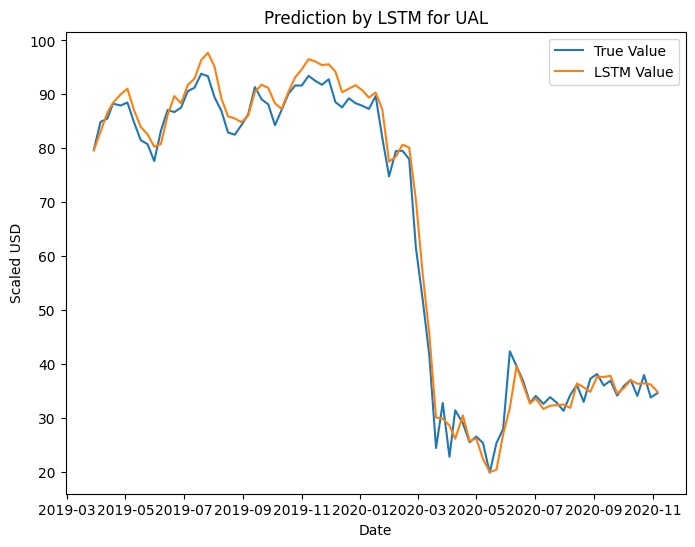

Mean Absolute Error (MAE): 2.248651096119599
Mean Squared Error (MSE): 8.733208240151283
Root Mean Squared Error (RMSE): 2.9552002030575326
R-squared (R2) Score: 0.987789836292521
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UAL : [[40.34905]]
Predicted Return for Next Month: [[0.84741396]] %
Predicted Future Trend for UAL : Increase
Accuracy of Trend Prediction for UAL : 0.7951807228915663
Epoch 1/100
49/49 [==============================] - 2s 4ms/step - loss: 2357.4871
Epoch 2/100
49/49 [==============================] - 0s 3ms/step - loss: 2324.5146
Epoch 3/100
49/49 [==============================] - 0s 3ms/step - loss: 2141.5476
Epoch 4/100
49/49 [==============================] - 0s 3ms/step - loss: 1485.5354
Epoch 5/100
49/49 [==============================] - 0s 3ms/step - loss: 552.6613
Epoch 6/100
49/49 [==============================] - 0s 3ms/step - loss: 89.8692
Epoch 7/100
49/49 [==============================] - 0s 3ms/step - loss: 47.7369
Epoch 8/100
49/49 [==============================] - 0s 4ms/step - loss: 43.6387
Epoch 9/100
49/49 [==============================] - 0s 3ms/step - loss: 40.2339
Epoch 10/100
49/49 [==============================] - 0s 3ms

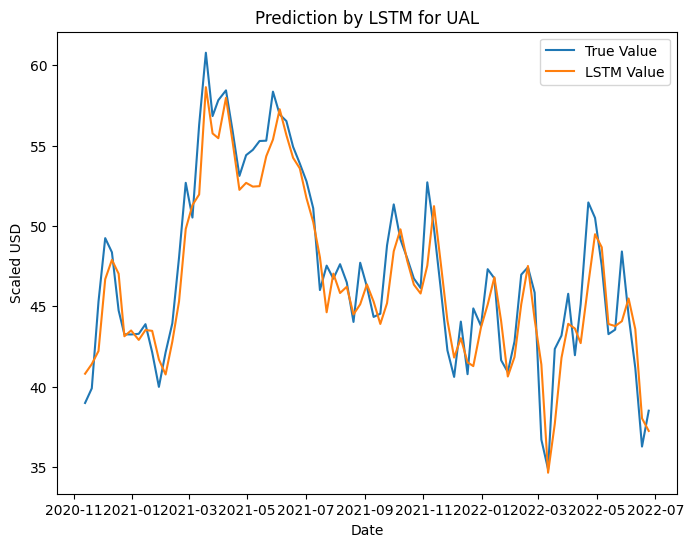

Mean Absolute Error (MAE): 1.5728452022776882
Mean Squared Error (MSE): 4.044819989107888
Root Mean Squared Error (RMSE): 2.011173783915226
R-squared (R2) Score: 0.8730165352978485
1/1 [==============================] - 0s 18ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for UAL : [[40.371876]]
Predicted Return for Next Month: [[0.9044675]] %
Predicted Future Trend for UAL : Increase
Accuracy of Trend Prediction for UAL : 0.7108433734939759
Epoch 1/100
54/54 [==============================] - 2s 3ms/step - loss: 2341.8118
Epoch 2/100
54/54 [==============================] - 0s 3ms/step - loss: 2259.9871
Epoch 3/100
54/54 [==============================] - 0s 3ms/step - loss: 1789.2146
Epoch 4/100
54/54 [==============================] - 0s 3ms/step - loss: 707.1687
Epoch 5/100
54/54 [==============================] - 0s 3ms/step - loss: 77.5632
Epoch 6/100
54/54 [==============================] - 0s 4ms/step - loss: 37.7245
Epoch 7/100
54/54 [==============================] - 0s 3ms/step - loss: 36.2090
Epoch 8/100
54/54 [==============================] - 0s 3ms/step - loss: 32.6884
Epoch 9/100
54/54 [==============================] - 0s 4ms/step - loss: 32.8920
Epoch 10/100
54/54 [==============================] - 0s 3ms/s

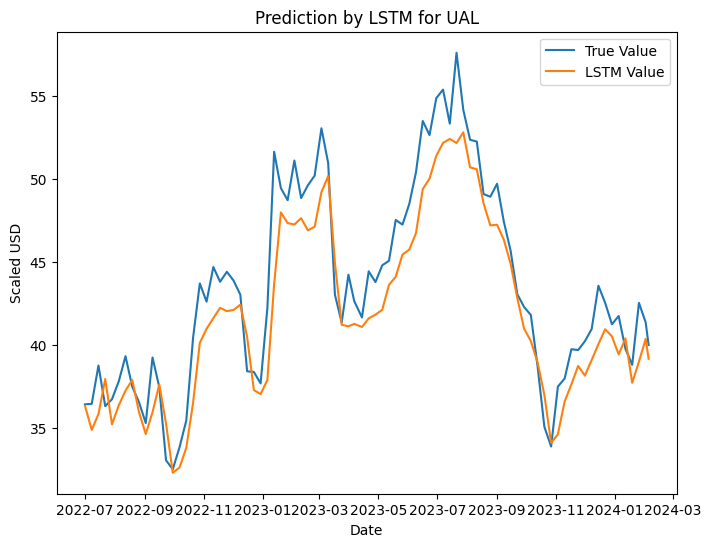

Mean Absolute Error (MAE): 1.9454505956313188
Mean Squared Error (MSE): 5.552188595514424
Root Mean Squared Error (RMSE): 2.356308255622431
R-squared (R2) Score: 0.8441106530909119
1/1 [==============================] - 0s 22ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for UAL : [[39.18169]]
Predicted Return for Next Month: [[-2.070253]] %
Predicted Future Trend for UAL : Decrease
Accuracy of Trend Prediction for UAL : 0.6626506024096386


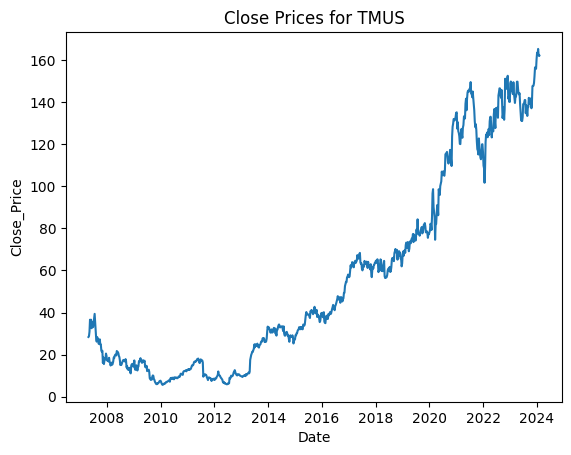

Epoch 1/100
6/6 [==============================] - 2s 3ms/step - loss: 492.6863
Epoch 2/100
6/6 [==============================] - 0s 4ms/step - loss: 492.1198
Epoch 3/100
6/6 [==============================] - 0s 4ms/step - loss: 491.5201
Epoch 4/100
6/6 [==============================] - 0s 4ms/step - loss: 490.8743
Epoch 5/100
6/6 [==============================] - 0s 4ms/step - loss: 490.1532
Epoch 6/100
6/6 [==============================] - 0s 4ms/step - loss: 489.3643
Epoch 7/100
6/6 [==============================] - 0s 4ms/step - loss: 488.4568
Epoch 8/100
6/6 [==============================] - 0s 3ms/step - loss: 487.4620
Epoch 9/100
6/6 [==============================] - 0s 4ms/step - loss: 486.2968
Epoch 10/100
6/6 [==============================] - 0s 3ms/step - loss: 484.8694
Epoch 11/100
6/6 [==============================] - 0s 3ms/step - loss: 483.3969
Epoch 12/100
6/6 [==============================] - 0s 3ms/step - loss: 481.6453
Epoch 13/100
6/6 [===================

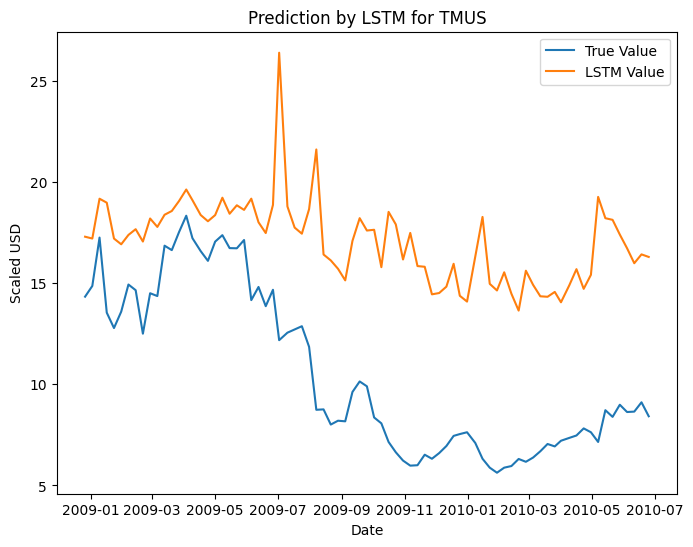

Mean Absolute Error (MAE): 6.531181685532196
Mean Squared Error (MSE): 52.84574803234383
Root Mean Squared Error (RMSE): 7.269508101126501
R-squared (R2) Score: -2.30332577864108
1/1 [==============================] - 0s 30ms/step
Predicted Future Close Price for TMUS : [[124.991554]]
Predicted Return for Next Month: [[-22.84948]] %
Predicted Future Trend for TMUS : Decrease
Accuracy of Trend Prediction for TMUS : 0.5064935064935064


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Epoch 1/100
11/11 [==============================] - 2s 3ms/step - loss: 318.5112
Epoch 2/100
11/11 [==============================] - 0s 3ms/step - loss: 317.9151
Epoch 3/100
11/11 [==============================] - 0s 4ms/step - loss: 317.2447
Epoch 4/100
11/11 [==============================] - 0s 3ms/step - loss: 316.4513
Epoch 5/100
11/11 [==============================] - 0s 4ms/step - loss: 315.4829
Epoch 6/100
11/11 [==============================] - 0s 3ms/step - loss: 314.2170
Epoch 7/100
11/11 [==============================] - 0s 3ms/step - loss: 312.5855
Epoch 8/100
11/11 [==============================] - 0s 3ms/step - loss: 310.5060
Epoch 9/100
11/11 [==============================] - 0s 3ms/step - loss: 307.5365
Epoch 10/100
11/11 [==============================] - 0s 4ms/step - loss: 303.6483
Epoch 11/100
11/11 [==============================] - 0s 3ms/step - loss: 298.2941
Epoch 12/100
11/11 [==============================] - 0s 3ms/step - loss: 291.2221
Epoch 13/100


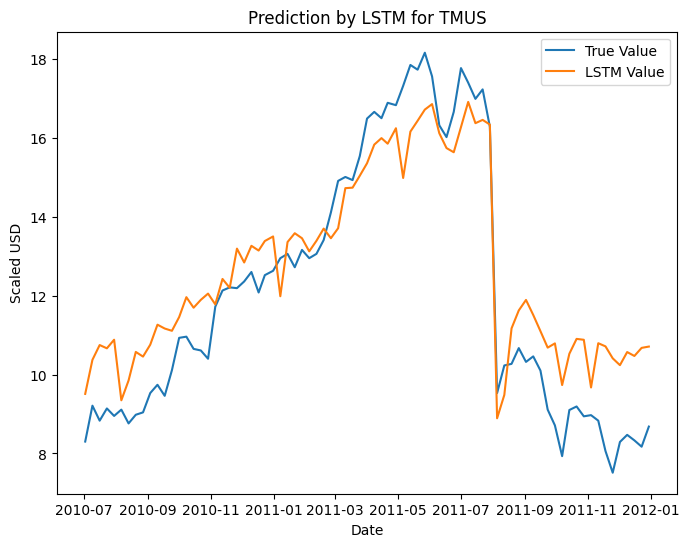

Mean Absolute Error (MAE): 1.1042297382596171
Mean Squared Error (MSE): 1.663272237666233
Root Mean Squared Error (RMSE): 1.2896791219781116
R-squared (R2) Score: 0.8425979453660373
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for TMUS : [[172.76552]]
Predicted Return for Next Month: [[6.6388025]] %
Predicted Future Trend for TMUS : Increase
Accuracy of Trend Prediction for TMUS : 0.5714285714285714
Epoch 1/100
16/16 [==============================] - 3s 4ms/step - loss: 266.2394
Epoch 2/100
16/16 [==============================] - 0s 4ms/step - loss: 265.4137
Epoch 3/100
16/16 [==============================] - 0s 4ms/step - loss: 264.3786
Epoch 4/100
16/16 [==============================] - 0s 4ms/step - loss: 262.9511
Epoch 5/100
16/16 [==============================] - 0s 4ms/step - loss: 260.8606
Epoch 6/100
16/16 [==============================] - 0s 4ms/step - loss: 257.7276
Epoch 7/100
16/16 [==============================] - 0s 4ms/step - loss: 252.9439
Epoch 8/100
16/16 [==============================] - 0s 4ms/step - loss: 245.5216
Epoch 9/100
16/16 [==============================] - 0s 4ms/step - loss: 233.5660
Epoch 10/100
16/16 [==============================] - 0s 

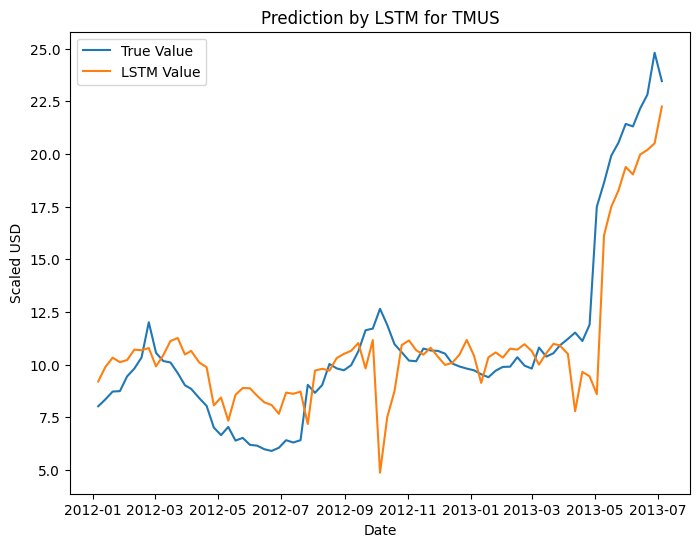

Mean Absolute Error (MAE): 1.5195147746122335
Mean Squared Error (MSE): 4.404510781071494
Root Mean Squared Error (RMSE): 2.0986926361598295
R-squared (R2) Score: 0.7643977092619128
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for TMUS : [[203.49341]]
Predicted Return for Next Month: [[25.605467]] %
Predicted Future Trend for TMUS : Increase
Accuracy of Trend Prediction for TMUS : 0.4935064935064935
Epoch 1/100
21/21 [==============================] - 2s 5ms/step - loss: 234.5184
Epoch 2/100
21/21 [==============================] - 0s 5ms/step - loss: 232.7304
Epoch 3/100
21/21 [==============================] - 0s 4ms/step - loss: 229.8435
Epoch 4/100
21/21 [==============================] - 0s 4ms/step - loss: 224.8752
Epoch 5/100
21/21 [==============================] - 0s 4ms/step - loss: 215.8233
Epoch 6/100
21/21 [==============================] - 0s 4ms/step - loss: 199.5832
Epoch 7/100
21/21 [==============================] - 0s 4ms/step - loss: 172.5267
Epoch 8/100
21/21 [==============================] - 0s 4ms/step - loss: 131.8150
Epoch 9/100
21/21 [==============================] - 0s 4ms/step - loss: 87.5121
Epoch 10/100
21/21 [==============================] - 0s 4

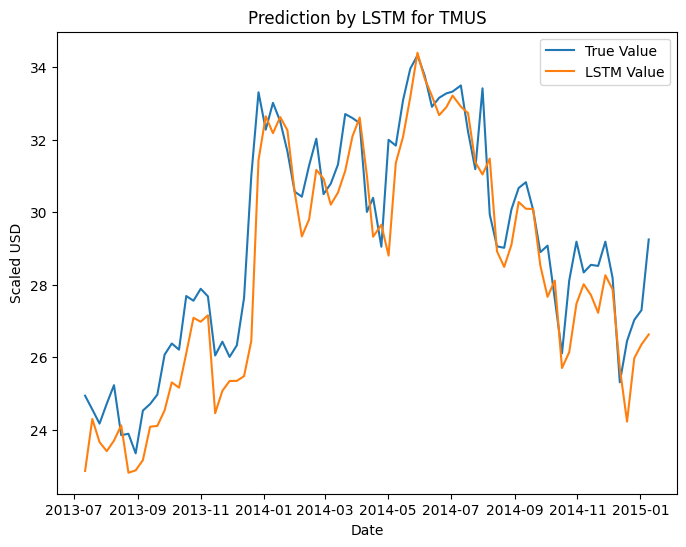

Mean Absolute Error (MAE): 0.9483385332324837
Mean Squared Error (MSE): 1.492633471781741
Root Mean Squared Error (RMSE): 1.221733797429596
R-squared (R2) Score: 0.8349734365908411
1/1 [==============================] - 0s 25ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for TMUS : [[227.6234]]
Predicted Return for Next Month: [[40.4996]] %
Predicted Future Trend for TMUS : Increase
Accuracy of Trend Prediction for TMUS : 0.6363636363636364
Epoch 1/100
26/26 [==============================] - 2s 4ms/step - loss: 357.2489
Epoch 2/100
26/26 [==============================] - 0s 4ms/step - loss: 355.0550
Epoch 3/100
26/26 [==============================] - 0s 4ms/step - loss: 351.1504
Epoch 4/100
26/26 [==============================] - 0s 4ms/step - loss: 343.2047
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 325.9045
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 288.4068
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 222.4583
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 138.7978
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 72.1475
Epoch 10/100
26/26 [==============================] - 0s 4ms/

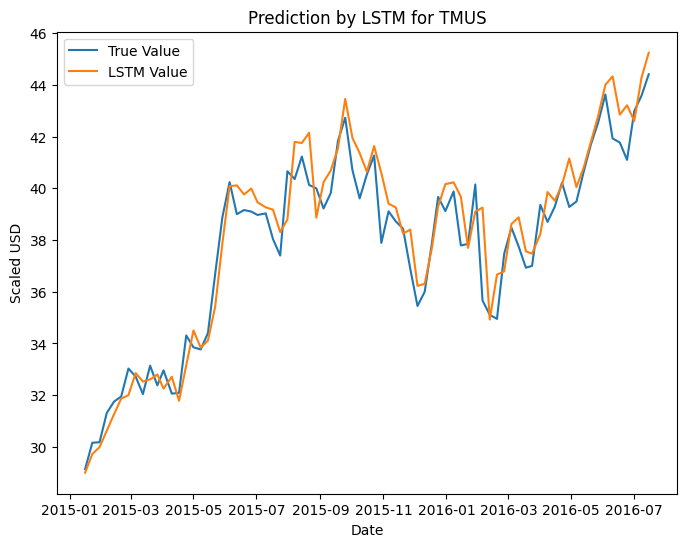

Mean Absolute Error (MAE): 0.7964869699598867
Mean Squared Error (MSE): 1.086276860524501
Root Mean Squared Error (RMSE): 1.0422460652477903
R-squared (R2) Score: 0.9147243623522122
1/1 [==============================] - 0s 24ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for TMUS : [[228.7771]]
Predicted Return for Next Month: [[41.21172]] %
Predicted Future Trend for TMUS : Increase
Accuracy of Trend Prediction for TMUS : 0.6103896103896104
Epoch 1/100
31/31 [==============================] - 2s 5ms/step - loss: 533.9584
Epoch 2/100
31/31 [==============================] - 0s 4ms/step - loss: 530.1797
Epoch 3/100
31/31 [==============================] - 0s 4ms/step - loss: 522.5468
Epoch 4/100
31/31 [==============================] - 0s 4ms/step - loss: 504.6783
Epoch 5/100
31/31 [==============================] - 0s 4ms/step - loss: 463.2741
Epoch 6/100
31/31 [==============================] - 0s 4ms/step - loss: 376.4581
Epoch 7/100
31/31 [==============================] - 0s 4ms/step - loss: 239.8117
Epoch 8/100
31/31 [==============================] - 0s 4ms/step - loss: 119.8297
Epoch 9/100
31/31 [==============================] - 0s 4ms/step - loss: 72.3633
Epoch 10/100
31/31 [==============================] - 0s 4ms

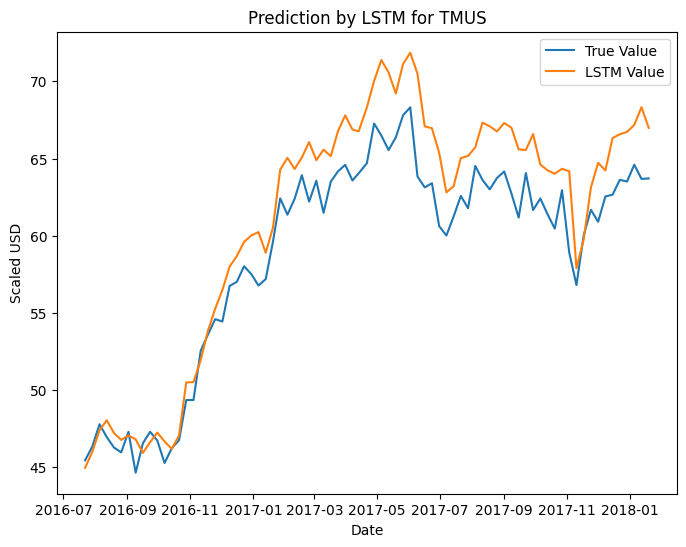

Mean Absolute Error (MAE): 2.4055166780495947
Mean Squared Error (MSE): 7.971681054064158
Root Mean Squared Error (RMSE): 2.823416556950844
R-squared (R2) Score: 0.826786179794371
1/1 [==============================] - 0s 35ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for TMUS : [[216.333]]
Predicted Return for Next Month: [[33.530647]] %
Predicted Future Trend for TMUS : Increase
Accuracy of Trend Prediction for TMUS : 0.6233766233766234
Epoch 1/100
36/36 [==============================] - 2s 4ms/step - loss: 951.3060
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 945.8087
Epoch 3/100
36/36 [==============================] - 0s 4ms/step - loss: 933.0729
Epoch 4/100
36/36 [==============================] - 0s 4ms/step - loss: 898.9603
Epoch 5/100
36/36 [==============================] - 0s 4ms/step - loss: 810.4729
Epoch 6/100
36/36 [==============================] - 0s 4ms/step - loss: 635.5322
Epoch 7/100
36/36 [==============================] - 0s 4ms/step - loss: 412.1747
Epoch 8/100
36/36 [==============================] - 0s 4ms/step - loss: 229.5552
Epoch 9/100
36/36 [==============================] - 0s 4ms/step - loss: 139.6937
Epoch 10/100
36/36 [==============================] - 0s 4m

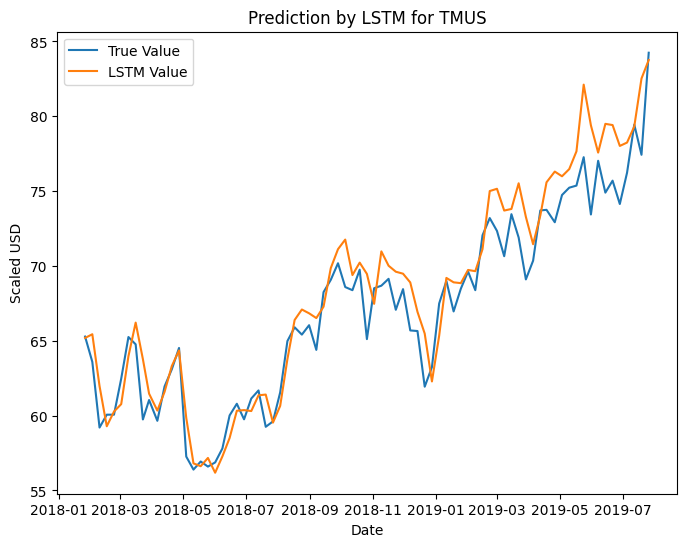

Mean Absolute Error (MAE): 1.62432505740395
Mean Squared Error (MSE): 4.576989612914381
Root Mean Squared Error (RMSE): 2.1393900095387894
R-squared (R2) Score: 0.8815140377983927
1/1 [==============================] - 0s 24ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for TMUS : [[203.19437]]
Predicted Return for Next Month: [[25.420883]] %
Predicted Future Trend for TMUS : Increase
Accuracy of Trend Prediction for TMUS : 0.6493506493506493
Epoch 1/100
40/40 [==============================] - 1s 4ms/step - loss: 1391.9254
Epoch 2/100
40/40 [==============================] - 0s 3ms/step - loss: 1380.9562
Epoch 3/100
40/40 [==============================] - 0s 3ms/step - loss: 1349.2380
Epoch 4/100
40/40 [==============================] - 0s 3ms/step - loss: 1249.5166
Epoch 5/100
40/40 [==============================] - 0s 3ms/step - loss: 990.9240
Epoch 6/100
40/40 [==============================] - 0s 3ms/step - loss: 601.0223
Epoch 7/100
40/40 [==============================] - 0s 3ms/step - loss: 284.3928
Epoch 8/100
40/40 [==============================] - 0s 3ms/step - loss: 156.1672
Epoch 9/100
40/40 [==============================] - 0s 3ms/step - loss: 127.5469
Epoch 10/100
40/40 [==============================] -

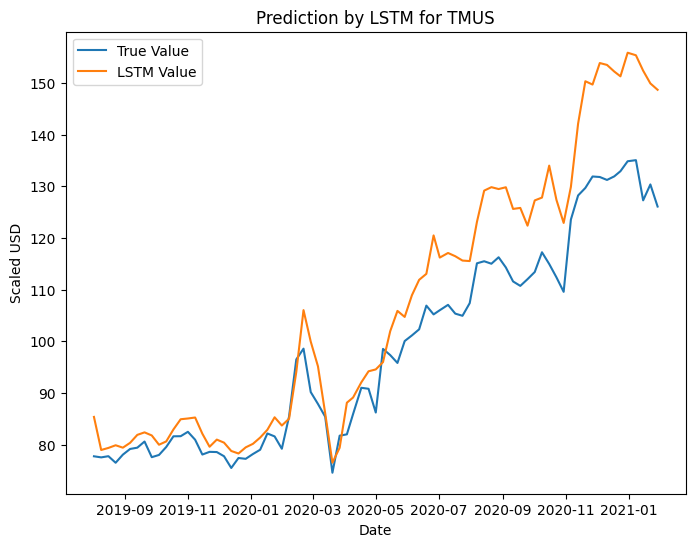

Mean Absolute Error (MAE): 8.37334876338138
Mean Squared Error (MSE): 117.04732765129822
Root Mean Squared Error (RMSE): 10.818841326653155
R-squared (R2) Score: 0.6848959932518675
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for TMUS : [[198.09395]]
Predicted Return for Next Month: [[22.272673]] %
Predicted Future Trend for TMUS : Increase
Accuracy of Trend Prediction for TMUS : 0.6233766233766234
Epoch 1/100
45/45 [==============================] - 2s 4ms/step - loss: 2339.4380
Epoch 2/100
45/45 [==============================] - 0s 4ms/step - loss: 2314.3230
Epoch 3/100
45/45 [==============================] - 0s 4ms/step - loss: 2238.9707
Epoch 4/100
45/45 [==============================] - 0s 4ms/step - loss: 2017.2229
Epoch 5/100
45/45 [==============================] - 0s 4ms/step - loss: 1529.1799
Epoch 6/100
45/45 [==============================] - 0s 4ms/step - loss: 878.4783
Epoch 7/100
45/45 [==============================] - 0s 4ms/step - loss: 389.5016
Epoch 8/100
45/45 [==============================] - 0s 4ms/step - loss: 207.0632
Epoch 9/100
45/45 [==============================] - 0s 4ms/step - loss: 173.7076
Epoch 10/100
45/45 [==============================] 

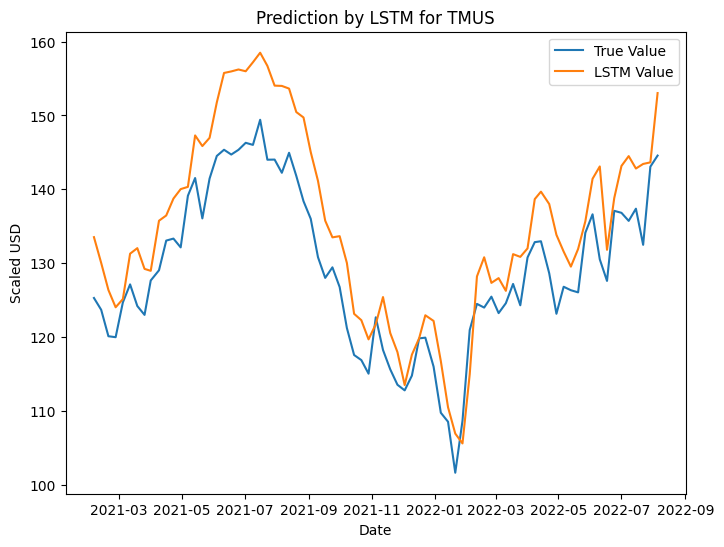

Mean Absolute Error (MAE): 6.100967264296133
Mean Squared Error (MSE): 47.71649201837422
Root Mean Squared Error (RMSE): 6.907712502585369
R-squared (R2) Score: 0.5786763707998417
1/1 [==============================] - 0s 29ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for TMUS : [[176.64375]]
Predicted Return for Next Month: [[9.032627]] %
Predicted Future Trend for TMUS : Increase
Accuracy of Trend Prediction for TMUS : 0.7012987012987013
Epoch 1/100
50/50 [==============================] - 2s 4ms/step - loss: 3763.2061
Epoch 2/100
50/50 [==============================] - 0s 4ms/step - loss: 3721.6162
Epoch 3/100
50/50 [==============================] - 0s 3ms/step - loss: 3581.4478
Epoch 4/100
50/50 [==============================] - 0s 3ms/step - loss: 3169.6448
Epoch 5/100
50/50 [==============================] - 0s 4ms/step - loss: 2298.0042
Epoch 6/100
50/50 [==============================] - 0s 3ms/step - loss: 1247.0775
Epoch 7/100
50/50 [==============================] - 0s 4ms/step - loss: 469.8391
Epoch 8/100
50/50 [==============================] - 0s 4ms/step - loss: 218.8622
Epoch 9/100
50/50 [==============================] - 0s 3ms/step - loss: 169.4122
Epoch 10/100
50/50 [==============================] 

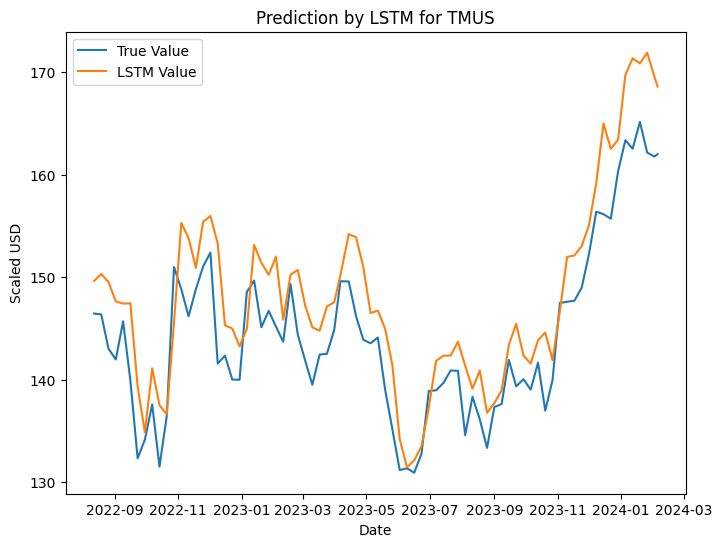

Mean Absolute Error (MAE): 4.189655560843552
Mean Squared Error (MSE): 23.85309538158803
Root Mean Squared Error (RMSE): 4.883963081513621
R-squared (R2) Score: 0.6422407690133752
1/1 [==============================] - 0s 30ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for TMUS : [[168.60599]]
Predicted Return for Next Month: [[4.071349]] %
Predicted Future Trend for TMUS : Increase
Accuracy of Trend Prediction for TMUS : 0.6623376623376623


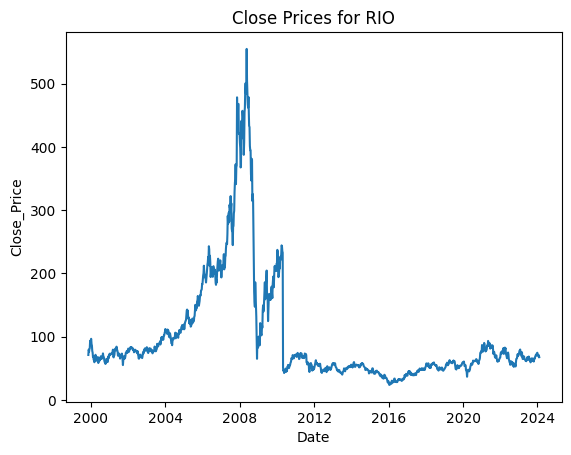

Epoch 1/100
8/8 [==============================] - 2s 4ms/step - loss: 5075.6011
Epoch 2/100
8/8 [==============================] - 0s 4ms/step - loss: 5073.1724
Epoch 3/100
8/8 [==============================] - 0s 3ms/step - loss: 5070.3540
Epoch 4/100
8/8 [==============================] - 0s 3ms/step - loss: 5067.1724
Epoch 5/100
8/8 [==============================] - 0s 4ms/step - loss: 5063.5259
Epoch 6/100
8/8 [==============================] - 0s 3ms/step - loss: 5059.1201
Epoch 7/100
8/8 [==============================] - 0s 4ms/step - loss: 5053.9580
Epoch 8/100
8/8 [==============================] - 0s 4ms/step - loss: 5047.4360
Epoch 9/100
8/8 [==============================] - 0s 4ms/step - loss: 5039.7095
Epoch 10/100
8/8 [==============================] - 0s 3ms/step - loss: 5030.0981
Epoch 11/100
8/8 [==============================] - 0s 4ms/step - loss: 5018.2544
Epoch 12/100
8/8 [==============================] - 0s 4ms/step - loss: 5002.5049
Epoch 13/100
8/8 [=======

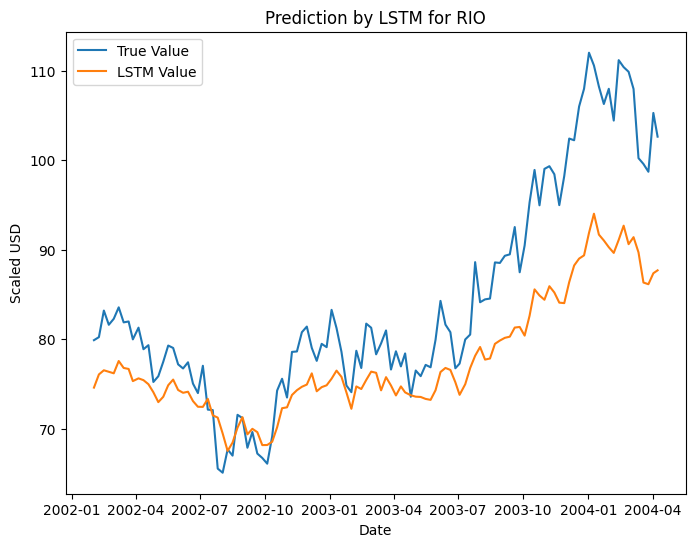

Mean Absolute Error (MAE): 6.771019106657607
Mean Squared Error (MSE): 74.32014853229119
Root Mean Squared Error (RMSE): 8.620913439554487
R-squared (R2) Score: 0.49327351811219433
1/1 [==============================] - 0s 24ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for RIO : [[73.103386]]
Predicted Return for Next Month: [[8.301312]] %
Predicted Future Trend for RIO : Increase
Accuracy of Trend Prediction for RIO : 0.672566371681416
Epoch 1/100
15/15 [==============================] - 2s 4ms/step - loss: 6146.8281
Epoch 2/100
15/15 [==============================] - 0s 4ms/step - loss: 6140.9668
Epoch 3/100
15/15 [==============================] - 0s 4ms/step - loss: 6133.1655
Epoch 4/100
15/15 [==============================] - 0s 4ms/step - loss: 6122.1914
Epoch 5/100
15/15 [==============================] - 0s 4ms/step - loss: 6105.5117
Epoch 6/100
15/15 [==============================] - 0s 4ms/step - loss: 6080.3945
Epoch 7/100
15/15 [==============================] - 0s 4ms/step - loss: 6039.8892
Epoch 8/100
15/15 [==============================] - 0s 4ms/step - loss: 5976.7490
Epoch 9/100
15/15 [==============================] - 0s 4ms/step - loss: 5875.9946
Epoch 10/100
15/15 [==============================] -

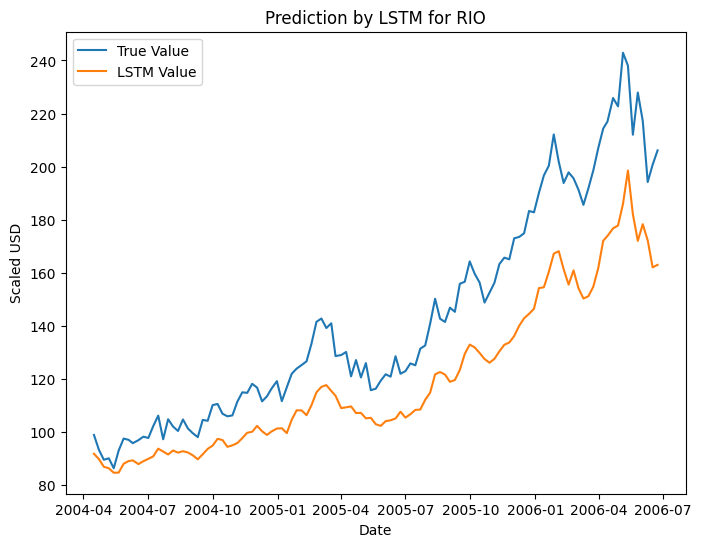

Mean Absolute Error (MAE): 22.654838798191232
Mean Squared Error (MSE): 671.4870906691295
Root Mean Squared Error (RMSE): 25.913067951694362
R-squared (R2) Score: 0.592864470796954
1/1 [==============================] - 0s 22ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for RIO : [[75.90884]]
Predicted Return for Next Month: [[12.457536]] %
Predicted Future Trend for RIO : Increase
Accuracy of Trend Prediction for RIO : 0.6194690265486725
Epoch 1/100
22/22 [==============================] - 2s 4ms/step - loss: 11415.2979
Epoch 2/100
22/22 [==============================] - 0s 4ms/step - loss: 11403.4248
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 11386.7129
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 11358.8877
Epoch 5/100
22/22 [==============================] - 0s 4ms/step - loss: 11310.3682
Epoch 6/100
22/22 [==============================] - 0s 3ms/step - loss: 11224.1719
Epoch 7/100
22/22 [==============================] - 0s 3ms/step - loss: 11068.5322
Epoch 8/100
22/22 [==============================] - 0s 3ms/step - loss: 10816.4697
Epoch 9/100
22/22 [==============================] - 0s 3ms/step - loss: 10374.8242
Epoch 10/100
22/22 [=======================

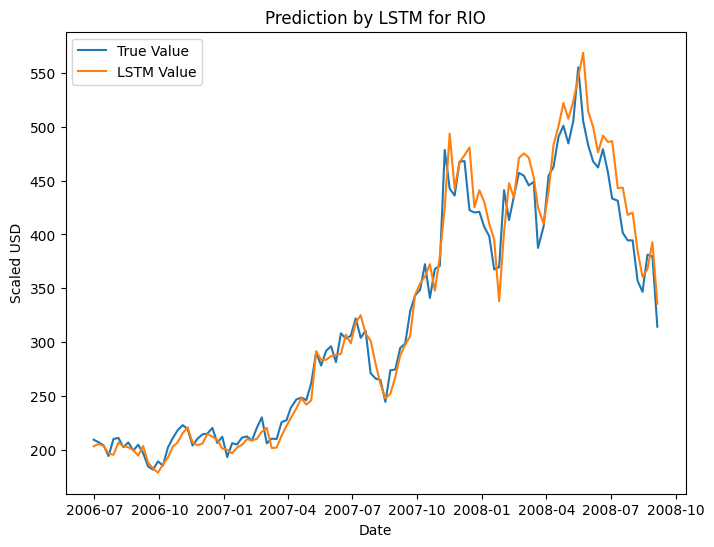

Mean Absolute Error (MAE): 13.699386108398437
Mean Squared Error (MSE): 362.4844322678619
Root Mean Squared Error (RMSE): 19.039023931595388
R-squared (R2) Score: 0.966577511859745
1/1 [==============================] - 0s 31ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for RIO : [[77.65654]]
Predicted Return for Next Month: [[15.046726]] %
Predicted Future Trend for RIO : Increase
Accuracy of Trend Prediction for RIO : 0.6991150442477876
Epoch 1/100
29/29 [==============================] - 2s 4ms/step - loss: 36597.6602
Epoch 2/100
29/29 [==============================] - 0s 3ms/step - loss: 36559.0156
Epoch 3/100
29/29 [==============================] - 0s 3ms/step - loss: 36487.5312
Epoch 4/100
29/29 [==============================] - 0s 3ms/step - loss: 36341.8438
Epoch 5/100
29/29 [==============================] - 0s 3ms/step - loss: 36038.4258
Epoch 6/100
29/29 [==============================] - 0s 3ms/step - loss: 35434.5000
Epoch 7/100
29/29 [==============================] - 0s 3ms/step - loss: 34387.9102
Epoch 8/100
29/29 [==============================] - 0s 4ms/step - loss: 32606.4277
Epoch 9/100
29/29 [==============================] - 0s 4ms/step - loss: 30217.7246
Epoch 10/100
29/29 [=======================

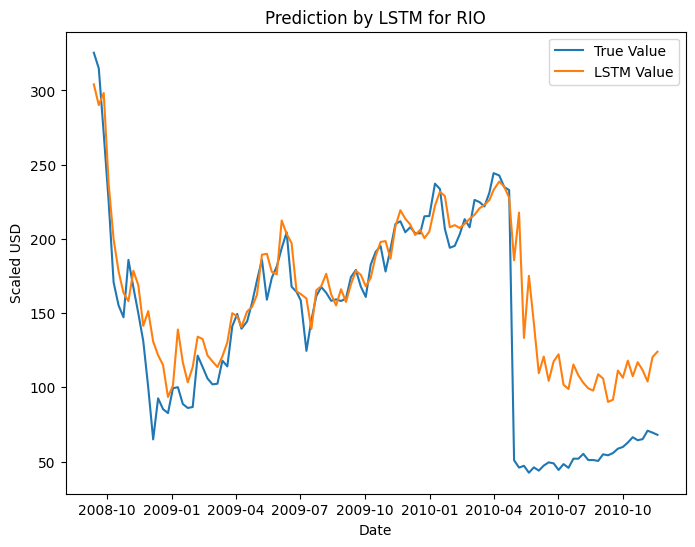

Mean Absolute Error (MAE): 26.08153056003736
Mean Squared Error (MSE): 1569.5197220653372
Root Mean Squared Error (RMSE): 39.61716448795064
R-squared (R2) Score: 0.6624741245657306
1/1 [==============================] - 0s 19ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for RIO : [[81.14195]]
Predicted Return for Next Month: [[20.2103]] %
Predicted Future Trend for RIO : Increase
Accuracy of Trend Prediction for RIO : 0.584070796460177
Epoch 1/100
36/36 [==============================] - 1s 3ms/step - loss: 34214.8047
Epoch 2/100
36/36 [==============================] - 0s 3ms/step - loss: 34182.5195
Epoch 3/100
36/36 [==============================] - 0s 4ms/step - loss: 34120.2031
Epoch 4/100
36/36 [==============================] - 0s 4ms/step - loss: 33975.3594
Epoch 5/100
36/36 [==============================] - 0s 3ms/step - loss: 33647.5430
Epoch 6/100
36/36 [==============================] - 0s 3ms/step - loss: 32937.4297
Epoch 7/100
36/36 [==============================] - 0s 3ms/step - loss: 31572.0078
Epoch 8/100
36/36 [==============================] - 0s 3ms/step - loss: 29316.0625
Epoch 9/100
36/36 [==============================] - 0s 4ms/step - loss: 26226.6797
Epoch 10/100
36/36 [==========================

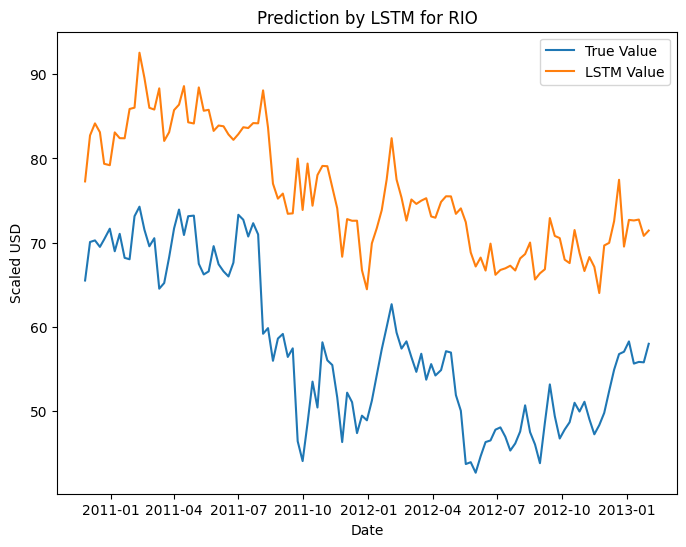

Mean Absolute Error (MAE): 18.429562850288722
Mean Squared Error (MSE): 360.4796019258592
Root Mean Squared Error (RMSE): 18.986300374898192
R-squared (R2) Score: -3.185979839082778
1/1 [==============================] - 0s 19ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for RIO : [[76.04108]]
Predicted Return for Next Month: [[12.653446]] %
Predicted Future Trend for RIO : Increase
Accuracy of Trend Prediction for RIO : 0.6194690265486725
Epoch 1/100
44/44 [==============================] - 2s 3ms/step - loss: 29082.9355
Epoch 2/100
44/44 [==============================] - 0s 3ms/step - loss: 29037.5508
Epoch 3/100
44/44 [==============================] - 0s 4ms/step - loss: 28906.6172
Epoch 4/100
44/44 [==============================] - 0s 4ms/step - loss: 28477.3945
Epoch 5/100
44/44 [==============================] - 0s 4ms/step - loss: 27286.3828
Epoch 6/100
44/44 [==============================] - 0s 4ms/step - loss: 24819.1758
Epoch 7/100
44/44 [==============================] - 0s 4ms/step - loss: 21094.4727
Epoch 8/100
44/44 [==============================] - 0s 4ms/step - loss: 16629.8008
Epoch 9/100
44/44 [==============================] - 0s 4ms/step - loss: 12032.8857
Epoch 10/100
44/44 [=======================

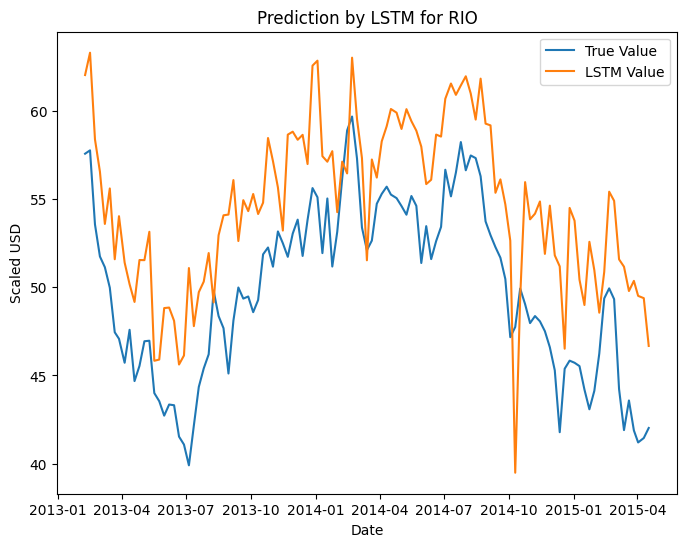

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 5.011153929337211
Mean Squared Error (MSE): 29.753348415158165
Root Mean Squared Error (RMSE): 5.4546629973957295
R-squared (R2) Score: -0.23992932581932447
1/1 [==============================] - 0s 19ms/step
Predicted Future Close Price for RIO : [[73.191765]]
Predicted Return for Next Month: [[8.432244]] %
Predicted Future Trend for RIO : Increase
Accuracy of Trend Prediction for RIO : 0.5309734513274337
Epoch 1/100
51/51 [==============================] - 2s 4ms/step - loss: 25287.2031
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 25225.4199
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 25009.1035
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 24291.3086
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 22351.6895
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 18848.9512
Epoch 7/100
51/51 [==============================] - 0s 4ms

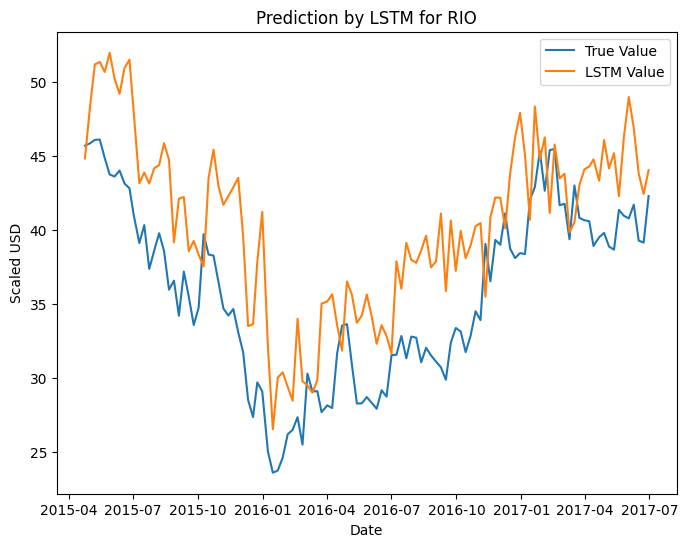

Mean Absolute Error (MAE): 5.069000003980555
Mean Squared Error (MSE): 31.84034281142936
Root Mean Squared Error (RMSE): 5.642724768356982
R-squared (R2) Score: 0.08486494052917881
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for RIO : [[72.0718]]
Predicted Return for Next Month: [[6.7730374]] %
Predicted Future Trend for RIO : Increase
Accuracy of Trend Prediction for RIO : 0.5398230088495575
Epoch 1/100
58/58 [==============================] - 2s 4ms/step - loss: 22291.1602
Epoch 2/100
58/58 [==============================] - 0s 4ms/step - loss: 22234.3418
Epoch 3/100
58/58 [==============================] - 0s 4ms/step - loss: 22027.2949
Epoch 4/100
58/58 [==============================] - 0s 4ms/step - loss: 21246.6191
Epoch 5/100
58/58 [==============================] - 0s 4ms/step - loss: 19357.0352
Epoch 6/100
58/58 [==============================] - 0s 4ms/step - loss: 16317.5244
Epoch 7/100
58/58 [==============================] - 0s 4ms/step - loss: 12886.4678
Epoch 8/100
58/58 [==============================] - 0s 4ms/step - loss: 9756.3555
Epoch 9/100
58/58 [==============================] - 0s 4ms/step - loss: 7158.1655
Epoch 10/100
58/58 [==========================

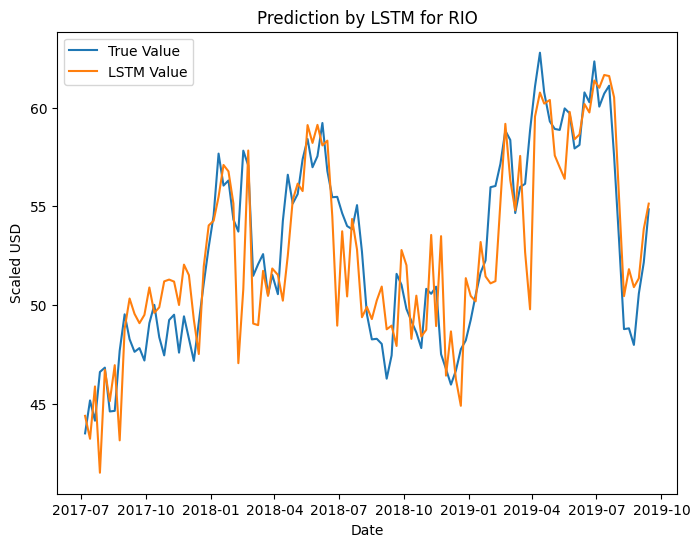

Mean Absolute Error (MAE): 1.922783739172894
Mean Squared Error (MSE): 6.262786888906853
Root Mean Squared Error (RMSE): 2.502556071081496
R-squared (R2) Score: 0.7308144834728139
1/1 [==============================] - 0s 31ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for RIO : [[71.372475]]
Predicted Return for Next Month: [[5.7369995]] %
Predicted Future Trend for RIO : Increase
Accuracy of Trend Prediction for RIO : 0.6017699115044248
Epoch 1/100
65/65 [==============================] - 2s 4ms/step - loss: 20125.4414
Epoch 2/100
65/65 [==============================] - 0s 4ms/step - loss: 20047.9980
Epoch 3/100
65/65 [==============================] - 0s 4ms/step - loss: 19701.9824
Epoch 4/100
65/65 [==============================] - 0s 4ms/step - loss: 18460.6699
Epoch 5/100
65/65 [==============================] - 0s 4ms/step - loss: 15707.2109
Epoch 6/100
65/65 [==============================] - 0s 4ms/step - loss: 12232.6641
Epoch 7/100
65/65 [==============================] - 0s 4ms/step - loss: 9083.3828
Epoch 8/100
65/65 [==============================] - 0s 4ms/step - loss: 6868.8604
Epoch 9/100
65/65 [==============================] - 0s 4ms/step - loss: 5215.3970
Epoch 10/100
65/65 [=========================

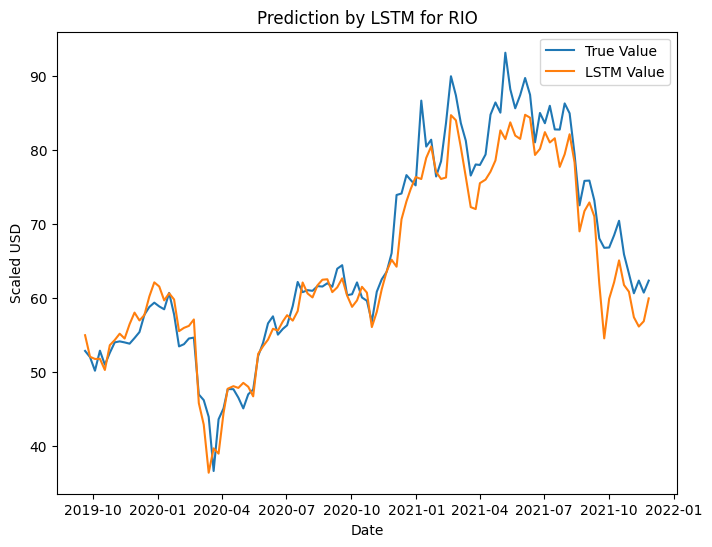

Mean Absolute Error (MAE): 2.841241319739301
Mean Squared Error (MSE): 14.296239368957592
Root Mean Squared Error (RMSE): 3.781036811372985
R-squared (R2) Score: 0.9218177253002419
1/1 [==============================] - 0s 23ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for RIO : [[69.58676]]
Predicted Return for Next Month: [[3.0914984]] %
Predicted Future Trend for RIO : Increase
Accuracy of Trend Prediction for RIO : 0.7168141592920354
Epoch 1/100
72/72 [==============================] - 2s 4ms/step - loss: 18563.0352
Epoch 2/100
72/72 [==============================] - 0s 4ms/step - loss: 18450.4375
Epoch 3/100
72/72 [==============================] - 0s 4ms/step - loss: 17921.6699
Epoch 4/100
72/72 [==============================] - 0s 4ms/step - loss: 16104.2344
Epoch 5/100
72/72 [==============================] - 0s 4ms/step - loss: 13005.0039
Epoch 6/100
72/72 [==============================] - 0s 4ms/step - loss: 9865.6162
Epoch 7/100
72/72 [==============================] - 0s 4ms/step - loss: 7371.4360
Epoch 8/100
72/72 [==============================] - 0s 4ms/step - loss: 5726.1670
Epoch 9/100
72/72 [==============================] - 0s 4ms/step - loss: 4523.5649
Epoch 10/100
72/72 [===========================

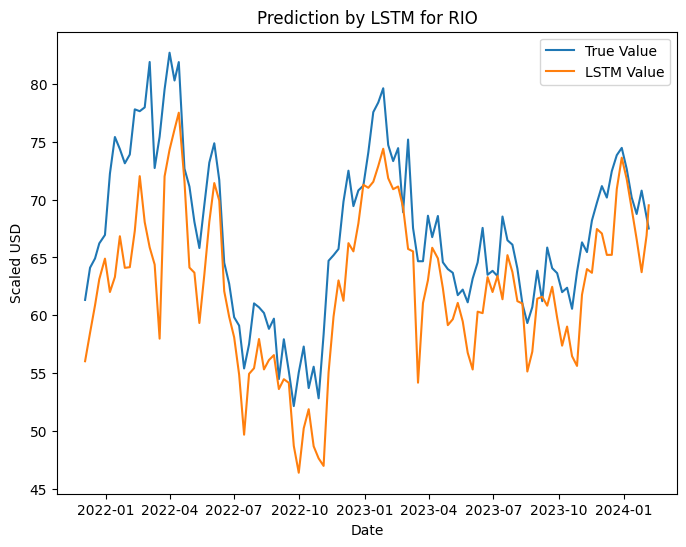

Mean Absolute Error (MAE): 4.621822615913723
Mean Squared Error (MSE): 31.712323299423986
Root Mean Squared Error (RMSE): 5.631369575815814
R-squared (R2) Score: 0.3304795571167367
1/1 [==============================] - 0s 25ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for RIO : [[69.49968]]
Predicted Return for Next Month: [[2.9624884]] %
Predicted Future Trend for RIO : Increase
Accuracy of Trend Prediction for RIO : 0.6637168141592921


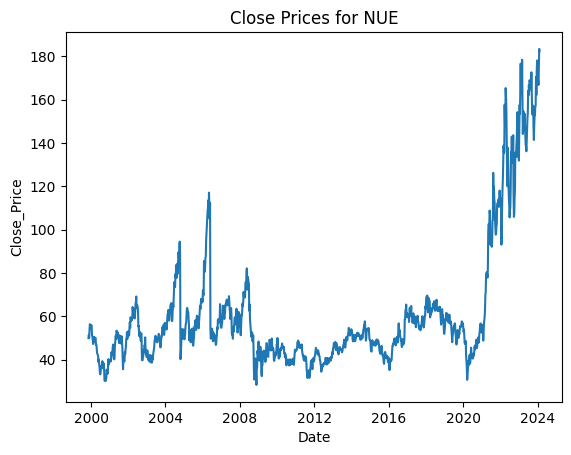

Epoch 1/100
8/8 [==============================] - 2s 4ms/step - loss: 2006.3473
Epoch 2/100
8/8 [==============================] - 0s 4ms/step - loss: 2005.2762
Epoch 3/100
8/8 [==============================] - 0s 4ms/step - loss: 2004.1223
Epoch 4/100
8/8 [==============================] - 0s 4ms/step - loss: 2002.8451
Epoch 5/100
8/8 [==============================] - 0s 4ms/step - loss: 2001.4349
Epoch 6/100
8/8 [==============================] - 0s 4ms/step - loss: 1999.7820
Epoch 7/100
8/8 [==============================] - 0s 4ms/step - loss: 1997.8461
Epoch 8/100
8/8 [==============================] - 0s 4ms/step - loss: 1995.4911
Epoch 9/100
8/8 [==============================] - 0s 4ms/step - loss: 1992.6395
Epoch 10/100
8/8 [==============================] - 0s 4ms/step - loss: 1989.1714
Epoch 11/100
8/8 [==============================] - 0s 4ms/step - loss: 1984.6360
Epoch 12/100
8/8 [==============================] - 0s 4ms/step - loss: 1978.9926
Epoch 13/100
8/8 [=======

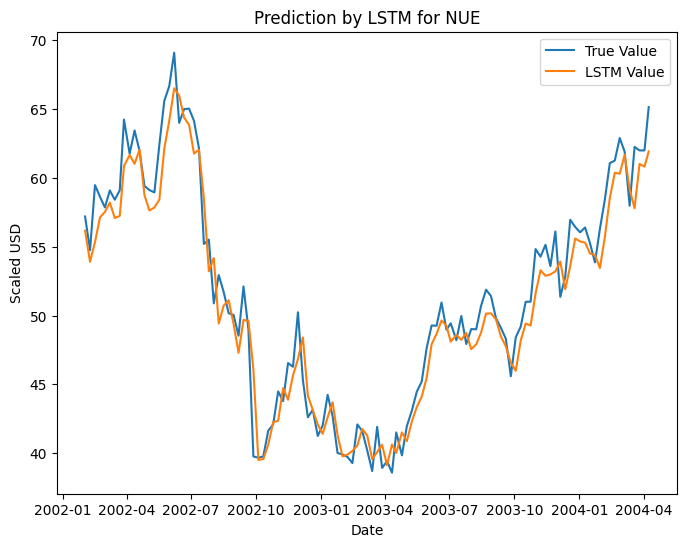

Mean Absolute Error (MAE): 1.5214909031080164
Mean Squared Error (MSE): 3.567664897447071
Root Mean Squared Error (RMSE): 1.8888263280267645
R-squared (R2) Score: 0.9453048418395991
1/1 [==============================] - 0s 29ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NUE : [[213.53694]]
Predicted Return for Next Month: [[17.128487]] %
Predicted Future Trend for NUE : Increase
Accuracy of Trend Prediction for NUE : 0.5309734513274337
Epoch 1/100
15/15 [==============================] - 2s 4ms/step - loss: 2365.3032
Epoch 2/100
15/15 [==============================] - 0s 4ms/step - loss: 2361.8240
Epoch 3/100
15/15 [==============================] - 0s 4ms/step - loss: 2357.0022
Epoch 4/100
15/15 [==============================] - 0s 4ms/step - loss: 2349.9570
Epoch 5/100
15/15 [==============================] - 0s 4ms/step - loss: 2339.0129
Epoch 6/100
15/15 [==============================] - 0s 4ms/step - loss: 2321.6692
Epoch 7/100
15/15 [==============================] - 0s 4ms/step - loss: 2293.7000
Epoch 8/100
15/15 [==============================] - 0s 4ms/step - loss: 2247.8816
Epoch 9/100
15/15 [==============================] - 0s 4ms/step - loss: 2175.8181
Epoch 10/100
15/15 [==============================]

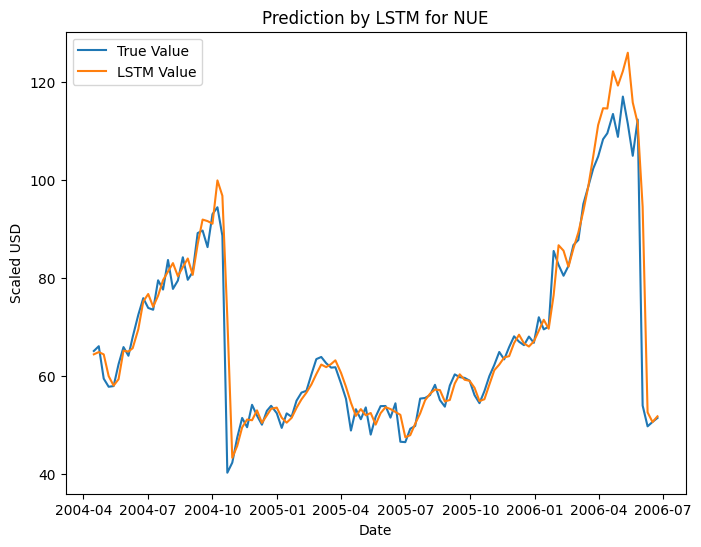

Mean Absolute Error (MAE): 2.9443999580715015
Mean Squared Error (MSE): 34.45600099238018
Root Mean Squared Error (RMSE): 5.869923423042262
R-squared (R2) Score: 0.8964352892277121
1/1 [==============================] - 0s 18ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NUE : [[222.57971]]
Predicted Return for Next Month: [[22.088593]] %
Predicted Future Trend for NUE : Increase
Accuracy of Trend Prediction for NUE : 0.6902654867256637
Epoch 1/100
22/22 [==============================] - 2s 4ms/step - loss: 3205.1184
Epoch 2/100
22/22 [==============================] - 0s 4ms/step - loss: 3197.8682
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 3185.7795
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 3163.3149
Epoch 5/100
22/22 [==============================] - 0s 4ms/step - loss: 3118.5217
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 3027.5439
Epoch 7/100
22/22 [==============================] - 0s 4ms/step - loss: 2855.3503
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 2544.5190
Epoch 9/100
22/22 [==============================] - 0s 4ms/step - loss: 2066.9070
Epoch 10/100
22/22 [==============================]

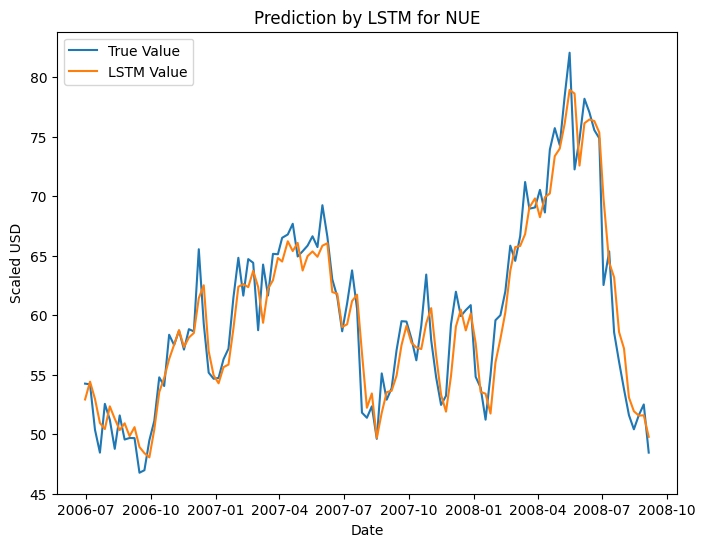

Mean Absolute Error (MAE): 1.7259599848208218
Mean Squared Error (MSE): 4.859442741469533
Root Mean Squared Error (RMSE): 2.204414376080308
R-squared (R2) Score: 0.9212294679560415
1/1 [==============================] - 0s 23ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NUE : [[203.84361]]
Predicted Return for Next Month: [[11.811538]] %
Predicted Future Trend for NUE : Increase
Accuracy of Trend Prediction for NUE : 0.6283185840707964
Epoch 1/100
29/29 [==============================] - 2s 4ms/step - loss: 3320.0696
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 3307.5759
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 3278.9331
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 3200.1995
Epoch 5/100
29/29 [==============================] - 0s 4ms/step - loss: 2979.3333
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 2482.2656
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 1636.1635
Epoch 8/100
29/29 [==============================] - 0s 4ms/step - loss: 781.0386
Epoch 9/100
29/29 [==============================] - 0s 4ms/step - loss: 226.9533
Epoch 10/100
29/29 [==============================] -

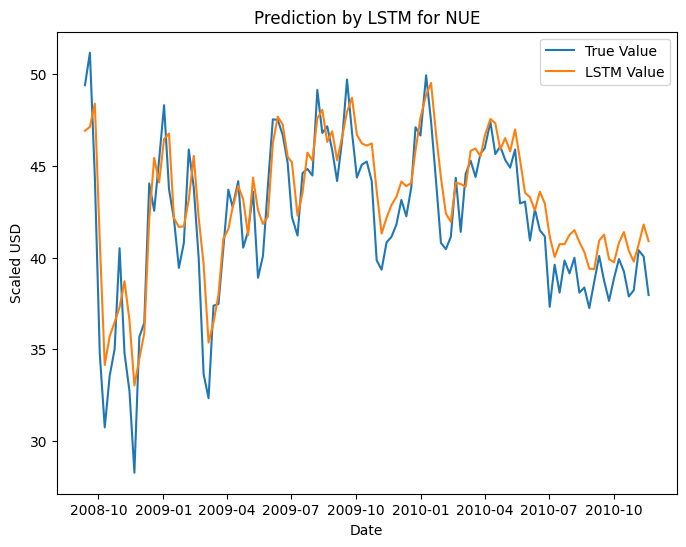

Mean Absolute Error (MAE): 1.7139665673297382
Mean Squared Error (MSE): 4.40094098665833
Root Mean Squared Error (RMSE): 2.097841983243335
R-squared (R2) Score: 0.7577171659297286
1/1 [==============================] - 0s 35ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NUE : [[209.92]]
Predicted Return for Next Month: [[15.144534]] %
Predicted Future Trend for NUE : Increase
Accuracy of Trend Prediction for NUE : 0.6548672566371682
Epoch 1/100
36/36 [==============================] - 2s 4ms/step - loss: 3011.3936
Epoch 2/100
36/36 [==============================] - 0s 3ms/step - loss: 2994.6094
Epoch 3/100
36/36 [==============================] - 0s 3ms/step - loss: 2943.4221
Epoch 4/100
36/36 [==============================] - 0s 3ms/step - loss: 2771.7178
Epoch 5/100
36/36 [==============================] - 0s 4ms/step - loss: 2277.8811
Epoch 6/100
36/36 [==============================] - 0s 4ms/step - loss: 1349.3334
Epoch 7/100
36/36 [==============================] - 0s 4ms/step - loss: 466.9479
Epoch 8/100
36/36 [==============================] - 0s 4ms/step - loss: 98.3152
Epoch 9/100
36/36 [==============================] - 0s 4ms/step - loss: 53.7435
Epoch 10/100
36/36 [==============================] - 0s 4m

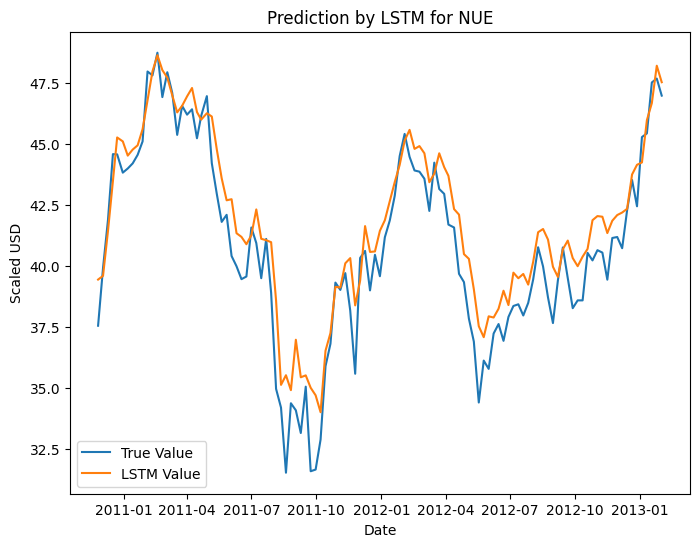

Mean Absolute Error (MAE): 1.1701564384128738
Mean Squared Error (MSE): 2.086015701488378
Root Mean Squared Error (RMSE): 1.44430457365764
R-squared (R2) Score: 0.8670898511237266
1/1 [==============================] - 0s 22ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NUE : [[212.84676]]
Predicted Return for Next Month: [[16.74991]] %
Predicted Future Trend for NUE : Increase
Accuracy of Trend Prediction for NUE : 0.6814159292035398
Epoch 1/100
44/44 [==============================] - 2s 4ms/step - loss: 2790.1924
Epoch 2/100
44/44 [==============================] - 0s 4ms/step - loss: 2773.0383
Epoch 3/100
44/44 [==============================] - 0s 4ms/step - loss: 2703.8755
Epoch 4/100
44/44 [==============================] - 0s 4ms/step - loss: 2406.0681
Epoch 5/100
44/44 [==============================] - 0s 4ms/step - loss: 1627.9058
Epoch 6/100
44/44 [==============================] - 0s 4ms/step - loss: 661.1841
Epoch 7/100
44/44 [==============================] - 0s 4ms/step - loss: 148.1703
Epoch 8/100
44/44 [==============================] - 0s 4ms/step - loss: 50.2251
Epoch 9/100
44/44 [==============================] - 0s 4ms/step - loss: 41.8339
Epoch 10/100
44/44 [==============================] - 0s 4

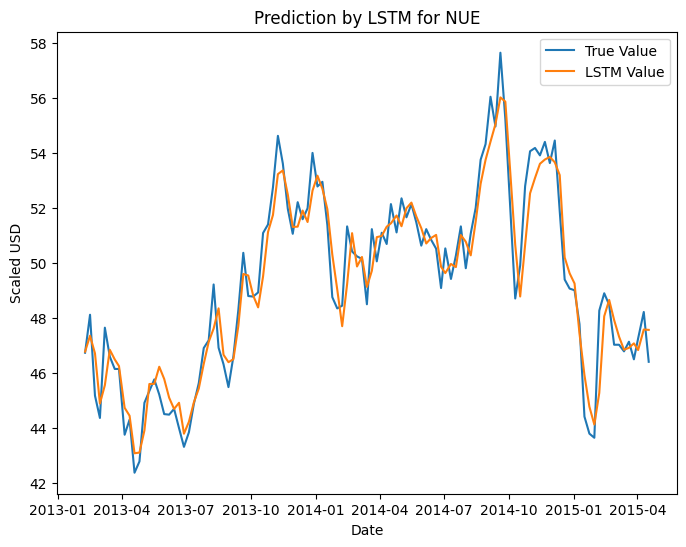

Mean Absolute Error (MAE): 0.7151682314665418
Mean Squared Error (MSE): 0.8083179132226846
Root Mean Squared Error (RMSE): 0.8990650216879115
R-squared (R2) Score: 0.9280451172197262
1/1 [==============================] - 0s 18ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NUE : [[215.33722]]
Predicted Return for Next Month: [[18.115969]] %
Predicted Future Trend for NUE : Increase
Accuracy of Trend Prediction for NUE : 0.672566371681416
Epoch 1/100
51/51 [==============================] - 2s 4ms/step - loss: 2737.2808
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 2706.3425
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 2562.1101
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 1954.5220
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 819.5348
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 127.7688
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 41.6884
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 38.0900
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 38.6729
Epoch 10/100
51/51 [==============================] - 0s 4ms

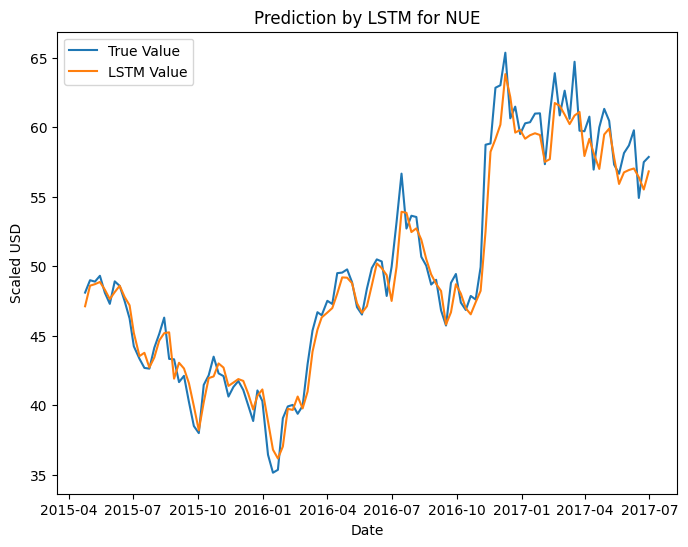

Mean Absolute Error (MAE): 1.1339847730553674
Mean Squared Error (MSE): 2.1962847721818646
Root Mean Squared Error (RMSE): 1.481986765184448
R-squared (R2) Score: 0.9638759206331344
1/1 [==============================] - 0s 30ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NUE : [[214.87814]]
Predicted Return for Next Month: [[17.864157]] %
Predicted Future Trend for NUE : Increase
Accuracy of Trend Prediction for NUE : 0.7345132743362832
Epoch 1/100
58/58 [==============================] - 2s 4ms/step - loss: 2708.6316
Epoch 2/100
58/58 [==============================] - 0s 3ms/step - loss: 2633.4243
Epoch 3/100
58/58 [==============================] - 0s 3ms/step - loss: 2105.4614
Epoch 4/100
58/58 [==============================] - 0s 3ms/step - loss: 741.8078
Epoch 5/100
58/58 [==============================] - 0s 3ms/step - loss: 65.6415
Epoch 6/100
58/58 [==============================] - 0s 3ms/step - loss: 32.4481
Epoch 7/100
58/58 [==============================] - 0s 3ms/step - loss: 31.9250
Epoch 8/100
58/58 [==============================] - 0s 3ms/step - loss: 32.5923
Epoch 9/100
58/58 [==============================] - 0s 3ms/step - loss: 32.8923
Epoch 10/100
58/58 [==============================] - 0s 3ms/s

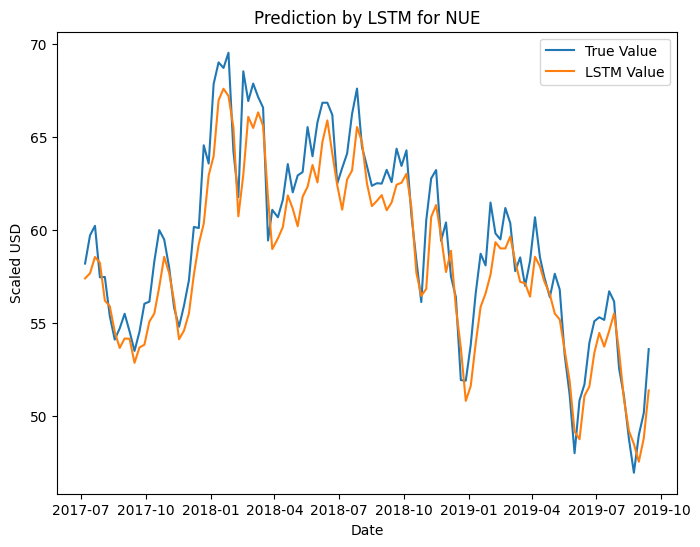

Mean Absolute Error (MAE): 1.4694955630095108
Mean Squared Error (MSE): 3.1454550094400138
Root Mean Squared Error (RMSE): 1.773543066700105
R-squared (R2) Score: 0.8782847023843919
1/1 [==============================] - 0s 23ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NUE : [[213.80132]]
Predicted Return for Next Month: [[17.2735]] %
Predicted Future Trend for NUE : Increase
Accuracy of Trend Prediction for NUE : 0.7168141592920354
Epoch 1/100
65/65 [==============================] - 2s 4ms/step - loss: 2797.1470
Epoch 2/100
65/65 [==============================] - 0s 3ms/step - loss: 2660.7974
Epoch 3/100
65/65 [==============================] - 0s 3ms/step - loss: 1693.3922
Epoch 4/100
65/65 [==============================] - 0s 3ms/step - loss: 242.7504
Epoch 5/100
65/65 [==============================] - 0s 3ms/step - loss: 38.4736
Epoch 6/100
65/65 [==============================] - 0s 4ms/step - loss: 36.2250
Epoch 7/100
65/65 [==============================] - 0s 3ms/step - loss: 33.1432
Epoch 8/100
65/65 [==============================] - 0s 3ms/step - loss: 28.5006
Epoch 9/100
65/65 [==============================] - 0s 3ms/step - loss: 33.7176
Epoch 10/100
65/65 [==============================] - 0s 3ms/ste

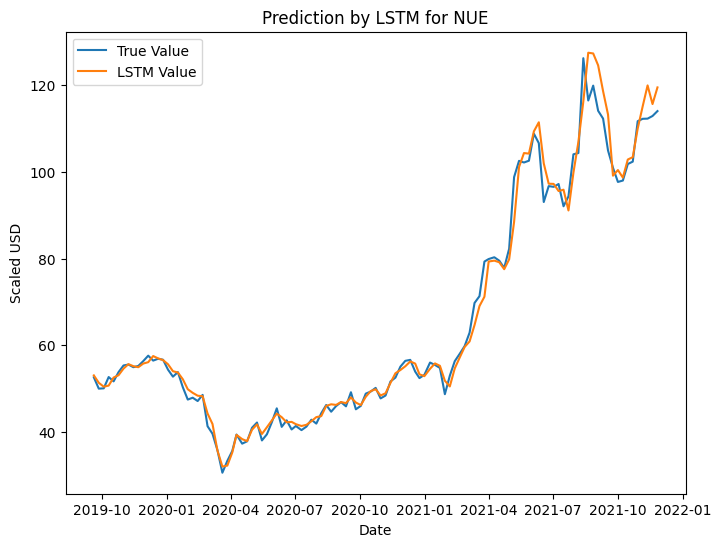

Mean Absolute Error (MAE): 1.9020098531971812
Mean Squared Error (MSE): 9.539297824590609
Root Mean Squared Error (RMSE): 3.0885753713630835
R-squared (R2) Score: 0.9857434331935114
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NUE : [[217.70404]]
Predicted Return for Next Month: [[19.41421]] %
Predicted Future Trend for NUE : Increase
Accuracy of Trend Prediction for NUE : 0.7256637168141593
Epoch 1/100
72/72 [==============================] - 3s 4ms/step - loss: 3009.5837
Epoch 2/100
72/72 [==============================] - 0s 4ms/step - loss: 2868.5205
Epoch 3/100
72/72 [==============================] - 0s 4ms/step - loss: 1951.1896
Epoch 4/100
72/72 [==============================] - 0s 4ms/step - loss: 414.0604
Epoch 5/100
72/72 [==============================] - 0s 4ms/step - loss: 45.8496
Epoch 6/100
72/72 [==============================] - 0s 4ms/step - loss: 39.5311
Epoch 7/100
72/72 [==============================] - 0s 4ms/step - loss: 36.5182
Epoch 8/100
72/72 [==============================] - 0s 4ms/step - loss: 36.4366
Epoch 9/100
72/72 [==============================] - 0s 4ms/step - loss: 34.7253
Epoch 10/100
72/72 [==============================] - 0s 4ms/st

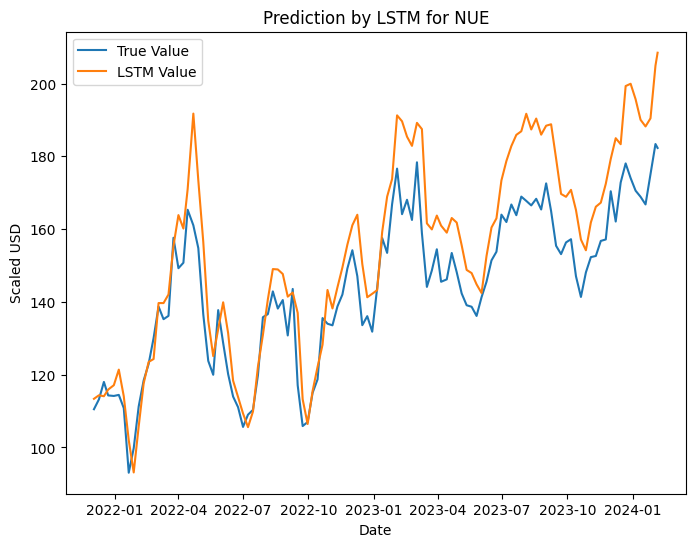

Mean Absolute Error (MAE): 11.14362109905741
Mean Squared Error (MSE): 180.26044420684693
Root Mean Squared Error (RMSE): 13.42611053905214
R-squared (R2) Score: 0.5908817256935297
1/1 [==============================] - 0s 27ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for NUE : [[208.48622]]
Predicted Return for Next Month: [[14.358084]] %
Predicted Future Trend for NUE : Increase
Accuracy of Trend Prediction for NUE : 0.7345132743362832


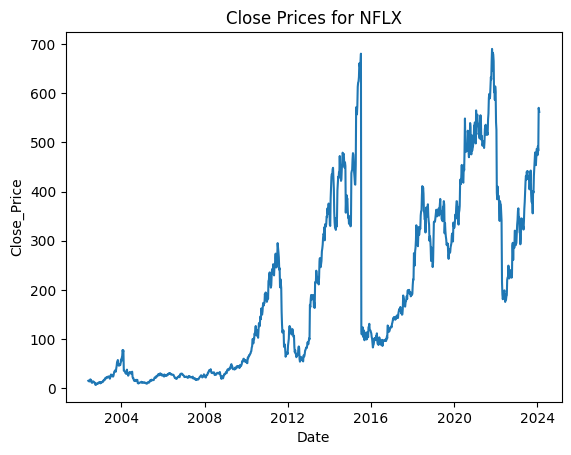

Epoch 1/100
7/7 [==============================] - 2s 4ms/step - loss: 966.5644
Epoch 2/100
7/7 [==============================] - 0s 4ms/step - loss: 965.7822
Epoch 3/100
7/7 [==============================] - 0s 4ms/step - loss: 964.9153
Epoch 4/100
7/7 [==============================] - 0s 4ms/step - loss: 963.9572
Epoch 5/100
7/7 [==============================] - 0s 4ms/step - loss: 962.8371
Epoch 6/100
7/7 [==============================] - 0s 4ms/step - loss: 961.5671
Epoch 7/100
7/7 [==============================] - 0s 4ms/step - loss: 960.1080
Epoch 8/100
7/7 [==============================] - 0s 4ms/step - loss: 958.3460
Epoch 9/100
7/7 [==============================] - 0s 4ms/step - loss: 956.2368
Epoch 10/100
7/7 [==============================] - 0s 5ms/step - loss: 953.7878
Epoch 11/100
7/7 [==============================] - 0s 4ms/step - loss: 951.0526
Epoch 12/100
7/7 [==============================] - 0s 4ms/step - loss: 947.6171
Epoch 13/100
7/7 [===================

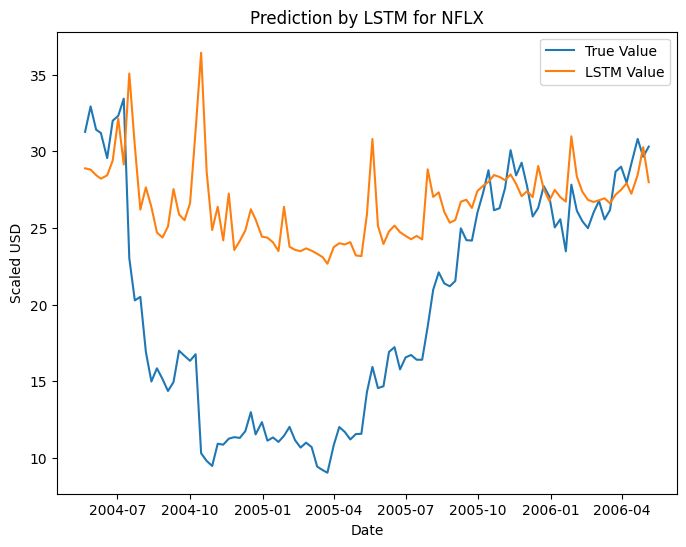

Mean Absolute Error (MAE): 7.346903591711545
Mean Squared Error (MSE): 84.98579364523944
Root Mean Squared Error (RMSE): 9.218773977337737
R-squared (R2) Score: -0.5102580343152021
1/1 [==============================] - 0s 28ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NFLX : [[219.66043]]
Predicted Return for Next Month: [[-60.91869]] %
Predicted Future Trend for NFLX : Decrease
Accuracy of Trend Prediction for NFLX : 0.6039603960396039
Epoch 1/100
13/13 [==============================] - 2s 5ms/step - loss: 710.1207
Epoch 2/100
13/13 [==============================] - 0s 5ms/step - loss: 708.9862
Epoch 3/100
13/13 [==============================] - 0s 4ms/step - loss: 707.6006
Epoch 4/100
13/13 [==============================] - 0s 4ms/step - loss: 705.8528
Epoch 5/100
13/13 [==============================] - 0s 4ms/step - loss: 703.4927
Epoch 6/100
13/13 [==============================] - 0s 4ms/step - loss: 700.2798
Epoch 7/100
13/13 [==============================] - 0s 4ms/step - loss: 695.9569
Epoch 8/100
13/13 [==============================] - 0s 4ms/step - loss: 689.7950
Epoch 9/100
13/13 [==============================] - 0s 4ms/step - loss: 681.0503
Epoch 10/100
13/13 [==============================] - 0s 

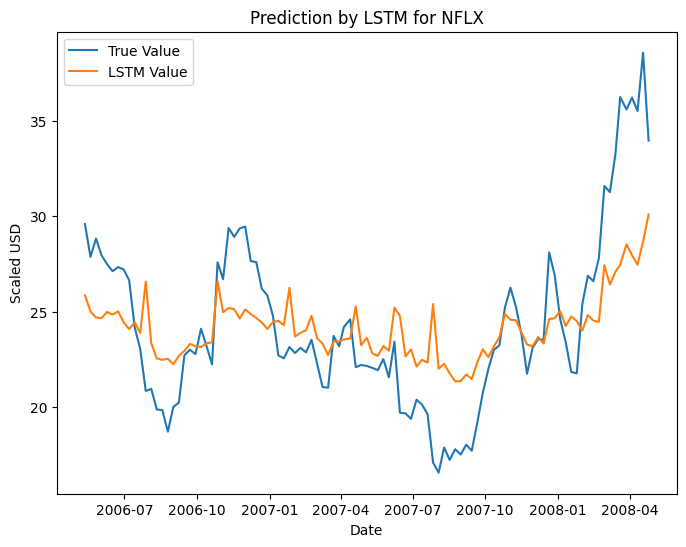

Mean Absolute Error (MAE): 2.5355356753451153
Mean Squared Error (MSE): 10.67141956262781
Root Mean Squared Error (RMSE): 3.2667138782923444
R-squared (R2) Score: 0.4790243029798269
1/1 [==============================] - 0s 25ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NFLX : [[290.54602]]
Predicted Return for Next Month: [[-48.30694]] %
Predicted Future Trend for NFLX : Decrease
Accuracy of Trend Prediction for NFLX : 0.6534653465346535
Epoch 1/100
20/20 [==============================] - 2s 5ms/step - loss: 676.7672
Epoch 2/100
20/20 [==============================] - 0s 5ms/step - loss: 675.0834
Epoch 3/100
20/20 [==============================] - 0s 4ms/step - loss: 672.7728
Epoch 4/100
20/20 [==============================] - 0s 4ms/step - loss: 669.2196
Epoch 5/100
20/20 [==============================] - 0s 4ms/step - loss: 663.3182
Epoch 6/100
20/20 [==============================] - 0s 4ms/step - loss: 653.2578
Epoch 7/100
20/20 [==============================] - 0s 4ms/step - loss: 635.8634
Epoch 8/100
20/20 [==============================] - 0s 4ms/step - loss: 605.7080
Epoch 9/100
20/20 [==============================] - 0s 4ms/step - loss: 555.8145
Epoch 10/100
20/20 [==============================] - 0s 

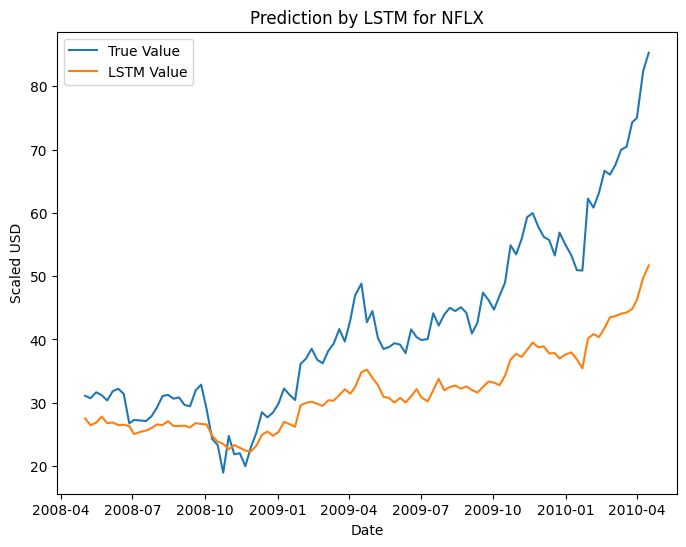

Mean Absolute Error (MAE): 10.38756578612096
Mean Squared Error (MSE): 168.5941663103859
Root Mean Squared Error (RMSE): 12.984381629880797
R-squared (R2) Score: 0.17821770824269767
1/1 [==============================] - 0s 21ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NFLX : [[354.24255]]
Predicted Return for Next Month: [[-36.974247]] %
Predicted Future Trend for NFLX : Decrease
Accuracy of Trend Prediction for NFLX : 0.5742574257425742
Epoch 1/100
26/26 [==============================] - 2s 4ms/step - loss: 996.5429
Epoch 2/100
26/26 [==============================] - 0s 4ms/step - loss: 992.6132
Epoch 3/100
26/26 [==============================] - 0s 5ms/step - loss: 985.9959
Epoch 4/100
26/26 [==============================] - 0s 4ms/step - loss: 973.5306
Epoch 5/100
26/26 [==============================] - 0s 4ms/step - loss: 947.8266
Epoch 6/100
26/26 [==============================] - 0s 4ms/step - loss: 896.5884
Epoch 7/100
26/26 [==============================] - 0s 4ms/step - loss: 806.0149
Epoch 8/100
26/26 [==============================] - 0s 4ms/step - loss: 660.8100
Epoch 9/100
26/26 [==============================] - 0s 4ms/step - loss: 472.9546
Epoch 10/100
26/26 [==============================] - 0s

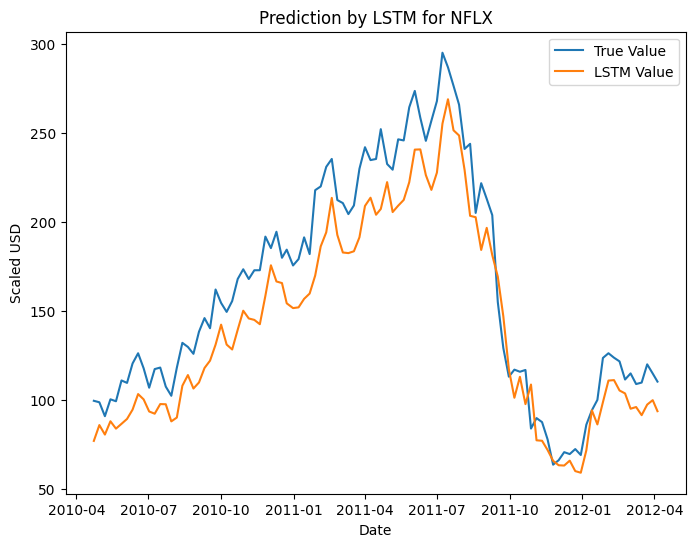

Mean Absolute Error (MAE): 21.16379810370288
Mean Squared Error (MSE): 554.7679050951693
Root Mean Squared Error (RMSE): 23.55351152365968
R-squared (R2) Score: 0.856290462946636
1/1 [==============================] - 0s 31ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NFLX : [[565.4388]]
Predicted Return for Next Month: [[0.60114294]] %
Predicted Future Trend for NFLX : Increase
Accuracy of Trend Prediction for NFLX : 0.6336633663366337
Epoch 1/100
33/33 [==============================] - 2s 4ms/step - loss: 6812.7666
Epoch 2/100
33/33 [==============================] - 0s 4ms/step - loss: 6801.7349
Epoch 3/100
33/33 [==============================] - 0s 4ms/step - loss: 6784.1396
Epoch 4/100
33/33 [==============================] - 0s 4ms/step - loss: 6751.0942
Epoch 5/100
33/33 [==============================] - 0s 4ms/step - loss: 6685.5552
Epoch 6/100
33/33 [==============================] - 0s 4ms/step - loss: 6555.5146
Epoch 7/100
33/33 [==============================] - 0s 4ms/step - loss: 6325.9443
Epoch 8/100
33/33 [==============================] - 0s 4ms/step - loss: 5931.8008
Epoch 9/100
33/33 [==============================] - 0s 4ms/step - loss: 5354.7212
Epoch 10/100
33/33 [============================

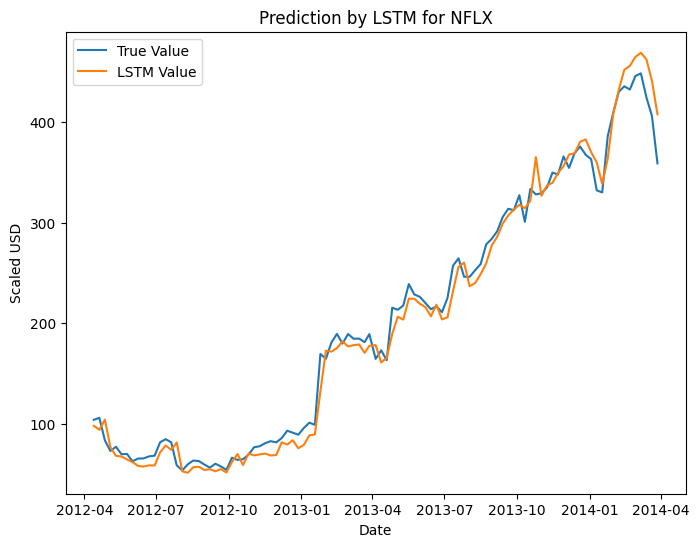

Mean Absolute Error (MAE): 10.805584667909491
Mean Squared Error (MSE): 195.30208266015816
Root Mean Squared Error (RMSE): 13.975052152323373
R-squared (R2) Score: 0.9870886685695324
1/1 [==============================] - 0s 27ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NFLX : [[618.01984]]
Predicted Return for Next Month: [[9.956204]] %
Predicted Future Trend for NFLX : Increase
Accuracy of Trend Prediction for NFLX : 0.6237623762376238
Epoch 1/100
39/39 [==============================] - 2s 4ms/step - loss: 14993.8271
Epoch 2/100
39/39 [==============================] - 0s 4ms/step - loss: 14965.7363
Epoch 3/100
39/39 [==============================] - 0s 4ms/step - loss: 14909.1572
Epoch 4/100
39/39 [==============================] - 0s 4ms/step - loss: 14780.8105
Epoch 5/100
39/39 [==============================] - 0s 4ms/step - loss: 14476.7607
Epoch 6/100
39/39 [==============================] - 0s 4ms/step - loss: 13844.4883
Epoch 7/100
39/39 [==============================] - 0s 4ms/step - loss: 12785.9697
Epoch 8/100
39/39 [==============================] - 0s 4ms/step - loss: 11312.4307
Epoch 9/100
39/39 [==============================] - 0s 4ms/step - loss: 9654.6240
Epoch 10/100
39/39 [=====================

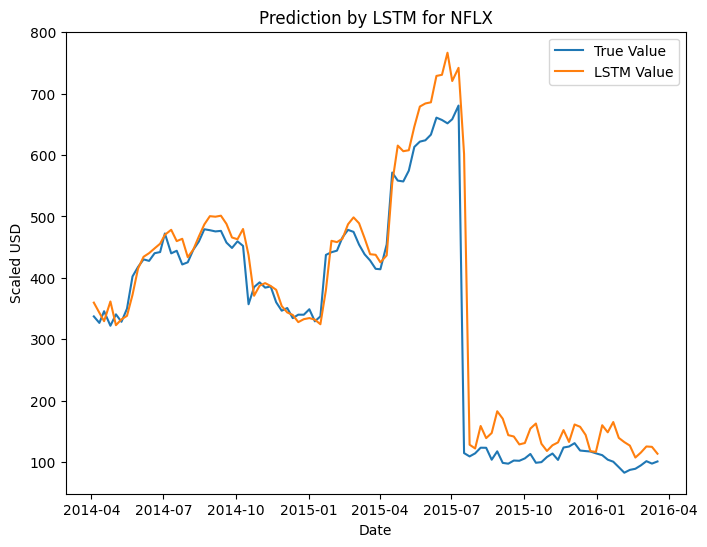

Mean Absolute Error (MAE): 31.629900693430493
Mean Squared Error (MSE): 3495.7028768805294
Root Mean Squared Error (RMSE): 59.124469358130646
R-squared (R2) Score: 0.8936977557712525
1/1 [==============================] - 0s 25ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NFLX : [[607.5914]]
Predicted Return for Next Month: [[8.100802]] %
Predicted Future Trend for NFLX : Increase
Accuracy of Trend Prediction for NFLX : 0.6237623762376238
Epoch 1/100
46/46 [==============================] - 2s 4ms/step - loss: 33111.6016
Epoch 2/100
46/46 [==============================] - 0s 4ms/step - loss: 33045.1836
Epoch 3/100
46/46 [==============================] - 0s 3ms/step - loss: 32857.4414
Epoch 4/100
46/46 [==============================] - 0s 4ms/step - loss: 32344.1445
Epoch 5/100
46/46 [==============================] - 0s 4ms/step - loss: 31066.3164
Epoch 6/100
46/46 [==============================] - 0s 4ms/step - loss: 28711.4180
Epoch 7/100
46/46 [==============================] - 0s 3ms/step - loss: 25289.2988
Epoch 8/100
46/46 [==============================] - 0s 3ms/step - loss: 21446.9062
Epoch 9/100
46/46 [==============================] - 0s 3ms/step - loss: 17250.8242
Epoch 10/100
46/46 [=====================

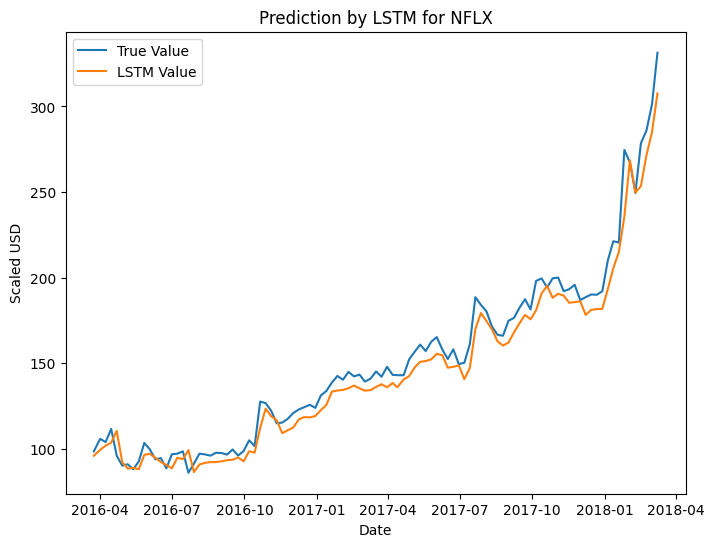

Mean Absolute Error (MAE): 7.496415586008608
Mean Squared Error (MSE): 88.45421639904568
Root Mean Squared Error (RMSE): 9.405010175382357
R-squared (R2) Score: 0.9668447968878546
1/1 [==============================] - 0s 23ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NFLX : [[584.904]]
Predicted Return for Next Month: [[4.064334]] %
Predicted Future Trend for NFLX : Increase
Accuracy of Trend Prediction for NFLX : 0.6039603960396039
Epoch 1/100
52/52 [==============================] - 2s 4ms/step - loss: 32136.3574
Epoch 2/100
52/52 [==============================] - 0s 3ms/step - loss: 32062.3008
Epoch 3/100
52/52 [==============================] - 0s 3ms/step - loss: 31838.5918
Epoch 4/100
52/52 [==============================] - 0s 4ms/step - loss: 31167.8711
Epoch 5/100
52/52 [==============================] - 0s 4ms/step - loss: 29467.5293
Epoch 6/100
52/52 [==============================] - 0s 4ms/step - loss: 26421.1191
Epoch 7/100
52/52 [==============================] - 0s 4ms/step - loss: 22689.6211
Epoch 8/100
52/52 [==============================] - 0s 3ms/step - loss: 18317.4727
Epoch 9/100
52/52 [==============================] - 0s 4ms/step - loss: 14276.9111
Epoch 10/100
52/52 [======================

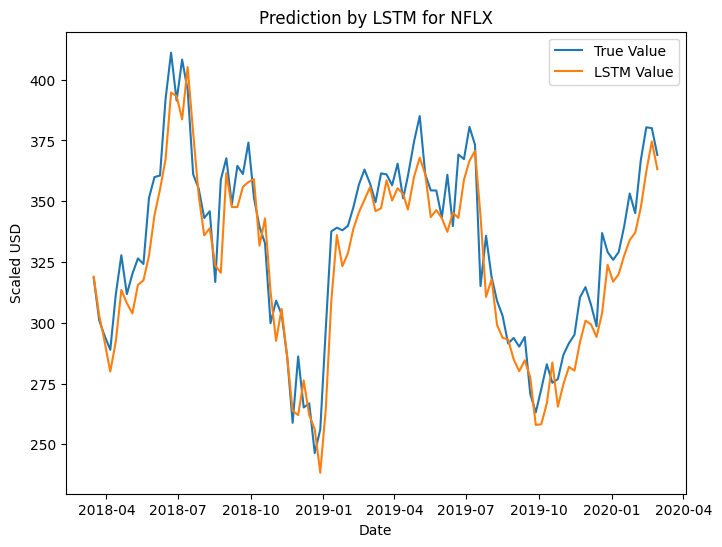

Mean Absolute Error (MAE): 11.282344206282232
Mean Squared Error (MSE): 190.97516134656277
Root Mean Squared Error (RMSE): 13.819376300924828
R-squared (R2) Score: 0.8595236014111811
1/1 [==============================] - 0s 19ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NFLX : [[571.98785]]
Predicted Return for Next Month: [[1.7663339]] %
Predicted Future Trend for NFLX : Increase
Accuracy of Trend Prediction for NFLX : 0.6831683168316832
Epoch 1/100
58/58 [==============================] - 2s 4ms/step - loss: 40938.6016
Epoch 2/100
58/58 [==============================] - 0s 3ms/step - loss: 40737.3906
Epoch 3/100
58/58 [==============================] - 0s 3ms/step - loss: 39770.1562
Epoch 4/100
58/58 [==============================] - 0s 4ms/step - loss: 36492.6836
Epoch 5/100
58/58 [==============================] - 0s 3ms/step - loss: 30237.1406
Epoch 6/100
58/58 [==============================] - 0s 3ms/step - loss: 22278.1895
Epoch 7/100
58/58 [==============================] - 0s 3ms/step - loss: 14287.7881
Epoch 8/100
58/58 [==============================] - 0s 4ms/step - loss: 8458.5430
Epoch 9/100
58/58 [==============================] - 0s 3ms/step - loss: 5257.1392
Epoch 10/100
58/58 [=====================

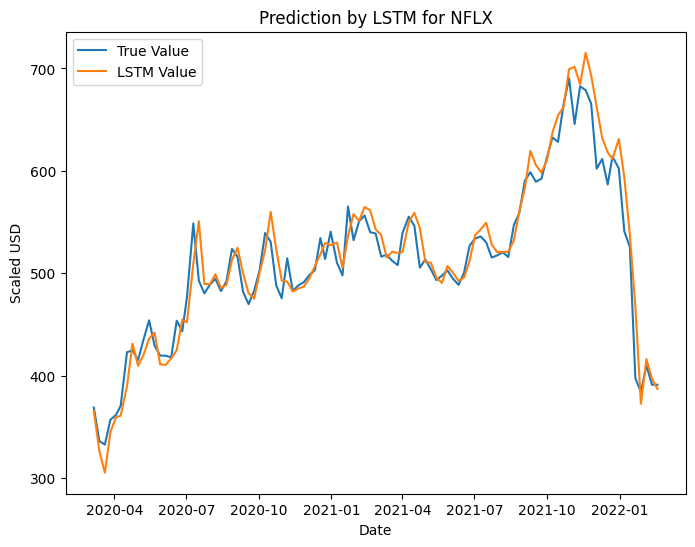

Mean Absolute Error (MAE): 14.320460608028673
Mean Squared Error (MSE): 403.5246021346349
Root Mean Squared Error (RMSE): 20.08792179730484
R-squared (R2) Score: 0.9295503149340637
1/1 [==============================] - 0s 29ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for NFLX : [[576.0577]]
Predicted Return for Next Month: [[2.4904246]] %
Predicted Future Trend for NFLX : Increase
Accuracy of Trend Prediction for NFLX : 0.693069306930693
Epoch 1/100
65/65 [==============================] - 2s 4ms/step - loss: 63357.4922
Epoch 2/100
65/65 [==============================] - 0s 3ms/step - loss: 62796.3750
Epoch 3/100
65/65 [==============================] - 0s 3ms/step - loss: 59881.1172
Epoch 4/100
65/65 [==============================] - 0s 3ms/step - loss: 51864.3438
Epoch 5/100
65/65 [==============================] - 0s 3ms/step - loss: 39498.7109
Epoch 6/100
65/65 [==============================] - 0s 3ms/step - loss: 24958.3613
Epoch 7/100
65/65 [==============================] - 0s 3ms/step - loss: 12611.9648
Epoch 8/100
65/65 [==============================] - 0s 3ms/step - loss: 6242.3149
Epoch 9/100
65/65 [==============================] - 0s 3ms/step - loss: 4244.3252
Epoch 10/100
65/65 [=======================

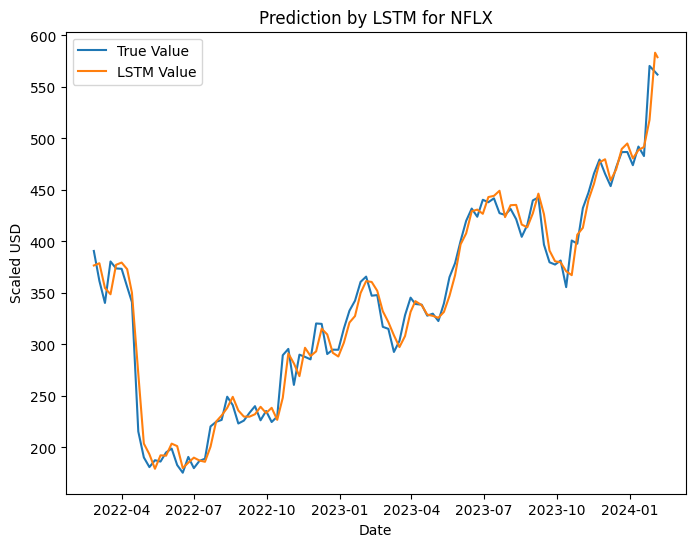

Mean Absolute Error (MAE): 10.88696776751176
Mean Squared Error (MSE): 215.2830248262792
Root Mean Squared Error (RMSE): 14.672526191023794
R-squared (R2) Score: 0.9775000187159198
1/1 [==============================] - 0s 18ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for NFLX : [[578.9147]]
Predicted Return for Next Month: [[2.9987323]] %
Predicted Future Trend for NFLX : Increase
Accuracy of Trend Prediction for NFLX : 0.6435643564356436


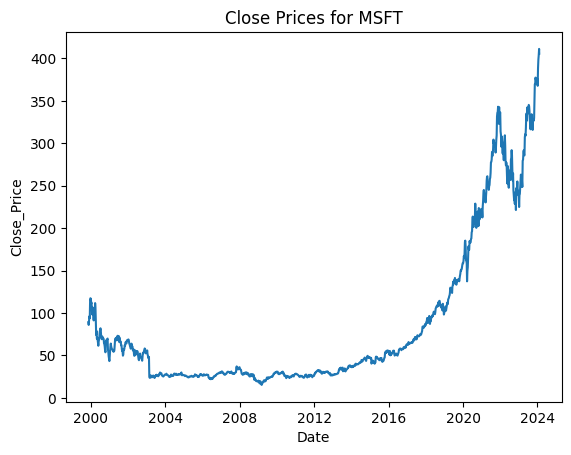

Epoch 1/100
8/8 [==============================] - 2s 4ms/step - loss: 5371.1245
Epoch 2/100
8/8 [==============================] - 0s 4ms/step - loss: 5368.8535
Epoch 3/100
8/8 [==============================] - 0s 4ms/step - loss: 5366.2769
Epoch 4/100
8/8 [==============================] - 0s 3ms/step - loss: 5363.2896
Epoch 5/100
8/8 [==============================] - 0s 3ms/step - loss: 5359.6553
Epoch 6/100
8/8 [==============================] - 0s 3ms/step - loss: 5355.2310
Epoch 7/100
8/8 [==============================] - 0s 3ms/step - loss: 5349.6299
Epoch 8/100
8/8 [==============================] - 0s 3ms/step - loss: 5342.6309
Epoch 9/100
8/8 [==============================] - 0s 4ms/step - loss: 5333.2964
Epoch 10/100
8/8 [==============================] - 0s 4ms/step - loss: 5321.2720
Epoch 11/100
8/8 [==============================] - 0s 3ms/step - loss: 5306.3804
Epoch 12/100
8/8 [==============================] - 0s 3ms/step - loss: 5285.1426
Epoch 13/100
8/8 [=======

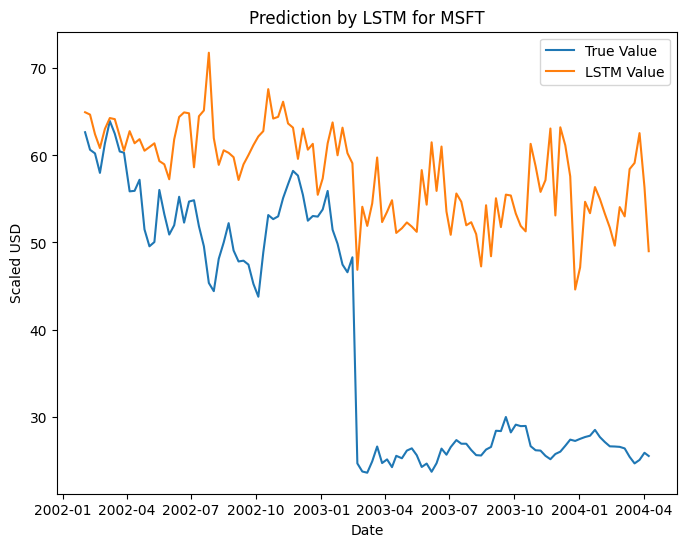

Mean Absolute Error (MAE): 18.8376051967455
Mean Squared Error (MSE): 471.9925391691329
Root Mean Squared Error (RMSE): 21.725389275433777
R-squared (R2) Score: -1.4393040455619395
1/1 [==============================] - 0s 18ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for MSFT : [[307.55862]]
Predicted Return for Next Month: [[-24.181282]] %
Predicted Future Trend for MSFT : Decrease
Accuracy of Trend Prediction for MSFT : 0.584070796460177
Epoch 1/100
15/15 [==============================] - 2s 4ms/step - loss: 3555.2305
Epoch 2/100
15/15 [==============================] - 0s 4ms/step - loss: 3551.8567
Epoch 3/100
15/15 [==============================] - 0s 4ms/step - loss: 3547.1143
Epoch 4/100
15/15 [==============================] - 0s 4ms/step - loss: 3540.0078
Epoch 5/100
15/15 [==============================] - 0s 4ms/step - loss: 3528.8745
Epoch 6/100
15/15 [==============================] - 0s 4ms/step - loss: 3510.6772
Epoch 7/100
15/15 [==============================] - 0s 4ms/step - loss: 3479.2781
Epoch 8/100
15/15 [==============================] - 0s 4ms/step - loss: 3425.8953
Epoch 9/100
15/15 [==============================] - 0s 4ms/step - loss: 3332.9851
Epoch 10/100
15/15 [============================

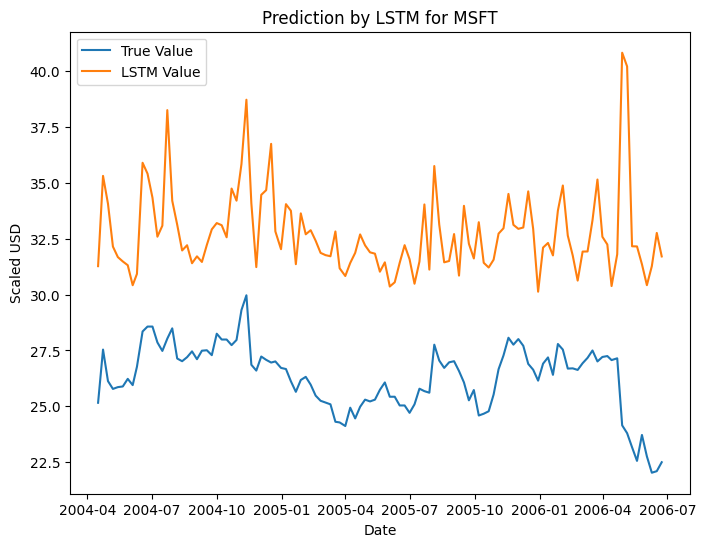

Mean Absolute Error (MAE): 6.463808031828507
Mean Squared Error (MSE): 45.67353269346111
Root Mean Squared Error (RMSE): 6.758219639332618
R-squared (R2) Score: -19.41064903209604
1/1 [==============================] - 0s 24ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for MSFT : [[497.20117]]
Predicted Return for Next Month: [[22.569008]] %
Predicted Future Trend for MSFT : Increase
Accuracy of Trend Prediction for MSFT : 0.6017699115044248
Epoch 1/100
22/22 [==============================] - 3s 4ms/step - loss: 2603.0183
Epoch 2/100
22/22 [==============================] - 0s 4ms/step - loss: 2597.4746
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 2588.3770
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 2570.8145
Epoch 5/100
22/22 [==============================] - 0s 4ms/step - loss: 2534.6250
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 2460.6917
Epoch 7/100
22/22 [==============================] - 0s 5ms/step - loss: 2305.0503
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 2028.9679
Epoch 9/100
22/22 [==============================] - 0s 4ms/step - loss: 1632.3269
Epoch 10/100
22/22 [============================

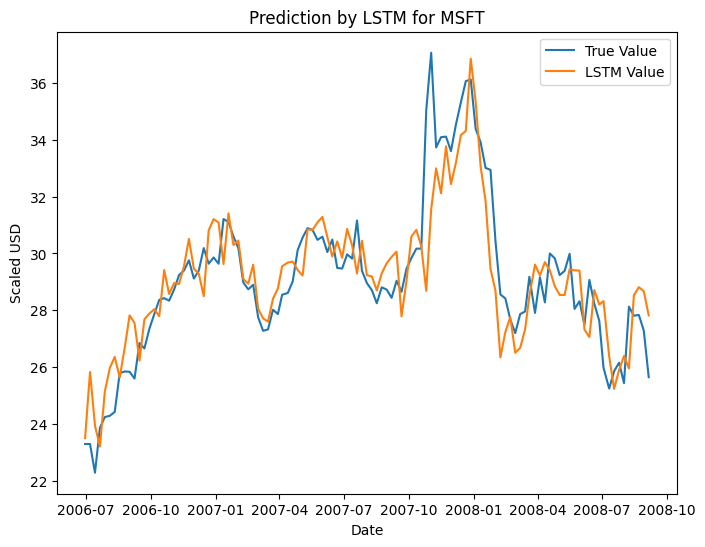

Mean Absolute Error (MAE): 0.9905606676184611
Mean Squared Error (MSE): 1.8153906671511002
Root Mean Squared Error (RMSE): 1.3473643409082416
R-squared (R2) Score: 0.7574332050335353
1/1 [==============================] - 0s 17ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for MSFT : [[523.4041]]
Predicted Return for Next Month: [[29.028502]] %
Predicted Future Trend for MSFT : Increase
Accuracy of Trend Prediction for MSFT : 0.6194690265486725
Epoch 1/100
29/29 [==============================] - 2s 4ms/step - loss: 2165.3684
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 2157.3206
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 2140.1833
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 2099.8337
Epoch 5/100
29/29 [==============================] - 0s 4ms/step - loss: 2002.4968
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 1784.5760
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 1397.2853
Epoch 8/100
29/29 [==============================] - 0s 4ms/step - loss: 954.3013
Epoch 9/100
29/29 [==============================] - 0s 4ms/step - loss: 653.0428
Epoch 10/100
29/29 [==============================]

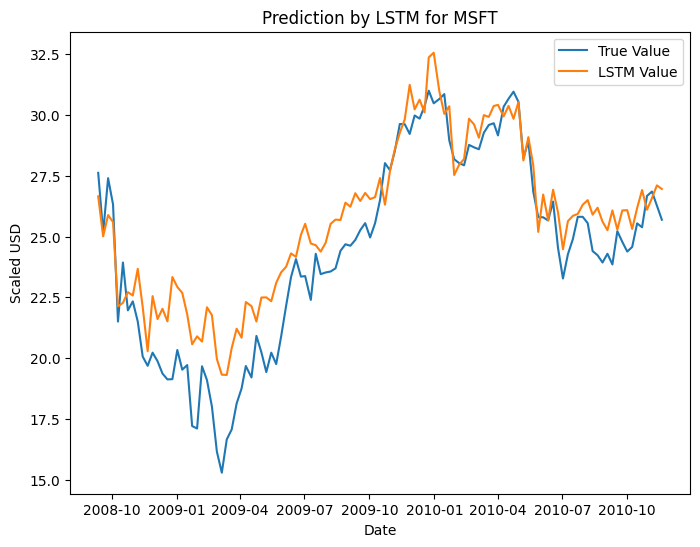

Mean Absolute Error (MAE): 1.400966665516729
Mean Squared Error (MSE): 3.01730206201354
Root Mean Squared Error (RMSE): 1.7370383018268596
R-squared (R2) Score: 0.8084083391051844
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for MSFT : [[546.79175]]
Predicted Return for Next Month: [[34.793972]] %
Predicted Future Trend for MSFT : Increase
Accuracy of Trend Prediction for MSFT : 0.5486725663716814
Epoch 1/100
36/36 [==============================] - 1s 3ms/step - loss: 1855.5410
Epoch 2/100
36/36 [==============================] - 0s 3ms/step - loss: 1846.4447
Epoch 3/100
36/36 [==============================] - 0s 3ms/step - loss: 1817.5815
Epoch 4/100
36/36 [==============================] - 0s 3ms/step - loss: 1715.0980
Epoch 5/100
36/36 [==============================] - 0s 3ms/step - loss: 1419.8319
Epoch 6/100
36/36 [==============================] - 0s 3ms/step - loss: 943.6472
Epoch 7/100
36/36 [==============================] - 0s 3ms/step - loss: 606.2549
Epoch 8/100
36/36 [==============================] - 0s 3ms/step - loss: 480.9994
Epoch 9/100
36/36 [==============================] - 0s 3ms/step - loss: 418.9482
Epoch 10/100
36/36 [==============================] 

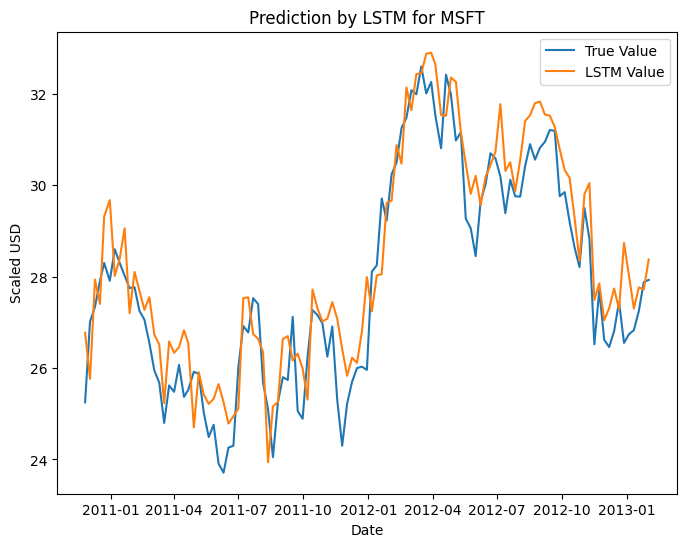

Mean Absolute Error (MAE): 0.753703491874363
Mean Squared Error (MSE): 0.8030196788155455
Root Mean Squared Error (RMSE): 0.8961136528451876
R-squared (R2) Score: 0.8503687609365415
1/1 [==============================] - 0s 22ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for MSFT : [[565.77435]]
Predicted Return for Next Month: [[39.473526]] %
Predicted Future Trend for MSFT : Increase
Accuracy of Trend Prediction for MSFT : 0.5752212389380531
Epoch 1/100
44/44 [==============================] - 2s 4ms/step - loss: 1676.2002
Epoch 2/100
44/44 [==============================] - 0s 4ms/step - loss: 1665.5334
Epoch 3/100
44/44 [==============================] - 0s 4ms/step - loss: 1630.6619
Epoch 4/100
44/44 [==============================] - 0s 4ms/step - loss: 1501.0969
Epoch 5/100
44/44 [==============================] - 0s 4ms/step - loss: 1152.7488
Epoch 6/100
44/44 [==============================] - 0s 4ms/step - loss: 704.7587
Epoch 7/100
44/44 [==============================] - 0s 4ms/step - loss: 476.6597
Epoch 8/100
44/44 [==============================] - 0s 5ms/step - loss: 409.7754
Epoch 9/100
44/44 [==============================] - 0s 4ms/step - loss: 368.4510
Epoch 10/100
44/44 [==============================] 

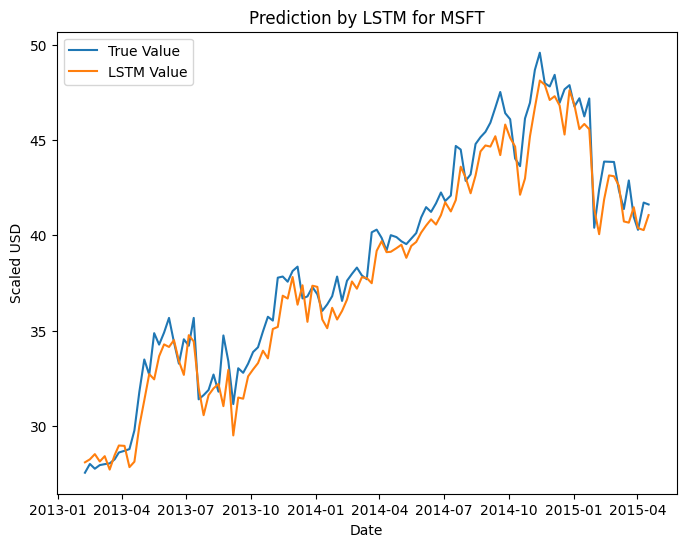

Mean Absolute Error (MAE): 0.9858593345310379
Mean Squared Error (MSE): 1.5865866289010135
Root Mean Squared Error (RMSE): 1.2595978044205276
R-squared (R2) Score: 0.9536173281880399
1/1 [==============================] - 0s 19ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for MSFT : [[543.1654]]
Predicted Return for Next Month: [[33.900017]] %
Predicted Future Trend for MSFT : Increase
Accuracy of Trend Prediction for MSFT : 0.5575221238938053
Epoch 1/100
51/51 [==============================] - 2s 4ms/step - loss: 1655.3384
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 1641.8418
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 1585.3870
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 1359.8708
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 873.7879
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 498.8372
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 388.3167
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 346.2654
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 321.7782
Epoch 10/100
51/51 [==============================] - 

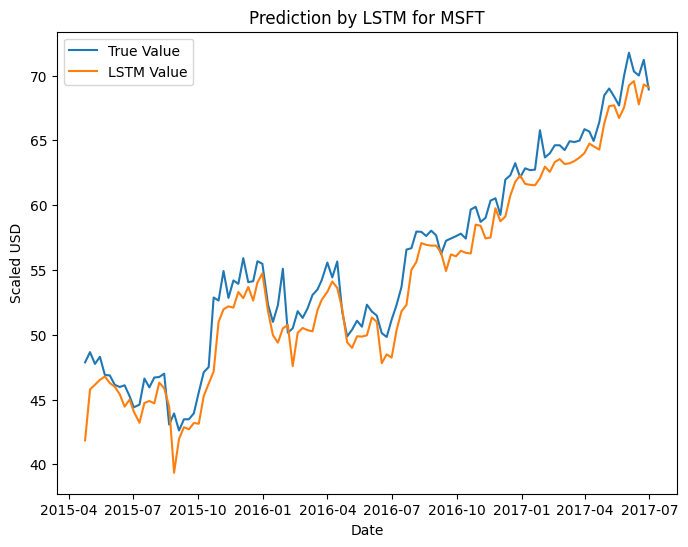

Mean Absolute Error (MAE): 1.548646622367527
Mean Squared Error (MSE): 3.6221674507143926
Root Mean Squared Error (RMSE): 1.9031992672115006
R-squared (R2) Score: 0.936946890537001
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for MSFT : [[549.7953]]
Predicted Return for Next Month: [[35.5344]] %
Predicted Future Trend for MSFT : Increase
Accuracy of Trend Prediction for MSFT : 0.5663716814159292
Epoch 1/100
58/58 [==============================] - 2s 4ms/step - loss: 1839.0060
Epoch 2/100
58/58 [==============================] - 0s 4ms/step - loss: 1812.5118
Epoch 3/100
58/58 [==============================] - 0s 4ms/step - loss: 1687.7067
Epoch 4/100
58/58 [==============================] - 0s 4ms/step - loss: 1238.8966
Epoch 5/100
58/58 [==============================] - 0s 4ms/step - loss: 648.6429
Epoch 6/100
58/58 [==============================] - 0s 4ms/step - loss: 407.3822
Epoch 7/100
58/58 [==============================] - 0s 4ms/step - loss: 345.0096
Epoch 8/100
58/58 [==============================] - 0s 4ms/step - loss: 327.5360
Epoch 9/100
58/58 [==============================] - 0s 4ms/step - loss: 315.5700
Epoch 10/100
58/58 [==============================] - 0s

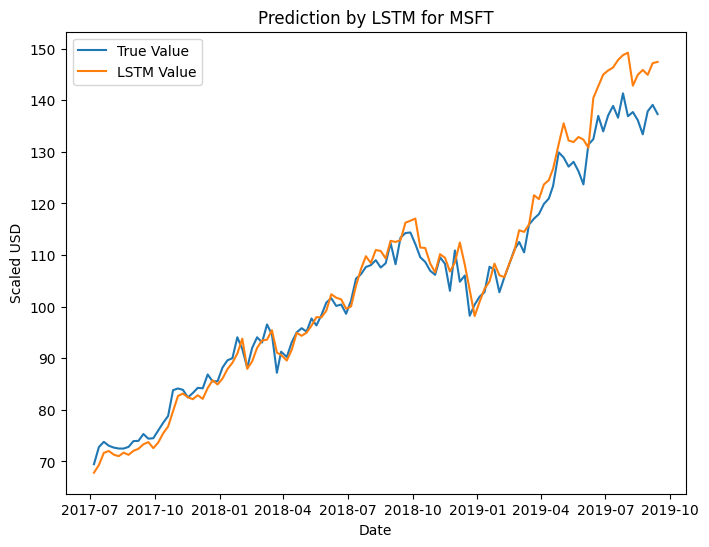

Mean Absolute Error (MAE): 2.8444451267408297
Mean Squared Error (MSE): 16.015964683194003
Root Mean Squared Error (RMSE): 4.0019950878523085
R-squared (R2) Score: 0.9568988691205506
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for MSFT : [[558.842]]
Predicted Return for Next Month: [[37.764572]] %
Predicted Future Trend for MSFT : Increase
Accuracy of Trend Prediction for MSFT : 0.6548672566371682
Epoch 1/100
65/65 [==============================] - 2s 4ms/step - loss: 2853.8787
Epoch 2/100
65/65 [==============================] - 0s 4ms/step - loss: 2773.2834
Epoch 3/100
65/65 [==============================] - 0s 4ms/step - loss: 2313.1533
Epoch 4/100
65/65 [==============================] - 0s 4ms/step - loss: 1272.6049
Epoch 5/100
65/65 [==============================] - 0s 4ms/step - loss: 768.9894
Epoch 6/100
65/65 [==============================] - 0s 4ms/step - loss: 688.9333
Epoch 7/100
65/65 [==============================] - 0s 4ms/step - loss: 601.4266
Epoch 8/100
65/65 [==============================] - 0s 4ms/step - loss: 551.9840
Epoch 9/100
65/65 [==============================] - 0s 4ms/step - loss: 498.7226
Epoch 10/100
65/65 [==============================] - 0

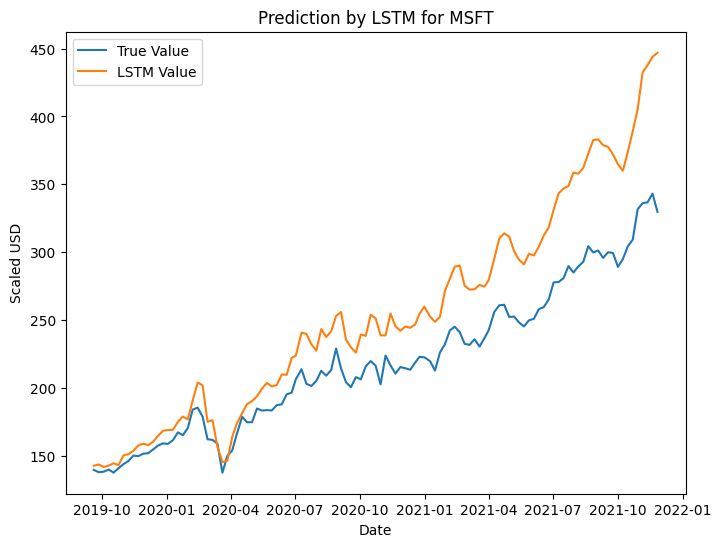

Mean Absolute Error (MAE): 34.8150159540591
Mean Squared Error (MSE): 1878.6912413300754
Root Mean Squared Error (RMSE): 43.34387201589257
R-squared (R2) Score: 0.3393986712458479
1/1 [==============================] - 0s 23ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for MSFT : [[562.3346]]
Predicted Return for Next Month: [[38.625565]] %
Predicted Future Trend for MSFT : Increase
Accuracy of Trend Prediction for MSFT : 0.7079646017699115
Epoch 1/100
72/72 [==============================] - 2s 4ms/step - loss: 7628.7905
Epoch 2/100
72/72 [==============================] - 0s 4ms/step - loss: 7518.0723
Epoch 3/100
72/72 [==============================] - 0s 4ms/step - loss: 7042.8062
Epoch 4/100
72/72 [==============================] - 0s 4ms/step - loss: 5840.9321
Epoch 5/100
72/72 [==============================] - 0s 4ms/step - loss: 4338.4912
Epoch 6/100
72/72 [==============================] - 0s 4ms/step - loss: 3234.8159
Epoch 7/100
72/72 [==============================] - 0s 4ms/step - loss: 2575.3550
Epoch 8/100
72/72 [==============================] - 0s 4ms/step - loss: 2179.3203
Epoch 9/100
72/72 [==============================] - 0s 4ms/step - loss: 1960.4978
Epoch 10/100
72/72 [=============================

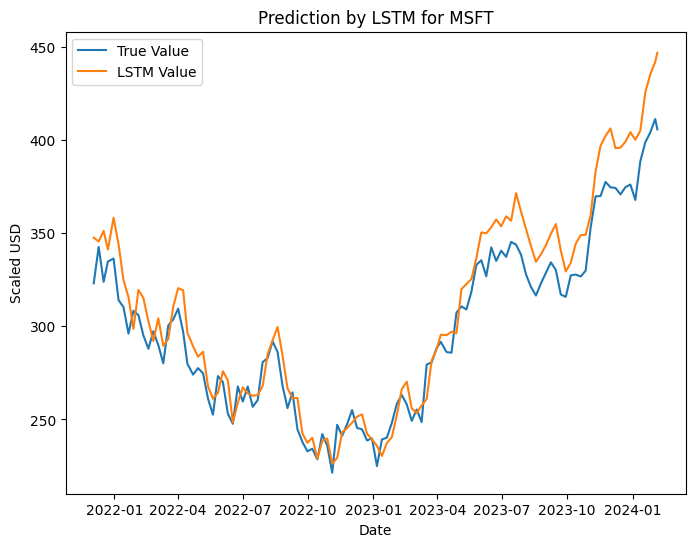

Mean Absolute Error (MAE): 13.056681974991506
Mean Squared Error (MSE): 249.4803900382252
Root Mean Squared Error (RMSE): 15.794948244240157
R-squared (R2) Score: 0.8830946254366813
1/1 [==============================] - 0s 22ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for MSFT : [[446.7538]]
Predicted Return for Next Month: [[10.132829]] %
Predicted Future Trend for MSFT : Increase
Accuracy of Trend Prediction for MSFT : 0.6814159292035398


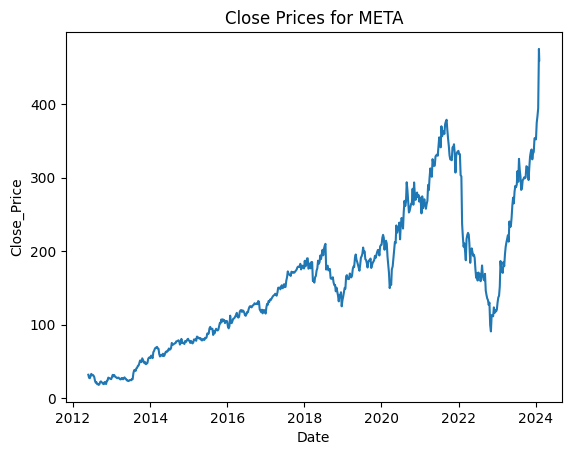

Epoch 1/100
4/4 [==============================] - 2s 4ms/step - loss: 678.5660
Epoch 2/100
4/4 [==============================] - 0s 4ms/step - loss: 678.1185
Epoch 3/100
4/4 [==============================] - 0s 4ms/step - loss: 677.6832
Epoch 4/100
4/4 [==============================] - 0s 4ms/step - loss: 677.2585
Epoch 5/100
4/4 [==============================] - 0s 4ms/step - loss: 676.8073
Epoch 6/100
4/4 [==============================] - 0s 4ms/step - loss: 676.3128
Epoch 7/100
4/4 [==============================] - 0s 4ms/step - loss: 675.7761
Epoch 8/100
4/4 [==============================] - 0s 4ms/step - loss: 675.2168
Epoch 9/100
4/4 [==============================] - 0s 4ms/step - loss: 674.5730
Epoch 10/100
4/4 [==============================] - 0s 4ms/step - loss: 673.8918
Epoch 11/100
4/4 [==============================] - 0s 4ms/step - loss: 673.1436
Epoch 12/100
4/4 [==============================] - 0s 4ms/step - loss: 672.2545
Epoch 13/100
4/4 [===================

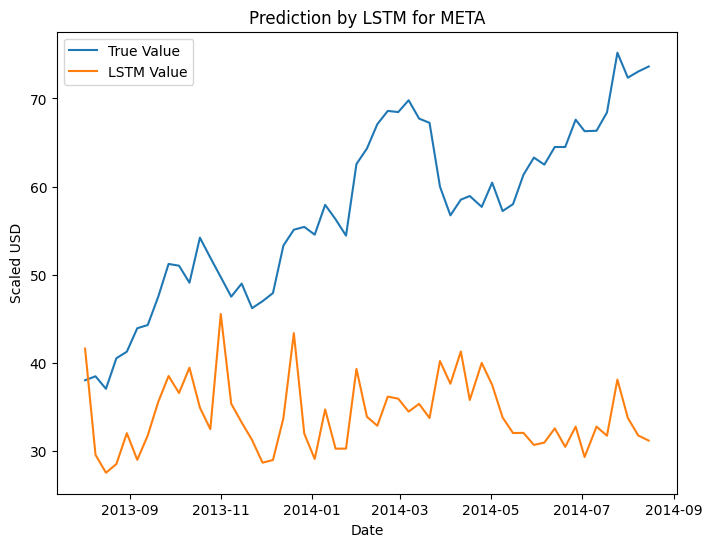

Mean Absolute Error (MAE): 23.26437210637873
Mean Squared Error (MSE): 641.5964304924969
Root Mean Squared Error (RMSE): 25.329753857716362
R-squared (R2) Score: -5.63287749753088
1/1 [==============================] - 0s 18ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for META : [[138.1646]]
Predicted Return for Next Month: [[-69.92565]] %
Predicted Future Trend for META : Decrease
Accuracy of Trend Prediction for META : 0.5660377358490566
Epoch 1/100
8/8 [==============================] - 2s 4ms/step - loss: 1942.0328
Epoch 2/100
8/8 [==============================] - 0s 4ms/step - loss: 1940.2943
Epoch 3/100
8/8 [==============================] - 0s 4ms/step - loss: 1938.3452
Epoch 4/100
8/8 [==============================] - 0s 4ms/step - loss: 1935.8922
Epoch 5/100
8/8 [==============================] - 0s 4ms/step - loss: 1933.0211
Epoch 6/100
8/8 [==============================] - 0s 4ms/step - loss: 1929.4165
Epoch 7/100
8/8 [==============================] - 0s 4ms/step - loss: 1924.8781
Epoch 8/100
8/8 [==============================] - 0s 4ms/step - loss: 1919.1606
Epoch 9/100
8/8 [==============================] - 0s 4ms/step - loss: 1911.6650
Epoch 10/100
8/8 [==============================] - 0s 4ms/step - l

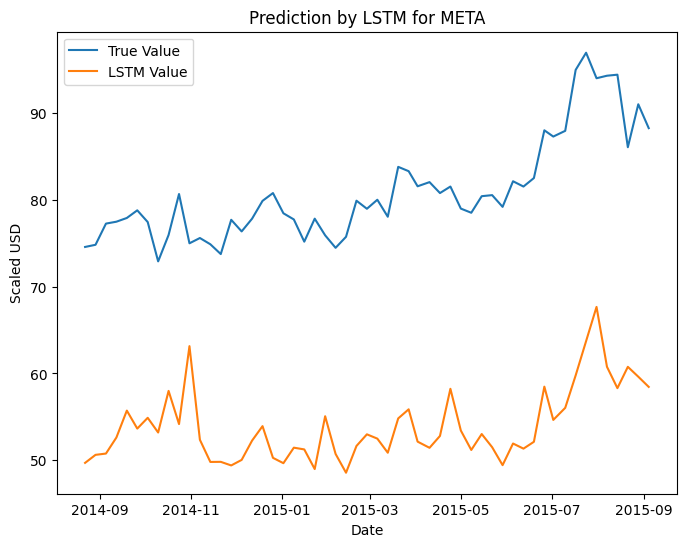

Mean Absolute Error (MAE): 27.03037172907049
Mean Squared Error (MSE): 747.9010390066228
Root Mean Squared Error (RMSE): 27.347779416373513
R-squared (R2) Score: -20.431371724797845
1/1 [==============================] - 0s 33ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for META : [[291.32544]]
Predicted Return for Next Month: [[-36.58705]] %
Predicted Future Trend for META : Decrease
Accuracy of Trend Prediction for META : 0.5471698113207547
Epoch 1/100
11/11 [==============================] - 2s 4ms/step - loss: 3426.5996
Epoch 2/100
11/11 [==============================] - 0s 4ms/step - loss: 3424.1687
Epoch 3/100
11/11 [==============================] - 0s 4ms/step - loss: 3421.2888
Epoch 4/100
11/11 [==============================] - 0s 3ms/step - loss: 3417.6069
Epoch 5/100
11/11 [==============================] - 0s 4ms/step - loss: 3412.5820
Epoch 6/100
11/11 [==============================] - 0s 4ms/step - loss: 3405.8223
Epoch 7/100
11/11 [==============================] - 0s 4ms/step - loss: 3396.0508
Epoch 8/100
11/11 [==============================] - 0s 4ms/step - loss: 3382.1333
Epoch 9/100
11/11 [==============================] - 0s 4ms/step - loss: 3361.7021
Epoch 10/100
11/11 [============================

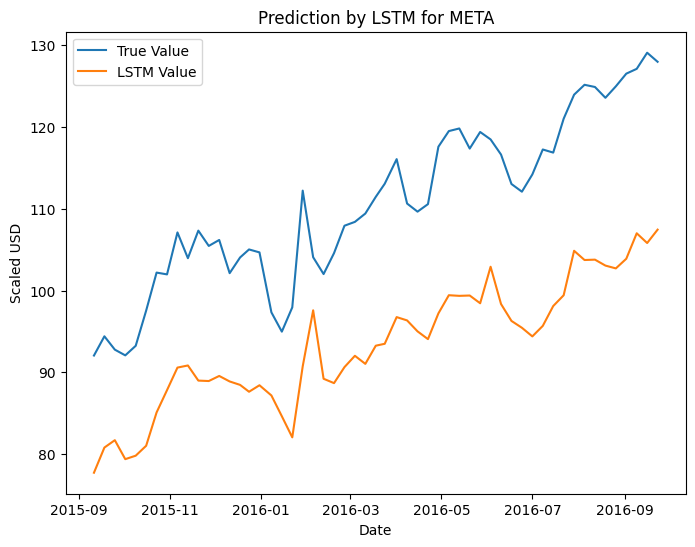

Mean Absolute Error (MAE): 17.15818869850853
Mean Squared Error (MSE): 306.70788698346354
Root Mean Squared Error (RMSE): 17.513077598853478
R-squared (R2) Score: -1.9349322036049745
1/1 [==============================] - 0s 29ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for META : [[449.22906]]
Predicted Return for Next Month: [[-2.21609]] %
Predicted Future Trend for META : Decrease
Accuracy of Trend Prediction for META : 0.5660377358490566
Epoch 1/100
15/15 [==============================] - 2s 4ms/step - loss: 5579.2344
Epoch 2/100
15/15 [==============================] - 0s 3ms/step - loss: 5573.4912
Epoch 3/100
15/15 [==============================] - 0s 4ms/step - loss: 5565.2676
Epoch 4/100
15/15 [==============================] - 0s 4ms/step - loss: 5552.7104
Epoch 5/100
15/15 [==============================] - 0s 3ms/step - loss: 5532.7646
Epoch 6/100
15/15 [==============================] - 0s 4ms/step - loss: 5499.7749
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 5443.9165
Epoch 8/100
15/15 [==============================] - 0s 4ms/step - loss: 5348.5312
Epoch 9/100
15/15 [==============================] - 0s 4ms/step - loss: 5194.1035
Epoch 10/100
15/15 [=============================

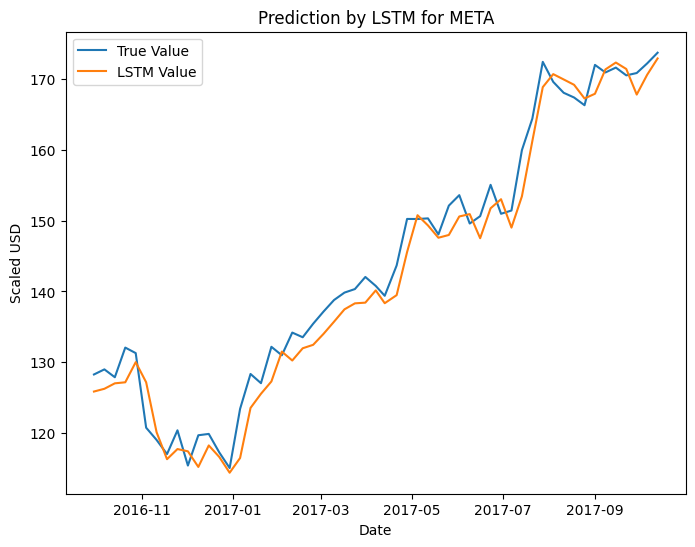

Mean Absolute Error (MAE): 2.4798589255593044
Mean Squared Error (MSE): 8.913115156596218
Root Mean Squared Error (RMSE): 2.985484074081826
R-squared (R2) Score: 0.97344105549961
1/1 [==============================] - 0s 28ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for META : [[558.60004]]
Predicted Return for Next Month: [[21.590742]] %
Predicted Future Trend for META : Increase
Accuracy of Trend Prediction for META : 0.6792452830188679
Epoch 1/100
18/18 [==============================] - 2s 4ms/step - loss: 8591.9062
Epoch 2/100
18/18 [==============================] - 0s 4ms/step - loss: 8584.8672
Epoch 3/100
18/18 [==============================] - 0s 4ms/step - loss: 8575.0830
Epoch 4/100
18/18 [==============================] - 0s 4ms/step - loss: 8559.4629
Epoch 5/100
18/18 [==============================] - 0s 4ms/step - loss: 8531.7715
Epoch 6/100
18/18 [==============================] - 0s 4ms/step - loss: 8482.2109
Epoch 7/100
18/18 [==============================] - 0s 4ms/step - loss: 8391.4893
Epoch 8/100
18/18 [==============================] - 0s 4ms/step - loss: 8224.2295
Epoch 9/100
18/18 [==============================] - 0s 4ms/step - loss: 7945.3228
Epoch 10/100
18/18 [============================

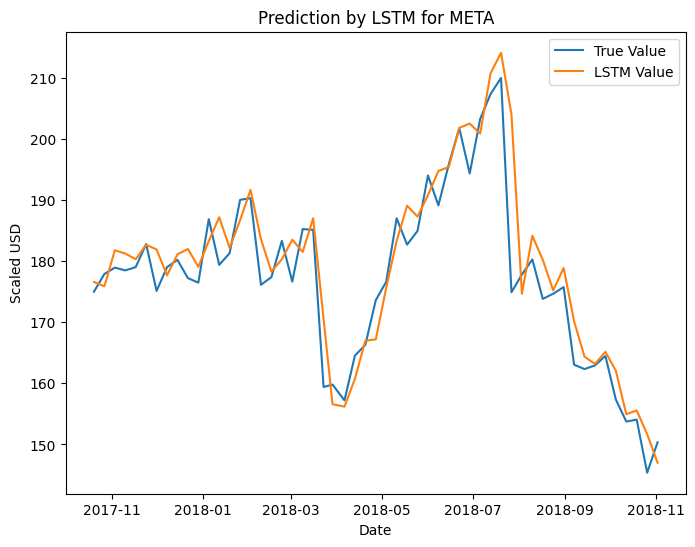

Mean Absolute Error (MAE): 3.78421963778409
Mean Squared Error (MSE): 32.125363519751424
Root Mean Squared Error (RMSE): 5.667924092624338
R-squared (R2) Score: 0.8323123963396624
1/1 [==============================] - 0s 23ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for META : [[547.4896]]
Predicted Return for Next Month: [[19.172335]] %
Predicted Future Trend for META : Increase
Accuracy of Trend Prediction for META : 0.6415094339622641
Epoch 1/100
22/22 [==============================] - 3s 4ms/step - loss: 12345.1953
Epoch 2/100
22/22 [==============================] - 0s 4ms/step - loss: 12330.4648
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 12304.2451
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 12251.3994
Epoch 5/100
22/22 [==============================] - 0s 4ms/step - loss: 12143.0566
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 11904.4736
Epoch 7/100
22/22 [==============================] - 0s 4ms/step - loss: 11408.7207
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 10499.8760
Epoch 9/100
22/22 [==============================] - 0s 4ms/step - loss: 9173.7070
Epoch 10/100
22/22 [=====================

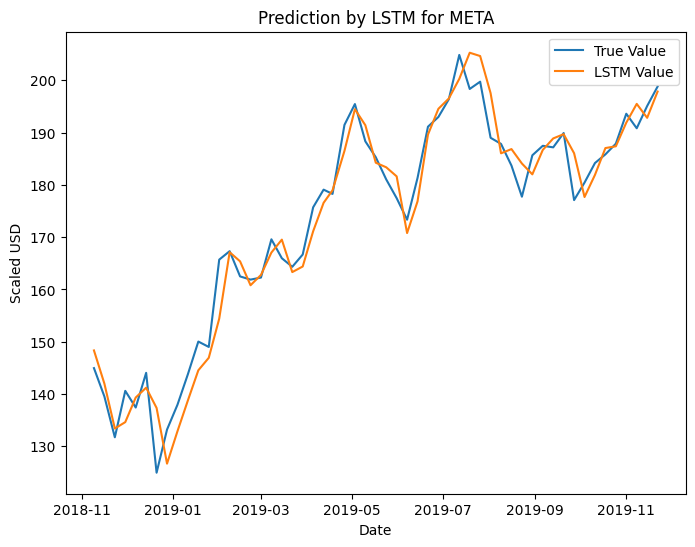

Mean Absolute Error (MAE): 3.3218205677379258
Mean Squared Error (MSE): 18.036936744445743
Root Mean Squared Error (RMSE): 4.246991493333339
R-squared (R2) Score: 0.9577984949800082
1/1 [==============================] - 0s 28ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for META : [[549.10834]]
Predicted Return for Next Month: [[19.52468]] %
Predicted Future Trend for META : Increase
Accuracy of Trend Prediction for META : 0.7547169811320755
Epoch 1/100
25/25 [==============================] - 2s 4ms/step - loss: 14888.0986
Epoch 2/100
25/25 [==============================] - 0s 4ms/step - loss: 14866.3076
Epoch 3/100
25/25 [==============================] - 0s 4ms/step - loss: 14822.1621
Epoch 4/100
25/25 [==============================] - 0s 4ms/step - loss: 14717.5127
Epoch 5/100
25/25 [==============================] - 0s 4ms/step - loss: 14449.3818
Epoch 6/100
25/25 [==============================] - 0s 4ms/step - loss: 13788.8447
Epoch 7/100
25/25 [==============================] - 0s 4ms/step - loss: 12491.4658
Epoch 8/100
25/25 [==============================] - 0s 4ms/step - loss: 10524.9922
Epoch 9/100
25/25 [==============================] - 0s 4ms/step - loss: 8202.6777
Epoch 10/100
25/25 [=====================

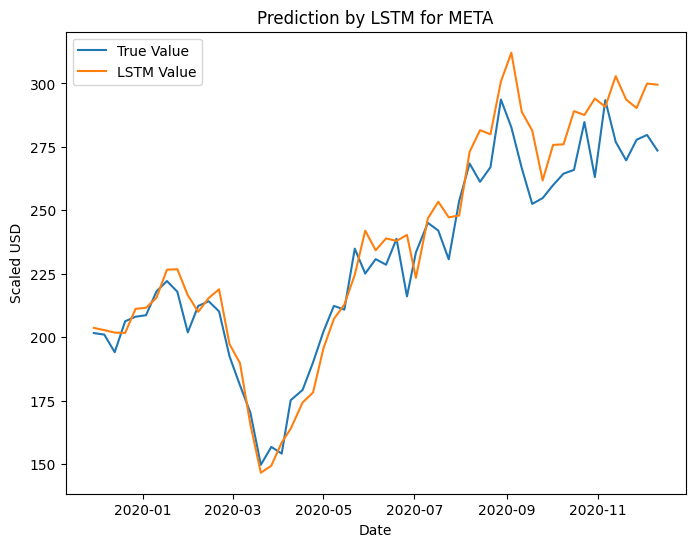

Mean Absolute Error (MAE): 10.532328912908381
Mean Squared Error (MSE): 181.57528575875708
Root Mean Squared Error (RMSE): 13.474987412192899
R-squared (R2) Score: 0.8692223740032563
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for META : [[562.52716]]
Predicted Return for Next Month: [[22.445562]] %
Predicted Future Trend for META : Increase
Accuracy of Trend Prediction for META : 0.5849056603773585
Epoch 1/100
28/28 [==============================] - 2s 4ms/step - loss: 19707.1895
Epoch 2/100
28/28 [==============================] - 0s 4ms/step - loss: 19674.4766
Epoch 3/100
28/28 [==============================] - 0s 4ms/step - loss: 19599.1992
Epoch 4/100
28/28 [==============================] - 0s 4ms/step - loss: 19391.3906
Epoch 5/100
28/28 [==============================] - 0s 4ms/step - loss: 18839.3340
Epoch 6/100
28/28 [==============================] - 0s 4ms/step - loss: 17573.8594
Epoch 7/100
28/28 [==============================] - 0s 4ms/step - loss: 15290.4619
Epoch 8/100
28/28 [==============================] - 0s 4ms/step - loss: 12342.0361
Epoch 9/100
28/28 [==============================] - 0s 4ms/step - loss: 8996.8721
Epoch 10/100
28/28 [====================

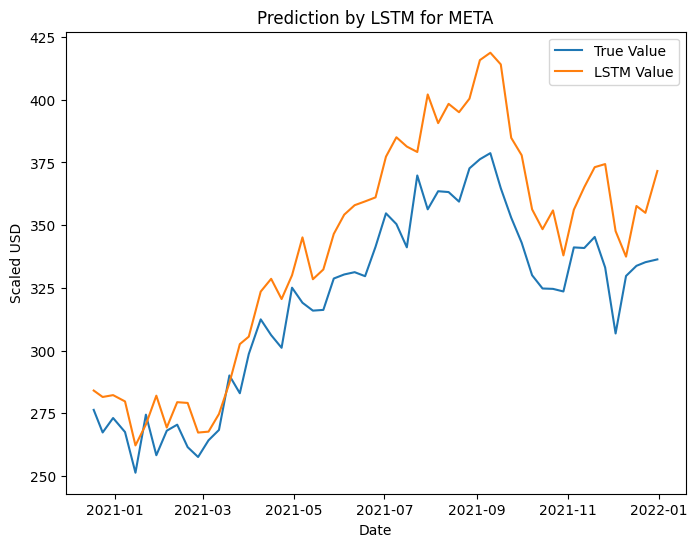

Mean Absolute Error (MAE): 21.69918392666904
Mean Squared Error (MSE): 620.4238881959717
Root Mean Squared Error (RMSE): 24.90830962140891
R-squared (R2) Score: 0.5130403105748162
1/1 [==============================] - 0s 21ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for META : [[541.2515]]
Predicted Return for Next Month: [[17.814484]] %
Predicted Future Trend for META : Increase
Accuracy of Trend Prediction for META : 0.6981132075471698
Epoch 1/100
32/32 [==============================] - 2s 5ms/step - loss: 28825.6641
Epoch 2/100
32/32 [==============================] - 0s 4ms/step - loss: 28785.7598
Epoch 3/100
32/32 [==============================] - 0s 4ms/step - loss: 28688.9219
Epoch 4/100
32/32 [==============================] - 0s 4ms/step - loss: 28414.6523
Epoch 5/100
32/32 [==============================] - 0s 4ms/step - loss: 27602.9688
Epoch 6/100
32/32 [==============================] - 0s 4ms/step - loss: 25732.9473
Epoch 7/100
32/32 [==============================] - 0s 4ms/step - loss: 22565.0781
Epoch 8/100
32/32 [==============================] - 0s 4ms/step - loss: 18315.9277
Epoch 9/100
32/32 [==============================] - 0s 4ms/step - loss: 13616.9795
Epoch 10/100
32/32 [====================

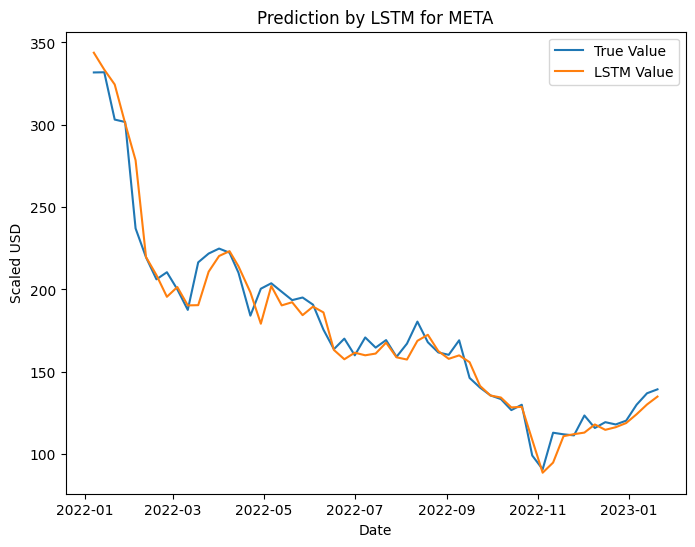

Mean Absolute Error (MAE): 6.6687013383345155
Mean Squared Error (MSE): 104.22648370285067
Root Mean Squared Error (RMSE): 10.209137265354535
R-squared (R2) Score: 0.9640307488511658
1/1 [==============================] - 0s 29ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for META : [[508.0671]]
Predicted Return for Next Month: [[10.591216]] %
Predicted Future Trend for META : Increase
Accuracy of Trend Prediction for META : 0.660377358490566
Epoch 1/100
35/35 [==============================] - 2s 4ms/step - loss: 29313.7383
Epoch 2/100
35/35 [==============================] - 0s 4ms/step - loss: 29256.2598
Epoch 3/100
35/35 [==============================] - 0s 4ms/step - loss: 29088.2559
Epoch 4/100
35/35 [==============================] - 0s 4ms/step - loss: 28536.0078
Epoch 5/100
35/35 [==============================] - 0s 4ms/step - loss: 26971.2383
Epoch 6/100
35/35 [==============================] - 0s 4ms/step - loss: 23652.0781
Epoch 7/100
35/35 [==============================] - 0s 4ms/step - loss: 18802.4590
Epoch 8/100
35/35 [==============================] - 0s 4ms/step - loss: 13622.1611
Epoch 9/100
35/35 [==============================] - 0s 4ms/step - loss: 8688.8271
Epoch 10/100
35/35 [======================

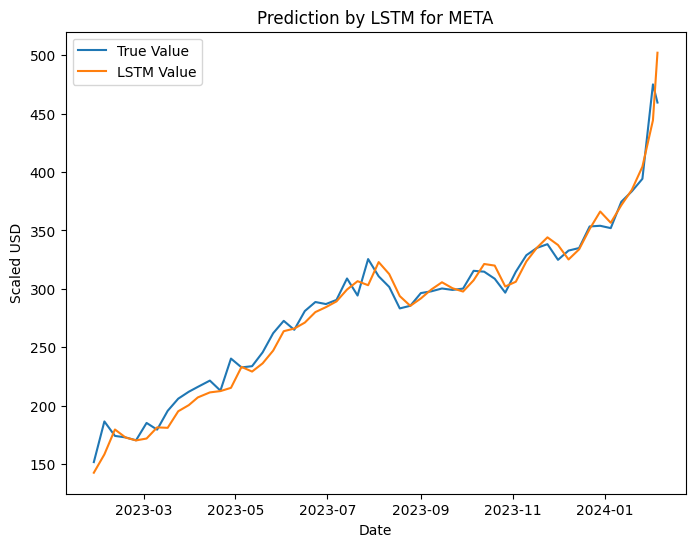

Mean Absolute Error (MAE): 8.618366144353695
Mean Squared Error (MSE): 141.93303517043515
Root Mean Squared Error (RMSE): 11.913565174641684
R-squared (R2) Score: 0.9701302156499221
1/1 [==============================] - 0s 27ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for META : [[502.05203]]
Predicted Return for Next Month: [[9.281911]] %
Predicted Future Trend for META : Increase
Accuracy of Trend Prediction for META : 0.6981132075471698


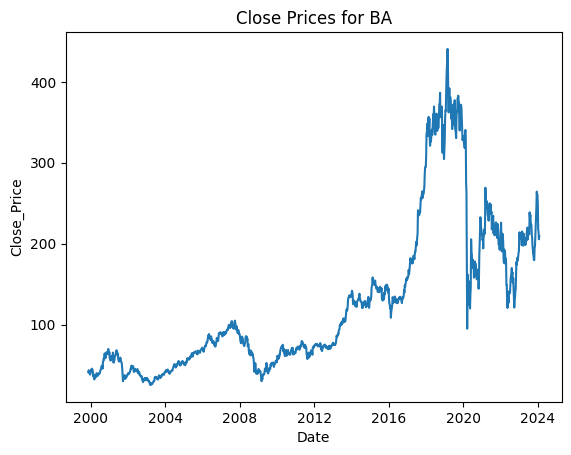

Epoch 1/100
8/8 [==============================] - 2s 4ms/step - loss: 2550.2332
Epoch 2/100
8/8 [==============================] - 0s 4ms/step - loss: 2548.3472
Epoch 3/100
8/8 [==============================] - 0s 4ms/step - loss: 2546.2371
Epoch 4/100
8/8 [==============================] - 0s 4ms/step - loss: 2543.7998
Epoch 5/100
8/8 [==============================] - 0s 4ms/step - loss: 2540.8865
Epoch 6/100
8/8 [==============================] - 0s 4ms/step - loss: 2537.3411
Epoch 7/100
8/8 [==============================] - 0s 4ms/step - loss: 2533.0046
Epoch 8/100
8/8 [==============================] - 0s 4ms/step - loss: 2527.3662
Epoch 9/100
8/8 [==============================] - 0s 4ms/step - loss: 2520.5723
Epoch 10/100
8/8 [==============================] - 0s 4ms/step - loss: 2512.0024
Epoch 11/100
8/8 [==============================] - 0s 4ms/step - loss: 2501.1675
Epoch 12/100
8/8 [==============================] - 0s 4ms/step - loss: 2487.5737
Epoch 13/100
8/8 [=======

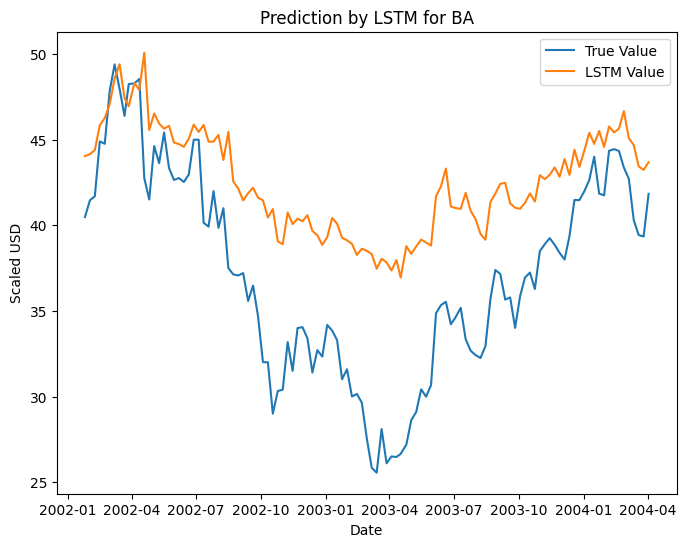

Mean Absolute Error (MAE): 5.426415240743886
Mean Squared Error (MSE): 39.320352353735316
Root Mean Squared Error (RMSE): 6.270594258420434
R-squared (R2) Score: -0.10193288769098774
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[156.6807]]
Predicted Return for Next Month: [[-25.169218]] %
Predicted Future Trend for BA : Decrease
Accuracy of Trend Prediction for BA : 0.584070796460177
Epoch 1/100
15/15 [==============================] - 2s 4ms/step - loss: 1982.1476
Epoch 2/100
15/15 [==============================] - 0s 5ms/step - loss: 1979.4971
Epoch 3/100
15/15 [==============================] - 0s 4ms/step - loss: 1976.0961
Epoch 4/100
15/15 [==============================] - 0s 4ms/step - loss: 1971.3990
Epoch 5/100
15/15 [==============================] - 0s 4ms/step - loss: 1964.6157
Epoch 6/100
15/15 [==============================] - 0s 4ms/step - loss: 1954.1627
Epoch 7/100
15/15 [==============================] - 0s 4ms/step - loss: 1937.8833
Epoch 8/100
15/15 [==============================] - 0s 4ms/step - loss: 1912.9480
Epoch 9/100
15/15 [==============================] - 0s 4ms/step - loss: 1875.2423
Epoch 10/100
15/15 [==============================] - 0

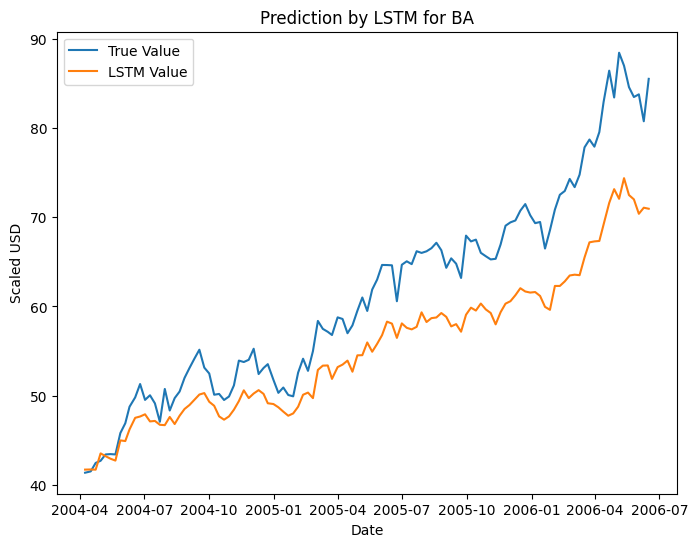

Mean Absolute Error (MAE): 5.93626226143215
Mean Squared Error (MSE): 48.82742514209542
Root Mean Squared Error (RMSE): 6.987662351752224
R-squared (R2) Score: 0.6376104942816668
1/1 [==============================] - 0s 26ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[184.19008]]
Predicted Return for Next Month: [[-12.030723]] %
Predicted Future Trend for BA : Decrease
Accuracy of Trend Prediction for BA : 0.5309734513274337
Epoch 1/100
22/22 [==============================] - 2s 4ms/step - loss: 2616.6777
Epoch 2/100
22/22 [==============================] - 0s 4ms/step - loss: 2610.5786
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 2600.9600
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 2583.9011
Epoch 5/100
22/22 [==============================] - 0s 4ms/step - loss: 2552.9934
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 2492.6794
Epoch 7/100
22/22 [==============================] - 0s 4ms/step - loss: 2381.2795
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 2184.4729
Epoch 9/100
22/22 [==============================] - 0s 4ms/step - loss: 1879.5061
Epoch 10/100
22/22 [==============================] -

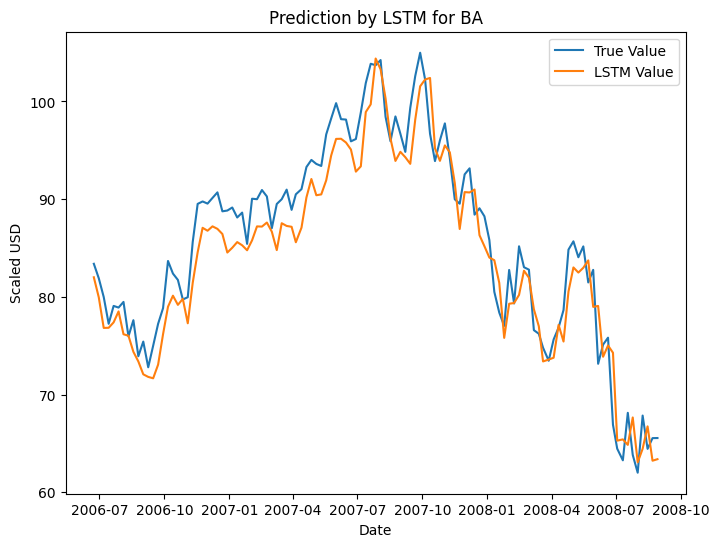

Mean Absolute Error (MAE): 2.579034445057745
Mean Squared Error (MSE): 8.916545101803385
Root Mean Squared Error (RMSE): 2.9860584558583887
R-squared (R2) Score: 0.9154762631069686
1/1 [==============================] - 0s 29ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[228.63463]]
Predicted Return for Next Month: [[9.196018]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.5929203539823009
Epoch 1/100
29/29 [==============================] - 2s 4ms/step - loss: 3819.5056
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 3806.6331
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 3779.2227
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 3711.9514
Epoch 5/100
29/29 [==============================] - 0s 4ms/step - loss: 3545.5886
Epoch 6/100
29/29 [==============================] - 0s 3ms/step - loss: 3163.0615
Epoch 7/100
29/29 [==============================] - 0s 3ms/step - loss: 2507.8445
Epoch 8/100
29/29 [==============================] - 0s 3ms/step - loss: 1663.9255
Epoch 9/100
29/29 [==============================] - 0s 3ms/step - loss: 902.2094
Epoch 10/100
29/29 [==============================] - 0s

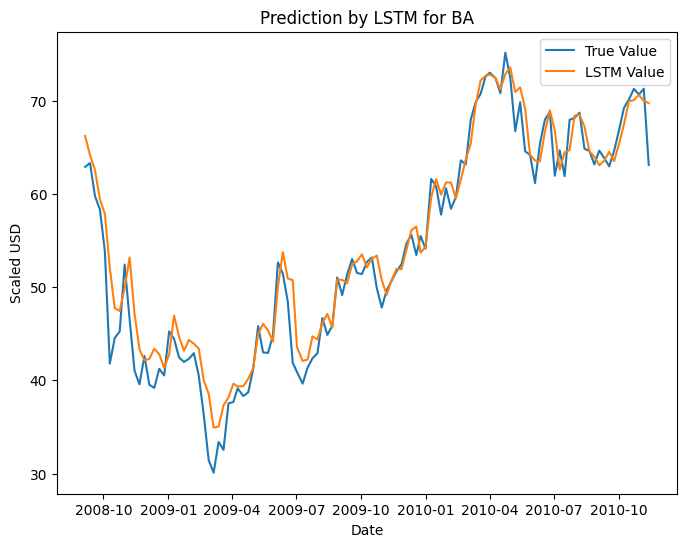

Mean Absolute Error (MAE): 1.9595157643193781
Mean Squared Error (MSE): 7.1890265398733355
Root Mean Squared Error (RMSE): 2.6812360097300902
R-squared (R2) Score: 0.9476392306525494
1/1 [==============================] - 0s 24ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[232.14183]]
Predicted Return for Next Month: [[10.871059]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.6371681415929203
Epoch 1/100
36/36 [==============================] - 2s 4ms/step - loss: 3663.0386
Epoch 2/100
36/36 [==============================] - 0s 4ms/step - loss: 3649.7773
Epoch 3/100
36/36 [==============================] - 0s 4ms/step - loss: 3617.2395
Epoch 4/100
36/36 [==============================] - 0s 4ms/step - loss: 3524.1328
Epoch 5/100
36/36 [==============================] - 0s 4ms/step - loss: 3261.4475
Epoch 6/100
36/36 [==============================] - 0s 4ms/step - loss: 2673.2219
Epoch 7/100
36/36 [==============================] - 0s 3ms/step - loss: 1771.6730
Epoch 8/100
36/36 [==============================] - 0s 4ms/step - loss: 894.5955
Epoch 9/100
36/36 [==============================] - 0s 4ms/step - loss: 373.0132
Epoch 10/100
36/36 [==============================] - 0s

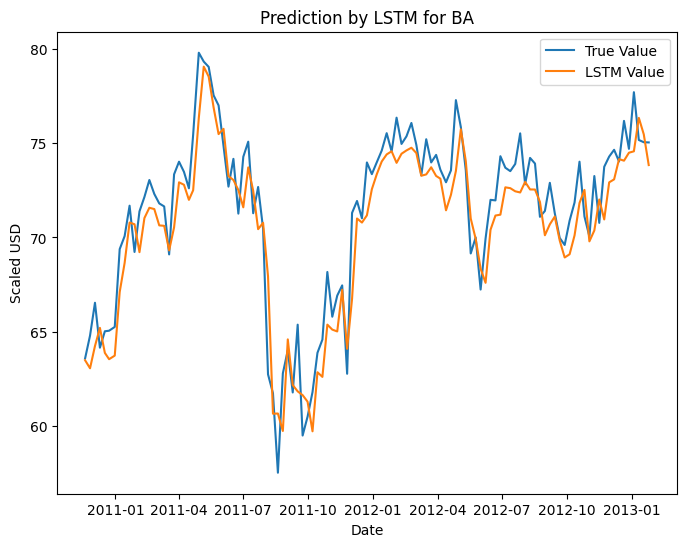

Mean Absolute Error (MAE): 1.3967881376846976
Mean Squared Error (MSE): 2.9807313726261144
Root Mean Squared Error (RMSE): 1.7264794735606082
R-squared (R2) Score: 0.8556691124650986
1/1 [==============================] - 0s 25ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[241.99823]]
Predicted Return for Next Month: [[15.578482]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.6371681415929203
Epoch 1/100
44/44 [==============================] - 2s 4ms/step - loss: 3903.3562
Epoch 2/100
44/44 [==============================] - 0s 4ms/step - loss: 3889.0522
Epoch 3/100
44/44 [==============================] - 0s 4ms/step - loss: 3848.8562
Epoch 4/100
44/44 [==============================] - 0s 4ms/step - loss: 3715.4648
Epoch 5/100
44/44 [==============================] - 0s 3ms/step - loss: 3322.1638
Epoch 6/100
44/44 [==============================] - 0s 3ms/step - loss: 2563.0803
Epoch 7/100
44/44 [==============================] - 0s 3ms/step - loss: 1583.8137
Epoch 8/100
44/44 [==============================] - 0s 3ms/step - loss: 739.1669
Epoch 9/100
44/44 [==============================] - 0s 4ms/step - loss: 304.8843
Epoch 10/100
44/44 [==============================] - 0s

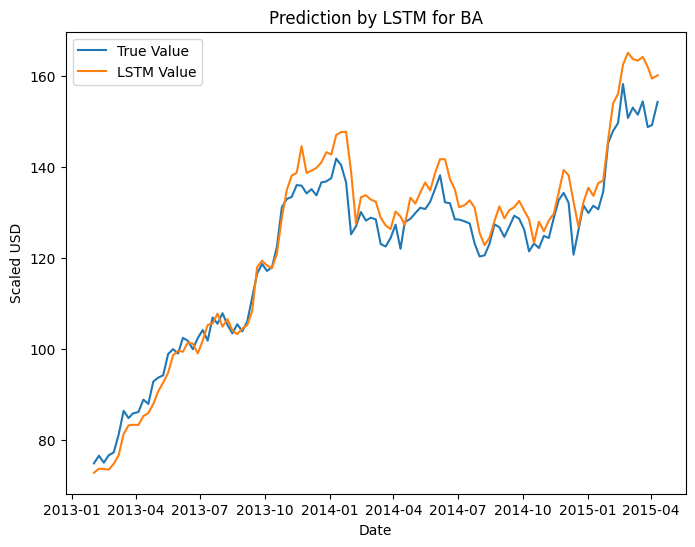

Mean Absolute Error (MAE): 4.0345642355214
Mean Squared Error (MSE): 25.597392756264146
Root Mean Squared Error (RMSE): 5.059386598814538
R-squared (R2) Score: 0.9320836046896183
1/1 [==============================] - 0s 18ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[239.36026]]
Predicted Return for Next Month: [[14.318585]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.6194690265486725
Epoch 1/100
51/51 [==============================] - 2s 4ms/step - loss: 5493.0796
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 5458.7017
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 5306.5845
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 4711.0605
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 3372.6418
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 1791.9827
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 714.1068
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 314.9049
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 280.9848
Epoch 10/100
51/51 [==============================] - 0s 

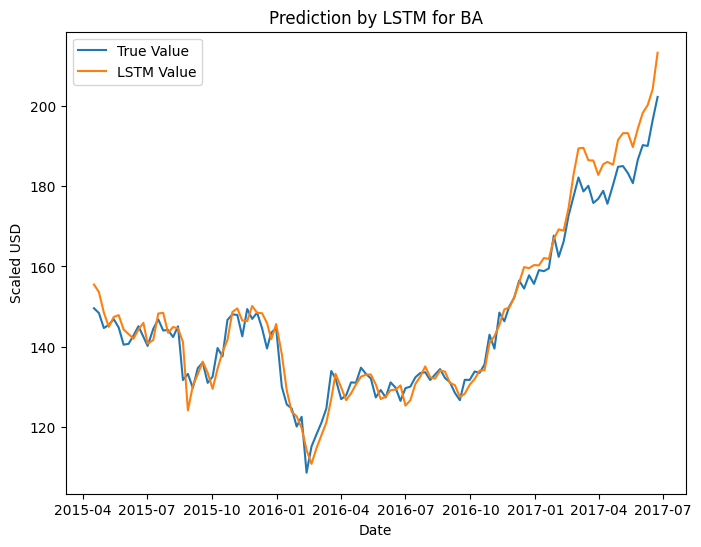

Mean Absolute Error (MAE): 3.404536395529042
Mean Squared Error (MSE): 19.783906097414093
Root Mean Squared Error (RMSE): 4.447910306808591
R-squared (R2) Score: 0.9490738198822481
1/1 [==============================] - 0s 28ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[225.06998]]
Predicted Return for Next Month: [[7.4935393]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.5575221238938053
Epoch 1/100
58/58 [==============================] - 3s 4ms/step - loss: 7509.9829
Epoch 2/100
58/58 [==============================] - 0s 4ms/step - loss: 7455.3164
Epoch 3/100
58/58 [==============================] - 0s 4ms/step - loss: 7155.7739
Epoch 4/100
58/58 [==============================] - 0s 4ms/step - loss: 6021.4536
Epoch 5/100
58/58 [==============================] - 0s 4ms/step - loss: 3971.6230
Epoch 6/100
58/58 [==============================] - 0s 4ms/step - loss: 1967.7151
Epoch 7/100
58/58 [==============================] - 0s 4ms/step - loss: 736.4921
Epoch 8/100
58/58 [==============================] - 0s 4ms/step - loss: 430.5692
Epoch 9/100
58/58 [==============================] - 0s 4ms/step - loss: 413.5088
Epoch 10/100
58/58 [==============================] - 0s 

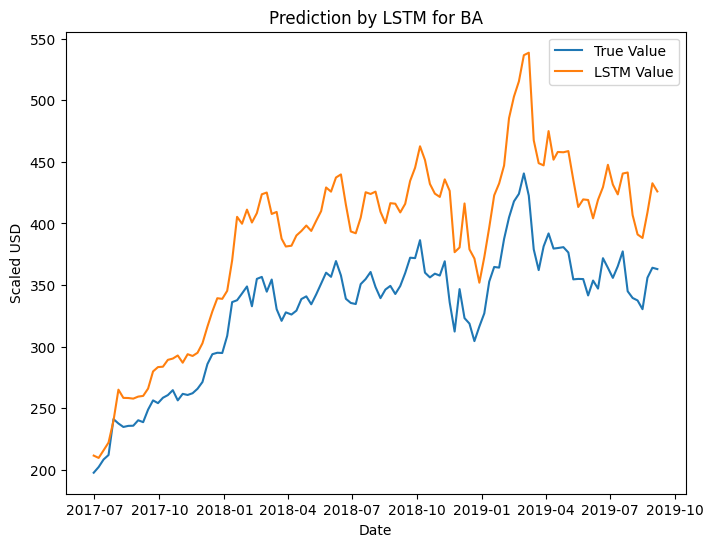

Mean Absolute Error (MAE): 57.16620206882642
Mean Squared Error (MSE): 3779.6349367247235
Root Mean Squared Error (RMSE): 61.47873564676427
R-squared (R2) Score: -0.47639756736006245
1/1 [==============================] - 0s 22ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[221.73422]]
Predicted Return for Next Month: [[5.9003806]] %
Predicted Future Trend for BA : Increase
Accuracy of Trend Prediction for BA : 0.6814159292035398
Epoch 1/100
65/65 [==============================] - 3s 4ms/step - loss: 19050.2344
Epoch 2/100
65/65 [==============================] - 0s 4ms/step - loss: 18872.7891
Epoch 3/100
65/65 [==============================] - 0s 4ms/step - loss: 18258.7012
Epoch 4/100
65/65 [==============================] - 0s 4ms/step - loss: 16638.9766
Epoch 5/100
65/65 [==============================] - 0s 4ms/step - loss: 13850.2773
Epoch 6/100
65/65 [==============================] - 0s 4ms/step - loss: 10113.1104
Epoch 7/100
65/65 [==============================] - 0s 4ms/step - loss: 6286.5190
Epoch 8/100
65/65 [==============================] - 0s 4ms/step - loss: 3421.0132
Epoch 9/100
65/65 [==============================] - 0s 4ms/step - loss: 1762.9336
Epoch 10/100
65/65 [============================

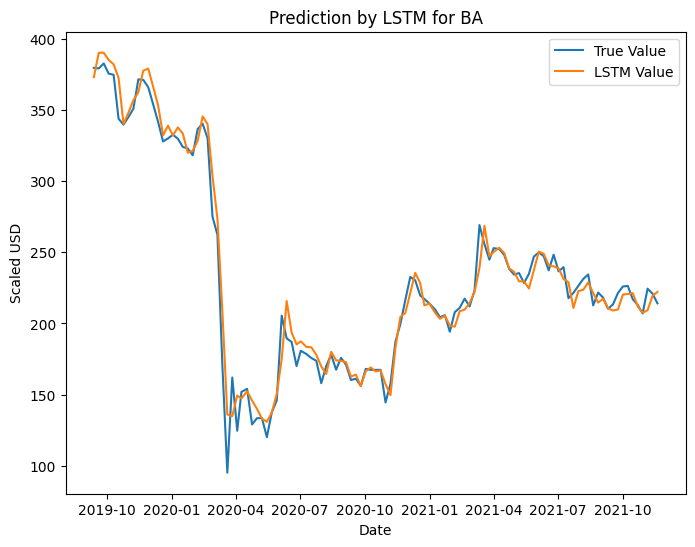

Mean Absolute Error (MAE): 7.569520141601565
Mean Squared Error (MSE): 119.79254652493736
Root Mean Squared Error (RMSE): 10.944978141820904
R-squared (R2) Score: 0.975294962989901
1/1 [==============================] - 0s 25ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for BA : [[203.7021]]
Predicted Return for Next Month: [[-2.711769]] %
Predicted Future Trend for BA : Decrease
Accuracy of Trend Prediction for BA : 0.6991150442477876
Epoch 1/100
72/72 [==============================] - 2s 4ms/step - loss: 23010.0508
Epoch 2/100
72/72 [==============================] - 0s 5ms/step - loss: 22809.8008
Epoch 3/100
72/72 [==============================] - 0s 4ms/step - loss: 21934.3262
Epoch 4/100
72/72 [==============================] - 0s 4ms/step - loss: 19460.4199
Epoch 5/100
72/72 [==============================] - 0s 4ms/step - loss: 15112.3301
Epoch 6/100
72/72 [==============================] - 0s 4ms/step - loss: 9628.9023
Epoch 7/100
72/72 [==============================] - 0s 4ms/step - loss: 4667.2793
Epoch 8/100
72/72 [==============================] - 0s 4ms/step - loss: 1952.8041
Epoch 9/100
72/72 [==============================] - 0s 4ms/step - loss: 1186.9602
Epoch 10/100
72/72 [==============================

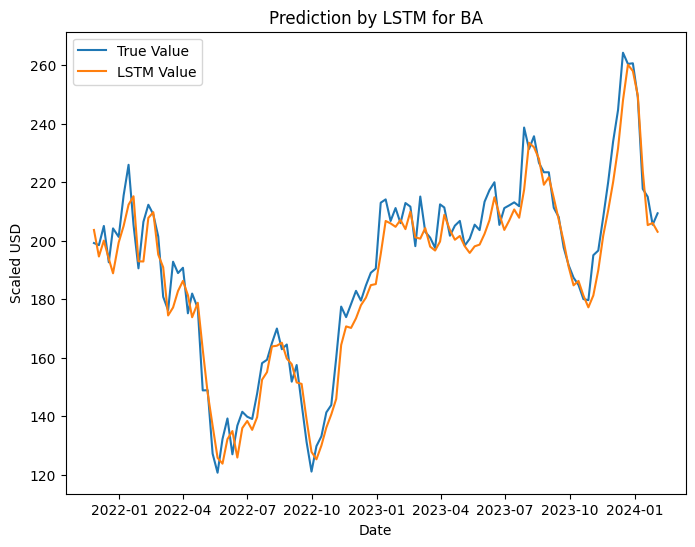

Mean Absolute Error (MAE): 5.927515099566915
Mean Squared Error (MSE): 54.783748880736724
Root Mean Squared Error (RMSE): 7.40160448016082
R-squared (R2) Score: 0.9464953796082476
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\12807537.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Predicted Future Close Price for BA : [[203.0651]]
Predicted Return for Next Month: [[-3.0160048]] %
Predicted Future Trend for BA : Decrease
Accuracy of Trend Prediction for BA : 0.6548672566371682


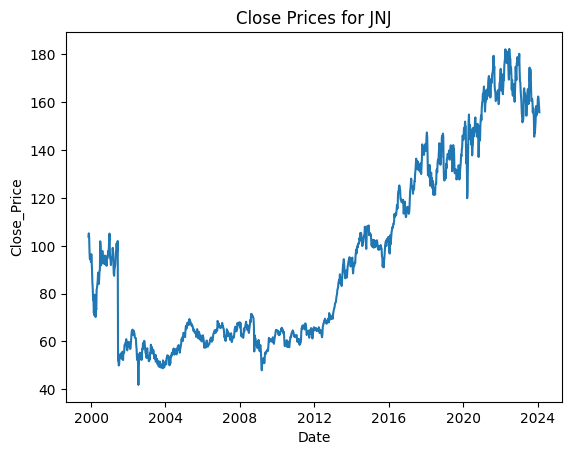

Epoch 1/100
8/8 [==============================] - 2s 4ms/step - loss: 6946.6704
Epoch 2/100
8/8 [==============================] - 0s 4ms/step - loss: 6943.6133
Epoch 3/100
8/8 [==============================] - 0s 4ms/step - loss: 6940.1211
Epoch 4/100
8/8 [==============================] - 0s 5ms/step - loss: 6936.0537
Epoch 5/100
8/8 [==============================] - 0s 5ms/step - loss: 6931.1533
Epoch 6/100
8/8 [==============================] - 0s 5ms/step - loss: 6924.8940
Epoch 7/100
8/8 [==============================] - 0s 5ms/step - loss: 6916.4814
Epoch 8/100
8/8 [==============================] - 0s 5ms/step - loss: 6906.0122
Epoch 9/100
8/8 [==============================] - 0s 4ms/step - loss: 6891.9233
Epoch 10/100
8/8 [==============================] - 0s 4ms/step - loss: 6873.2549
Epoch 11/100
8/8 [==============================] - 0s 4ms/step - loss: 6847.8174
Epoch 12/100
8/8 [==============================] - 0s 4ms/step - loss: 6814.3096
Epoch 13/100
8/8 [=======

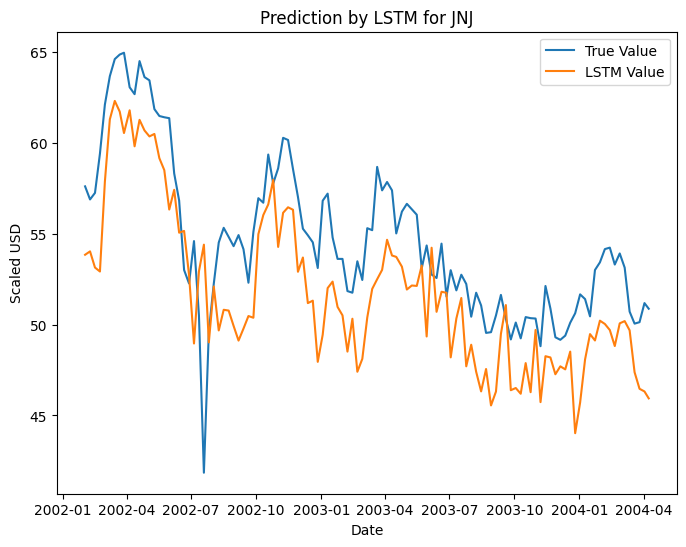

Mean Absolute Error (MAE): 3.2831675839631456
Mean Squared Error (MSE): 13.969970046573263
Root Mean Squared Error (RMSE): 3.7376423112134822
R-squared (R2) Score: 0.2571796675037845
1/1 [==============================] - 0s 31ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for JNJ : [[184.10304]]
Predicted Return for Next Month: [[18.166264]] %
Predicted Future Trend for JNJ : Increase
Accuracy of Trend Prediction for JNJ : 0.5132743362831859
Epoch 1/100
15/15 [==============================] - 3s 4ms/step - loss: 4983.9453
Epoch 2/100
15/15 [==============================] - 0s 4ms/step - loss: 4980.3237
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 4975.9531
Epoch 4/100
15/15 [==============================] - 0s 4ms/step - loss: 4969.9321
Epoch 5/100
15/15 [==============================] - 0s 4ms/step - loss: 4960.5962
Epoch 6/100
15/15 [==============================] - 0s 4ms/step - loss: 4945.8770
Epoch 7/100
15/15 [==============================] - 0s 4ms/step - loss: 4920.3242
Epoch 8/100
15/15 [==============================] - 0s 4ms/step - loss: 4876.2490
Epoch 9/100
15/15 [==============================] - 0s 4ms/step - loss: 4802.2700
Epoch 10/100
15/15 [==============================]

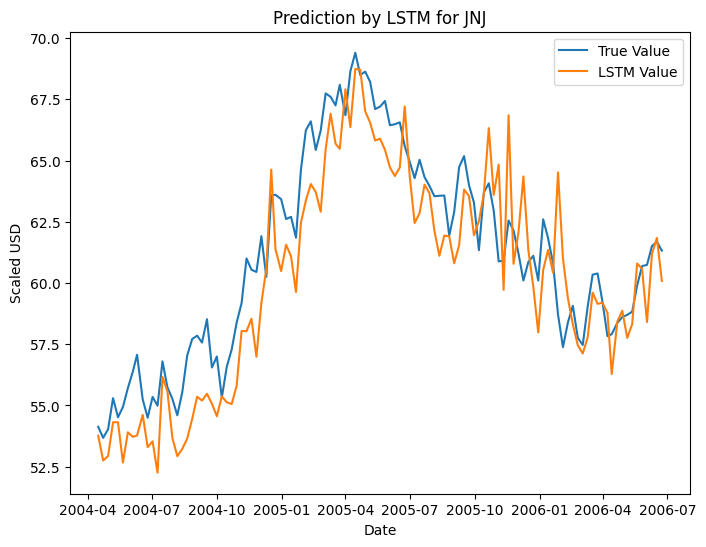

Mean Absolute Error (MAE): 1.6041593402364982
Mean Squared Error (MSE): 3.7668467494904676
Root Mean Squared Error (RMSE): 1.9408366107146855
R-squared (R2) Score: 0.7755482695061091
1/1 [==============================] - 0s 39ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for JNJ : [[176.46802]]
Predicted Return for Next Month: [[13.265735]] %
Predicted Future Trend for JNJ : Increase
Accuracy of Trend Prediction for JNJ : 0.6194690265486725
Epoch 1/100
22/22 [==============================] - 2s 4ms/step - loss: 4572.0923
Epoch 2/100
22/22 [==============================] - 0s 4ms/step - loss: 4562.7686
Epoch 3/100
22/22 [==============================] - 0s 4ms/step - loss: 4546.0977
Epoch 4/100
22/22 [==============================] - 0s 4ms/step - loss: 4512.8296
Epoch 5/100
22/22 [==============================] - 0s 4ms/step - loss: 4441.9966
Epoch 6/100
22/22 [==============================] - 0s 4ms/step - loss: 4290.5566
Epoch 7/100
22/22 [==============================] - 0s 4ms/step - loss: 3985.8357
Epoch 8/100
22/22 [==============================] - 0s 4ms/step - loss: 3434.0247
Epoch 9/100
22/22 [==============================] - 0s 4ms/step - loss: 2593.8074
Epoch 10/100
22/22 [==============================]

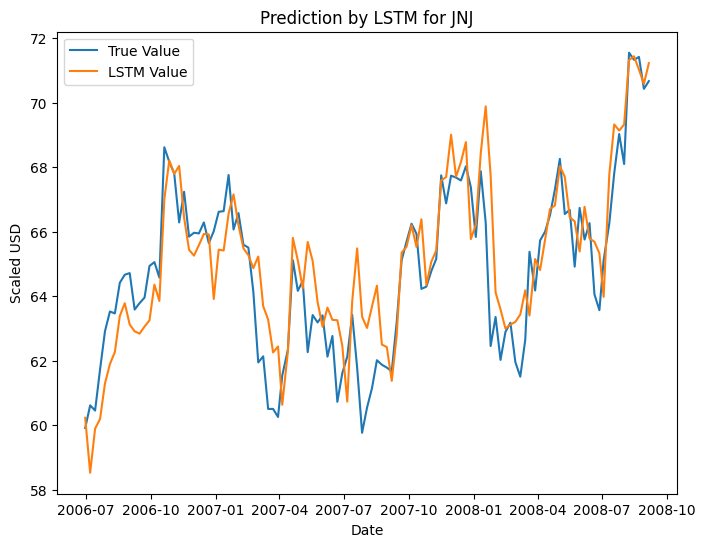

Mean Absolute Error (MAE): 1.0751812054177987
Mean Squared Error (MSE): 2.038102378086441
Root Mean Squared Error (RMSE): 1.4276212306093101
R-squared (R2) Score: 0.7076607614256158
1/1 [==============================] - 0s 25ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for JNJ : [[173.3664]]
Predicted Return for Next Month: [[11.274962]] %
Predicted Future Trend for JNJ : Increase
Accuracy of Trend Prediction for JNJ : 0.5575221238938053
Epoch 1/100
29/29 [==============================] - 2s 4ms/step - loss: 4479.3032
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 4467.9141
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 4444.6187
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 4387.7251
Epoch 5/100
29/29 [==============================] - 0s 4ms/step - loss: 4243.4214
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 3893.1990
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 3198.0669
Epoch 8/100
29/29 [==============================] - 0s 4ms/step - loss: 2246.9880
Epoch 9/100
29/29 [==============================] - 0s 4ms/step - loss: 1255.0713
Epoch 10/100
29/29 [==============================] 

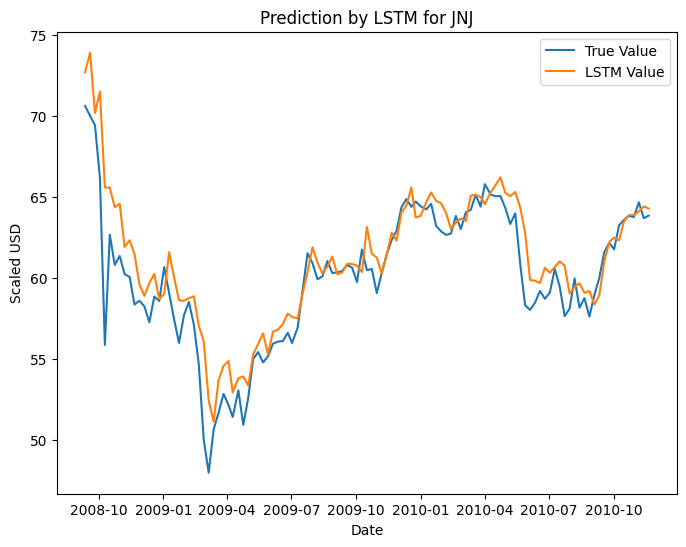

Mean Absolute Error (MAE): 1.3538004880158798
Mean Squared Error (MSE): 3.783116626528734
Root Mean Squared Error (RMSE): 1.9450235542349439
R-squared (R2) Score: 0.7839418665454535
1/1 [==============================] - 0s 28ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for JNJ : [[175.31137]]
Predicted Return for Next Month: [[12.523343]] %
Predicted Future Trend for JNJ : Increase
Accuracy of Trend Prediction for JNJ : 0.5752212389380531
Epoch 1/100
36/36 [==============================] - 1s 3ms/step - loss: 4306.8105
Epoch 2/100
36/36 [==============================] - 0s 3ms/step - loss: 4289.1885
Epoch 3/100
36/36 [==============================] - 0s 3ms/step - loss: 4233.6270
Epoch 4/100
36/36 [==============================] - 0s 3ms/step - loss: 4041.2427
Epoch 5/100
36/36 [==============================] - 0s 3ms/step - loss: 3459.7896
Epoch 6/100
36/36 [==============================] - 0s 3ms/step - loss: 2304.3918
Epoch 7/100
36/36 [==============================] - 0s 3ms/step - loss: 1046.7284
Epoch 8/100
36/36 [==============================] - 0s 3ms/step - loss: 280.2292
Epoch 9/100
36/36 [==============================] - 0s 4ms/step - loss: 68.8488
Epoch 10/100
36/36 [==============================] - 

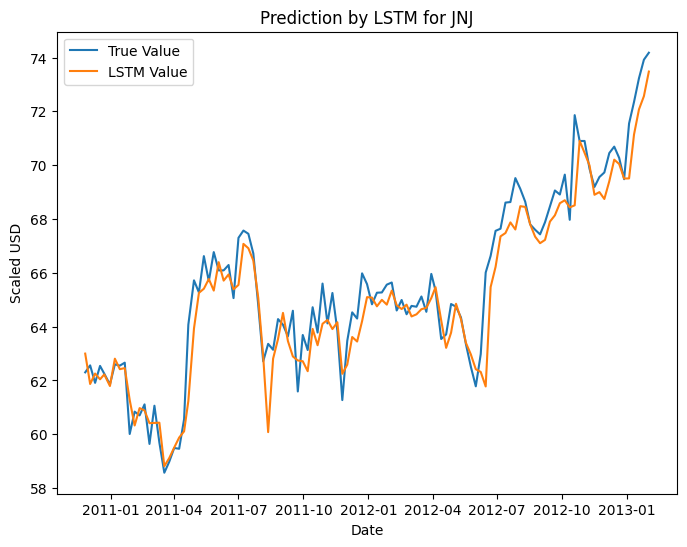

Mean Absolute Error (MAE): 0.6994735054347826
Mean Squared Error (MSE): 0.9802252127291249
Root Mean Squared Error (RMSE): 0.9900632367324447
R-squared (R2) Score: 0.9132747554035449
1/1 [==============================] - 0s 22ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for JNJ : [[173.93448]]
Predicted Return for Next Month: [[11.639586]] %
Predicted Future Trend for JNJ : Increase
Accuracy of Trend Prediction for JNJ : 0.6460176991150443
Epoch 1/100
44/44 [==============================] - 2s 4ms/step - loss: 4302.9976
Epoch 2/100
44/44 [==============================] - 0s 4ms/step - loss: 4274.9458
Epoch 3/100
44/44 [==============================] - 0s 5ms/step - loss: 4152.4658
Epoch 4/100
44/44 [==============================] - 0s 4ms/step - loss: 3614.5024
Epoch 5/100
44/44 [==============================] - 0s 4ms/step - loss: 2236.8977
Epoch 6/100
44/44 [==============================] - 0s 4ms/step - loss: 722.7628
Epoch 7/100
44/44 [==============================] - 0s 4ms/step - loss: 112.3034
Epoch 8/100
44/44 [==============================] - 0s 4ms/step - loss: 46.3032
Epoch 9/100
44/44 [==============================] - 0s 4ms/step - loss: 41.8954
Epoch 10/100
44/44 [==============================] - 0s 

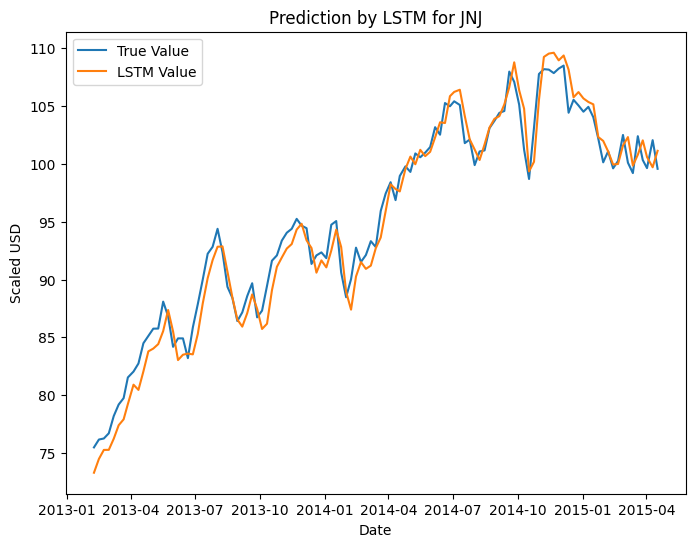

Mean Absolute Error (MAE): 1.2930676216457202
Mean Squared Error (MSE): 2.3281313052393338
Root Mean Squared Error (RMSE): 1.5258215181466455
R-squared (R2) Score: 0.9677271516647076
1/1 [==============================] - 0s 25ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for JNJ : [[171.46593]]
Predicted Return for Next Month: [[10.05515]] %
Predicted Future Trend for JNJ : Increase
Accuracy of Trend Prediction for JNJ : 0.672566371681416
Epoch 1/100
51/51 [==============================] - 2s 4ms/step - loss: 4988.5820
Epoch 2/100
51/51 [==============================] - 0s 4ms/step - loss: 4925.5132
Epoch 3/100
51/51 [==============================] - 0s 4ms/step - loss: 4594.4155
Epoch 4/100
51/51 [==============================] - 0s 4ms/step - loss: 3359.5938
Epoch 5/100
51/51 [==============================] - 0s 4ms/step - loss: 1317.4468
Epoch 6/100
51/51 [==============================] - 0s 4ms/step - loss: 201.9179
Epoch 7/100
51/51 [==============================] - 0s 4ms/step - loss: 59.4428
Epoch 8/100
51/51 [==============================] - 0s 4ms/step - loss: 51.3084
Epoch 9/100
51/51 [==============================] - 0s 4ms/step - loss: 54.3897
Epoch 10/100
51/51 [==============================] - 0s 4ms

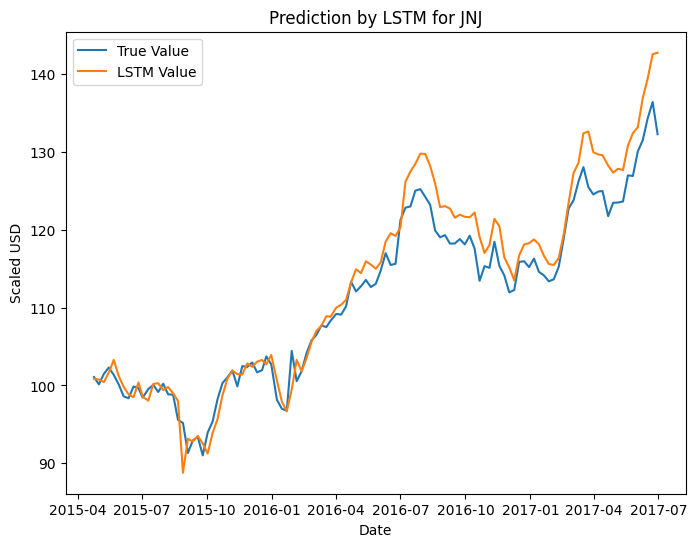

Mean Absolute Error (MAE): 2.4569437017026154
Mean Squared Error (MSE): 9.814275781560736
Root Mean Squared Error (RMSE): 3.1327744543073535
R-squared (R2) Score: 0.9183765329920008
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for JNJ : [[171.42438]]
Predicted Return for Next Month: [[10.0284815]] %
Predicted Future Trend for JNJ : Increase
Accuracy of Trend Prediction for JNJ : 0.6283185840707964
Epoch 1/100
58/58 [==============================] - 2s 4ms/step - loss: 5914.8999
Epoch 2/100
58/58 [==============================] - 0s 4ms/step - loss: 5776.2949
Epoch 3/100
58/58 [==============================] - 0s 4ms/step - loss: 4962.0400
Epoch 4/100
58/58 [==============================] - 0s 4ms/step - loss: 2667.2593
Epoch 5/100
58/58 [==============================] - 0s 4ms/step - loss: 543.6702
Epoch 6/100
58/58 [==============================] - 0s 4ms/step - loss: 73.1438
Epoch 7/100
58/58 [==============================] - 0s 4ms/step - loss: 57.5941
Epoch 8/100
58/58 [==============================] - 0s 4ms/step - loss: 55.4039
Epoch 9/100
58/58 [==============================] - 0s 4ms/step - loss: 55.7963
Epoch 10/100
58/58 [==============================] - 0s 4m

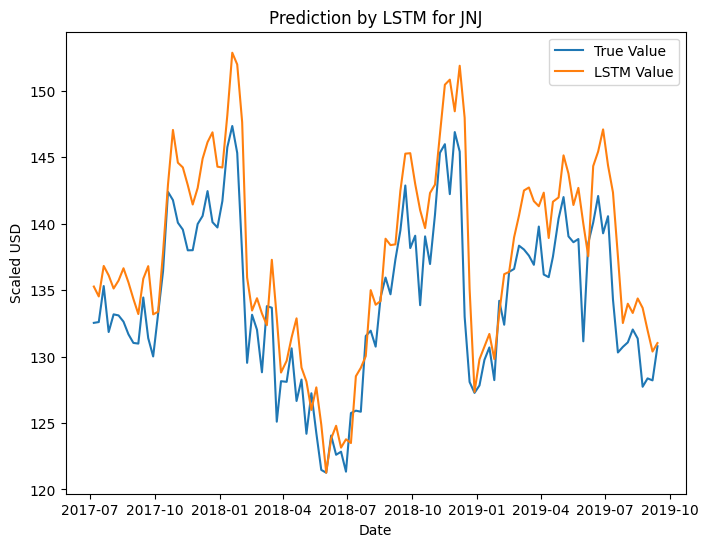

Mean Absolute Error (MAE): 3.4108748540463654
Mean Squared Error (MSE): 17.58776139091369
Root Mean Squared Error (RMSE): 4.193776507029636
R-squared (R2) Score: 0.534005884922681
1/1 [==============================] - 0s 20ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for JNJ : [[163.96602]]
Predicted Return for Next Month: [[5.241345]] %
Predicted Future Trend for JNJ : Increase
Accuracy of Trend Prediction for JNJ : 0.6283185840707964
Epoch 1/100
65/65 [==============================] - 2s 4ms/step - loss: 7261.5024
Epoch 2/100
65/65 [==============================] - 0s 4ms/step - loss: 7068.7065
Epoch 3/100
65/65 [==============================] - 0s 4ms/step - loss: 5900.8379
Epoch 4/100
65/65 [==============================] - 0s 4ms/step - loss: 3083.5337
Epoch 5/100
65/65 [==============================] - 0s 4ms/step - loss: 685.2557
Epoch 6/100
65/65 [==============================] - 0s 4ms/step - loss: 109.9836
Epoch 7/100
65/65 [==============================] - 0s 4ms/step - loss: 72.8701
Epoch 8/100
65/65 [==============================] - 0s 4ms/step - loss: 77.3491
Epoch 9/100
65/65 [==============================] - 0s 4ms/step - loss: 71.3536
Epoch 10/100
65/65 [==============================] - 0s 4ms

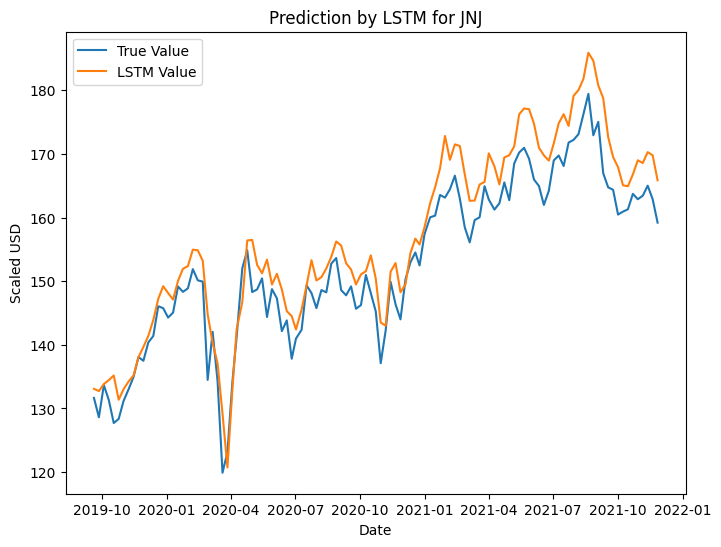

Mean Absolute Error (MAE): 4.321571809188179
Mean Squared Error (MSE): 25.875118090494958
Root Mean Squared Error (RMSE): 5.086759094993094
R-squared (R2) Score: 0.8423307058306441
1/1 [==============================] - 0s 21ms/step


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Predicted Future Close Price for JNJ : [[160.48639]]
Predicted Return for Next Month: [[3.0079498]] %
Predicted Future Trend for JNJ : Increase
Accuracy of Trend Prediction for JNJ : 0.6814159292035398
Epoch 1/100
72/72 [==============================] - 2s 4ms/step - loss: 8846.9141
Epoch 2/100
72/72 [==============================] - 0s 4ms/step - loss: 8370.8604
Epoch 3/100
72/72 [==============================] - 0s 4ms/step - loss: 6143.4507
Epoch 4/100
72/72 [==============================] - 0s 4ms/step - loss: 2311.1309
Epoch 5/100
72/72 [==============================] - 0s 4ms/step - loss: 294.5562
Epoch 6/100
72/72 [==============================] - 0s 4ms/step - loss: 103.8708
Epoch 7/100
72/72 [==============================] - 0s 4ms/step - loss: 87.9009
Epoch 8/100
72/72 [==============================] - 0s 4ms/step - loss: 91.6571
Epoch 9/100
72/72 [==============================] - 0s 4ms/step - loss: 84.1169
Epoch 10/100
72/72 [==============================] - 0s 4m

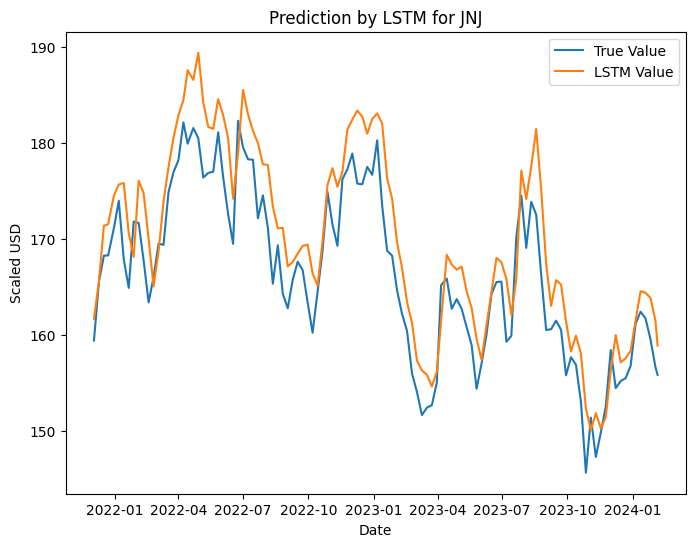

Mean Absolute Error (MAE): 4.036958458941916
Mean Squared Error (MSE): 21.429104932776042
Root Mean Squared Error (RMSE): 4.6291581235442845
R-squared (R2) Score: 0.7201772297418382
1/1 [==============================] - 0s 36ms/step
Predicted Future Close Price for JNJ : [[158.86081]]
Predicted Return for Next Month: [[1.964574]] %
Predicted Future Trend for JNJ : Increase
Accuracy of Trend Prediction for JNJ : 0.672566371681416


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


,Ticker,Predicted Price,Predicted Return
0,AAL,14.688693,0.883878
1,AAPL,187.20488,0.729015
2,ADBE,638.777771,0.632958
3,AMZN,35.76899,-79.181084
4,BA,203.065094,-3.016005
5,BAC,33.395344,-0.223058
6,CCI,NaN,NaN
7,CMCSA,NaN,NaN
8,COP,NaN,NaN
9,COST,764.844421,7.803524


In [148]:
#new code 


# Function to predict future prices
def predict_future_prices(model, features, output, n_steps):
    future_predictions = []
    last_sequence = features[-1].reshape(1, 1, -1)
    for i in range(n_steps):
        future_prediction = model.predict(last_sequence)
        future_predictions.append(future_prediction.flatten()[0])
        last_sequence = np.append(last_sequence[:, 1:, :], future_prediction.reshape(1, 1, 1), axis=1)
    return future_predictions

# Loop over selected ticker symbols
#selected_tickers = ['SBUX','V','VZ','WMT','AAPL', 'ADBE', 'AMZN', 'BAC', 'CRM', 'COST', 'GOOGL', 'JPM', 'NVDA']
selected_tickers = ['AAL','BA','XOM','UNH','UAL', 'TMUS', 'RIO', 'NUE', 'NFLX', 'MSFT', 'META', 'BA', 'JNJ']
for symbol in selected_tickers:
    symbol_df = clean_df[clean_df['Ticker'] == symbol]
    symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])

    plt.plot(symbol_df['Date'], symbol_df['Close_Price'])
    plt.xlabel('Date')
    plt.ylabel('Close_Price')
    plt.title(f'Close Prices for {symbol}')
    plt.show()

    output = symbol_df['Close_Price']
    features = ['Open_Price', 'High_Price', 'Low_Price', 'Volume']

    scaler = MinMaxScaler()
    feature_transform = scaler.fit_transform(symbol_df[features])
    feature_transform = pd.DataFrame(columns=features, data=feature_transform, index=symbol_df.index)

    timesplit = TimeSeriesSplit(n_splits=10)
    for train_index, test_index in timesplit.split(feature_transform):
        X_train, X_test = feature_transform[:len(train_index)], feature_transform[len(train_index): (len(train_index)+len(test_index))]
        y_train, y_test = output[:len(train_index)].values.ravel(), output[len(train_index): (len(train_index)+len(test_index))].values.ravel()

        trainX = np.array(X_train)
        testX = np.array(X_test)
        X_train = trainX.reshape(X_train.shape[0], 1, X_train.shape[1])
        X_test = testX.reshape(X_test.shape[0], 1, X_test.shape[1])

        lstm = Sequential()
        lstm.add(LSTM(64, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=True))
        lstm.add(Dropout(0.2))
        lstm.add(LSTM(32, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=False))
        lstm.add(Dense(1))
        lstm.compile(loss='mean_squared_error', optimizer='adam')

        history = lstm.fit(X_train, y_train, epochs=100, batch_size=16, verbose=1, shuffle=False)

        y_pred = lstm.predict(X_test)

        plt.figure(figsize=(8, 6))
        plt.plot(symbol_df['Date'].iloc[test_index], y_test, label='True Value')
        plt.plot(symbol_df['Date'].iloc[test_index], y_pred, label='LSTM Value')
        plt.title(f'Prediction by LSTM for {symbol}')
        plt.xlabel('Date')
        plt.ylabel('Scaled USD')
        plt.legend()
        plt.show()

        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        r2 = r2_score(y_test, y_pred)

        print("Mean Absolute Error (MAE):", mae)
        print("Mean Squared Error (MSE):", mse)
        print("Root Mean Squared Error (RMSE):", rmse)
        print("R-squared (R2) Score:", r2)

        # Predicting future prices
        future_features = feature_transform.iloc[-1:].values.reshape(1, 1, -1)
        future_prediction = lstm.predict(future_features)
        print("Predicted Future Close Price for", symbol, ":", future_prediction)

        # Predicting future return
        last_price = output.iloc[-1]
        predicted_return = ((future_prediction - last_price) / last_price) * 100
        print("Predicted Return for Next Month:", predicted_return, "%")

        # Update predict_df with predicted price and return for the current ticker
        if symbol in predict_df['Ticker'].values:
            predict_df.loc[predict_df['Ticker'] == symbol, 'Predicted Price'] = future_prediction
            predict_df.loc[predict_df['Ticker'] == symbol, 'Predicted Return'] = predicted_return
        else:
            print(f"Warning: Ticker '{symbol}' not found in predict_df.")

        # Predicting future trend
        if future_prediction > output.iloc[-1]:
            print("Predicted Future Trend for", symbol, ": Increase")
        else:
            print("Predicted Future Trend for", symbol, ": Decrease")

        trend_true = np.sign(np.diff(y_test[1:])) 
        trend_pred = np.sign(np.diff(y_pred.flatten()[1:])) 

        trend_true[trend_true == 0] = 1
        trend_pred[trend_pred == 0] = 1

        accuracy = accuracy_score(trend_true, trend_pred)
        print("Accuracy of Trend Prediction for", symbol, ":", accuracy)
        
predict_df




C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\1389442127.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


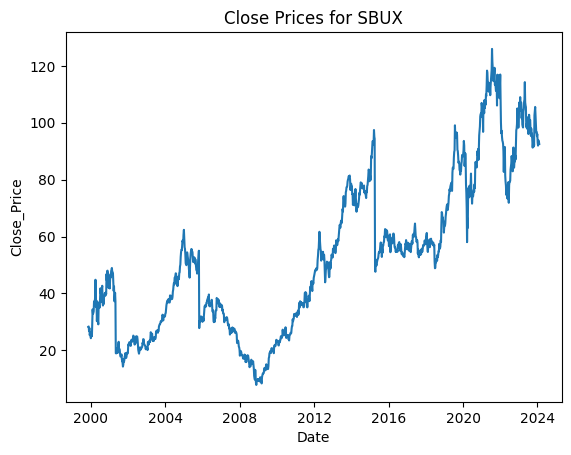

Epoch 1/10
8/8 [==============================] - 2s 3ms/step - loss: 1103.6495
Epoch 2/10
8/8 [==============================] - 0s 4ms/step - loss: 1102.4685
Epoch 3/10
8/8 [==============================] - 0s 3ms/step - loss: 1101.2352
Epoch 4/10
8/8 [==============================] - 0s 4ms/step - loss: 1099.8574
Epoch 5/10
8/8 [==============================] - 0s 4ms/step - loss: 1098.2051
Epoch 6/10
8/8 [==============================] - 0s 3ms/step - loss: 1096.2883
Epoch 7/10
8/8 [==============================] - 0s 3ms/step - loss: 1093.9475
Epoch 8/10
8/8 [==============================] - 0s 4ms/step - loss: 1091.0177
Epoch 9/10
8/8 [==============================] - 0s 4ms/step - loss: 1087.4574
Epoch 10/10
4/4 [==============================] - 0s 3ms/step


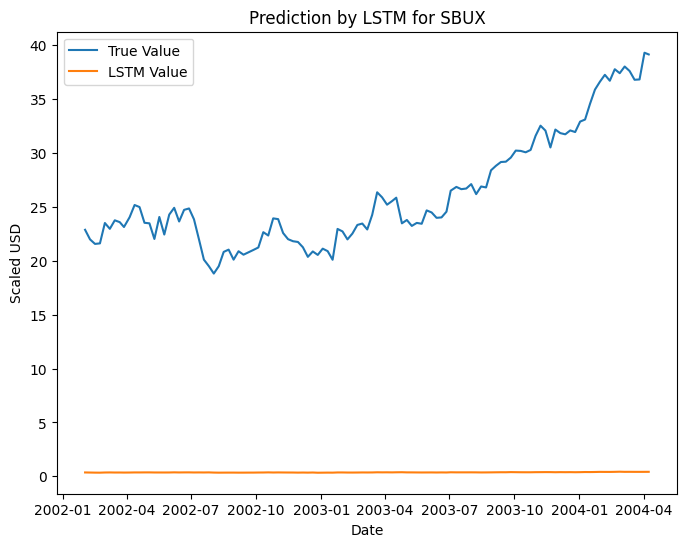

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 25.732507407126224
Mean Squared Error (MSE): 689.4976322078475
Root Mean Squared Error (RMSE): 26.258286924471054
R-squared (R2) Score: -24.031198873095295
Epoch 1/10
15/15 [==============================] - 3s 4ms/step - loss: 906.6069
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 904.9998
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 902.9532
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 900.0810
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 895.7552
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 888.7563
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 877.4123
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 858.3344
Epoch 9/10
15/15 [==============================] - 0s 3ms/step - loss: 827.2075
Epoch 10/10
4/4 [==============================] - 0s 3ms/step


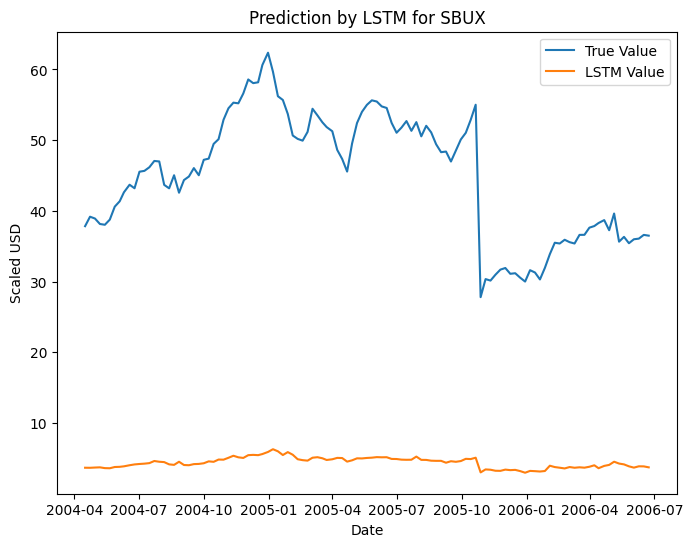

Mean Absolute Error (MAE): 40.569161367416385
Mean Squared Error (MSE): 1709.7860242999836
Root Mean Squared Error (RMSE): 41.34955893718799
R-squared (R2) Score: -21.66160333454833
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


22/22 [==============================] - 2s 4ms/step - loss: 1301.7885
Epoch 2/10
22/22 [==============================] - 0s 3ms/step - loss: 1297.9141
Epoch 3/10
22/22 [==============================] - 0s 3ms/step - loss: 1291.5009
Epoch 4/10
22/22 [==============================] - 0s 3ms/step - loss: 1278.7209
Epoch 5/10
22/22 [==============================] - 0s 3ms/step - loss: 1251.4972
Epoch 6/10
22/22 [==============================] - 0s 3ms/step - loss: 1192.5336
Epoch 7/10
22/22 [==============================] - 0s 3ms/step - loss: 1070.1031
Epoch 8/10
22/22 [==============================] - 0s 4ms/step - loss: 859.9587
Epoch 9/10
22/22 [==============================] - 0s 3ms/step - loss: 572.1647
Epoch 10/10
4/4 [==============================] - 0s 5ms/step


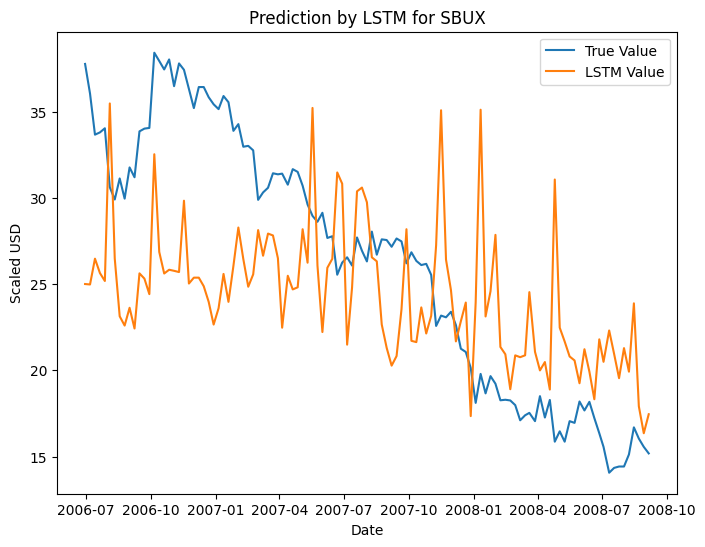

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 5.810723976466968
Mean Squared Error (MSE): 46.28450222418623
Root Mean Squared Error (RMSE): 6.803271435433561
R-squared (R2) Score: 0.15045898720236628
Epoch 1/10
29/29 [==============================] - 3s 4ms/step - loss: 1161.6699
Epoch 2/10
29/29 [==============================] - 0s 4ms/step - loss: 1155.1658
Epoch 3/10
29/29 [==============================] - 0s 4ms/step - loss: 1140.5156
Epoch 4/10
29/29 [==============================] - 0s 3ms/step - loss: 1100.5280
Epoch 5/10
29/29 [==============================] - 0s 3ms/step - loss: 991.4113
Epoch 6/10
29/29 [==============================] - 0s 3ms/step - loss: 743.6436
Epoch 7/10
29/29 [==============================] - 0s 3ms/step - loss: 384.5505
Epoch 8/10
29/29 [==============================] - 0s 3ms/step - loss: 137.8693
Epoch 9/10
29/29 [==============================] - 0s 4ms/step - loss: 64.2982
Epoch 10/10
4/4 [==============================] - 0s 3ms/step


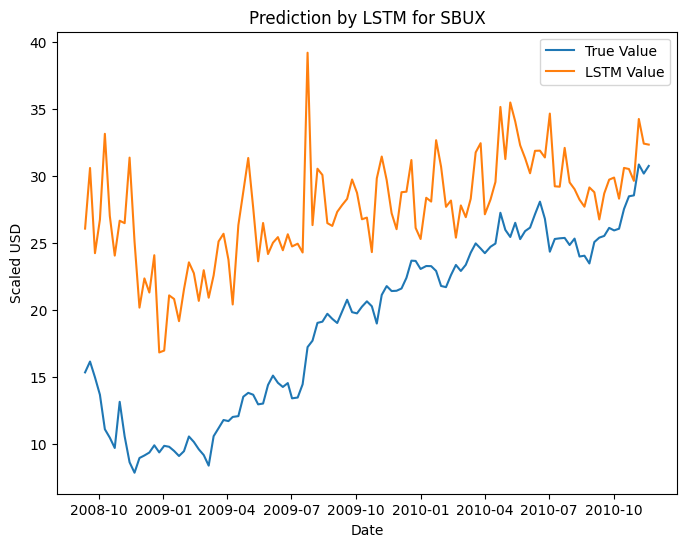

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8.562361587524414
Mean Squared Error (MSE): 94.80240822637084
Root Mean Squared Error (RMSE): 9.736652824578416
R-squared (R2) Score: -1.2251828200536843
Epoch 1/10
36/36 [==============================] - 2s 3ms/step - loss: 1009.8676
Epoch 2/10
36/36 [==============================] - 0s 3ms/step - loss: 1002.1544
Epoch 3/10
36/36 [==============================] - 0s 3ms/step - loss: 980.0452
Epoch 4/10
36/36 [==============================] - 0s 3ms/step - loss: 907.5534
Epoch 5/10
36/36 [==============================] - 0s 3ms/step - loss: 704.2468
Epoch 6/10
36/36 [==============================] - 0s 3ms/step - loss: 373.5720
Epoch 7/10
36/36 [==============================] - 0s 3ms/step - loss: 146.7269
Epoch 8/10
36/36 [==============================] - 0s 3ms/step - loss: 83.8315
Epoch 9/10
36/36 [==============================] - 0s 3ms/step - loss: 64.0569
Epoch 10/10
4/4 [==============================] - 0s 4ms/step


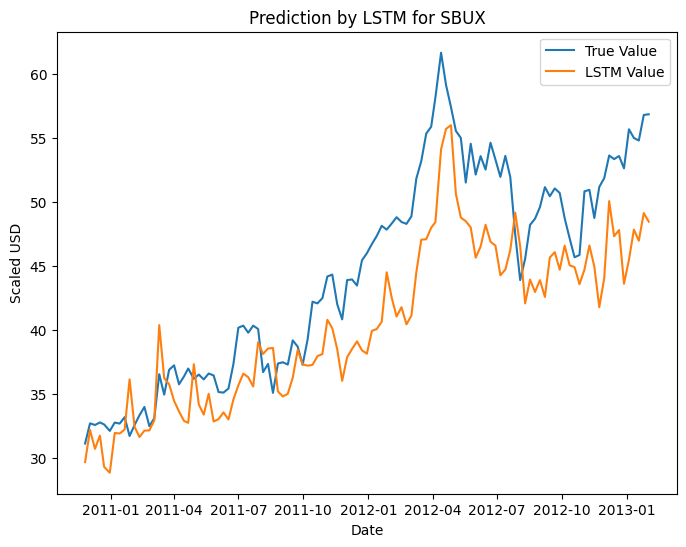

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 4.327457276717476
Mean Squared Error (MSE): 25.41956922755606
Root Mean Squared Error (RMSE): 5.0417823463092954
R-squared (R2) Score: 0.6140692580395148
Epoch 1/10
44/44 [==============================] - 3s 4ms/step - loss: 1181.1449
Epoch 2/10
44/44 [==============================] - 0s 3ms/step - loss: 1171.8047
Epoch 3/10
44/44 [==============================] - 0s 4ms/step - loss: 1133.9929
Epoch 4/10
44/44 [==============================] - 0s 4ms/step - loss: 971.5360
Epoch 5/10
44/44 [==============================] - 0s 3ms/step - loss: 603.4917
Epoch 6/10
44/44 [==============================] - 0s 3ms/step - loss: 239.8596
Epoch 7/10
44/44 [==============================] - 0s 3ms/step - loss: 90.2876
Epoch 8/10
44/44 [==============================] - 0s 3ms/step - loss: 66.7271
Epoch 9/10
44/44 [==============================] - 0s 3ms/step - loss: 55.9714
Epoch 10/10
4/4 [==============================] - 0s 4ms/step


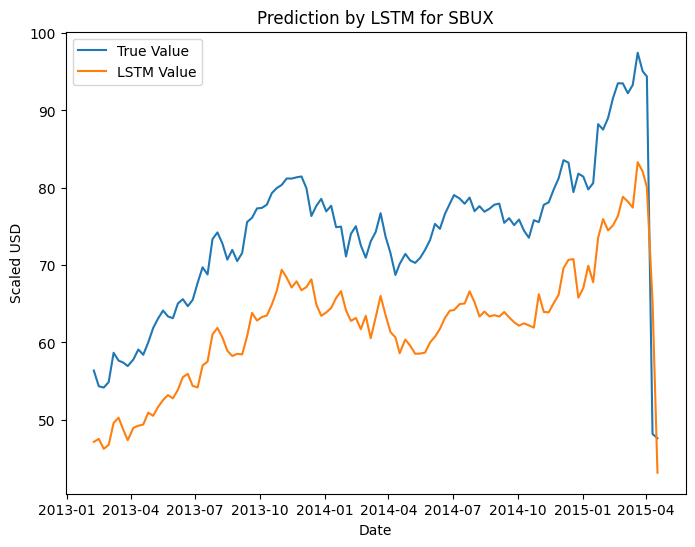

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 12.099118960173234
Mean Squared Error (MSE): 152.11266650223737
Root Mean Squared Error (RMSE): 12.33339638956915
R-squared (R2) Score: -0.6007465309133537
Epoch 1/10
51/51 [==============================] - 3s 4ms/step - loss: 1803.1772
Epoch 2/10
51/51 [==============================] - 0s 4ms/step - loss: 1754.4792
Epoch 3/10
51/51 [==============================] - 0s 3ms/step - loss: 1511.4417
Epoch 4/10
51/51 [==============================] - 0s 5ms/step - loss: 827.2558
Epoch 5/10
51/51 [==============================] - 0s 4ms/step - loss: 205.2358
Epoch 6/10
51/51 [==============================] - 0s 4ms/step - loss: 94.5719
Epoch 7/10
51/51 [==============================] - 0s 4ms/step - loss: 78.2361
Epoch 8/10
51/51 [==============================] - 0s 4ms/step - loss: 65.2536
Epoch 9/10
51/51 [==============================] - 0s 4ms/step - loss: 55.4023
Epoch 10/10
4/4 [==============================] - 0s 4ms/step


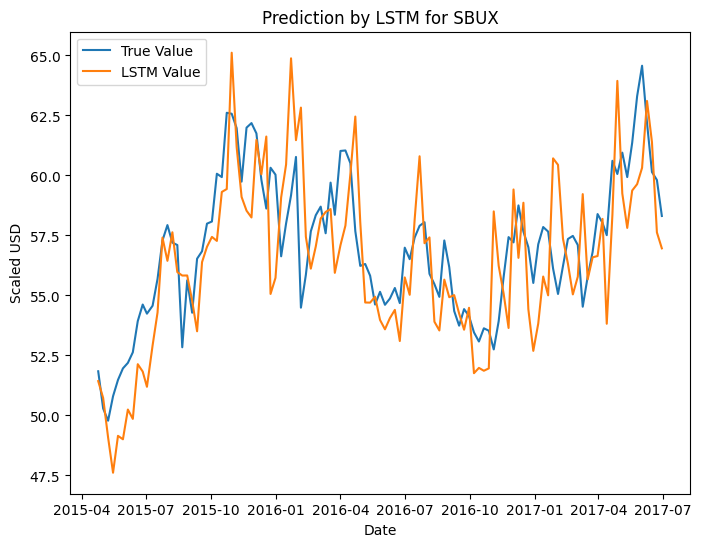

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 1.9719436990489132
Mean Squared Error (MSE): 6.021499897397421
Root Mean Squared Error (RMSE): 2.4538744665115657
R-squared (R2) Score: 0.31573073171314914
Epoch 1/10
58/58 [==============================] - 3s 3ms/step - loss: 1983.7163
Epoch 2/10
58/58 [==============================] - 0s 3ms/step - loss: 1913.9828
Epoch 3/10
58/58 [==============================] - 0s 4ms/step - loss: 1469.0156
Epoch 4/10
58/58 [==============================] - 0s 3ms/step - loss: 520.2109
Epoch 5/10
58/58 [==============================] - 0s 3ms/step - loss: 91.7735
Epoch 6/10
58/58 [==============================] - 0s 3ms/step - loss: 71.9742
Epoch 7/10
58/58 [==============================] - 0s 3ms/step - loss: 60.1448
Epoch 8/10
58/58 [==============================] - 0s 3ms/step - loss: 51.5744
Epoch 9/10
58/58 [==============================] - 0s 3ms/step - loss: 45.8077
Epoch 10/10
4/4 [==============================] - 0s 4ms/step


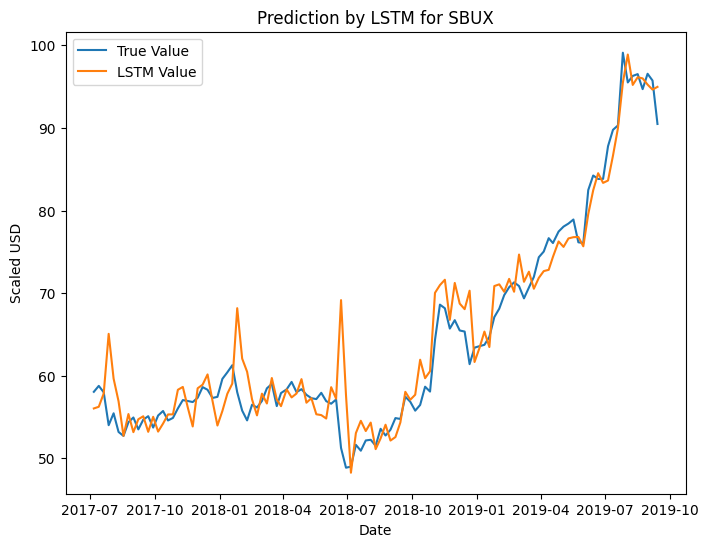

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 2.267864352018937
Mean Squared Error (MSE): 11.193760870685418
Root Mean Squared Error (RMSE): 3.3457078280515495
R-squared (R2) Score: 0.9303916917963211
Epoch 1/10
65/65 [==============================] - 2s 3ms/step - loss: 2238.5623
Epoch 2/10
65/65 [==============================] - 0s 3ms/step - loss: 2131.5830
Epoch 3/10
65/65 [==============================] - 0s 3ms/step - loss: 1424.6074
Epoch 4/10
65/65 [==============================] - 0s 3ms/step - loss: 317.8783
Epoch 5/10
65/65 [==============================] - 0s 3ms/step - loss: 80.9646
Epoch 6/10
65/65 [==============================] - 0s 3ms/step - loss: 66.6011
Epoch 7/10
65/65 [==============================] - 0s 3ms/step - loss: 58.4479
Epoch 8/10
65/65 [==============================] - 0s 3ms/step - loss: 49.3115
Epoch 9/10
65/65 [==============================] - 0s 3ms/step - loss: 41.6219
Epoch 10/10
4/4 [==============================] - 0s 2ms/step


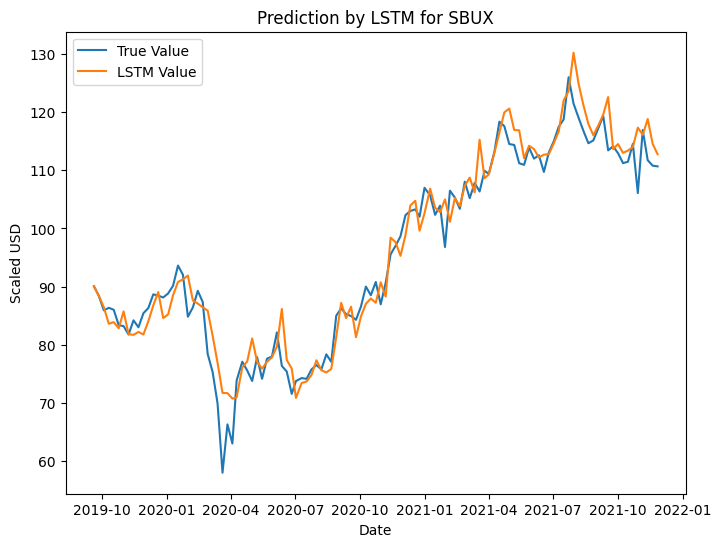

Mean Absolute Error (MAE): 2.7065549820609713
Mean Squared Error (MSE): 14.359715089055015
Root Mean Squared Error (RMSE): 3.789421471551431
R-squared (R2) Score: 0.9443573280500465
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


72/72 [==============================] - 2s 3ms/step - loss: 2934.2546
Epoch 2/10
72/72 [==============================] - 0s 3ms/step - loss: 2686.5779
Epoch 3/10
72/72 [==============================] - 0s 3ms/step - loss: 1436.0237
Epoch 4/10
72/72 [==============================] - 0s 3ms/step - loss: 175.1934
Epoch 5/10
72/72 [==============================] - 0s 3ms/step - loss: 81.2705
Epoch 6/10
72/72 [==============================] - 0s 3ms/step - loss: 68.4862
Epoch 7/10
72/72 [==============================] - 0s 3ms/step - loss: 59.3137
Epoch 8/10
72/72 [==============================] - 0s 3ms/step - loss: 51.1872
Epoch 9/10
72/72 [==============================] - 0s 3ms/step - loss: 47.2952
Epoch 10/10
4/4 [==============================] - 0s 2ms/step


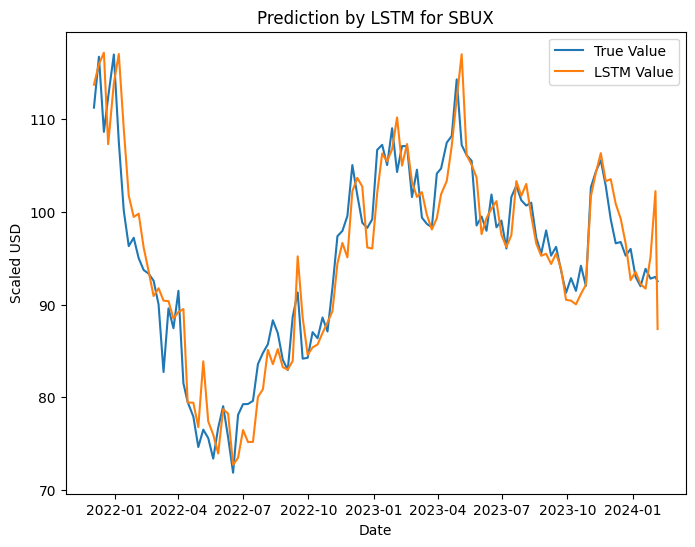

Mean Absolute Error (MAE): 2.5889212619947353
Mean Squared Error (MSE): 11.679165908737215
Root Mean Squared Error (RMSE): 3.4174794672005295
R-squared (R2) Score: 0.8845029560896539


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\1389442127.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


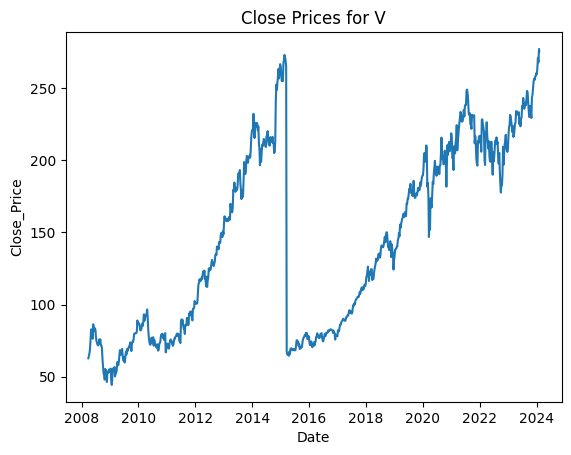

Epoch 1/10
5/5 [==============================] - 1s 3ms/step - loss: 4275.2559
Epoch 2/10
5/5 [==============================] - 0s 3ms/step - loss: 4273.8970
Epoch 3/10
5/5 [==============================] - 0s 3ms/step - loss: 4272.4268
Epoch 4/10
5/5 [==============================] - 0s 3ms/step - loss: 4270.8784
Epoch 5/10
5/5 [==============================] - 0s 3ms/step - loss: 4269.2583
Epoch 6/10
5/5 [==============================] - 0s 3ms/step - loss: 4267.4668
Epoch 7/10
5/5 [==============================] - 0s 3ms/step - loss: 4265.4727
Epoch 8/10
5/5 [==============================] - 0s 3ms/step - loss: 4263.3042
Epoch 9/10
5/5 [==============================] - 0s 3ms/step - loss: 4260.7319
Epoch 10/10
3/3 [==============================] - 0s 2ms/step


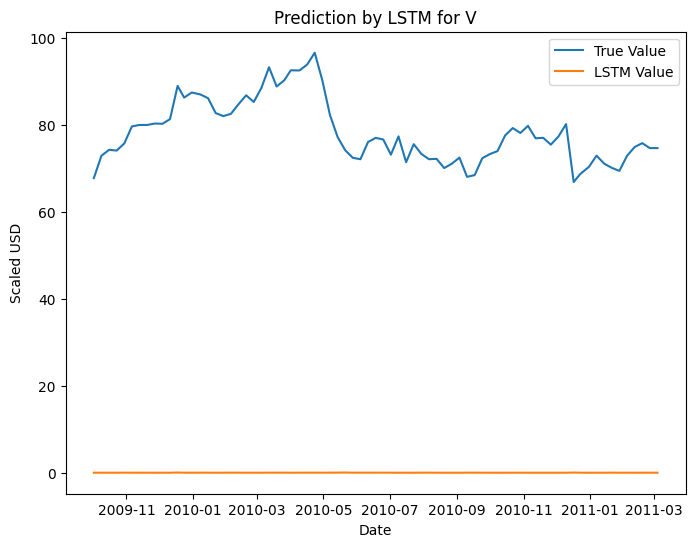

Mean Absolute Error (MAE): 78.13171560133298
Mean Squared Error (MSE): 6155.916923517467
Root Mean Squared Error (RMSE): 78.45965156382908
R-squared (R2) Score: -118.86057724615955
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


10/10 [==============================] - 2s 3ms/step - loss: 5201.2695
Epoch 2/10
10/10 [==============================] - 0s 3ms/step - loss: 5198.1431
Epoch 3/10
10/10 [==============================] - 0s 3ms/step - loss: 5194.1533
Epoch 4/10
10/10 [==============================] - 0s 3ms/step - loss: 5188.8745
Epoch 5/10
10/10 [==============================] - 0s 3ms/step - loss: 5181.8730
Epoch 6/10
10/10 [==============================] - 0s 3ms/step - loss: 5172.0537
Epoch 7/10
10/10 [==============================] - 0s 3ms/step - loss: 5158.1299
Epoch 8/10
10/10 [==============================] - 0s 3ms/step - loss: 5137.9409
Epoch 9/10
10/10 [==============================] - 0s 3ms/step - loss: 5107.7627
Epoch 10/10
3/3 [==============================] - 0s 2ms/step


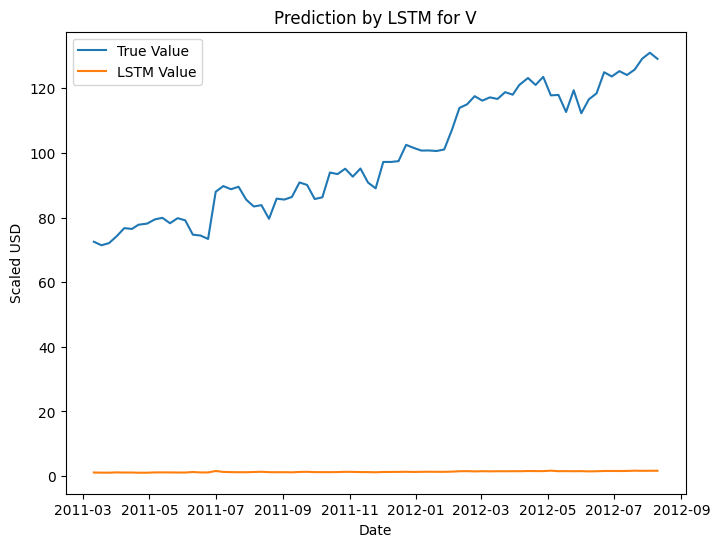

Mean Absolute Error (MAE): 97.62302057577769
Mean Squared Error (MSE): 9848.317895599697
Root Mean Squared Error (RMSE): 99.23869152502817
R-squared (R2) Score: -29.387376764612117
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


15/15 [==============================] - 1s 3ms/step - loss: 6810.9678
Epoch 2/10
15/15 [==============================] - 0s 2ms/step - loss: 6805.7534
Epoch 3/10
15/15 [==============================] - 0s 3ms/step - loss: 6799.0991
Epoch 4/10
15/15 [==============================] - 0s 3ms/step - loss: 6789.3413
Epoch 5/10
15/15 [==============================] - 0s 3ms/step - loss: 6773.8154
Epoch 6/10
15/15 [==============================] - 0s 3ms/step - loss: 6748.6123
Epoch 7/10
15/15 [==============================] - 0s 3ms/step - loss: 6705.8979
Epoch 8/10
15/15 [==============================] - 0s 3ms/step - loss: 6629.4126
Epoch 9/10
15/15 [==============================] - 0s 3ms/step - loss: 6500.3208
Epoch 10/10
3/3 [==============================] - 0s 2ms/step


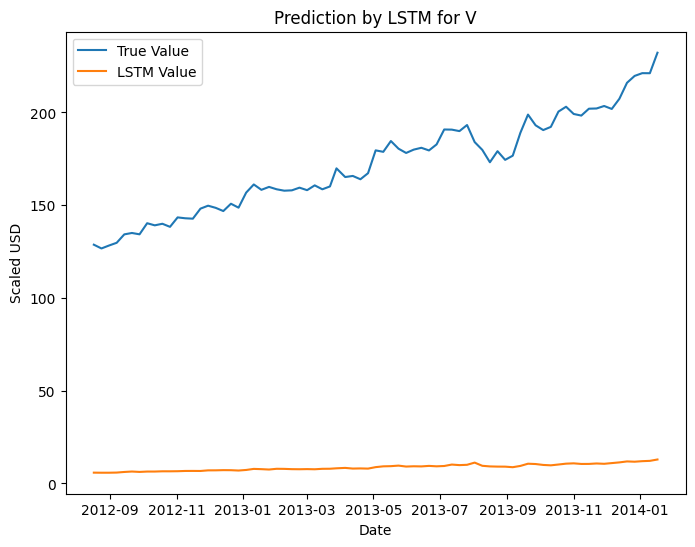

Mean Absolute Error (MAE): 163.13187460047405
Mean Squared Error (MSE): 27185.64117680211
Root Mean Squared Error (RMSE): 164.88068770114378
R-squared (R2) Score: -40.145527062163026
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


19/19 [==============================] - 1s 2ms/step - loss: 12568.6895
Epoch 2/10
19/19 [==============================] - 0s 2ms/step - loss: 12556.4922
Epoch 3/10
19/19 [==============================] - 0s 2ms/step - loss: 12538.2432
Epoch 4/10
19/19 [==============================] - 0s 2ms/step - loss: 12506.9795
Epoch 5/10
19/19 [==============================] - 0s 2ms/step - loss: 12451.7529
Epoch 6/10
19/19 [==============================] - 0s 2ms/step - loss: 12348.8945
Epoch 7/10
19/19 [==============================] - 0s 2ms/step - loss: 12151.5596
Epoch 8/10
19/19 [==============================] - 0s 2ms/step - loss: 11810.0781
Epoch 9/10
19/19 [==============================] - 0s 2ms/step - loss: 11213.4814
Epoch 10/10
3/3 [==============================] - 0s 4ms/step


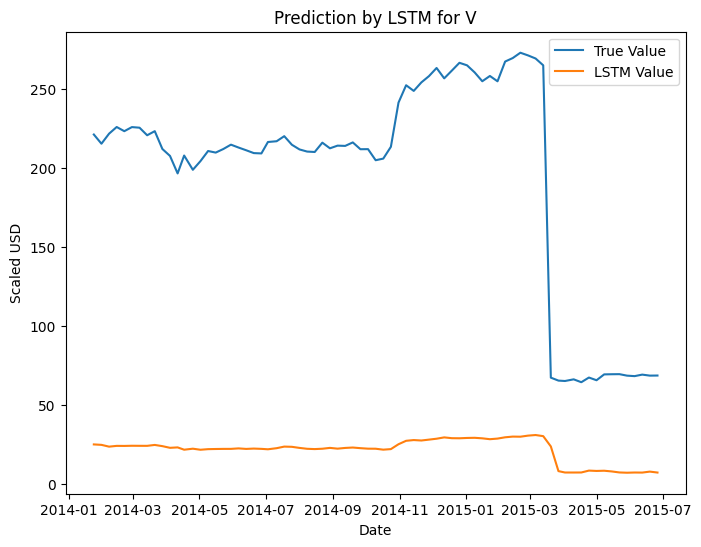

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 175.17885572102864
Mean Squared Error (MSE): 34408.99386597144
Root Mean Squared Error (RMSE): 185.4966141630931
R-squared (R2) Score: -6.456665248369731
Epoch 1/10
24/24 [==============================] - 2s 5ms/step - loss: 18664.7090
Epoch 2/10
24/24 [==============================] - 0s 3ms/step - loss: 18640.2871
Epoch 3/10
24/24 [==============================] - 0s 3ms/step - loss: 18594.6562
Epoch 4/10
24/24 [==============================] - 0s 3ms/step - loss: 18494.6289
Epoch 5/10
24/24 [==============================] - 0s 3ms/step - loss: 18255.1211
Epoch 6/10
24/24 [==============================] - 0s 3ms/step - loss: 17751.4902
Epoch 7/10
24/24 [==============================] - 0s 3ms/step - loss: 16737.5820
Epoch 8/10
24/24 [==============================] - 0s 3ms/step - loss: 15118.1758
Epoch 9/10
24/24 [==============================] - 0s 3ms/step - loss: 12984.4092
Epoch 10/10
3/3 [==============================] - 0s 2ms/step


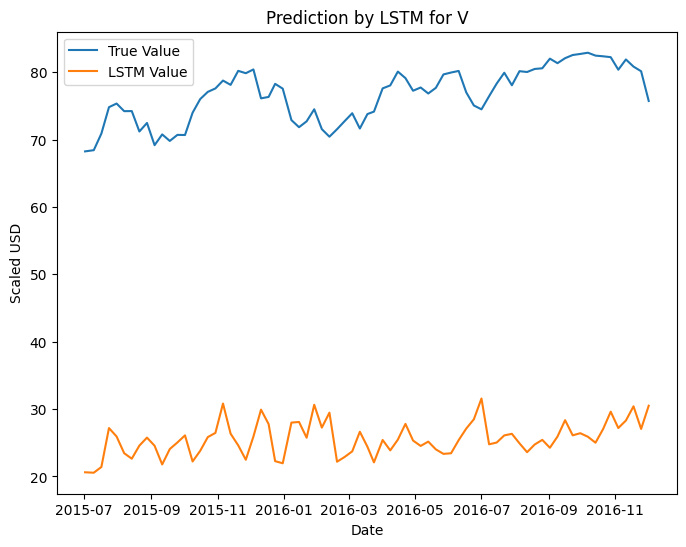

Mean Absolute Error (MAE): 51.02583873697917
Mean Squared Error (MSE): 2621.00003755564
Root Mean Squared Error (RMSE): 51.1957033114659
R-squared (R2) Score: -162.42948102561022
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


29/29 [==============================] - 2s 3ms/step - loss: 16554.2949
Epoch 2/10
29/29 [==============================] - 0s 3ms/step - loss: 16532.6758
Epoch 3/10
29/29 [==============================] - 0s 4ms/step - loss: 16486.0371
Epoch 4/10
29/29 [==============================] - 0s 3ms/step - loss: 16361.9531
Epoch 5/10
29/29 [==============================] - 0s 3ms/step - loss: 16040.2725
Epoch 6/10
29/29 [==============================] - 0s 3ms/step - loss: 15309.6416
Epoch 7/10
29/29 [==============================] - 0s 3ms/step - loss: 13954.1611
Epoch 8/10
29/29 [==============================] - 0s 3ms/step - loss: 11941.3164
Epoch 9/10
29/29 [==============================] - 0s 3ms/step - loss: 9487.9590
Epoch 10/10
3/3 [==============================] - 0s 2ms/step


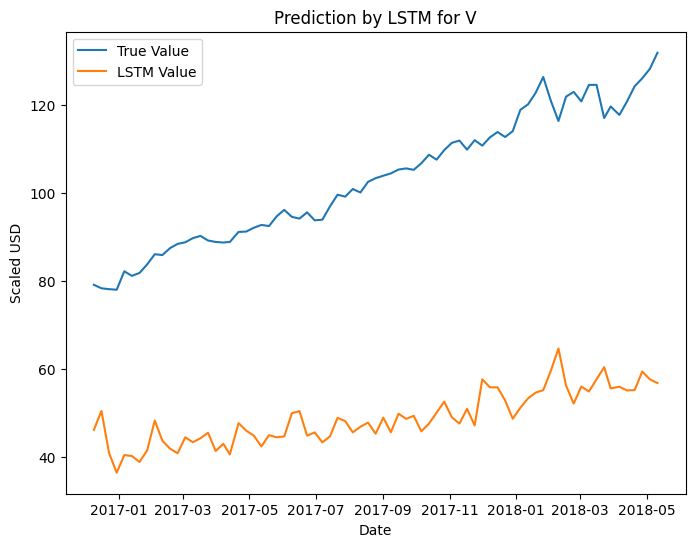

Mean Absolute Error (MAE): 54.173244352213544
Mean Squared Error (MSE): 3036.431807576058
Root Mean Squared Error (RMSE): 55.10382752201573
R-squared (R2) Score: -13.237351409692616
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


34/34 [==============================] - 2s 4ms/step - loss: 15740.7637
Epoch 2/10
34/34 [==============================] - 0s 3ms/step - loss: 15709.0029
Epoch 3/10
34/34 [==============================] - 0s 3ms/step - loss: 15630.9912
Epoch 4/10
34/34 [==============================] - 0s 3ms/step - loss: 15406.3555
Epoch 5/10
34/34 [==============================] - 0s 3ms/step - loss: 14768.5225
Epoch 6/10
34/34 [==============================] - 0s 3ms/step - loss: 13320.9629
Epoch 7/10
34/34 [==============================] - 0s 3ms/step - loss: 10966.4482
Epoch 8/10
34/34 [==============================] - 0s 3ms/step - loss: 8146.2578
Epoch 9/10
34/34 [==============================] - 0s 3ms/step - loss: 5100.7837
Epoch 10/10
3/3 [==============================] - 0s 2ms/step


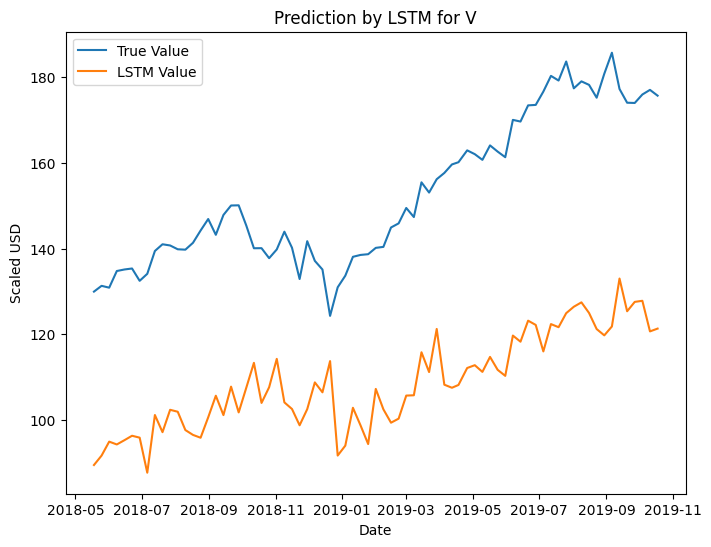

Mean Absolute Error (MAE): 43.98594194742839
Mean Squared Error (MSE): 2018.4480397533878
Root Mean Squared Error (RMSE): 44.92714145985017
R-squared (R2) Score: -5.955042682228888
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


38/38 [==============================] - 2s 3ms/step - loss: 16710.8984
Epoch 2/10
38/38 [==============================] - 0s 3ms/step - loss: 16663.6270
Epoch 3/10
38/38 [==============================] - 0s 3ms/step - loss: 16482.8926
Epoch 4/10
38/38 [==============================] - 0s 3ms/step - loss: 15789.2666
Epoch 5/10
38/38 [==============================] - 0s 3ms/step - loss: 13846.3604
Epoch 6/10
38/38 [==============================] - 0s 3ms/step - loss: 10437.6904
Epoch 7/10
38/38 [==============================] - 0s 3ms/step - loss: 6576.2124
Epoch 8/10
38/38 [==============================] - 0s 3ms/step - loss: 3046.2969
Epoch 9/10
38/38 [==============================] - 0s 3ms/step - loss: 1018.1490
Epoch 10/10
3/3 [==============================] - 0s 3ms/step


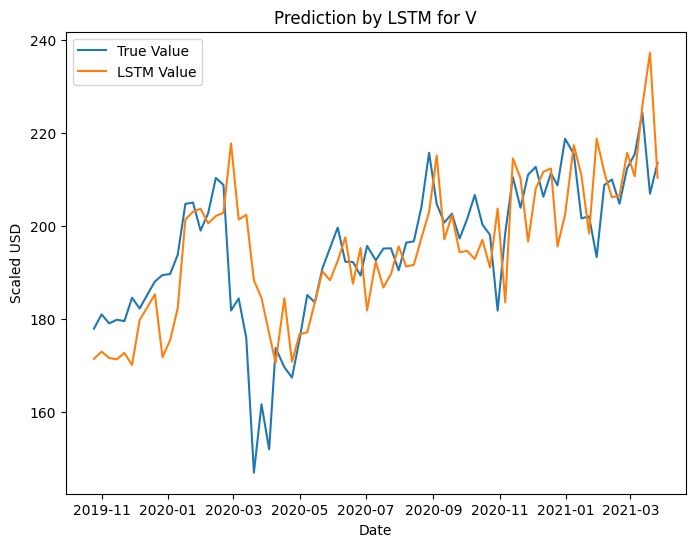

Mean Absolute Error (MAE): 8.865982682291666
Mean Squared Error (MSE): 148.82405527689852
Root Mean Squared Error (RMSE): 12.19934651023974
R-squared (R2) Score: 0.3500366283884394
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


43/43 [==============================] - 2s 4ms/step - loss: 19082.7930
Epoch 2/10
43/43 [==============================] - 0s 3ms/step - loss: 19003.9004
Epoch 3/10
43/43 [==============================] - 0s 3ms/step - loss: 18606.7812
Epoch 4/10
43/43 [==============================] - 0s 3ms/step - loss: 16946.3984
Epoch 5/10
43/43 [==============================] - 0s 3ms/step - loss: 13072.8154
Epoch 6/10
43/43 [==============================] - 0s 3ms/step - loss: 7954.8032
Epoch 7/10
43/43 [==============================] - 0s 3ms/step - loss: 3226.0237
Epoch 8/10
43/43 [==============================] - 0s 3ms/step - loss: 810.1954
Epoch 9/10
43/43 [==============================] - 0s 3ms/step - loss: 309.0089
Epoch 10/10
3/3 [==============================] - 0s 2ms/step


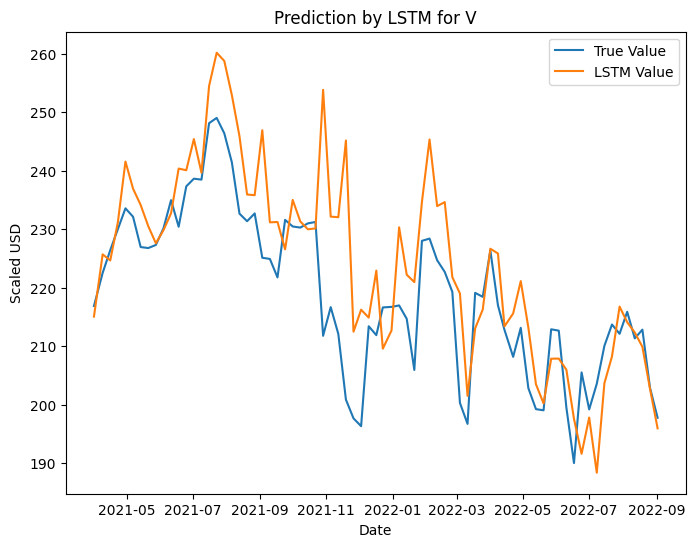

Mean Absolute Error (MAE): 7.762385750325519
Mean Squared Error (MSE): 123.47549538323723
Root Mean Squared Error (RMSE): 11.111952815920217
R-squared (R2) Score: 0.33059204285278077
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


48/48 [==============================] - 2s 3ms/step - loss: 21955.4434
Epoch 2/10
48/48 [==============================] - 0s 3ms/step - loss: 21750.3867
Epoch 3/10
48/48 [==============================] - 0s 3ms/step - loss: 20479.4414
Epoch 4/10
48/48 [==============================] - 0s 3ms/step - loss: 15922.1562
Epoch 5/10
48/48 [==============================] - 0s 3ms/step - loss: 8700.6289
Epoch 6/10
48/48 [==============================] - 0s 3ms/step - loss: 2648.7017
Epoch 7/10
48/48 [==============================] - 0s 3ms/step - loss: 496.4738
Epoch 8/10
48/48 [==============================] - 0s 3ms/step - loss: 286.3564
Epoch 9/10
48/48 [==============================] - 0s 3ms/step - loss: 267.4604
Epoch 10/10
3/3 [==============================] - 0s 3ms/step


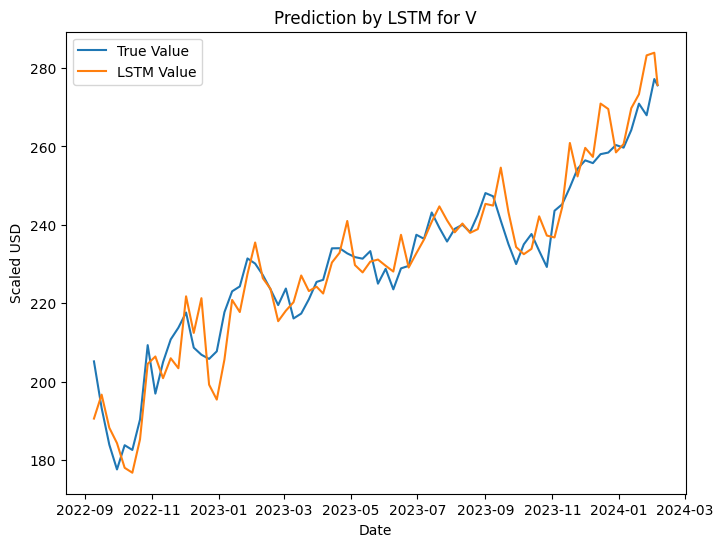

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\1389442127.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Mean Absolute Error (MAE): 5.1113908121744815
Mean Squared Error (MSE): 40.989009878893754
Root Mean Squared Error (RMSE): 6.402265995637307
R-squared (R2) Score: 0.9126271516388517


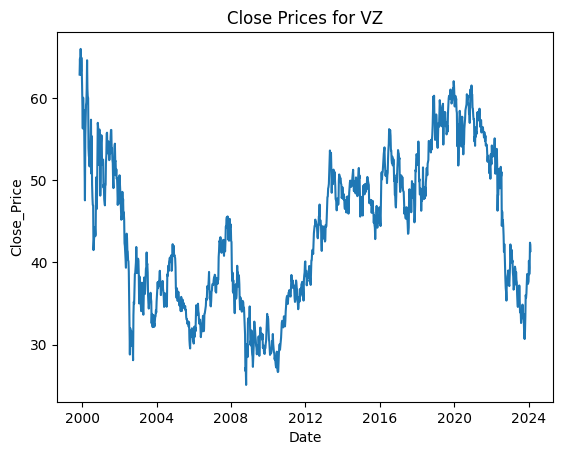

Epoch 1/10
8/8 [==============================] - 2s 3ms/step - loss: 2835.1897
Epoch 2/10
8/8 [==============================] - 0s 3ms/step - loss: 2832.0781
Epoch 3/10
8/8 [==============================] - 0s 3ms/step - loss: 2828.4392
Epoch 4/10
8/8 [==============================] - 0s 3ms/step - loss: 2823.9739
Epoch 5/10
8/8 [==============================] - 0s 3ms/step - loss: 2818.3652
Epoch 6/10
8/8 [==============================] - 0s 3ms/step - loss: 2810.3103
Epoch 7/10
8/8 [==============================] - 0s 3ms/step - loss: 2799.1370
Epoch 8/10
8/8 [==============================] - 0s 3ms/step - loss: 2783.8630
Epoch 9/10
8/8 [==============================] - 0s 3ms/step - loss: 2762.8142
Epoch 10/10
4/4 [==============================] - 0s 2ms/step


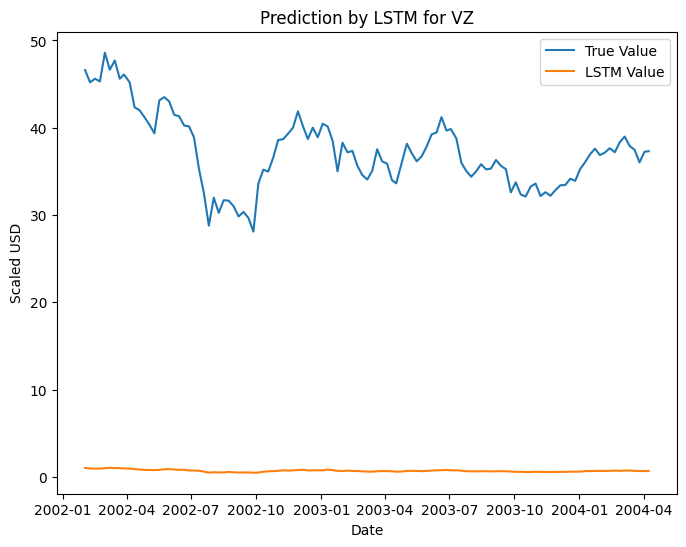

Mean Absolute Error (MAE): 36.57170588530665
Mean Squared Error (MSE): 1354.632798516357
Root Mean Squared Error (RMSE): 36.80533654942388
R-squared (R2) Score: -73.50421361405067
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


15/15 [==============================] - 2s 3ms/step - loss: 2122.6870
Epoch 2/10
15/15 [==============================] - 0s 3ms/step - loss: 2118.6660
Epoch 3/10
15/15 [==============================] - 0s 3ms/step - loss: 2112.7864
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 2103.3733
Epoch 5/10
15/15 [==============================] - 0s 5ms/step - loss: 2087.4282
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 2057.7268
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 2006.2435
Epoch 8/10
15/15 [==============================] - 0s 4ms/step - loss: 1912.7693
Epoch 9/10
15/15 [==============================] - 0s 3ms/step - loss: 1762.9846
Epoch 10/10
4/4 [==============================] - 0s 4ms/step


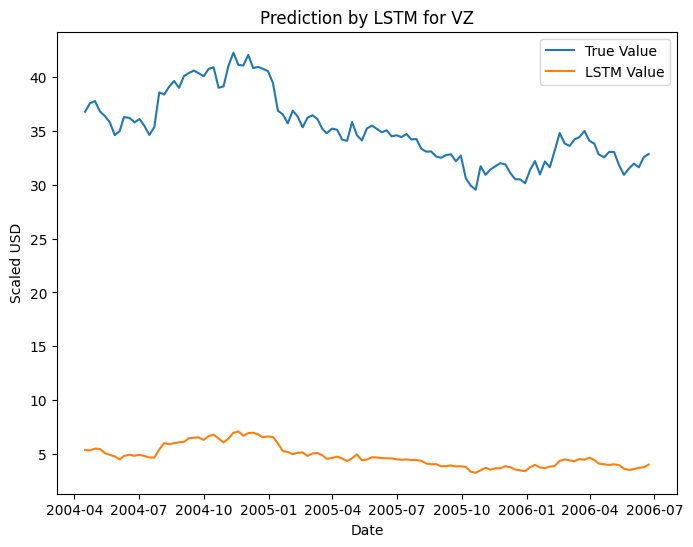

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 30.331495288931805
Mean Squared Error (MSE): 924.7776997737659
Root Mean Squared Error (RMSE): 30.410157838685514
R-squared (R2) Score: -91.12489325374503
Epoch 1/10
22/22 [==============================] - 3s 3ms/step - loss: 1830.6909
Epoch 2/10
22/22 [==============================] - 0s 3ms/step - loss: 1825.3512
Epoch 3/10
22/22 [==============================] - 0s 3ms/step - loss: 1816.2290
Epoch 4/10
22/22 [==============================] - 0s 4ms/step - loss: 1798.5061
Epoch 5/10
22/22 [==============================] - 0s 4ms/step - loss: 1761.2511
Epoch 6/10
22/22 [==============================] - 0s 3ms/step - loss: 1680.2097
Epoch 7/10
22/22 [==============================] - 0s 3ms/step - loss: 1515.6597
Epoch 8/10
22/22 [==============================] - 0s 3ms/step - loss: 1218.8265
Epoch 9/10
22/22 [==============================] - 0s 3ms/step - loss: 822.2692
Epoch 10/10
4/4 [==============================] - 0s 5ms/step


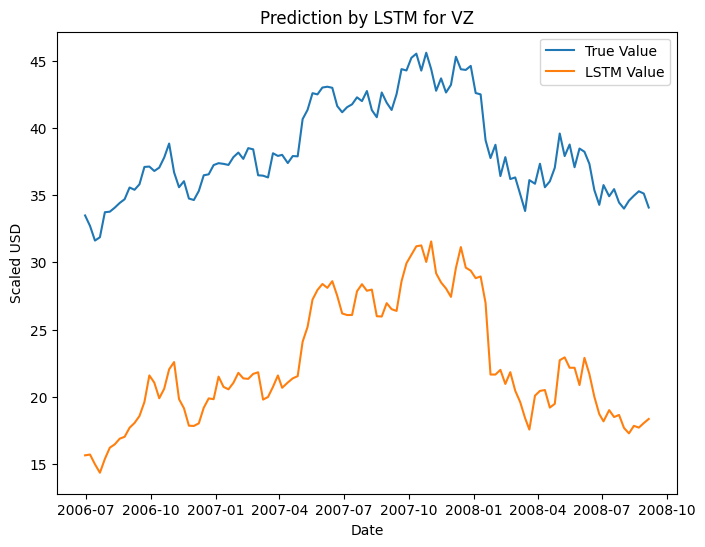

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 15.957279695593792
Mean Squared Error (MSE): 256.37013196377677
Root Mean Squared Error (RMSE): 16.011562446050565
R-squared (R2) Score: -19.76000861680896
Epoch 1/10
29/29 [==============================] - 3s 3ms/step - loss: 1743.5334
Epoch 2/10
29/29 [==============================] - 0s 3ms/step - loss: 1732.9508
Epoch 3/10
29/29 [==============================] - 0s 4ms/step - loss: 1707.8215
Epoch 4/10
29/29 [==============================] - 0s 5ms/step - loss: 1641.3574
Epoch 5/10
29/29 [==============================] - 0s 3ms/step - loss: 1468.7783
Epoch 6/10
29/29 [==============================] - 0s 3ms/step - loss: 1087.4662
Epoch 7/10
29/29 [==============================] - 0s 3ms/step - loss: 541.2731
Epoch 8/10
29/29 [==============================] - 0s 3ms/step - loss: 148.4207
Epoch 9/10
29/29 [==============================] - 0s 3ms/step - loss: 73.0176
Epoch 10/10
4/4 [==============================] - 0s 4ms/step


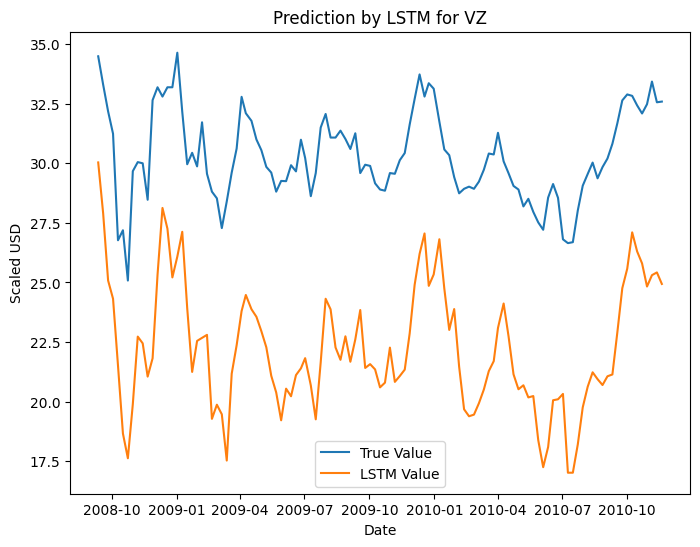

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8.07631892793075
Mean Squared Error (MSE): 67.06909378092637
Root Mean Squared Error (RMSE): 8.189572258727948
R-squared (R2) Score: -18.24779483668719
Epoch 1/10
36/36 [==============================] - 2s 3ms/step - loss: 1579.5776
Epoch 2/10
36/36 [==============================] - 0s 3ms/step - loss: 1569.5303
Epoch 3/10
36/36 [==============================] - 0s 3ms/step - loss: 1539.6028
Epoch 4/10
36/36 [==============================] - 0s 3ms/step - loss: 1432.2430
Epoch 5/10
36/36 [==============================] - 0s 3ms/step - loss: 1089.0942
Epoch 6/10
36/36 [==============================] - 0s 3ms/step - loss: 476.9591
Epoch 7/10
36/36 [==============================] - 0s 3ms/step - loss: 76.6300
Epoch 8/10
36/36 [==============================] - 0s 3ms/step - loss: 66.7746
Epoch 9/10
36/36 [==============================] - 0s 3ms/step - loss: 56.4759
Epoch 10/10
4/4 [==============================] - 0s 5ms/step


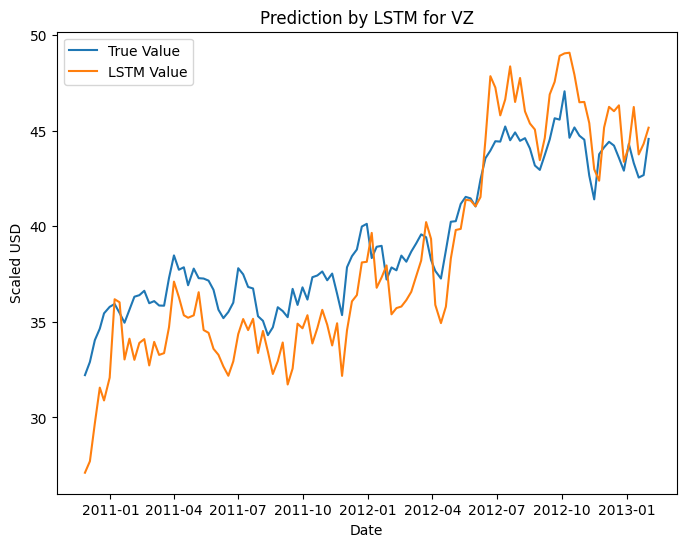

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 2.118623977661133
Mean Squared Error (MSE): 5.676134875695453
Root Mean Squared Error (RMSE): 2.3824640345019805
R-squared (R2) Score: 0.5610300229481747
Epoch 1/10
44/44 [==============================] - 3s 4ms/step - loss: 1573.7833
Epoch 2/10
44/44 [==============================] - 0s 3ms/step - loss: 1554.9457
Epoch 3/10
44/44 [==============================] - 0s 3ms/step - loss: 1475.4548
Epoch 4/10
44/44 [==============================] - 0s 3ms/step - loss: 1145.1539
Epoch 5/10
44/44 [==============================] - 0s 3ms/step - loss: 447.4131
Epoch 6/10
44/44 [==============================] - 0s 3ms/step - loss: 58.4019
Epoch 7/10
44/44 [==============================] - 0s 3ms/step - loss: 62.7753
Epoch 8/10
44/44 [==============================] - 0s 3ms/step - loss: 51.0585
Epoch 9/10
44/44 [==============================] - 0s 3ms/step - loss: 43.7888
Epoch 10/10
4/4 [==============================] - 0s 5ms/step


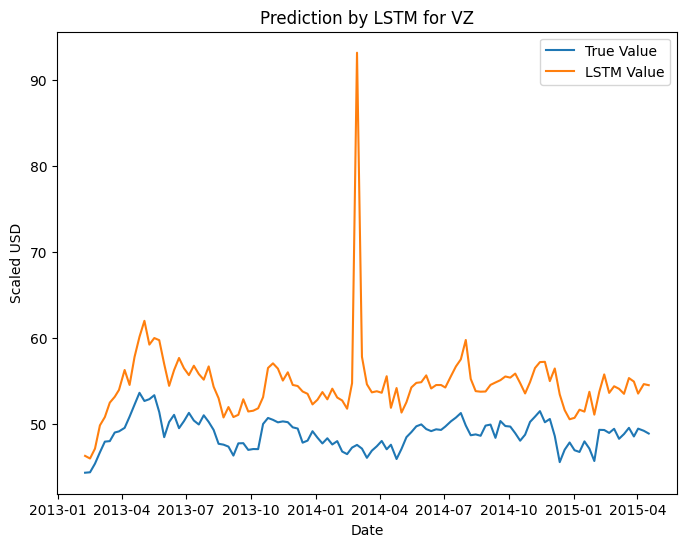

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 5.771535955014435
Mean Squared Error (MSE): 49.626847889034195
Root Mean Squared Error (RMSE): 7.044632558837558
R-squared (R2) Score: -15.261729009738314
Epoch 1/10
51/51 [==============================] - 4s 4ms/step - loss: 1689.2976
Epoch 2/10
51/51 [==============================] - 0s 3ms/step - loss: 1666.9858
Epoch 3/10
51/51 [==============================] - 0s 3ms/step - loss: 1535.7593
Epoch 4/10
51/51 [==============================] - 0s 4ms/step - loss: 1013.8230
Epoch 5/10
51/51 [==============================] - 0s 3ms/step - loss: 280.0314
Epoch 6/10
51/51 [==============================] - 0s 3ms/step - loss: 65.9998
Epoch 7/10
51/51 [==============================] - 0s 3ms/step - loss: 60.8165
Epoch 8/10
51/51 [==============================] - 0s 3ms/step - loss: 56.6400
Epoch 9/10
51/51 [==============================] - 0s 4ms/step - loss: 51.9297
Epoch 10/10
4/4 [==============================] - 0s 3ms/step


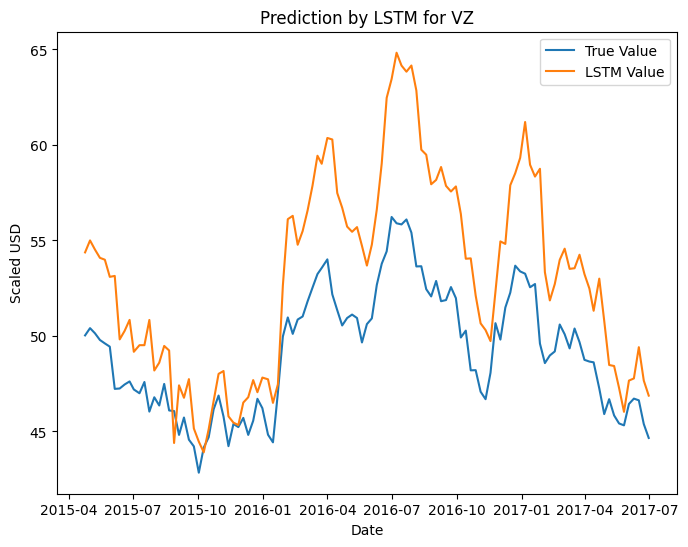

Mean Absolute Error (MAE): 3.962938533617103
Mean Squared Error (MSE): 20.640767089218595
Root Mean Squared Error (RMSE): 4.5432110989055525
R-squared (R2) Score: -1.0356113599772279
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


58/58 [==============================] - 3s 4ms/step - loss: 1776.0684
Epoch 2/10
58/58 [==============================] - 0s 3ms/step - loss: 1685.9216
Epoch 3/10
58/58 [==============================] - 0s 3ms/step - loss: 1112.0981
Epoch 4/10
58/58 [==============================] - 0s 3ms/step - loss: 195.7650
Epoch 5/10
58/58 [==============================] - 0s 4ms/step - loss: 74.1220
Epoch 6/10
58/58 [==============================] - 0s 4ms/step - loss: 65.7862
Epoch 7/10
58/58 [==============================] - 0s 4ms/step - loss: 56.2480
Epoch 8/10
58/58 [==============================] - 0s 4ms/step - loss: 46.8613
Epoch 9/10
58/58 [==============================] - 0s 3ms/step - loss: 39.3679
Epoch 10/10
4/4 [==============================] - 0s 5ms/step


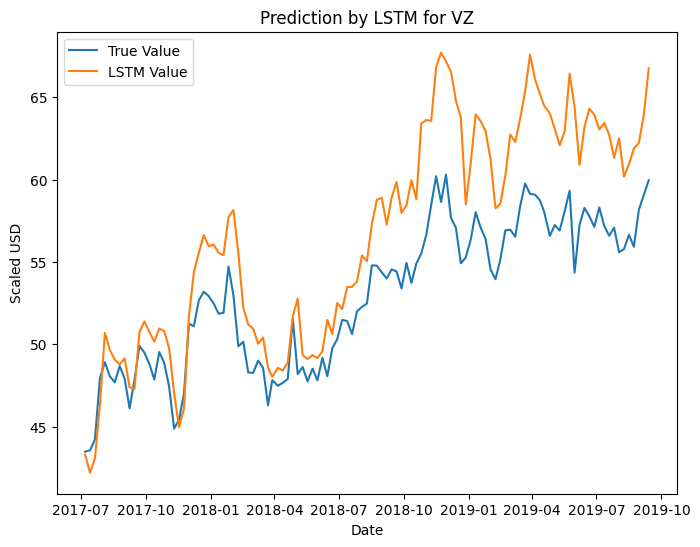

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 3.8054474155591884
Mean Squared Error (MSE): 20.257613697319826
Root Mean Squared Error (RMSE): 4.500845886866137
R-squared (R2) Score: -0.052834105588512204
Epoch 1/10
65/65 [==============================] - 3s 3ms/step - loss: 1892.2758
Epoch 2/10
65/65 [==============================] - 0s 3ms/step - loss: 1809.6464
Epoch 3/10
65/65 [==============================] - 0s 3ms/step - loss: 1204.5475
Epoch 4/10
65/65 [==============================] - 0s 3ms/step - loss: 238.0501
Epoch 5/10
65/65 [==============================] - 0s 3ms/step - loss: 77.5791
Epoch 6/10
65/65 [==============================] - 0s 3ms/step - loss: 68.7061
Epoch 7/10
65/65 [==============================] - 0s 3ms/step - loss: 60.1257
Epoch 8/10
65/65 [==============================] - 0s 3ms/step - loss: 50.9949
Epoch 9/10
65/65 [==============================] - 0s 3ms/step - loss: 45.8259
Epoch 10/10
4/4 [==============================] - 0s 4ms/step


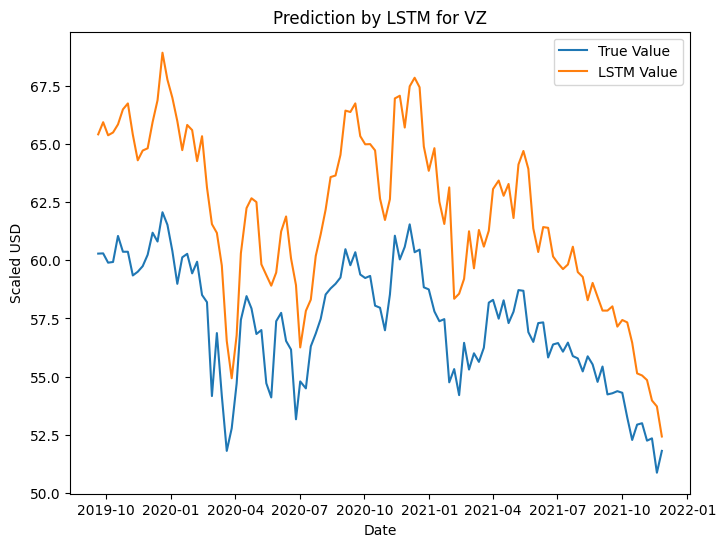

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 4.654292477815048
Mean Squared Error (MSE): 23.947042032352023
Root Mean Squared Error (RMSE): 4.893571500688635
R-squared (R2) Score: -2.617198746309383
Epoch 1/10
72/72 [==============================] - 3s 3ms/step - loss: 2015.6946
Epoch 2/10
72/72 [==============================] - 0s 3ms/step - loss: 1625.0557
Epoch 3/10
72/72 [==============================] - 0s 3ms/step - loss: 395.5096
Epoch 4/10
72/72 [==============================] - 0s 4ms/step - loss: 88.8583
Epoch 5/10
72/72 [==============================] - 0s 3ms/step - loss: 77.3455
Epoch 6/10
72/72 [==============================] - 0s 3ms/step - loss: 64.4959
Epoch 7/10
72/72 [==============================] - 0s 3ms/step - loss: 52.4001
Epoch 8/10
72/72 [==============================] - 0s 3ms/step - loss: 42.8929
Epoch 9/10
72/72 [==============================] - 0s 3ms/step - loss: 34.7152
Epoch 10/10
4/4 [==============================] - 0s 4ms/step


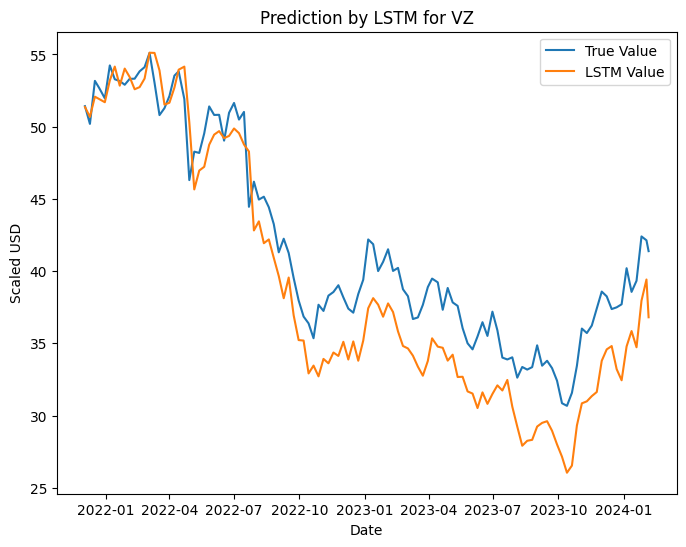

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\1389442127.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


Mean Absolute Error (MAE): 3.086130044688349
Mean Squared Error (MSE): 12.083324018534125
Root Mean Squared Error (RMSE): 3.4761075959374623
R-squared (R2) Score: 0.7539299857367314


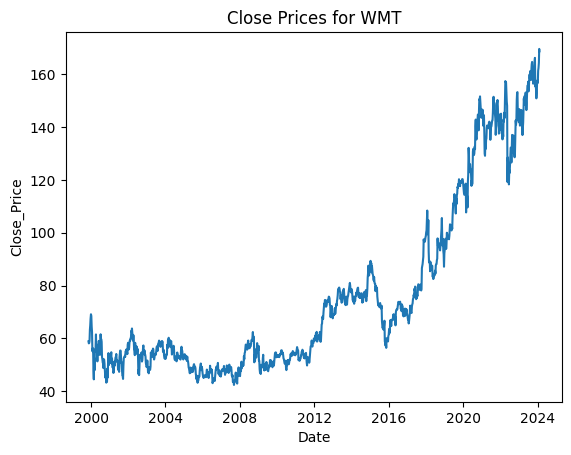

Epoch 1/10
8/8 [==============================] - 3s 3ms/step - loss: 2879.0334
Epoch 2/10
8/8 [==============================] - 0s 3ms/step - loss: 2876.9680
Epoch 3/10
8/8 [==============================] - 0s 3ms/step - loss: 2874.5730
Epoch 4/10
8/8 [==============================] - 0s 3ms/step - loss: 2871.7163
Epoch 5/10
8/8 [==============================] - 0s 3ms/step - loss: 2868.2585
Epoch 6/10
8/8 [==============================] - 0s 3ms/step - loss: 2864.0874
Epoch 7/10
8/8 [==============================] - 0s 3ms/step - loss: 2858.6714
Epoch 8/10
8/8 [==============================] - 0s 3ms/step - loss: 2851.7629
Epoch 9/10
8/8 [==============================] - 0s 3ms/step - loss: 2843.0393
Epoch 10/10
4/4 [==============================] - 0s 4ms/step


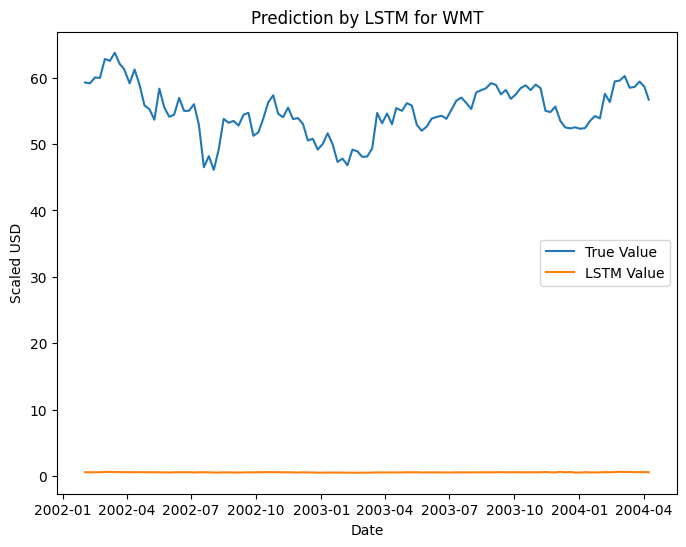

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 54.42423005149676
Mean Squared Error (MSE): 2976.0168823684976
Root Mean Squared Error (RMSE): 54.55288152213866
R-squared (R2) Score: -209.1433830754856
Epoch 1/10
15/15 [==============================] - 3s 4ms/step - loss: 2956.1270
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 2952.6653
Epoch 3/10
15/15 [==============================] - 0s 3ms/step - loss: 2948.1167
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 2941.4758
Epoch 5/10
15/15 [==============================] - 0s 3ms/step - loss: 2931.1855
Epoch 6/10
15/15 [==============================] - 0s 3ms/step - loss: 2914.3604
Epoch 7/10
15/15 [==============================] - 0s 3ms/step - loss: 2886.3818
Epoch 8/10
15/15 [==============================] - 0s 3ms/step - loss: 2839.6831
Epoch 9/10
15/15 [==============================] - 0s 3ms/step - loss: 2759.0872
Epoch 10/10
4/4 [==============================] - 0s 5ms/step


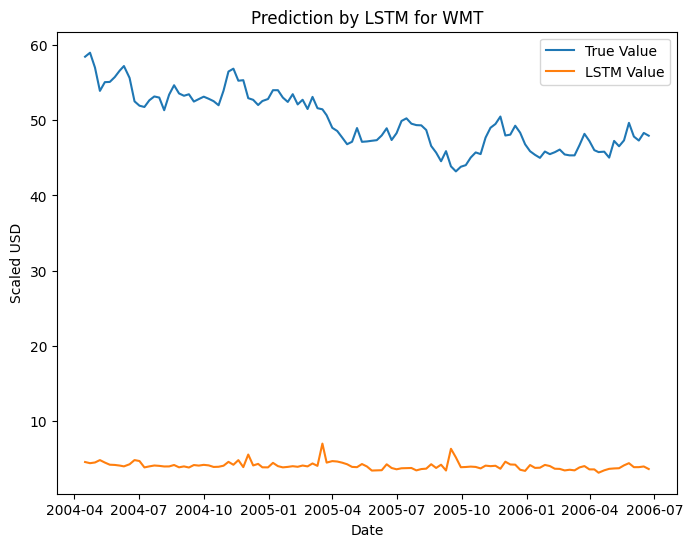

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 45.876485779969585
Mean Squared Error (MSE): 2117.896526543629
Root Mean Squared Error (RMSE): 46.02060980195318
R-squared (R2) Score: -150.77405715238407
Epoch 1/10
22/22 [==============================] - 3s 3ms/step - loss: 2806.8469
Epoch 2/10
22/22 [==============================] - 0s 3ms/step - loss: 2801.6194
Epoch 3/10
22/22 [==============================] - 0s 3ms/step - loss: 2793.0962
Epoch 4/10
22/22 [==============================] - 0s 3ms/step - loss: 2776.4304
Epoch 5/10
22/22 [==============================] - 0s 3ms/step - loss: 2742.7891
Epoch 6/10
22/22 [==============================] - 0s 3ms/step - loss: 2667.6411
Epoch 7/10
22/22 [==============================] - 0s 3ms/step - loss: 2514.0845
Epoch 8/10
22/22 [==============================] - 0s 3ms/step - loss: 2221.0105
Epoch 9/10
22/22 [==============================] - 0s 3ms/step - loss: 1766.4061
Epoch 10/10
4/4 [==============================] - 0s 3ms/step


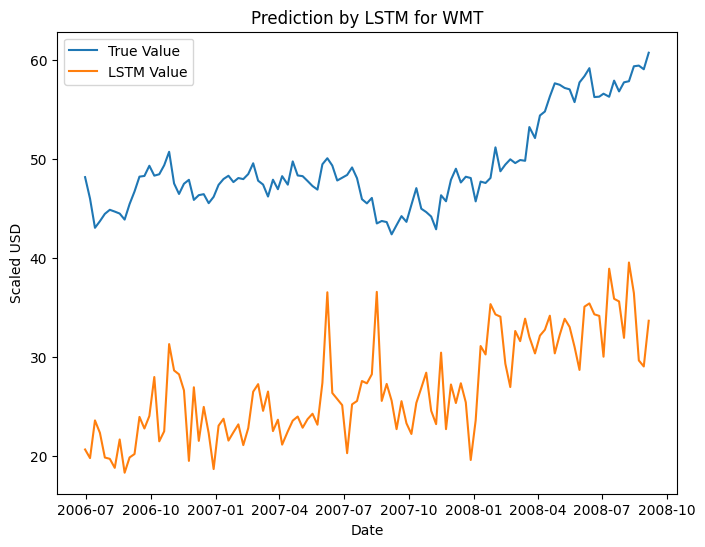

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 22.32583645895253
Mean Squared Error (MSE): 513.7975695295085
Root Mean Squared Error (RMSE): 22.667103245221
R-squared (R2) Score: -23.63864704232816
Epoch 1/10
29/29 [==============================] - 3s 3ms/step - loss: 2715.1223
Epoch 2/10
29/29 [==============================] - 0s 3ms/step - loss: 2706.1519
Epoch 3/10
29/29 [==============================] - 0s 4ms/step - loss: 2684.2830
Epoch 4/10
29/29 [==============================] - 0s 3ms/step - loss: 2619.5007
Epoch 5/10
29/29 [==============================] - 0s 3ms/step - loss: 2425.6174
Epoch 6/10
29/29 [==============================] - 0s 3ms/step - loss: 1948.0587
Epoch 7/10
29/29 [==============================] - 0s 3ms/step - loss: 1187.6176
Epoch 8/10
29/29 [==============================] - 0s 3ms/step - loss: 484.4432
Epoch 9/10
29/29 [==============================] - 0s 3ms/step - loss: 142.0065
Epoch 10/10
4/4 [==============================] - 0s 3ms/step


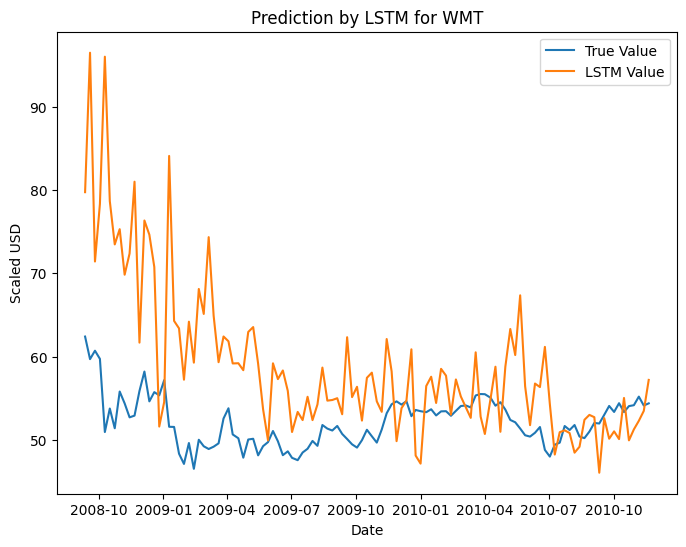

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 8.056510153065556
Mean Squared Error (MSE): 127.40706016478637
Root Mean Squared Error (RMSE): 11.28747359530849
R-squared (R2) Score: -14.338867762800009
Epoch 1/10
36/36 [==============================] - 2s 3ms/step - loss: 2717.0869
Epoch 2/10
36/36 [==============================] - 0s 2ms/step - loss: 2706.5591
Epoch 3/10
36/36 [==============================] - 0s 2ms/step - loss: 2675.5322
Epoch 4/10
36/36 [==============================] - 0s 3ms/step - loss: 2568.8384
Epoch 5/10
36/36 [==============================] - 0s 3ms/step - loss: 2243.2686
Epoch 6/10
36/36 [==============================] - 0s 3ms/step - loss: 1578.7380
Epoch 7/10
36/36 [==============================] - 0s 3ms/step - loss: 803.6877
Epoch 8/10
36/36 [==============================] - 0s 3ms/step - loss: 294.8500
Epoch 9/10
36/36 [==============================] - 0s 3ms/step - loss: 108.4791
Epoch 10/10
4/4 [==============================] - 0s 5ms/step


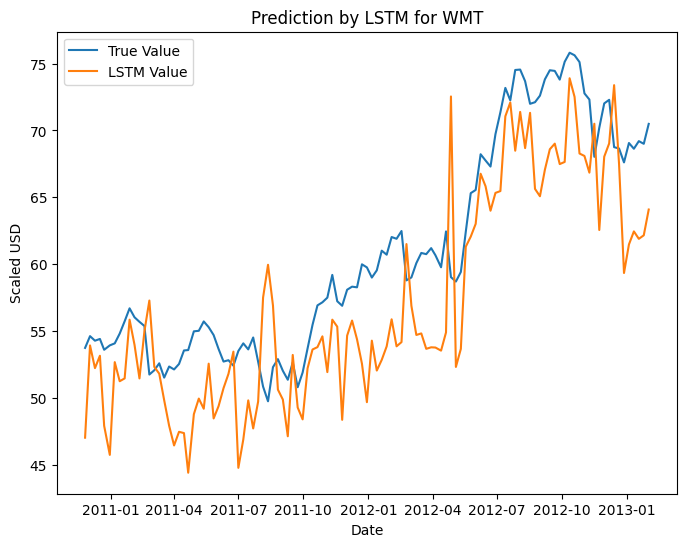

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 4.674752324643342
Mean Squared Error (MSE): 28.73380023380771
Root Mean Squared Error (RMSE): 5.360391798535598
R-squared (R2) Score: 0.5355207334418315
Epoch 1/10
44/44 [==============================] - 3s 3ms/step - loss: 2888.6160
Epoch 2/10
44/44 [==============================] - 0s 3ms/step - loss: 2860.4775
Epoch 3/10
44/44 [==============================] - 0s 3ms/step - loss: 2744.2937
Epoch 4/10
44/44 [==============================] - 0s 3ms/step - loss: 2280.8235
Epoch 5/10
44/44 [==============================] - 0s 3ms/step - loss: 1220.9865
Epoch 6/10
44/44 [==============================] - 0s 3ms/step - loss: 323.1700
Epoch 7/10
44/44 [==============================] - 0s 3ms/step - loss: 108.9254
Epoch 8/10
44/44 [==============================] - 0s 3ms/step - loss: 80.8769
Epoch 9/10
44/44 [==============================] - 0s 3ms/step - loss: 76.8475
Epoch 10/10
4/4 [==============================] - 0s 5ms/step


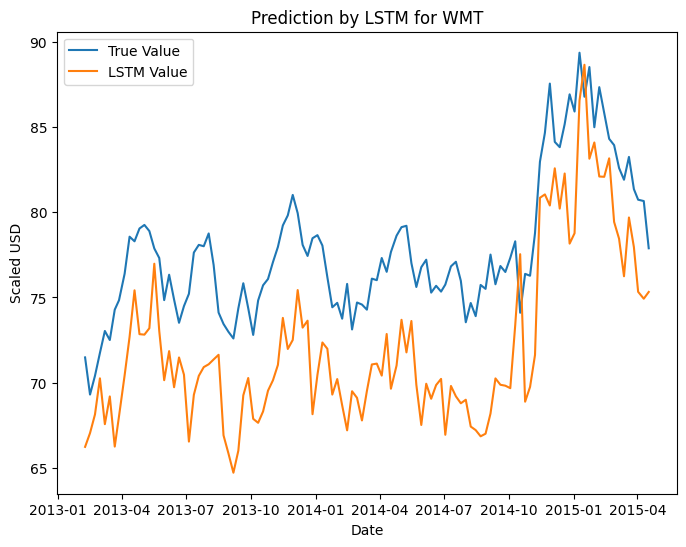

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 5.615219686756964
Mean Squared Error (MSE): 35.89048900409028
Root Mean Squared Error (RMSE): 5.990867132902404
R-squared (R2) Score: -1.174275009294901
Epoch 1/10
51/51 [==============================] - 3s 3ms/step - loss: 3335.1660
Epoch 2/10
51/51 [==============================] - 0s 3ms/step - loss: 3274.1653
Epoch 3/10
51/51 [==============================] - 0s 3ms/step - loss: 2917.0835
Epoch 4/10
51/51 [==============================] - 0s 3ms/step - loss: 1733.0419
Epoch 5/10
51/51 [==============================] - 0s 3ms/step - loss: 459.0697
Epoch 6/10
51/51 [==============================] - 0s 3ms/step - loss: 105.2039
Epoch 7/10
51/51 [==============================] - 0s 3ms/step - loss: 87.9603
Epoch 8/10
51/51 [==============================] - 0s 4ms/step - loss: 80.3302
Epoch 9/10
51/51 [==============================] - 0s 4ms/step - loss: 73.4145
Epoch 10/10
4/4 [==============================] - 0s 3ms/step


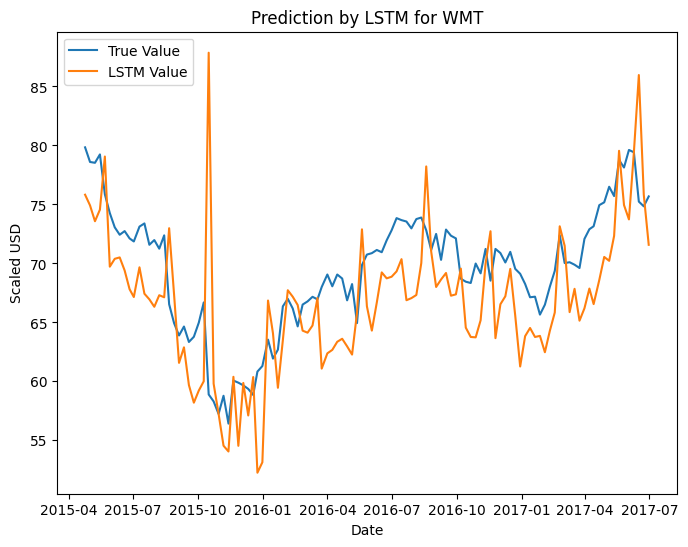

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Mean Absolute Error (MAE): 4.075065019690473
Mean Squared Error (MSE): 26.27355325431266
Root Mean Squared Error (RMSE): 5.125773429865259
R-squared (R2) Score: 0.04150391649395202
Epoch 1/10
58/58 [==============================] - 3s 4ms/step - loss: 3518.2812
Epoch 2/10
58/58 [==============================] - 0s 3ms/step - loss: 3404.2385
Epoch 3/10
58/58 [==============================] - 0s 3ms/step - loss: 2677.6919
Epoch 4/10
58/58 [==============================] - 0s 4ms/step - loss: 959.2922
Epoch 5/10
58/58 [==============================] - 0s 3ms/step - loss: 140.5421
Epoch 6/10
58/58 [==============================] - 0s 4ms/step - loss: 95.8680
Epoch 7/10
58/58 [==============================] - 0s 3ms/step - loss: 85.4071
Epoch 8/10
58/58 [==============================] - 0s 3ms/step - loss: 81.2444
Epoch 9/10
58/58 [==============================] - 0s 3ms/step - loss: 74.8320
Epoch 10/10
4/4 [==============================] - 0s 3ms/step


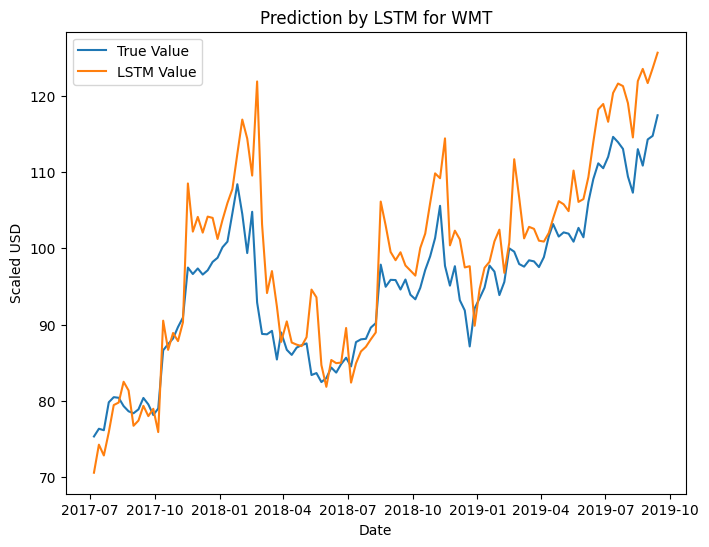

Mean Absolute Error (MAE): 4.885721204674762
Mean Squared Error (MSE): 41.470702052964306
Root Mean Squared Error (RMSE): 6.43977500018163
R-squared (R2) Score: 0.5894820494750752
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


65/65 [==============================] - 3s 3ms/step - loss: 4133.0791
Epoch 2/10
65/65 [==============================] - 0s 3ms/step - loss: 4006.4270
Epoch 3/10
65/65 [==============================] - 0s 3ms/step - loss: 3164.4082
Epoch 4/10
65/65 [==============================] - 0s 3ms/step - loss: 1259.0076
Epoch 5/10
65/65 [==============================] - 0s 3ms/step - loss: 173.4955
Epoch 6/10
65/65 [==============================] - 0s 3ms/step - loss: 96.4188
Epoch 7/10
65/65 [==============================] - 0s 3ms/step - loss: 77.1268
Epoch 8/10
65/65 [==============================] - 0s 3ms/step - loss: 72.1943
Epoch 9/10
65/65 [==============================] - 0s 3ms/step - loss: 69.8480
Epoch 10/10
4/4 [==============================] - 0s 2ms/step


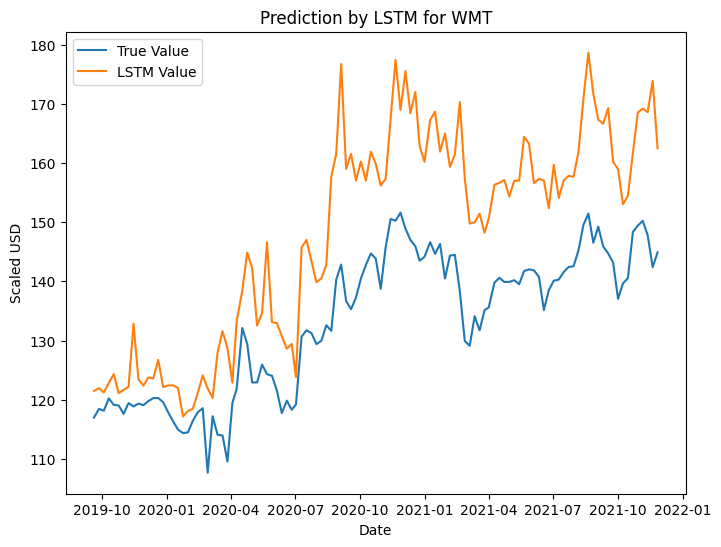

Mean Absolute Error (MAE): 14.80885046917459
Mean Squared Error (MSE): 276.0330620515243
Root Mean Squared Error (RMSE): 16.61424274685802
R-squared (R2) Score: -0.9298313510450729
Epoch 1/10


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


72/72 [==============================] - 2s 3ms/step - loss: 5488.1001
Epoch 2/10
72/72 [==============================] - 0s 3ms/step - loss: 5234.9663
Epoch 3/10
72/72 [==============================] - 0s 3ms/step - loss: 4057.6533
Epoch 4/10
72/72 [==============================] - 0s 4ms/step - loss: 1813.0862
Epoch 5/10
72/72 [==============================] - 0s 3ms/step - loss: 322.9509
Epoch 6/10
72/72 [==============================] - 0s 3ms/step - loss: 108.2614
Epoch 7/10
72/72 [==============================] - 0s 3ms/step - loss: 104.5011
Epoch 8/10
72/72 [==============================] - 0s 3ms/step - loss: 95.8783
Epoch 9/10
72/72 [==============================] - 0s 3ms/step - loss: 90.0408
Epoch 10/10
4/4 [==============================] - 0s 2ms/step


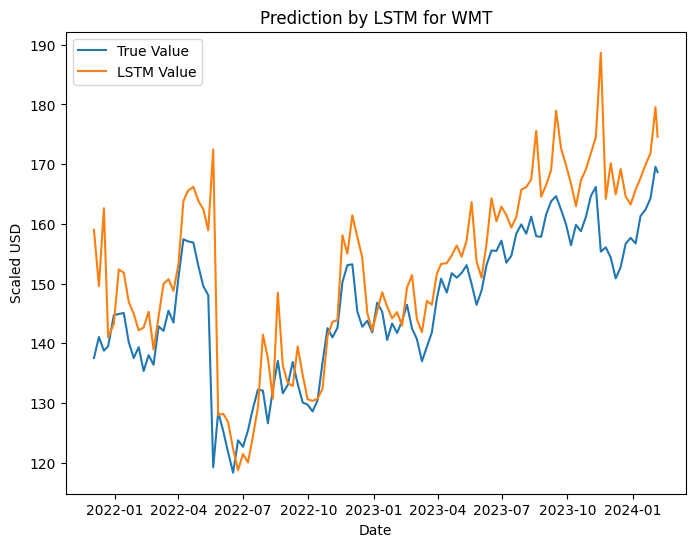

Mean Absolute Error (MAE): 6.945944219174592
Mean Squared Error (MSE): 91.91460949031321
Root Mean Squared Error (RMSE): 9.587210725248152
R-squared (R2) Score: 0.34054302718003215


c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Evelyn\AppData\Local\Temp\ipykernel_30508\1389442127.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


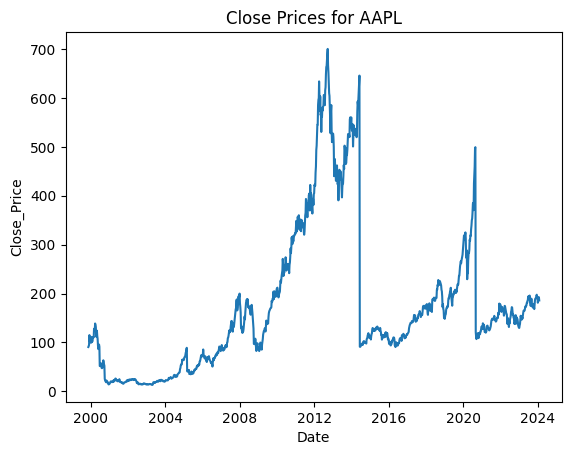

Epoch 1/10
1/8 [==>...........................] - ETA: 12s - loss: 10728.6982

KeyboardInterrupt: 

In [95]:



from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


selected_tickers = ['SBUX','V','VZ','WMT','AAPL', 'ADBE', 'AMZN', 'BAC', 'CRM', 'COST', 'GOOGL', 'JPM', 'NVDA']
for symbol in selected_tickers:
  
    symbol_df = clean_df[clean_df['Ticker'] == symbol]

    symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])

   
    plt.plot(symbol_df['Date'], symbol_df['Close_Price'])
    plt.xlabel('Date')
    plt.ylabel('Close_Price')
    plt.title(f'Close Prices for {symbol}')
    plt.show()

    output = symbol_df['Close_Price']
    features = ['Open_Price', 'High_Price', 'Low_Price', 'Volume']

 
    scaler = MinMaxScaler()
    feature_transform = scaler.fit_transform(symbol_df[features])
    feature_transform = pd.DataFrame(columns=features, data=feature_transform, index=symbol_df.index)

  
    timesplit= TimeSeriesSplit(n_splits=10)
    for train_index, test_index in timesplit.split(feature_transform):
        X_train, X_test = feature_transform[:len(train_index)], feature_transform[len(train_index): (len(train_index)+len(test_index))]
        y_train, y_test = output[:len(train_index)].values.ravel(), output[len(train_index): (len(train_index)+len(test_index))].values.ravel()

     
        trainX = np.array(X_train)
        testX = np.array(X_test)
        X_train = trainX.reshape(X_train.shape[0], 1, X_train.shape[1])
        X_test = testX.reshape(X_test.shape[0], 1, X_test.shape[1])

        # Building the LSTM Model with adjusted architecture and dropout
        lstm = Sequential()
        lstm.add(LSTM(64, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=True))
        lstm.add(Dropout(0.2))  # Adding dropout layer
        lstm.add(LSTM(32, input_shape=(1, trainX.shape[1]), activation='relu', return_sequences=False))
        lstm.add(Dense(1))
        lstm.compile(loss='mean_squared_error', optimizer='adam')

        history = lstm.fit(X_train, y_train, epochs=10, batch_size=16, verbose=1, shuffle=False)

        y_pred = lstm.predict(X_test)

        plt.figure(figsize=(8, 6))
        plt.plot(symbol_df['Date'].iloc[test_index], y_test, label='True Value')
        plt.plot(symbol_df['Date'].iloc[test_index], y_pred, label='LSTM Value')
        plt.title(f'Prediction by LSTM for {symbol}')
        plt.xlabel('Date')
        plt.ylabel('Scaled USD')
        plt.legend()
        plt.show()

        
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        r2 = r2_score(y_test, y_pred)

        print("Mean Absolute Error (MAE):", mae)
        print("Mean Squared Error (MSE):", mse)
        print("Root Mean Squared Error (RMSE):", rmse)
        print("R-squared (R2) Score:", r2)


                







ARIMA MODEL

Arima shows poor performance, therefore cannot use it for stock price prediction

C:\Users\Evelyn\AppData\Local\Temp\ipykernel_14328\2393503194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


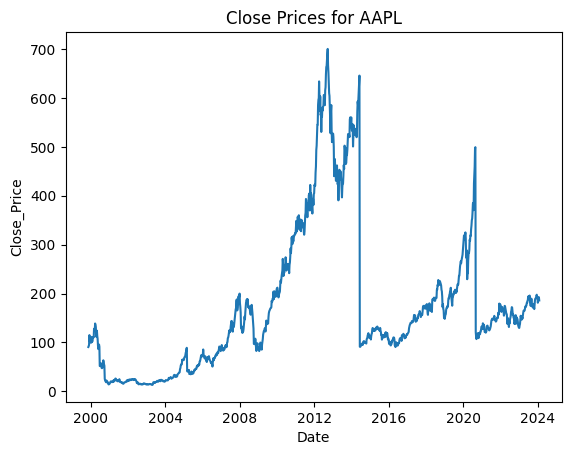

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.

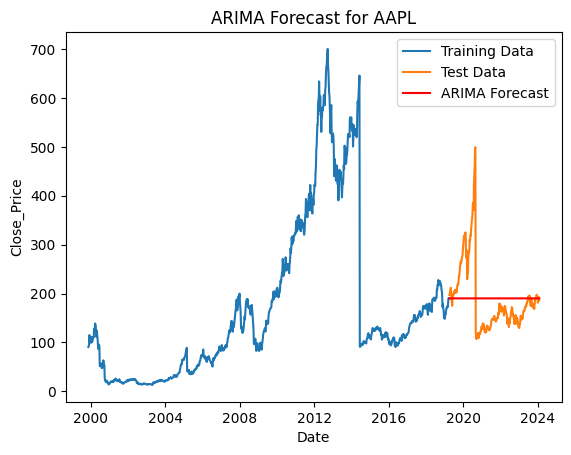

Mean Absolute Error (MAE): 51.06739168572891
Mean Squared Error (MSE): 5029.074956779642
Root Mean Squared Error (RMSE): 70.91597109805126
R-squared (R2) Score: -0.0004720982330748136
*************************************


C:\Users\Evelyn\AppData\Local\Temp\ipykernel_14328\2393503194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


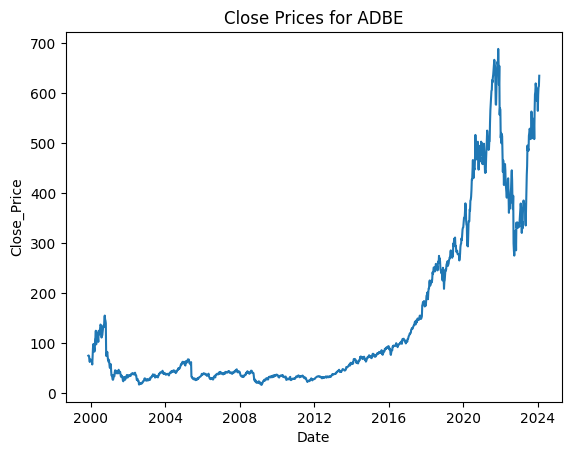

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.

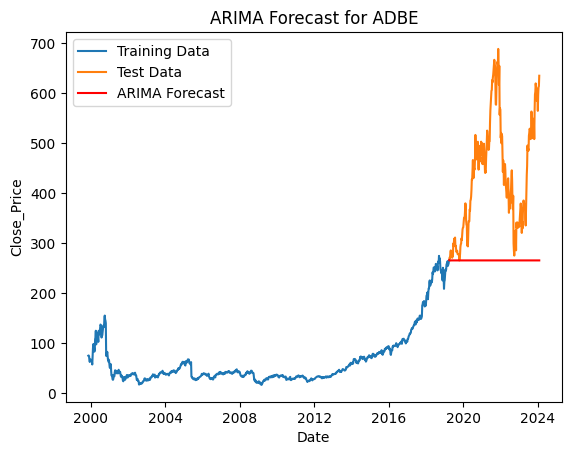

Mean Absolute Error (MAE): 170.43641811340726
Mean Squared Error (MSE): 41682.21934802436
Root Mean Squared Error (RMSE): 204.16223781107112
R-squared (R2) Score: -2.299336786351691
*************************************


C:\Users\Evelyn\AppData\Local\Temp\ipykernel_14328\2393503194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


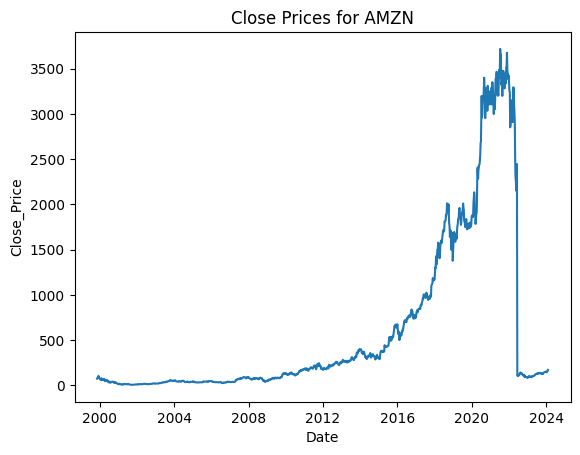

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.

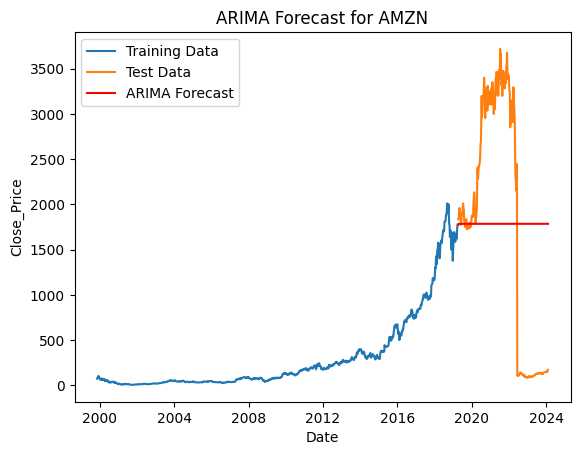

Mean Absolute Error (MAE): 1181.8016162405459
Mean Squared Error (MSE): 1796883.9629832238
Root Mean Squared Error (RMSE): 1340.479005051263
R-squared (R2) Score: -0.0005994162419888927
*************************************


C:\Users\Evelyn\AppData\Local\Temp\ipykernel_14328\2393503194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


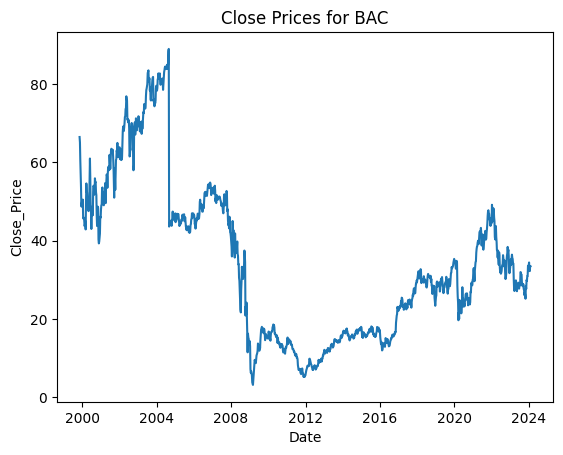

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.

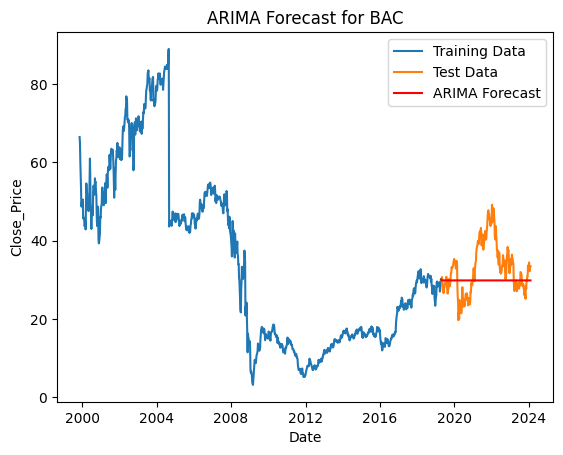

Mean Absolute Error (MAE): 5.542280132795764
Mean Squared Error (MSE): 52.3191203840123
Root Mean Squared Error (RMSE): 7.2331957241604
R-squared (R2) Score: -0.2325780433092559
*************************************


C:\Users\Evelyn\AppData\Local\Temp\ipykernel_14328\2393503194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


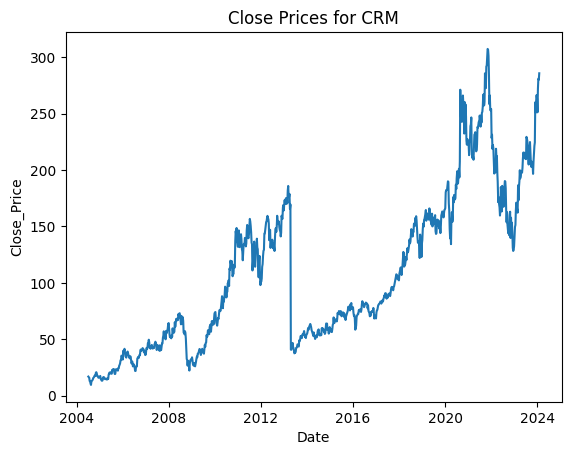

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.

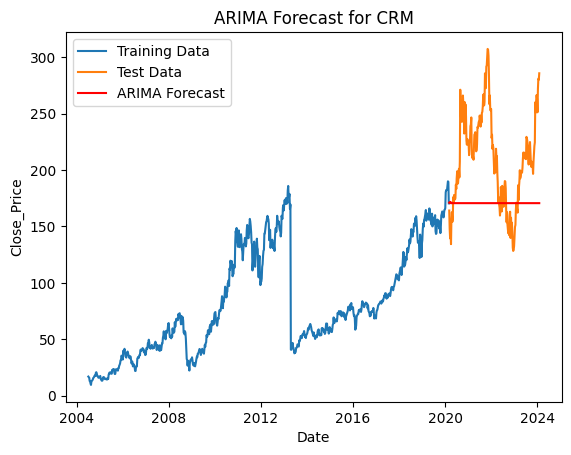

Mean Absolute Error (MAE): 46.66417676279234
Mean Squared Error (MSE): 3238.4830959948317
Root Mean Squared Error (RMSE): 56.90767167961479
R-squared (R2) Score: -0.9223929039536765
*************************************


C:\Users\Evelyn\AppData\Local\Temp\ipykernel_14328\2393503194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


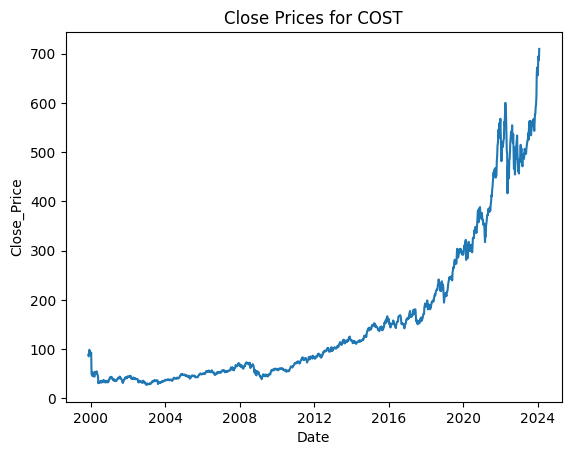

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.

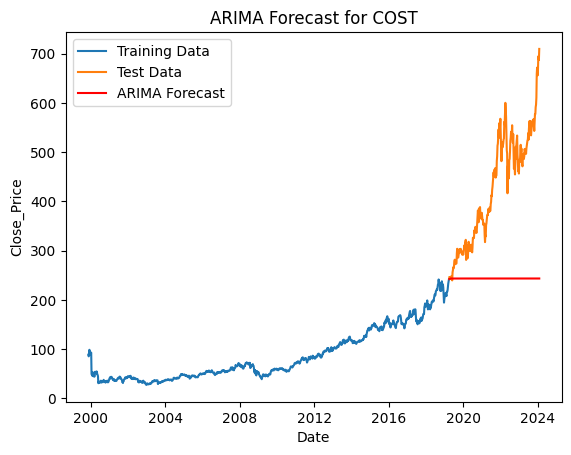

Mean Absolute Error (MAE): 183.42212121852373
Mean Squared Error (MSE): 46264.99982806093
Root Mean Squared Error (RMSE): 215.0930027408166
R-squared (R2) Score: -2.660649641182281
*************************************


C:\Users\Evelyn\AppData\Local\Temp\ipykernel_14328\2393503194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


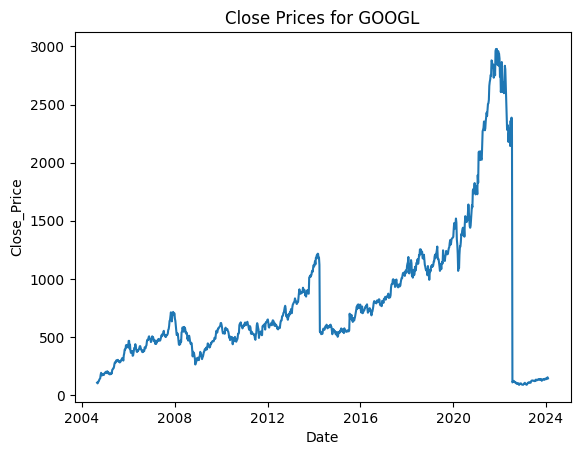

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.

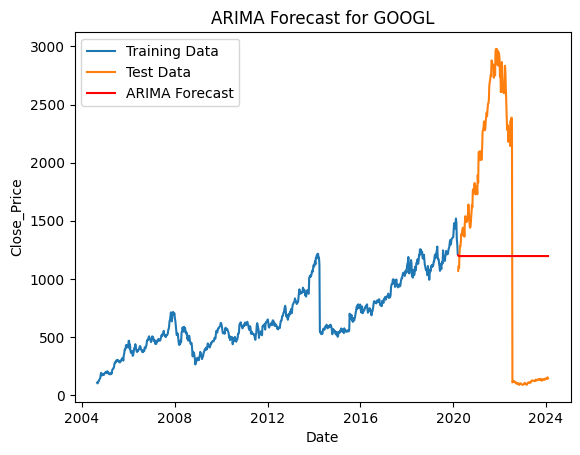

Mean Absolute Error (MAE): 1009.5144133904697
Mean Squared Error (MSE): 1199779.8374615724
Root Mean Squared Error (RMSE): 1095.3446204102033
R-squared (R2) Score: -0.017668612869511824
*************************************


C:\Users\Evelyn\AppData\Local\Temp\ipykernel_14328\2393503194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


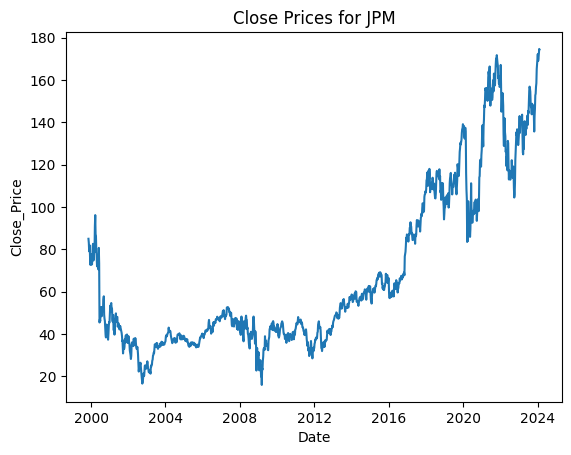

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.

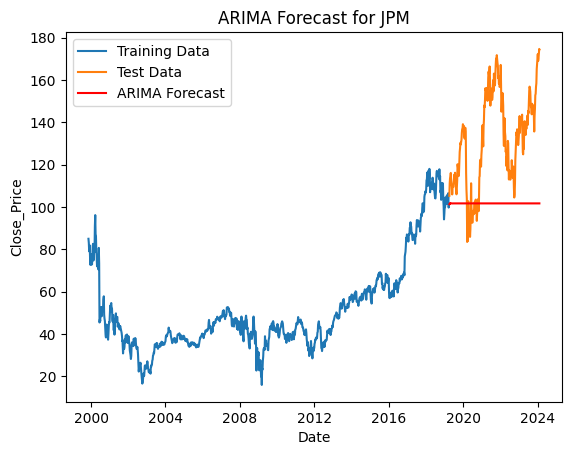

Mean Absolute Error (MAE): 31.86678340430892
Mean Squared Error (MSE): 1420.7695215528643
Root Mean Squared Error (RMSE): 37.69309647074467
R-squared (R2) Score: -1.870015602512606
*************************************


C:\Users\Evelyn\AppData\Local\Temp\ipykernel_14328\2393503194.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])


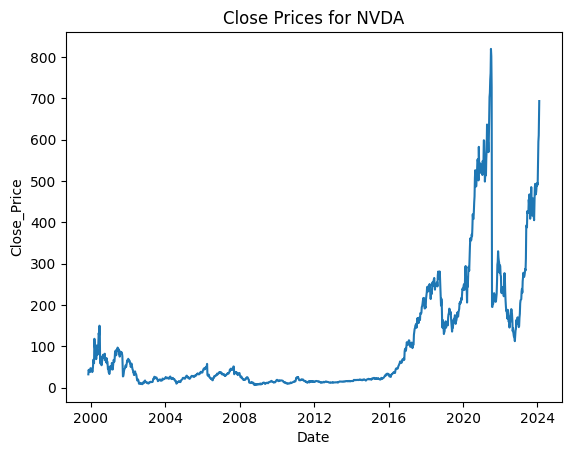

c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\Evelyn\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.

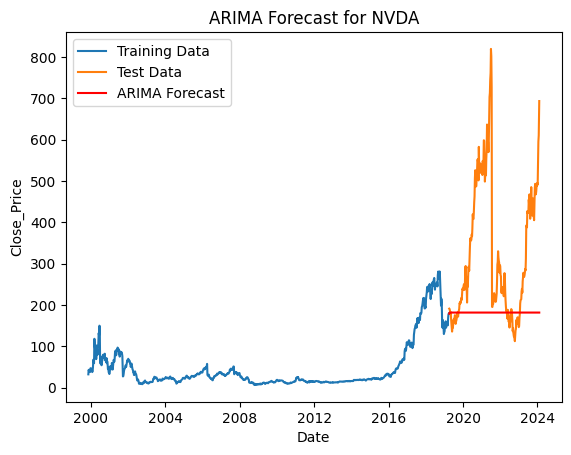

Mean Absolute Error (MAE): 156.89790129653088
Mean Squared Error (MSE): 48277.56086737988
Root Mean Squared Error (RMSE): 219.72155303333327
R-squared (R2) Score: -0.7979632301068271
*************************************


In [ ]:
from statsmodels.tsa.arima.model import ARIMA

selected_tickers = ['AAPL', 'ADBE', 'AMZN', 'BAC', 'CRM', 'COST', 'GOOGL', 'JPM', 'NVDA']

for symbol in selected_tickers:
    # Filter DataFrame for the desired symbol
    symbol_df = clean_df[clean_df['Ticker'] == symbol]

    # Convert 'Date' column to datetime format
    symbol_df['Date'] = pd.to_datetime(symbol_df['Date'])
    symbol_df.set_index('Date', inplace=True)

    # Plot closing prices with correct date labels
    plt.plot(symbol_df.index, symbol_df['Close_Price'])
    plt.xlabel('Date')
    plt.ylabel('Close_Price')
    plt.title(f'Close Prices for {symbol}')
    plt.show()

    # Splitting data into training and testing sets
    train_size = int(len(symbol_df) * 0.8)
    train_data, test_data = symbol_df.iloc[:train_size], symbol_df.iloc[train_size:]

    # Train ARIMA model
    model = ARIMA(train_data['Close_Price'], order=(5,1,0)) # Example order, you may need to tune this
    arima_model = model.fit()

    # Predict using ARIMA model
    forecast = arima_model.forecast(steps=len(test_data))
    forecast_index = test_data.index

    # Plot actual vs. predicted
    plt.plot(train_data.index, train_data['Close_Price'], label='Training Data')
    plt.plot(test_data.index, test_data['Close_Price'], label='Test Data')
    plt.plot(forecast_index, forecast, label='ARIMA Forecast', color='red')
    plt.xlabel('Date')
    plt.ylabel('Close_Price')
    plt.title(f'ARIMA Forecast for {symbol}')
    plt.legend()
    plt.show()

    # Evaluate ARIMA model
    mae = mean_absolute_error(test_data['Close_Price'], forecast)
    mse = mean_squared_error(test_data['Close_Price'], forecast)
    rmse = np.sqrt(mse)
    r2 = r2_score(test_data['Close_Price'], forecast)

    print("Mean Absolute Error (MAE):", mae)
    print("Mean Squared Error (MSE):", mse)
    print("Root Mean Squared Error (RMSE):", rmse)
    print("R-squared (R2) Score:", r2)
    print("*************************************")
